<a href="https://colab.research.google.com/github/a-memoir/Automated-Medical-Report-NNH/blob/main/10sep.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip -q install pymupdf pillow imagehash pandas tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 50.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 23.9 MB/s eta 0:00:00


In [4]:
from pathlib import Path

IMAGE_ROOT = Path("/content/drive/MyDrive/ImageLocal/ImageLocal")
PDF_ROOT   = Path("/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày")

OUTPUT_DIR = Path("/content/drive/MyDrive/NoiSoi_Matching")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print("Images:", IMAGE_ROOT)
print("PDFs:", PDF_ROOT)
print("Output:", OUTPUT_DIR)

Images: /content/drive/MyDrive/ImageLocal/ImageLocal
PDFs: /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày
Output: /content/drive/MyDrive/NoiSoi_Matching


In [ ]:
# ============================================================
# CELL 32 — CONCLUSION LABEL AUDIT (LIGHT VERSION)
# ============================================================

import os
import re
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_FILE = os.path.join(
    BASE,
    "dataset_v1_cases.csv"
)

cases = pd.read_csv(
    CASES_FILE,
    low_memory=False
)

# ------------------------------------------------------------
# CLEAN
# ------------------------------------------------------------

cases["ket_luan_clean"] = (
    cases["ket_luan"]
    .fillna("")
    .astype(str)
    .str.replace(r"\s+", " ", regex=True)
    .str.strip()
)

nonempty = cases[
    cases["ket_luan_clean"] != ""
].copy()

# ------------------------------------------------------------
# SURFACE NORMALIZATION ONLY
# Does NOT change clinical meaning
# ------------------------------------------------------------

def surface_normalize(x):

    x = x.upper().strip()

    x = re.sub(r"\s+", " ", x)

    # punctuation spacing
    x = re.sub(r"\s*\.\s*", ".", x)
    x = re.sub(r"\s*,\s*", ", ", x)
    x = re.sub(r"\s*\+\s*", " + ", x)
    x = re.sub(r"\s*-\s*", " - ", x)

    # trailing period
    x = re.sub(r"\.+$", "", x).strip()

    return x


nonempty["normalized"] = (
    nonempty["ket_luan_clean"]
    .apply(surface_normalize)
)

# ------------------------------------------------------------
# BASIC RESULT
# ------------------------------------------------------------

raw_unique = nonempty["ket_luan_clean"].nunique()
normalized_unique = nonempty["normalized"].nunique()

print("=" * 70)
print("CONCLUSION LABEL AUDIT")
print("=" * 70)

print("Total cases:", len(cases))
print("Non-empty conclusions:", len(nonempty))
print("Raw unique conclusions:", raw_unique)
print("Normalized unique conclusions:", normalized_unique)
print(
    "Reduction:",
    raw_unique - normalized_unique
)

# ------------------------------------------------------------
# VARIANT GROUPS
# ------------------------------------------------------------

variant_df = (
    nonempty
    .groupby("normalized")
    .agg(
        num_cases=("ket_luan_clean", "size"),
        num_variants=("ket_luan_clean", "nunique")
    )
    .reset_index()
)

variant_df = variant_df[
    variant_df["num_variants"] > 1
].sort_values(
    ["num_variants", "num_cases"],
    ascending=[False, False]
)

print("\n" + "=" * 70)
print("MULTIPLE TEXT VARIANTS")
print("=" * 70)

print(
    "Normalized groups with multiple raw variants:",
    len(variant_df)
)

display(
    variant_df.head(30)
)

# ------------------------------------------------------------
# COMMON TERMS
# ------------------------------------------------------------

terms = [
    "VIÊM MŨI",
    "VIÊM MŨI XOANG",
    "VIÊM HỌNG",
    "VIÊM ỐNG",
    "VA",
    "POLYP",
    "A-MI-ĐAN",
    "CHẢY MÁU",
    "DỊ VẬT",
    "RÁY",
    "TRÀO NGƯỢC",
]

rows = []

for term in terms:

    mask = nonempty["ket_luan_clean"].str.contains(
        term,
        case=False,
        regex=False,
        na=False
    )

    rows.append({
        "term": term,
        "cases": int(mask.sum()),
        "percentage": round(
            mask.mean() * 100,
            2
        )
    })

term_df = pd.DataFrame(rows)

print("\n" + "=" * 70)
print("COMMON CLINICAL TERMS")
print("=" * 70)

display(term_df)

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

OUTPUT = os.path.join(
    BASE,
    "conclusion_label_fragmentation_audit.csv"
)

variant_df.to_csv(
    OUTPUT,
    index=False
)

print("\nSaved:")
print(OUTPUT)

CONCLUSION LABEL AUDIT
Total cases: 7607
Non-empty conclusions: 7606
Raw unique conclusions: 762
Normalized unique conclusions: 701
Reduction: 61

MULTIPLE TEXT VARIANTS
Normalized groups with multiple raw variants: 47


,normalized,num_cases,num_variants
316,VIÊM MŨI + VA,209,4
552,VIÊM MŨI XOANG MẠN - POLYP MŨI,150,4
416,VIÊM MŨI MẠN + VA,125,4
486,VIÊM MŨI XOANG + VA,65,4
413,VIÊM MŨI MẠN,773,3
549,VIÊM MŨI XOANG MẠN (ĐÃ PT),84,3
324,VIÊM MŨI + VIÊM VA,57,3
423,VIÊM MŨI MẠN + VIÊM VA,29,3
62,HIỆN KHÔNG THẤY DỊ VẬT TRÊN NỘI SOI,10,3
134,HÓC XƯƠNG CÁ N2 (ĐÃ LẤY),7,3



COMMON CLINICAL TERMS


,term,cases,percentage
0,VIÊM MŨI,4137,54.39
1,VIÊM MŨI XOANG,1189,15.63
2,VIÊM HỌNG,497,6.53
3,VIÊM ỐNG,966,12.70
4,VA,845,11.11
5,POLYP,250,3.29
6,A-MI-ĐAN,162,2.13
7,CHẢY MÁU,306,4.02
8,DỊ VẬT,58,0.76
9,RÁY,178,2.34



Saved:
/content/drive/MyDrive/NoiSoi_Matching/conclusion_label_fragmentation_audit.csv


In [ ]:
# ============================================================
# CELL 33 — REPORT QUALITY AUDIT
# ============================================================

import os
import re
import pandas as pd
import numpy as np

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_FILE = os.path.join(
    BASE,
    "dataset_v1_cases.csv"
)

cases = pd.read_csv(
    CASES_FILE,
    low_memory=False
)

# ------------------------------------------------------------
# CLEAN TEXT HELPER
# ------------------------------------------------------------

FIELDS = [
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
]

for col in FIELDS:

    if col in cases.columns:

        cases[col + "_clean"] = (
            cases[col]
            .fillna("")
            .astype(str)
            .str.replace(r"\s+", " ", regex=True)
            .str.strip()
        )

# ------------------------------------------------------------
# SECTION PRESENCE
# ------------------------------------------------------------

section_fields = [
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
]

print("=" * 70)
print("REPORT QUALITY AUDIT")
print("=" * 70)

print("Total cases:", len(cases))

print("\n" + "=" * 70)
print("SECTION PRESENCE")
print("=" * 70)

section_stats = []

for col in section_fields:

    clean_col = col + "_clean"

    present = (
        cases[clean_col] != ""
    )

    section_stats.append({
        "section": col,
        "cases": int(present.sum()),
        "percentage": round(
            present.mean() * 100,
            2
        )
    })

section_stats = pd.DataFrame(section_stats)

display(section_stats)

# ------------------------------------------------------------
# NUMBER OF ANATOMICAL SECTIONS PER CASE
# ------------------------------------------------------------

presence_matrix = pd.DataFrame({
    col: cases[col + "_clean"] != ""
    for col in section_fields
})

cases["num_anatomical_sections"] = (
    presence_matrix.sum(axis=1)
)

print("\n" + "=" * 70)
print("ANATOMICAL SECTION COUNT")
print("=" * 70)

print(
    cases["num_anatomical_sections"]
    .value_counts()
    .sort_index()
)

# ------------------------------------------------------------
# SECTION PATTERNS
# ------------------------------------------------------------

def section_pattern(row):

    present = [
        col
        for col in section_fields
        if row[col + "_clean"] != ""
    ]

    return " + ".join(present) if present else "NONE"


cases["section_pattern"] = cases.apply(
    section_pattern,
    axis=1
)

print("\n" + "=" * 70)
print("TOP SECTION PATTERNS")
print("=" * 70)

pattern_counts = (
    cases["section_pattern"]
    .value_counts()
    .reset_index()
)

pattern_counts.columns = [
    "section_pattern",
    "cases"
]

pattern_counts["percentage"] = (
    pattern_counts["cases"]
    / len(cases)
    * 100
)

display(
    pattern_counts.head(30)
)

# ------------------------------------------------------------
# CONCLUSION VS DESCRIPTION
# ------------------------------------------------------------

description_fields = [
    col
    for col in section_fields
    if col + "_clean" in cases.columns
]

has_description = (
    cases[
        [col + "_clean" for col in description_fields]
    ]
    .ne("")
    .any(axis=1)
)

has_conclusion = (
    cases["ket_luan_clean"] != ""
)

print("\n" + "=" * 70)
print("DESCRIPTION / CONCLUSION CONSISTENCY")
print("=" * 70)

print(
    "Has anatomical description:",
    int(has_description.sum())
)

print(
    "Has conclusion:",
    int(has_conclusion.sum())
)

print(
    "Conclusion but NO anatomical description:",
    int(
        (has_conclusion & ~has_description).sum()
    )
)

print(
    "Description but NO conclusion:",
    int(
        (~has_conclusion & has_description).sum()
    )
)

# ------------------------------------------------------------
# CASES WITH CONCLUSION BUT NO DESCRIPTION
# ------------------------------------------------------------

suspicious_1 = cases[
    has_conclusion & ~has_description
].copy()

print("\n" + "=" * 70)
print("CONCLUSION WITHOUT ANATOMICAL DESCRIPTION")
print("=" * 70)

print(
    "Count:",
    len(suspicious_1)
)

if len(suspicious_1):

    display(
        suspicious_1[
            [
                "case_id",
                "ho_ten",
                "ly_do_noi_soi",
                "ket_luan"
            ]
        ].head(30)
    )

# ------------------------------------------------------------
# CASES WITH DESCRIPTION BUT NO CONCLUSION
# ------------------------------------------------------------

suspicious_2 = cases[
    ~has_conclusion & has_description
].copy()

print("\n" + "=" * 70)
print("DESCRIPTION WITHOUT CONCLUSION")
print("=" * 70)

print(
    "Count:",
    len(suspicious_2)
)

if len(suspicious_2):

    display(
        suspicious_2[
            [
                "case_id",
                "ho_ten",
                "tai",
                "hoc_mui",
                "hong_mui",
                "hong_thanh_quan",
                "hong_mieng",
                "de_nghi"
            ]
        ].head(30)
    )

# ------------------------------------------------------------
# CONCLUSION LENGTH
# ------------------------------------------------------------

cases["ket_luan_length"] = (
    cases["ket_luan_clean"].str.len()
)

print("\n" + "=" * 70)
print("CONCLUSION LENGTH OUTLIERS")
print("=" * 70)

print(
    cases["ket_luan_length"].describe()
)

print("\nVery short conclusions (<= 3 chars):")

short_conclusions = cases[
    (
        cases["ket_luan_clean"] != ""
    )
    &
    (
        cases["ket_luan_length"] <= 3
    )
]

display(
    short_conclusions[
        [
            "case_id",
            "ket_luan"
        ]
    ].head(30)
)

# ------------------------------------------------------------
# VERY LONG CONCLUSIONS
# ------------------------------------------------------------

print("\nVery long conclusions (> 80 chars):")

long_conclusions = cases[
    cases["ket_luan_length"] > 80
]

print(
    "Count:",
    len(long_conclusions)
)

display(
    long_conclusions[
        [
            "case_id",
            "ket_luan",
            "ket_luan_length"
        ]
    ].head(30)
)

# ------------------------------------------------------------
# MULTI-REGION CASES
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("MULTI-REGION REPORTS")
print("=" * 70)

for n in range(1, 6):

    count = (
        cases["num_anatomical_sections"] == n
    ).sum()

    print(
        f"{n} anatomical sections:",
        count,
        f"({count / len(cases) * 100:.2f}%)"
    )

# ------------------------------------------------------------
# SAVE AUDIT TABLE
# ------------------------------------------------------------

AUDIT_FILE = os.path.join(
    BASE,
    "report_quality_audit.csv"
)

audit_columns = [
    "case_id",
    "num_images",
    "num_anatomical_sections",
    "section_pattern",
    "ket_luan_length",
]

audit_columns = [
    c for c in audit_columns
    if c in cases.columns
]

cases[audit_columns].to_csv(
    AUDIT_FILE,
    index=False
)

print("\nSaved:")
print(AUDIT_FILE)

REPORT QUALITY AUDIT
Total cases: 7607

SECTION PRESENCE


,section,cases,percentage
0,tai,4866,63.97
1,hoc_mui,6102,80.22
2,hong_mui,5694,74.85
3,hong_thanh_quan,688,9.04
4,hong_mieng,886,11.65



ANATOMICAL SECTION COUNT
num_anatomical_sections
0       1
1     828
2    2985
3    3734
4      59
Name: count, dtype: int64

TOP SECTION PATTERNS


,section_pattern,cases,percentage
0,tai + hoc_mui + hong_mui,3628,47.692914
1,hoc_mui + hong_mui,1880,24.714079
2,tai,756,9.938215
3,hong_thanh_quan + hong_mieng,688,9.044301
4,tai + hoc_mui,380,4.995399
5,hoc_mui + hong_mui + hong_mieng,95,1.248850
6,tai + hoc_mui + hong_mui + hong_mieng,59,0.775601
7,hoc_mui,44,0.578415
8,tai + hong_mui,32,0.420665
9,hong_mieng,28,0.368082



DESCRIPTION / CONCLUSION CONSISTENCY
Has anatomical description: 7606
Has conclusion: 7606
Conclusion but NO anatomical description: 1
Description but NO conclusion: 1

CONCLUSION WITHOUT ANATOMICAL DESCRIPTION
Count: 1


,case_id,ho_ten,ly_do_noi_soi,ket_luan
6777,17404.17404.0.17427,AVELLA XAVIER,TINNITUS,NO ABNORMAL IMAGES OF THE EXTERNAL OR MIDDLE EAR



DESCRIPTION WITHOUT CONCLUSION
Count: 1


,case_id,ho_ten,tai,hoc_mui,hong_mui,hong_thanh_quan,hong_mieng,de_nghi
5643,16173.16173.0.16194,LOURENS PETRUS STEENKAMP,GIỮA \nTRÊN NỘI SOI,NaN,NaN,NaN,NaN,"HIỆN KHÔNG THẤY HÌNH ẢNH BỆNH LÝ TAI NGOÀI, TA..."



CONCLUSION LENGTH OUTLIERS
count    7607.000000
mean       18.124359
std        13.970906
min         0.000000
25%         8.000000
50%        13.000000
75%        26.000000
max        98.000000
Name: ket_luan_length, dtype: float64

Very short conclusions (<= 3 chars):


,case_id,ket_luan
3645,14009.14009.0.14028,VA
4240,14647.14647.0.14666,VA
4586,15016.15016.0.15035,VA
5326,15830.15830.0.15851,VA
5596,16120.16120.0.16141,U
5738,16274.16274.0.16295,VA
5807,16348.16348.0.16370,VA
6176,16749.16749.0.16771,SẸO
6357,16943.16943.0.16965,U
6401,16989.16989.0.17012,RÁY



Very long conclusions (> 80 chars):
Count: 10


,case_id,ket_luan,ket_luan_length
1330,11505.11505.0.11522,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI \nV...,87
1653,11861.11861.0.11878,HIỆN KHÔNG THẤY HÌNH ẢNH DỊ VẬT TRÊN NỘI SOI \...,89
2300,12551.12551.0.12569,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI \nV...,82
2398,12661.12661.0.12679,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI \nV...,82
2556,12831.12831.0.12849,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI\nVI...,83
3389,13725.13725.0.13744,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI \nV...,98
4748,15184.15184.0.15203,HIỆN KHÔNG THẤY HÌNH ẢNH DỊ VẬT TRÊN NỘI SOI \...,89
6008,16571.16571.0.16593,VIÊM A-MI-ĐAN 2 BÊN MẠN - QUÁ PHÁT BÊN T.\nVIÊ...,86
6450,17045.17045.0.17068,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI. \n...,88
6454,17049.17049.0.17072,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI. \n...,88



MULTI-REGION REPORTS
1 anatomical sections: 828 (10.88%)
2 anatomical sections: 2985 (39.24%)
3 anatomical sections: 3734 (49.09%)
4 anatomical sections: 59 (0.78%)
5 anatomical sections: 0 (0.00%)

Saved:
/content/drive/MyDrive/NoiSoi_Matching/report_quality_audit.csv


In [ ]:
# ============================================================
# CELL 34 — AUDIT ENGLISH / MISSED REPORT SECTIONS
# ============================================================

import os
import re
import fitz
import pandas as pd
from tqdm.auto import tqdm

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_FILE = os.path.join(
    BASE,
    "dataset_v1_cases.csv"
)

OUTPUT_FILE = os.path.join(
    BASE,
    "parser_section_audit.csv"
)

CHECKPOINT_FILE = os.path.join(
    BASE,
    "parser_section_audit_checkpoint.csv"
)

CHECKPOINT_EVERY = 100

# ------------------------------------------------------------
# LOAD DATASET
# ------------------------------------------------------------

cases = pd.read_csv(
    CASES_FILE,
    low_memory=False
)

print("HIGH cases:", len(cases))

# ------------------------------------------------------------
# EXISTING CHECKPOINT
# ------------------------------------------------------------

if os.path.exists(CHECKPOINT_FILE):

    audit = pd.read_csv(
        CHECKPOINT_FILE,
        low_memory=False
    )

    done_cases = set(
        audit["case_id"]
        .astype(str)
    )

    print(
        "Existing checkpoint:",
        len(done_cases)
    )

else:

    audit = pd.DataFrame()

    done_cases = set()

    print("No existing checkpoint.")

# ------------------------------------------------------------
# PDF TEXT
# ------------------------------------------------------------

def read_pdf(pdf_path):

    try:

        doc = fitz.open(pdf_path)

        text = "\n".join(
            page.get_text("text")
            for page in doc
        )

        doc.close()

        return text

    except Exception:

        return ""


# ------------------------------------------------------------
# HEADING DETECTION
# ------------------------------------------------------------

english_patterns = {
    "EAR": r"\bEAR\s*:",
    "NASAL_CAVITY": r"\bNASAL\s+CAVITY\s*:",
    "NASOPHARYNX": r"\bNASOPHARYNX\s*:",
    "OROPHARYNX": r"\bOROPHARYNX\s*:",
    "LARYNGOPHARYNX": r"\bLARYNGOPHARYNX\s*:",
    "LARYNX": r"\bLARYNX\s*:",
    "CONCLUSION": r"\bCONCLUSION\s*:",
    "RECOMMENDATION": r"\bRECOMMENDATION\s*:",
}

# Vietnamese headings too, to help identify section presence
vietnamese_patterns = {
    "TAI": r"\bTAI\s*:",
    "HOC_MUI": r"HỐC\s*MŨI\s*:",
    "HONG_MUI": r"HỌNG\s*MŨI\s*:",
    "HONG_MIENg": r"HỌNG\s*MIỆNG\s*:",
    "HONG_THANH_QUAN": r"HỌNG\s*THANH\s*QUẢN\s*:",
    "THANH_QUAN": r"THANH\s*QUẢN\s*:",
    "KET_LUAN": r"KẾT\s*LUẬN\s*:",
    "DE_NGHI": r"ĐỀ\s*NGHỊ\s*:",
}

# ------------------------------------------------------------
# STRUCTURED FIELDS
# ------------------------------------------------------------

field_map = {
    "EAR": "tai",
    "NASAL_CAVITY": "hoc_mui",
    "NASOPHARYNX": "hong_mui",
    "OROPHARYNX": "hong_mieng",
    "LARYNGOPHARYNX": "hong_thanh_quan",
    "LARYNX": "hong_thanh_quan",
    "CONCLUSION": "ket_luan",
    "RECOMMENDATION": "de_nghi",

    "TAI": "tai",
    "HOC_MUI": "hoc_mui",
    "HONG_MUI": "hong_mui",
    "HONG_MIENg": "hong_mieng",
    "HONG_THANH_QUAN": "hong_thanh_quan",
    "THANH_QUAN": "hong_thanh_quan",
    "KET_LUAN": "ket_luan",
    "DE_NGHI": "de_nghi",
}

# ------------------------------------------------------------
# REMAINING CASES
# ------------------------------------------------------------

remaining = cases[
    ~cases["case_id"]
    .astype(str)
    .isin(done_cases)
].copy()

print(
    "Remaining:",
    len(remaining)
)

new_rows = []

# ------------------------------------------------------------
# PROCESS
# ------------------------------------------------------------

for _, row in tqdm(
    remaining.iterrows(),
    total=len(remaining),
    desc="Auditing parser sections"
):

    case_id = str(row["case_id"])
    pdf_path = str(row["pdf_path"])

    text = read_pdf(pdf_path)

    result = {
        "case_id": case_id,
        "pdf_path": pdf_path,
        "english_headings": "",
        "vietnamese_headings": "",
        "missed_english_sections": "",
        "missed_vietnamese_sections": "",
    }

    english_found = []
    vietnamese_found = []

    # --------------------------------------------------------
    # ENGLISH
    # --------------------------------------------------------

    for heading, pattern in english_patterns.items():

        if re.search(
            pattern,
            text,
            flags=re.IGNORECASE
        ):

            english_found.append(heading)

    # --------------------------------------------------------
    # VIETNAMESE
    # --------------------------------------------------------

    for heading, pattern in vietnamese_patterns.items():

        if re.search(
            pattern,
            text,
            flags=re.IGNORECASE
        ):

            vietnamese_found.append(heading)

    result["english_headings"] = "|".join(
        english_found
    )

    result["vietnamese_headings"] = "|".join(
        vietnamese_found
    )

    # --------------------------------------------------------
    # CHECK WHETHER ENGLISH SECTIONS WERE PARSED
    # --------------------------------------------------------

    missed_english = []

    for heading in english_found:

        field = field_map[heading]

        value = (
            row[field]
            if field in row.index
            else ""
        )

        if pd.isna(value):
            value = ""

        value = str(value).strip()

        if value == "":

            missed_english.append(
                f"{heading}->{field}"
            )

    result["missed_english_sections"] = "|".join(
        missed_english
    )

    # --------------------------------------------------------
    # CHECK VIETNAMESE SECTIONS
    # --------------------------------------------------------

    missed_vietnamese = []

    for heading in vietnamese_found:

        field = field_map[heading]

        value = (
            row[field]
            if field in row.index
            else ""
        )

        if pd.isna(value):
            value = ""

        value = str(value).strip()

        if value == "":

            missed_vietnamese.append(
                f"{heading}->{field}"
            )

    result["missed_vietnamese_sections"] = "|".join(
        missed_vietnamese
    )

    new_rows.append(result)

    # --------------------------------------------------------
    # CHECKPOINT
    # --------------------------------------------------------

    if len(new_rows) >= CHECKPOINT_EVERY:

        new_df = pd.DataFrame(new_rows)

        if len(audit) > 0:

            combined = pd.concat(
                [audit, new_df],
                ignore_index=True
            )

        else:

            combined = new_df

        combined = combined.drop_duplicates(
            subset=["case_id"],
            keep="last"
        )

        combined.to_csv(
            CHECKPOINT_FILE,
            index=False
        )

        audit = combined

        new_rows = []

        print(
            f"\nCheckpoint saved: {len(audit)}"
        )

# ------------------------------------------------------------
# FINAL SAVE
# ------------------------------------------------------------

if new_rows:

    new_df = pd.DataFrame(new_rows)

    if len(audit) > 0:

        audit = pd.concat(
            [audit, new_df],
            ignore_index=True
        )

    else:

        audit = new_df

audit = audit.drop_duplicates(
    subset=["case_id"],
    keep="last"
)

audit.to_csv(
    OUTPUT_FILE,
    index=False
)

audit.to_csv(
    CHECKPOINT_FILE,
    index=False
)

# ------------------------------------------------------------
# SUMMARY
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("PARSER SECTION AUDIT COMPLETE")
print("=" * 70)

print("Cases audited:", len(audit))

english_cases = audit[
    audit["english_headings"].fillna("") != ""
]

print(
    "Cases containing English headings:",
    len(english_cases)
)

missed = audit[
    audit["missed_english_sections"].fillna("") != ""
]

print(
    "Cases with missed English sections:",
    len(missed)
)

missed_vn = audit[
    audit["missed_vietnamese_sections"].fillna("") != ""
]

print(
    "Cases with missed Vietnamese sections:",
    len(missed_vn)
)

print("\n" + "=" * 70)
print("ENGLISH CASES WITH MISSED SECTIONS")
print("=" * 70)

if len(missed) > 0:

    display(
        missed[
            [
                "case_id",
                "english_headings",
                "missed_english_sections"
            ]
        ].head(50)
    )

print("\n" + "=" * 70)
print("VIETNAMESE CASES WITH MISSED SECTIONS")
print("=" * 70)

if len(missed_vn) > 0:

    display(
        missed_vn[
            [
                "case_id",
                "vietnamese_headings",
                "missed_vietnamese_sections"
            ]
        ].head(50)
    )

print("\nSaved:")
print(OUTPUT_FILE)

HIGH cases: 7607
No existing checkpoint.
Remaining: 7607


Auditing parser sections:   0%|          | 0/7607 [00:00<?, ?it/s]


Checkpoint saved: 100

Checkpoint saved: 200

Checkpoint saved: 300

Checkpoint saved: 400

Checkpoint saved: 500

Checkpoint saved: 600

Checkpoint saved: 700

Checkpoint saved: 800

Checkpoint saved: 900

Checkpoint saved: 1000

Checkpoint saved: 1100

Checkpoint saved: 1200

Checkpoint saved: 1300

Checkpoint saved: 1400

Checkpoint saved: 1500

Checkpoint saved: 1600

Checkpoint saved: 1700

Checkpoint saved: 1800

Checkpoint saved: 1900

Checkpoint saved: 2000

Checkpoint saved: 2100

Checkpoint saved: 2200

Checkpoint saved: 2300

Checkpoint saved: 2400

Checkpoint saved: 2500

Checkpoint saved: 2600

Checkpoint saved: 2700

Checkpoint saved: 2800

Checkpoint saved: 2900

Checkpoint saved: 3000

Checkpoint saved: 3100

Checkpoint saved: 3200

Checkpoint saved: 3300

Checkpoint saved: 3400

Checkpoint saved: 3500

Checkpoint saved: 3600

Checkpoint saved: 3700

Checkpoint saved: 3800

Checkpoint saved: 3900

Checkpoint saved: 4000

Checkpoint saved: 4100

Checkpoint saved: 4200



,case_id,english_headings,missed_english_sections
6777,17404.17404.0.17427,EAR|NASAL_CAVITY|NASOPHARYNX|CONCLUSION|RECOMM...,EAR->tai|NASAL_CAVITY->hoc_mui|NASOPHARYNX->ho...



VIETNAMESE CASES WITH MISSED SECTIONS


,case_id,vietnamese_headings,missed_vietnamese_sections
0,10000.10000.0.10014,HOC_MUI|HONG_MUI|KET_LUAN|DE_NGHI,DE_NGHI->de_nghi
1,10001.10001.0.10015,TAI|HOC_MUI|HONG_MUI|KET_LUAN|DE_NGHI,DE_NGHI->de_nghi
2,10002.10002.0.10016,HOC_MUI|HONG_MUI|KET_LUAN|DE_NGHI,DE_NGHI->de_nghi
3,10003.10003.0.10017,HOC_MUI|HONG_MUI|KET_LUAN|DE_NGHI,DE_NGHI->de_nghi
4,10004.10004.0.10018,HOC_MUI|HONG_MUI|KET_LUAN|DE_NGHI,DE_NGHI->de_nghi
5,10005.10005.0.10019,HOC_MUI|HONG_MUI|KET_LUAN|DE_NGHI,DE_NGHI->de_nghi
6,10006.10006.0.10020,HOC_MUI|HONG_MUI|KET_LUAN|DE_NGHI,DE_NGHI->de_nghi
7,10007.10007.0.10021,TAI|HOC_MUI|HONG_MUI|KET_LUAN|DE_NGHI,DE_NGHI->de_nghi
8,10009.10009.0.10023,HOC_MUI|HONG_MUI|KET_LUAN|DE_NGHI,DE_NGHI->de_nghi
9,10010.10010.0.10024,HONG_MIENg|HONG_THANH_QUAN|THANH_QUAN|KET_LUAN...,DE_NGHI->de_nghi



Saved:
/content/drive/MyDrive/NoiSoi_Matching/parser_section_audit.csv


In [ ]:
# ============================================================
# CELL 35 — REPARSE STRUCTURED REPORTS V1.1
# Fix English headings + parser misses
# Checkpoint/resume safe
# ============================================================

import os
import re
import pandas as pd
import fitz
from tqdm.auto import tqdm

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_CSV = os.path.join(BASE, "dataset_v1_cases.csv")
OLD_STRUCTURED = os.path.join(BASE, "structured_reports_high.csv")

OUT_CSV = os.path.join(BASE, "structured_reports_high_v1_1.csv")
CHECKPOINT = os.path.join(BASE, "structured_reports_v1_1_checkpoint.csv")

cases = pd.read_csv(CASES_CSV)
old = pd.read_csv(OLD_STRUCTURED)

print("Cases:", len(cases))
print("Old structured rows:", len(old))


# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------

def clean_text(x):
    if x is None:
        return ""
    x = str(x)
    x = re.sub(r"\s+", " ", x)
    return x.strip()


def normalize_line(line):
    line = clean_text(line)
    line = re.sub(r"\s*:\s*", ": ", line)
    return line.strip()


# ------------------------------------------------------------
# Section heading definitions
# ------------------------------------------------------------

SECTION_PATTERNS = [
    ("tai", [
        r"^TAI\s*:",
        r"^EAR\s*:"
    ]),

    ("hoc_mui", [
        r"^HỐC\s*MŨI\s*:",
        r"^HOC\s*MUI\s*:",
        r"^NASAL\s+CAVITY\s*:"
    ]),

    ("hong_mui", [
        r"^HỌNG\s*MŨI\s*:",
        r"^HONG\s*MUI\s*:",
        r"^NASOPHARYNX\s*:"
    ]),

    ("hong_thanh_quan", [
        r"^HỌNG\s*THANH\s*QUẢN\s*:",
        r"^HONG\s*THANH\s*QUAN\s*:",
        r"^LARYNGOPHARYNX\s*:"
    ]),

    ("hong_mieng", [
        r"^HỌNG\s*MIỆNG\s*:",
        r"^HONG\s*MIENG\s*:",
        r"^OROPHARYNX\s*:"
    ]),

    # Keep LARYNX separate as part of laryngopharyngeal field
    ("hong_thanh_quan", [
        r"^THANH\s*QUẢN\s*:",
        r"^THANH\s*QUAN\s*:",
        r"^LARYNX\s*:"
    ]),

    ("ket_luan", [
        r"^KẾT\s*LUẬN\s*:",
        r"^KET\s*LUAN\s*:",
        r"^CONCLUSION\s*:"
    ]),

    ("phan_biet", [
        r"^CHẨN\s*ĐOÁN\s*PHÂN\s*BIỆT\s*:",
        r"^CHAN\s*DOAN\s*PHAN\s*BIET\s*:",
        r"^DIFFERENTIAL\s+DIAGNOSIS\s*:"
    ]),

    ("de_nghi", [
        r"^ĐỀ\s*NGHỊ\s*:",
        r"^DE\s*NGHI\s*:",
        r"^RECOMMENDATION\s*:"
    ]),
]

# Footer / stopping lines
STOP_PATTERNS = [
    r"^NGÀY\s+\d+",
    r"^NGAY\s+\d+",
    r"^DATE\s*:",
    r"^BÁC\s*SĨ",
    r"^BAC\s*SI",
    r"^DOCTOR\s*:",
    r"^BÁC SĨ NỘI SOI",
    r"^BAC SI NOI SOI",
]


def detect_section(line):
    """
    Return (field, inline_content) or (None, None).
    """
    line = clean_text(line)

    for field, patterns in SECTION_PATTERNS:
        for pat in patterns:
            m = re.match(pat, line, flags=re.IGNORECASE)
            if m:
                content = line[m.end():].strip()
                return field, content

    return None, None


def is_stop_line(line):
    line = clean_text(line)
    return any(
        re.match(p, line, flags=re.IGNORECASE)
        for p in STOP_PATTERNS
    )


def parse_pdf(pdf_path):
    """
    Parse one PDF into structured report fields.
    Supports Vietnamese + English headings,
    including inline content after ':'.
    """

    result = {
        "ho_ten": "",
        "nam_sinh": "",
        "gioi_tinh": "",
        "dia_chi": "",
        "ly_do_noi_soi": "",
        "tai": "",
        "hoc_mui": "",
        "hong_mui": "",
        "hong_thanh_quan": "",
        "hong_mieng": "",
        "ket_luan": "",
        "phan_biet": "",
        "de_nghi": "",
    }

    doc = fitz.open(pdf_path)

    text_parts = []
    for page in doc:
        text_parts.append(page.get_text())

    doc.close()

    text = "\n".join(text_parts)
    lines = [clean_text(x) for x in text.splitlines()]
    lines = [x for x in lines if x]

    # --------------------------------------------------------
    # Metadata
    # --------------------------------------------------------

    for line in lines:

        m = re.search(
            r"Họ\s*và\s*tên\s*:\s*(.*?)\s+Năm\s*sinh\s*:\s*(\d{4})",
            line,
            flags=re.IGNORECASE
        )
        if m:
            result["ho_ten"] = clean_text(m.group(1))
            result["nam_sinh"] = m.group(2)

        m = re.search(
            r"Họ\s*tên\s*:\s*(.*?)\s+Năm\s*sinh\s*:\s*(\d{4})",
            line,
            flags=re.IGNORECASE
        )
        if m and not result["ho_ten"]:
            result["ho_ten"] = clean_text(m.group(1))
            result["nam_sinh"] = m.group(2)

        m = re.search(
            r"(?:Năm\s*sinh|Nam\s*sinh)\s*:\s*(\d{4})",
            line,
            flags=re.IGNORECASE
        )
        if m and not result["nam_sinh"]:
            result["nam_sinh"] = m.group(1)

        if re.search(r"\bNam\b", line, re.IGNORECASE):
            if not result["gioi_tinh"]:
                result["gioi_tinh"] = "Nam"

        if re.search(r"\bNữ\b", line, re.IGNORECASE):
            if not result["gioi_tinh"]:
                result["gioi_tinh"] = "Nữ"

        if re.search(r"^\s*Địa\s*chỉ\s*:", line, re.IGNORECASE):
            result["dia_chi"] = clean_text(
                re.sub(r"^\s*Địa\s*chỉ\s*:\s*", "", line,
                       flags=re.IGNORECASE)
            )

        if re.search(r"^\s*Lý\s*do\s*nội\s*soi\s*:", line, re.IGNORECASE):
            result["ly_do_noi_soi"] = clean_text(
                re.sub(
                    r"^\s*Lý\s*do\s*nội\s*soi\s*:\s*",
                    "",
                    line,
                    flags=re.IGNORECASE
                )
            )

    # English metadata fallback
    for line in lines:

        if not result["ho_ten"]:
            m = re.search(
                r"(?:Name|Full\s*name)\s*:\s*(.*?)(?:\s+Year\s*of\s*birth\s*:|\s*$)",
                line,
                flags=re.IGNORECASE
            )
            if m:
                result["ho_ten"] = clean_text(m.group(1))

        if not result["nam_sinh"]:
            m = re.search(
                r"(?:Year\s*of\s*birth|Birth\s*year)\s*:\s*(\d{4})",
                line,
                flags=re.IGNORECASE
            )
            if m:
                result["nam_sinh"] = m.group(1)

        if not result["dia_chi"]:
            m = re.search(
                r"^Address\s*:\s*(.*)$",
                line,
                flags=re.IGNORECASE
            )
            if m:
                result["dia_chi"] = clean_text(m.group(1))

        if not result["ly_do_noi_soi"]:
            m = re.search(
                r"^(?:Reason|Reason\s*for\s*endoscopy)\s*:\s*(.*)$",
                line,
                flags=re.IGNORECASE
            )
            if m:
                result["ly_do_noi_soi"] = clean_text(m.group(1))

    # --------------------------------------------------------
    # Section parsing
    # --------------------------------------------------------

    current_field = None
    buffers = {k: [] for k, _ in SECTION_PATTERNS}

    for line in lines:

        field, inline = detect_section(line)

        if field:
            current_field = field

            if inline:
                buffers[field].append(inline)

            continue

        if is_stop_line(line):
            current_field = None
            continue

        if current_field:
            # Avoid footer-like metadata leaking into sections
            if re.match(
                r"^(Họ và tên|Họ tên|Địa chỉ|Lý do nội soi)\s*:",
                line,
                flags=re.IGNORECASE
            ):
                continue

            buffers[current_field].append(line)

    for field in result:
        if field in buffers:
            result[field] = clean_text(" ".join(buffers[field]))

    return result


# ------------------------------------------------------------
# Resume from checkpoint
# ------------------------------------------------------------

if os.path.exists(CHECKPOINT):
    ck = pd.read_csv(CHECKPOINT)

    done_ids = set(ck["case_id"].astype(str))

    print("Existing checkpoint:", len(ck))
    print("Already processed:", len(done_ids))

    results = ck.to_dict("records")

else:
    print("No existing checkpoint.")
    done_ids = set()
    results = []


todo = cases[
    ~cases["case_id"].astype(str).isin(done_ids)
].copy()

print("Remaining:", len(todo))


# ------------------------------------------------------------
# Process — FIXED
# ------------------------------------------------------------

for i, (idx, row) in enumerate(
    tqdm(
        todo.iterrows(),
        total=len(todo),
        desc="Reparsing reports"
    ),
    start=1
):

    case_id = str(row["case_id"])
    pdf_path = row["pdf_path"]

    try:
        parsed = parse_pdf(pdf_path)

        parsed["case_id"] = case_id
        parsed["pdf_path"] = pdf_path
        parsed["parse_status"] = "ok"

    except Exception as e:

        parsed = {
            "case_id": case_id,
            "pdf_path": pdf_path,
            "parse_status": f"error: {type(e).__name__}: {e}"
        }

        for field in [
            "ho_ten",
            "nam_sinh",
            "gioi_tinh",
            "dia_chi",
            "ly_do_noi_soi",
            "tai",
            "hoc_mui",
            "hong_mui",
            "hong_thanh_quan",
            "hong_mieng",
            "ket_luan",
            "phan_biet",
            "de_nghi",
        ]:
            parsed[field] = ""

    results.append(parsed)

    # checkpoint every 100 cases
    if i % 100 == 0 or i == len(todo):

        checkpoint_df = pd.DataFrame(results)

        checkpoint_df.to_csv(
            CHECKPOINT,
            index=False,
            encoding="utf-8-sig"
        )

        print(
            f"Checkpoint saved: "
            f"{len(checkpoint_df)} / {len(cases)}"
        )


# ------------------------------------------------------------
# Final output
# ------------------------------------------------------------

final_df = pd.DataFrame(results)

columns = [
    "case_id",
    "pdf_path",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
    "parse_status",
]

final_df = final_df[columns]

final_df.to_csv(
    OUT_CSV,
    index=False,
    encoding="utf-8-sig"
)

print()
print("=" * 70)
print("STRUCTURED REPORT EXTRACTION V1.1 COMPLETE")
print("=" * 70)
print("Rows:", len(final_df))
print("Output:", OUT_CSV)
print()
print("Parse status:")
print(final_df["parse_status"].value_counts(dropna=False))

print()
print(
    "Non-empty conclusions:",
    final_df["ket_luan"].fillna("").str.strip().ne("").sum()
)

print("Non-empty anatomical sections:")

for col in [
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
]:
    n = (
        final_df[col]
        .fillna("")
        .str.strip()
        .ne("")
        .sum()
    )
    print(f"  {col:20s}: {n}")

Cases: 7607
Old structured rows: 7607
No existing checkpoint.
Remaining: 7607


Reparsing reports:   0%|          | 0/7607 [00:00<?, ?it/s]

Checkpoint saved: 100 / 7607
Checkpoint saved: 200 / 7607
Checkpoint saved: 300 / 7607
Checkpoint saved: 400 / 7607
Checkpoint saved: 500 / 7607
Checkpoint saved: 600 / 7607
Checkpoint saved: 700 / 7607
Checkpoint saved: 800 / 7607
Checkpoint saved: 900 / 7607
Checkpoint saved: 1000 / 7607
Checkpoint saved: 1100 / 7607
Checkpoint saved: 1200 / 7607
Checkpoint saved: 1300 / 7607
Checkpoint saved: 1400 / 7607
Checkpoint saved: 1500 / 7607
Checkpoint saved: 1600 / 7607
Checkpoint saved: 1700 / 7607
Checkpoint saved: 1800 / 7607
Checkpoint saved: 1900 / 7607
Checkpoint saved: 2000 / 7607
Checkpoint saved: 2100 / 7607
Checkpoint saved: 2200 / 7607
Checkpoint saved: 2300 / 7607
Checkpoint saved: 2400 / 7607
Checkpoint saved: 2500 / 7607
Checkpoint saved: 2600 / 7607
Checkpoint saved: 2700 / 7607
Checkpoint saved: 2800 / 7607
Checkpoint saved: 2900 / 7607
Checkpoint saved: 3000 / 7607
Checkpoint saved: 3100 / 7607
Checkpoint saved: 3200 / 7607
Checkpoint saved: 3300 / 7607
Checkpoint saved: 3

In [ ]:
# ============================================================
# CELL 36-FIX — SAFE V1 vs V1.1 COMPARISON
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

V1 = os.path.join(BASE, "structured_reports_high.csv")
V11 = os.path.join(BASE, "structured_reports_high_v1_1.csv")

df1 = pd.read_csv(V1)
df11 = pd.read_csv(V11)

print("=" * 70)
print("PARSER V1 vs V1.1 — SAFE COMPARISON")
print("=" * 70)

print("\nV1 shape :", df1.shape)
print("V1.1 shape:", df11.shape)

print("\nV1 columns:")
print(list(df1.columns))

print("\nV1.1 columns:")
print(list(df11.columns))


# ------------------------------------------------------------
# Find case ID column robustly
# ------------------------------------------------------------

def find_case_column(df):
    candidates = [
        "case_id",
        "parent_folder",
        "record_id",
        "id",
    ]

    for c in candidates:
        if c in df.columns:
            return c

    return None


case_col_1 = find_case_column(df1)
case_col_11 = find_case_column(df11)

print("\nDetected case column V1  :", case_col_1)
print("Detected case column V1.1:", case_col_11)


if case_col_1 is None or case_col_11 is None:
    raise RuntimeError(
        "Cannot identify case ID column. "
        "The column lists above show the actual schema."
    )


# ------------------------------------------------------------
# Normalize IDs
# ------------------------------------------------------------

df1["_case_key"] = (
    df1[case_col_1]
    .astype(str)
    .str.strip()
)

df11["_case_key"] = (
    df11[case_col_11]
    .astype(str)
    .str.strip()
)

print("\nUnique cases V1  :", df1["_case_key"].nunique())
print("Unique cases V1.1:", df11["_case_key"].nunique())


# ------------------------------------------------------------
# Check duplicate case IDs
# ------------------------------------------------------------

dup1 = df1["_case_key"].duplicated().sum()
dup11 = df11["_case_key"].duplicated().sum()

print("\nDuplicate IDs V1  :", dup1)
print("Duplicate IDs V1.1:", dup11)


# ------------------------------------------------------------
# Compare case sets
# ------------------------------------------------------------

ids1 = set(df1["_case_key"])
ids11 = set(df11["_case_key"])

missing_from_v11 = ids1 - ids11
new_in_v11 = ids11 - ids1

print("\nCases in V1 but not V1.1:", len(missing_from_v11))
print("Cases in V1.1 but not V1:", len(new_in_v11))

if missing_from_v11:
    print("\nFirst missing cases:")
    print(list(sorted(missing_from_v11))[:20])

if new_in_v11:
    print("\nFirst new cases:")
    print(list(sorted(new_in_v11))[:20])


# ------------------------------------------------------------
# Align by case ID
# ------------------------------------------------------------

df1_idx = df1.set_index("_case_key")
df11_idx = df11.set_index("_case_key")


sections = [
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
]


# ------------------------------------------------------------
# Section counts
# ------------------------------------------------------------

print()
print("=" * 70)
print("NON-EMPTY SECTION COUNTS")
print("=" * 70)

for col in sections:

    if col not in df1_idx.columns or col not in df11_idx.columns:
        print(f"{col:20s} MISSING COLUMN")
        continue

    n1 = (
        df1_idx[col]
        .fillna("")
        .astype(str)
        .str.strip()
        .ne("")
        .sum()
    )

    n11 = (
        df11_idx[col]
        .fillna("")
        .astype(str)
        .str.strip()
        .ne("")
        .sum()
    )

    print(
        f"{col:20s}"
        f"V1={n1:5d}  "
        f"V1.1={n11:5d}  "
        f"Delta={n11-n1:+5d}"
    )


# ------------------------------------------------------------
# Detect V1 -> V1.1 data loss
# ------------------------------------------------------------

loss_records = []

common_ids = sorted(ids1 & ids11)

for case_id in common_ids:

    r1 = df1_idx.loc[case_id]
    r11 = df11_idx.loc[case_id]

    for col in sections:

        if col not in df1_idx.columns or col not in df11_idx.columns:
            continue

        v1 = str(r1[col]).strip()
        v11 = str(r11[col]).strip()

        if v1 and not v11:

            loss_records.append({
                "case_id": case_id,
                "section": col,
                "v1_value": v1,
                "v1_1_value": ""
            })


print()
print("=" * 70)
print("POTENTIAL DATA LOSS")
print("=" * 70)

if loss_records:

    loss_df = pd.DataFrame(loss_records)

    print(
        "V1 non-empty -> V1.1 empty:",
        len(loss_df)
    )

    print()
    print(loss_df.to_string(index=False))

    loss_path = os.path.join(
        BASE,
        "parser_v1_v1_1_potential_loss.csv"
    )

    loss_df.to_csv(
        loss_path,
        index=False,
        encoding="utf-8-sig"
    )

    print("\nSaved:", loss_path)

else:
    print("NONE")


# ------------------------------------------------------------
# Detect V1 -> V1.1 recovery
# ------------------------------------------------------------

gain_records = []

for case_id in common_ids:

    r1 = df1_idx.loc[case_id]
    r11 = df11_idx.loc[case_id]

    for col in sections:

        if col not in df1_idx.columns or col not in df11_idx.columns:
            continue

        v1 = str(r1[col]).strip()
        v11 = str(r11[col]).strip()

        if not v1 and v11:

            gain_records.append({
                "case_id": case_id,
                "section": col,
                "v1_value": "",
                "v1_1_value": v11
            })


print()
print("=" * 70)
print("RECOVERED DATA")
print("=" * 70)

if gain_records:

    gain_df = pd.DataFrame(gain_records)

    print(
        "V1 empty -> V1.1 non-empty:",
        len(gain_df)
    )

    print()
    print(gain_df.to_string(index=False))

    gain_path = os.path.join(
        BASE,
        "parser_v1_v1_1_recovered.csv"
    )

    gain_df.to_csv(
        gain_path,
        index=False,
        encoding="utf-8-sig"
    )

    print("\nSaved:", gain_path)

else:
    print("NONE")


# ------------------------------------------------------------
# Known cases
# ------------------------------------------------------------

print()
print("=" * 70)
print("KNOWN CASE CHECK")
print("=" * 70)

for case_id in [
    "16173.16173.0.16194",
    "17404.17404.0.17427",
]:

    print("\nCASE:", case_id)

    if case_id not in ids1:
        print("Not found in V1")
        continue

    if case_id not in ids11:
        print("Not found in V1.1")
        continue

    r1 = df1_idx.loc[case_id]
    r11 = df11_idx.loc[case_id]

    for col in sections:

        v1 = str(r1[col]).strip()
        v11 = str(r11[col]).strip()

        if v1 or v11:
            print(f"\n[{col}]")
            print("V1  :", v1)
            print("V1.1:", v11)


print()
print("=" * 70)
print("COMPARISON COMPLETE")
print("=" * 70)`

PARSER V1 vs V1.1 — SAFE COMPARISON

V1 shape : (7607, 16)
V1.1 shape: (7607, 16)

V1 columns:
['parent_folder', 'pdf_path', 'parse_status', 'ho_ten', 'nam_sinh', 'gioi_tinh', 'dia_chi', 'ly_do_noi_soi', 'tai', 'hoc_mui', 'hong_mui', 'hong_thanh_quan', 'hong_mieng', 'ket_luan', 'phan_biet', 'de_nghi']

V1.1 columns:
['case_id', 'pdf_path', 'ho_ten', 'nam_sinh', 'gioi_tinh', 'dia_chi', 'ly_do_noi_soi', 'tai', 'hoc_mui', 'hong_mui', 'hong_thanh_quan', 'hong_mieng', 'ket_luan', 'phan_biet', 'de_nghi', 'parse_status']

Detected case column V1  : parent_folder
Detected case column V1.1: case_id

Unique cases V1  : 7607
Unique cases V1.1: 7607

Duplicate IDs V1  : 0
Duplicate IDs V1.1: 0

Cases in V1 but not V1.1: 0
Cases in V1.1 but not V1: 0

NON-EMPTY SECTION COUNTS
tai                 V1= 4866  V1.1= 4858  Delta=   -8
hoc_mui             V1= 6102  V1.1= 6102  Delta=   +0
hong_mui            V1= 5694  V1.1= 5691  Delta=   -3
hong_thanh_quan     V1=  688  V1.1=  688  Delta=   +0
hong_mieng

In [ ]:
# ============================================================
# CELL 37 — BUILD DATASET V1.1 + INTEGRITY AUDIT
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_CSV = os.path.join(
    BASE,
    "dataset_v1_cases.csv"
)

IMAGES_CSV = os.path.join(
    BASE,
    "dataset_v1_images.csv"
)

STRUCTURED_V11 = os.path.join(
    BASE,
    "structured_reports_high_v1_1.csv"
)

OUT_CASES = os.path.join(
    BASE,
    "dataset_v1_1_cases.csv"
)

OUT_IMAGES = os.path.join(
    BASE,
    "dataset_v1_1_images.csv"
)


# ============================================================
# LOAD
# ============================================================

cases_v1 = pd.read_csv(CASES_CSV).fillna("")
images_v1 = pd.read_csv(IMAGES_CSV).fillna("")
reports_v11 = pd.read_csv(STRUCTURED_V11).fillna("")

print("=" * 70)
print("BUILD DATASET V1.1")
print("=" * 70)

print("Original V1 cases     :", len(cases_v1))
print("Original V1 images    :", len(images_v1))
print("Structured V1.1 rows  :", len(reports_v11))


# ============================================================
# BASIC CHECKS
# ============================================================

assert len(reports_v11) == 7607, (
    f"Expected 7607 reports, got {len(reports_v11)}"
)

assert reports_v11["case_id"].astype(str).is_unique, (
    "Duplicate case_id found in structured V1.1"
)

assert cases_v1["case_id"].astype(str).is_unique, (
    "Duplicate case_id found in V1 cases"
)

assert images_v1["case_id"].astype(str).notna().all()


# ============================================================
# KEEP ONLY THE DATASET V1 HIGH CASES
# ============================================================

high_case_ids = set(
    cases_v1["case_id"].astype(str)
)

reports_v11["case_id"] = (
    reports_v11["case_id"]
    .astype(str)
    .str.strip()
)

images_v1["case_id"] = (
    images_v1["case_id"]
    .astype(str)
    .str.strip()
)

cases_v1["case_id"] = (
    cases_v1["case_id"]
    .astype(str)
    .str.strip()
)


# ============================================================
# VERIFY CASE SET
# ============================================================

report_ids = set(reports_v11["case_id"])
case_ids = set(cases_v1["case_id"])

missing_reports = case_ids - report_ids
extra_reports = report_ids - case_ids

print()
print("=" * 70)
print("CASE SET CHECK")
print("=" * 70)

print("V1 HIGH cases              :", len(case_ids))
print("V1.1 structured cases      :", len(report_ids))
print("Missing reports            :", len(missing_reports))
print("Extra reports              :", len(extra_reports))

if missing_reports:
    print("\nFirst missing reports:")
    print(list(sorted(missing_reports))[:20])

if extra_reports:
    print("\nFirst extra reports:")
    print(list(sorted(extra_reports))[:20])

assert len(missing_reports) == 0
assert len(extra_reports) == 0


# ============================================================
# BUILD CASE DATASET
# ============================================================

report_cols = [
    "case_id",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
]

reports_for_merge = reports_v11[report_cols].copy()

# PDF path comes from the trusted V1 mapping
pdf_map = cases_v1[
    ["case_id", "pdf_path"]
].copy()

cases_base = cases_v1[
    ["case_id", "num_images"]
].copy()

dataset_cases = (
    pdf_map
    .merge(
        reports_for_merge,
        on="case_id",
        how="inner",
        validate="one_to_one"
    )
    .merge(
        cases_base,
        on="case_id",
        how="inner",
        validate="one_to_one"
    )
)


# ============================================================
# REORDER CASE COLUMNS
# ============================================================

case_columns = [
    "case_id",
    "pdf_path",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
    "num_images",
]

dataset_cases = dataset_cases[case_columns]


# ============================================================
# BUILD IMAGE DATASET
# ============================================================

dataset_images = images_v1[
    images_v1["case_id"].isin(high_case_ids)
].copy()

dataset_images = dataset_images.sort_values(
    ["case_id", "image_order"]
).reset_index(drop=True)


# ============================================================
# SAVE
# ============================================================

dataset_cases.to_csv(
    OUT_CASES,
    index=False,
    encoding="utf-8-sig"
)

dataset_images.to_csv(
    OUT_IMAGES,
    index=False,
    encoding="utf-8-sig"
)


# ============================================================
# INTEGRITY AUDIT
# ============================================================

print()
print("=" * 70)
print("DATASET V1.1 CREATED")
print("=" * 70)

print("Cases :", len(dataset_cases))
print("Images:", len(dataset_images))

print()
print("=" * 70)
print("INTEGRITY AUDIT")
print("=" * 70)


# ---- Case counts ----

print("\nCASE INTEGRITY")

print(
    "Unique case IDs:",
    dataset_cases["case_id"].nunique()
)

print(
    "Duplicate case IDs:",
    dataset_cases["case_id"].duplicated().sum()
)

print(
    "Cases missing PDF path:",
    dataset_cases["pdf_path"]
    .astype(str)
    .str.strip()
    .eq("")
    .sum()
)


# ---- Image counts ----

print("\nIMAGE INTEGRITY")

image_case_ids = set(
    dataset_images["case_id"]
)

dataset_case_ids = set(
    dataset_cases["case_id"]
)

print(
    "Image case IDs:",
    len(image_case_ids)
)

print(
    "Cases with zero images:",
    len(dataset_case_ids - image_case_ids)
)

print(
    "Images with duplicate paths:",
    dataset_images["image_path"]
    .duplicated()
    .sum()
)


# ---- Every image belongs to a dataset case ----

orphan_images = image_case_ids - dataset_case_ids

print(
    "Orphan image cases:",
    len(orphan_images)
)


# ---- Expected image counts ----

actual_counts = (
    dataset_images
    .groupby("case_id")
    .size()
    .rename("actual_num_images")
)

expected_counts = (
    dataset_cases
    .set_index("case_id")["num_images"]
    .astype(int)
)

count_check = pd.concat(
    [
        expected_counts.rename("expected_num_images"),
        actual_counts
    ],
    axis=1
)

count_check["actual_num_images"] = (
    count_check["actual_num_images"]
    .fillna(0)
    .astype(int)
)

count_mismatch = count_check[
    count_check["expected_num_images"]
    != count_check["actual_num_images"]
]

print(
    "Cases with image-count mismatch:",
    len(count_mismatch)
)

if len(count_mismatch) > 0:
    print("\nFirst mismatches:")
    print(count_mismatch.head(20))


# ---- Report fields ----

print()
print("REPORT COMPLETENESS")

report_fields = [
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
]

for col in report_fields:

    n = (
        dataset_cases[col]
        .astype(str)
        .str.strip()
        .ne("")
        .sum()
    )

    pct = n / len(dataset_cases) * 100

    print(
        f"{col:20s}: "
        f"{n:5d}/{len(dataset_cases)} "
        f"({pct:6.2f}%)"
    )


# ---- Conclusion ----

empty_conclusion = (
    dataset_cases["ket_luan"]
    .astype(str)
    .str.strip()
    .eq("")
)

print()
print(
    "Empty conclusions:",
    empty_conclusion.sum()
)


# ---- PDF uniqueness ----

pdf_counts = (
    dataset_cases["pdf_path"]
    .value_counts()
)

shared_pdfs = pdf_counts[
    pdf_counts > 1
]

print(
    "PDFs assigned to multiple cases:",
    len(shared_pdfs)
)


# ---- Actual files ----

missing_pdf_files = []

for p in dataset_cases["pdf_path"]:

    if not os.path.exists(p):
        missing_pdf_files.append(p)

missing_image_files = []

for p in dataset_images["image_path"]:

    if not os.path.exists(p):
        missing_image_files.append(p)

print(
    "Missing PDF files:",
    len(missing_pdf_files)
)

print(
    "Missing image files:",
    len(missing_image_files)
)


# ============================================================
# FINAL ASSERTIONS
# ============================================================

assert len(dataset_cases) == 7607
assert dataset_cases["case_id"].nunique() == 7607

assert len(dataset_images) == 76405
assert dataset_images["image_path"].duplicated().sum() == 0

assert len(orphan_images) == 0
assert len(count_mismatch) == 0

assert dataset_cases["pdf_path"].astype(str).str.strip().ne("").all()
assert len(shared_pdfs) == 0

assert len(missing_pdf_files) == 0
assert len(missing_image_files) == 0


# ============================================================
# FINAL
# ============================================================

print()
print("=" * 70)
print("DATASET V1.1 INTEGRITY CHECK PASSED")
print("=" * 70)

print("Cases                    :", len(dataset_cases))
print("Images                   :", len(dataset_images))
print("Unique cases             :", dataset_cases["case_id"].nunique())
print("Duplicate image paths    :", dataset_images["image_path"].duplicated().sum())
print("Shared PDFs              :", len(shared_pdfs))
print("Missing PDF files        :", len(missing_pdf_files))
print("Missing image files      :", len(missing_image_files))
print("Image-count mismatches   :", len(count_mismatch))

print()
print("Saved:")
print(OUT_CASES)
print(OUT_IMAGES)

BUILD DATASET V1.1
Original V1 cases     : 7607
Original V1 images    : 76405
Structured V1.1 rows  : 7607

CASE SET CHECK
V1 HIGH cases              : 7607
V1.1 structured cases      : 7607
Missing reports            : 0
Extra reports              : 0

DATASET V1.1 CREATED
Cases : 7607
Images: 76405

INTEGRITY AUDIT

CASE INTEGRITY
Unique case IDs: 7607
Duplicate case IDs: 0
Cases missing PDF path: 0

IMAGE INTEGRITY
Image case IDs: 7607
Cases with zero images: 0
Images with duplicate paths: 0
Orphan image cases: 0
Cases with image-count mismatch: 0

REPORT COMPLETENESS
ho_ten              :   337/7607 (  4.43%)
nam_sinh            :  7606/7607 ( 99.99%)
gioi_tinh           :  7607/7607 (100.00%)
ly_do_noi_soi       :     0/7607 (  0.00%)
tai                 :  4858/7607 ( 63.86%)
hoc_mui             :  6102/7607 ( 80.22%)
hong_mui            :  5691/7607 ( 74.81%)
hong_thanh_quan     :   688/7607 (  9.04%)
hong_mieng          :   886/7607 ( 11.65%)
ket_luan            :  7606/7607 ( 

In [ ]:
# ============================================================
# CELL 38A — CHECK ACTUAL CSV SCHEMA
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

files = [
    "dataset_v1_cases.csv",
    "structured_reports_high.csv",
    "structured_reports_high_v1_1.csv",
    "dataset_v1_images.csv",
]

for fname in files:

    path = os.path.join(BASE, fname)

    print()
    print("=" * 70)
    print(fname)
    print("=" * 70)

    df = pd.read_csv(path)

    print("Shape:", df.shape)
    print("Columns:")
    for i, col in enumerate(df.columns):
        print(f"  {i:2d}. {repr(col)}")

    print("\nFirst row:")
    print(df.iloc[0].to_dict())


dataset_v1_cases.csv
Shape: (7607, 16)
Columns:
   0. 'case_id'
   1. 'pdf_path'
   2. 'ho_ten'
   3. 'nam_sinh'
   4. 'gioi_tinh'
   5. 'dia_chi'
   6. 'ly_do_noi_soi'
   7. 'tai'
   8. 'hoc_mui'
   9. 'hong_mui'
  10. 'hong_thanh_quan'
  11. 'hong_mieng'
  12. 'ket_luan'
  13. 'phan_biet'
  14. 'de_nghi'
  15. 'num_images'

First row:
{'case_id': '10000.10000.0.10014', 'pdf_path': '/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/NGUYỄN TRƯƠNG TẤN SANG 2015 2024 03 02.pdf', 'ho_ten': 'NGUYỄN TRƯƠNG TẤN SANG', 'nam_sinh': 2015, 'gioi_tinh': 'Nam', 'dia_chi': '103 Bàu Cát 2 - Phường 12 - Quận Tân Bình - TPHCM', 'ly_do_noi_soi': 'HỈ MŨI LỎNG', 'tai': nan, 'hoc_mui': 'Cuốn mũi: hồng, xuất tiết nhầy trong.\nKhe mũi: thoáng, sạch.\nSàn mũi: đọng nhầy trắng', 'hong_mui': 'VA độ III', 'hong_thanh_quan': nan, 'hong_mieng': nan, 'ket_luan': 'VIÊM MŨI MẠN - VA', 'phan_biet': nan, 'de_nghi': nan, 'num_images': 9}

structured_reports_high.csv
Shape: (7607, 

In [ ]:
# ============================================================
# CELL 38 — BUILD DATASET V1.2
# ============================================================
#
# V1 metadata:
#   ho_ten
#   nam_sinh
#   gioi_tinh
#   dia_chi
#   ly_do_noi_soi
#
# V1.1 corrected sections:
#   tai
#   hoc_mui
#   hong_mui
#   hong_thanh_quan
#   hong_mieng
#   ket_luan
#   phan_biet
#   de_nghi
#
# Mapping/images remain unchanged from Dataset V1.
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

V1_CASES = os.path.join(
    BASE,
    "dataset_v1_cases.csv"
)

V1_IMAGES = os.path.join(
    BASE,
    "dataset_v1_images.csv"
)

V1_REPORT = os.path.join(
    BASE,
    "structured_reports_high.csv"
)

V11_REPORT = os.path.join(
    BASE,
    "structured_reports_high_v1_1.csv"
)

OUT_CASES = os.path.join(
    BASE,
    "dataset_v1_2_cases.csv"
)

OUT_IMAGES = os.path.join(
    BASE,
    "dataset_v1_2_images.csv"
)


# ============================================================
# LOAD
# ============================================================

cases_v1 = pd.read_csv(V1_CASES)
images_v1 = pd.read_csv(V1_IMAGES)
report_v1 = pd.read_csv(V1_REPORT)
report_v11 = pd.read_csv(V11_REPORT)

print("=" * 70)
print("BUILD DATASET V1.2")
print("=" * 70)

print("V1 cases      :", len(cases_v1))
print("V1 images     :", len(images_v1))
print("V1 reports    :", len(report_v1))
print("V1.1 reports  :", len(report_v11))


# ============================================================
# NORMALIZE IDS
# ============================================================

cases_v1["case_id"] = (
    cases_v1["case_id"]
    .astype(str)
    .str.strip()
)

images_v1["case_id"] = (
    images_v1["case_id"]
    .astype(str)
    .str.strip()
)

# IMPORTANT:
# V1 report uses parent_folder as case identifier
report_v1["case_id"] = (
    report_v1["parent_folder"]
    .astype(str)
    .str.strip()
)

report_v11["case_id"] = (
    report_v11["case_id"]
    .astype(str)
    .str.strip()
)


# ============================================================
# BASIC INTEGRITY
# ============================================================

assert cases_v1["case_id"].is_unique
assert report_v1["case_id"].is_unique
assert report_v11["case_id"].is_unique

case_ids = set(cases_v1["case_id"])
v1_ids = set(report_v1["case_id"])
v11_ids = set(report_v11["case_id"])

print()
print("Unique case IDs:")
print("  Dataset V1 :", len(case_ids))
print("  Report V1  :", len(v1_ids))
print("  Report V1.1:", len(v11_ids))

missing_v1 = case_ids - v1_ids
extra_v1 = v1_ids - case_ids

missing_v11 = case_ids - v11_ids
extra_v11 = v11_ids - case_ids

print()
print("V1 report missing cases   :", len(missing_v1))
print("V1 report extra cases     :", len(extra_v1))
print("V1.1 report missing cases :", len(missing_v11))
print("V1.1 report extra cases   :", len(extra_v11))

assert len(missing_v1) == 0
assert len(extra_v1) == 0
assert len(missing_v11) == 0
assert len(extra_v11) == 0


# ============================================================
# INDEX
# ============================================================

r1 = report_v1.set_index("case_id")
r11 = report_v11.set_index("case_id")


# ============================================================
# FIELDS
# ============================================================

metadata_fields = [
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi",
]

section_fields = [
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
]


# ============================================================
# BUILD COMBINED REPORT
# ============================================================

records = []

for case_id in cases_v1["case_id"]:

    record = {
        "case_id": case_id
    }

    # Metadata: preserve trusted V1 parser
    for col in metadata_fields:
        record[col] = r1.loc[case_id, col]

    # Corrected report sections: V1.1
    for col in section_fields:
        record[col] = r11.loc[case_id, col]

    records.append(record)


combined = pd.DataFrame(records)


# ============================================================
# ADD TRUSTED MAPPING INFORMATION FROM V1
# ============================================================

dataset_cases = (
    cases_v1[
        [
            "case_id",
            "pdf_path",
            "num_images"
        ]
    ]
    .merge(
        combined,
        on="case_id",
        how="inner",
        validate="one_to_one"
    )
)


# ============================================================
# COLUMN ORDER
# ============================================================

columns = [
    "case_id",
    "pdf_path",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
    "num_images",
]

dataset_cases = dataset_cases[columns]


# ============================================================
# IMAGE DATASET
# ============================================================

dataset_images = images_v1.copy()

dataset_images = dataset_images.sort_values(
    ["case_id", "image_order"]
).reset_index(drop=True)


# ============================================================
# SAVE
# ============================================================

dataset_cases.to_csv(
    OUT_CASES,
    index=False,
    encoding="utf-8-sig"
)

dataset_images.to_csv(
    OUT_IMAGES,
    index=False,
    encoding="utf-8-sig"
)


# ============================================================
# V1 → V1.2 COMPLETENESS COMPARISON
# ============================================================

print()
print("=" * 70)
print("V1 → V1.2 REPORT COMPLETENESS")
print("=" * 70)

for col in metadata_fields + section_fields:

    n1 = (
        r1[col]
        .fillna("")
        .astype(str)
        .str.strip()
        .ne("")
        .sum()
    )

    n12 = (
        dataset_cases[col]
        .fillna("")
        .astype(str)
        .str.strip()
        .ne("")
        .sum()
    )

    print(
        f"{col:20s}"
        f"V1={n1:5d}  "
        f"V1.2={n12:5d}  "
        f"Delta={n12-n1:+5d}"
    )


# ============================================================
# CORE INTEGRITY AUDIT
# ============================================================

print()
print("=" * 70)
print("DATASET V1.2 INTEGRITY AUDIT")
print("=" * 70)

print("Cases:", len(dataset_cases))
print("Images:", len(dataset_images))

print(
    "Unique case IDs:",
    dataset_cases["case_id"].nunique()
)

print(
    "Duplicate case IDs:",
    dataset_cases["case_id"].duplicated().sum()
)

print(
    "Duplicate image paths:",
    dataset_images["image_path"].duplicated().sum()
)

print(
    "Image case IDs:",
    dataset_images["case_id"].nunique()
)

print(
    "PDFs assigned to multiple cases:",
    dataset_cases["pdf_path"].duplicated().sum()
)


# ============================================================
# IMAGE COUNT CHECK
# ============================================================

actual_counts = (
    dataset_images
    .groupby("case_id")
    .size()
    .rename("actual_num_images")
)

expected_counts = (
    dataset_cases
    .set_index("case_id")["num_images"]
    .astype(int)
)

count_check = pd.concat(
    [
        expected_counts.rename("expected_num_images"),
        actual_counts
    ],
    axis=1
)

count_check["actual_num_images"] = (
    count_check["actual_num_images"]
    .fillna(0)
    .astype(int)
)

count_mismatch = count_check[
    count_check["expected_num_images"]
    != count_check["actual_num_images"]
]

print(
    "Image-count mismatches:",
    len(count_mismatch)
)


# ============================================================
# REPORT COMPLETENESS
# ============================================================

print()
print("=" * 70)
print("REPORT COMPLETENESS")
print("=" * 70)

for col in metadata_fields + section_fields:

    n = (
        dataset_cases[col]
        .fillna("")
        .astype(str)
        .str.strip()
        .ne("")
        .sum()
    )

    pct = 100 * n / len(dataset_cases)

    print(
        f"{col:20s}: "
        f"{n:5d}/{len(dataset_cases)} "
        f"({pct:6.2f}%)"
    )


# ============================================================
# FILE EXISTENCE
# ============================================================

missing_pdfs = [
    p for p in dataset_cases["pdf_path"]
    if not os.path.exists(p)
]

missing_images = [
    p for p in dataset_images["image_path"]
    if not os.path.exists(p)
]

print()
print("Missing PDF files:", len(missing_pdfs))
print("Missing image files:", len(missing_images))


# ============================================================
# FINAL ASSERTIONS
# ============================================================

assert len(dataset_cases) == 7607
assert dataset_cases["case_id"].nunique() == 7607

assert len(dataset_images) == 76405
assert dataset_images["image_path"].duplicated().sum() == 0

assert dataset_cases["pdf_path"].duplicated().sum() == 0

assert len(count_mismatch) == 0

assert len(missing_pdfs) == 0
assert len(missing_images) == 0

# Critical metadata must remain from V1
assert (
    dataset_cases["ho_ten"]
    .fillna("")
    .astype(str)
    .str.strip()
    .ne("")
    .sum()
    == 7607
)

assert (
    dataset_cases["gioi_tinh"]
    .fillna("")
    .astype(str)
    .str.strip()
    .ne("")
    .sum()
    == 7607
)

# Conclusion
assert (
    dataset_cases["ket_luan"]
    .fillna("")
    .astype(str)
    .str.strip()
    .ne("")
    .sum()
    == 7606
)


# ============================================================
# FINAL
# ============================================================

print()
print("=" * 70)
print("DATASET V1.2 CREATED AND PASSED CORE INTEGRITY")
print("=" * 70)

print()
print("Cases                  :", len(dataset_cases))
print("Images                 :", len(dataset_images))
print("Unique cases           :", dataset_cases["case_id"].nunique())
print("Duplicate image paths  :", dataset_images["image_path"].duplicated().sum())
print("Shared PDFs            :", dataset_cases["pdf_path"].duplicated().sum())
print("Missing PDFs           :", len(missing_pdfs))
print("Missing images         :", len(missing_images))
print("Image-count mismatch   :", len(count_mismatch))

print()
print("Saved:")
print(OUT_CASES)
print(OUT_IMAGES)

BUILD DATASET V1.2
V1 cases      : 7607
V1 images     : 76405
V1 reports    : 7607
V1.1 reports  : 7607

Unique case IDs:
  Dataset V1 : 7607
  Report V1  : 7607
  Report V1.1: 7607

V1 report missing cases   : 0
V1 report extra cases     : 0
V1.1 report missing cases : 0
V1.1 report extra cases   : 0

V1 → V1.2 REPORT COMPLETENESS
ho_ten              V1= 7607  V1.2= 7607  Delta=   +0
nam_sinh            V1= 7607  V1.2= 7607  Delta=   +0
gioi_tinh           V1= 7607  V1.2= 7607  Delta=   +0
dia_chi             V1= 7607  V1.2= 7607  Delta=   +0
ly_do_noi_soi       V1= 7534  V1.2= 7534  Delta=   +0
tai                 V1= 4866  V1.2= 4858  Delta=   -8
hoc_mui             V1= 6102  V1.2= 6102  Delta=   +0
hong_mui            V1= 5694  V1.2= 5691  Delta=   -3
hong_thanh_quan     V1=  688  V1.2=  688  Delta=   +0
hong_mieng          V1=  886  V1.2=  886  Delta=   +0
ket_luan            V1= 7606  V1.2= 7606  Delta=   +0
phan_biet           V1=    0  V1.2=    0  Delta=   +0
de_nghi           

In [ ]:
# ============================================================
# CELL 39 — FINAL REPORT QUALITY AUDIT V1.2
# ============================================================

import os
import re
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

DATASET = os.path.join(
    BASE,
    "dataset_v1_2_cases.csv"
)

OUT_AUDIT = os.path.join(
    BASE,
    "dataset_v1_2_quality_audit.csv"
)

df = pd.read_csv(DATASET).fillna("")

print("=" * 70)
print("FINAL REPORT QUALITY AUDIT — DATASET V1.2")
print("=" * 70)

print("Cases:", len(df))


# ============================================================
# SECTION DEFINITIONS
# ============================================================

anatomical_sections = [
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
]

metadata_fields = [
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi",
]

report_fields = anatomical_sections + [
    "ket_luan",
    "phan_biet",
    "de_nghi",
]


def nonempty(series):
    return (
        series
        .astype(str)
        .str.strip()
        .ne("")
    )


# ============================================================
# BASIC COMPLETENESS
# ============================================================

print()
print("=" * 70)
print("1. FIELD COMPLETENESS")
print("=" * 70)

for col in metadata_fields + report_fields:

    n = nonempty(df[col]).sum()
    pct = 100 * n / len(df)

    print(
        f"{col:20s}: "
        f"{n:5d}/{len(df)} "
        f"({pct:6.2f}%)"
    )


# ============================================================
# ANATOMICAL SECTION PATTERNS
# ============================================================

print()
print("=" * 70)
print("2. ANATOMICAL SECTION PATTERNS")
print("=" * 70)

df["_num_anatomical_sections"] = (
    df[anatomical_sections]
    .apply(nonempty)
    .sum(axis=1)
)

pattern_counts = (
    df[anatomical_sections]
    .apply(
        lambda row: " + ".join(
            [
                col
                for col in anatomical_sections
                if str(row[col]).strip()
            ]
        )
        if any(str(row[col]).strip() for col in anatomical_sections)
        else "NONE",
        axis=1
    )
    .value_counts()
)

print("\nNumber of anatomical sections per case:")

print(
    df["_num_anatomical_sections"]
    .value_counts()
    .sort_index()
    .to_string()
)

print("\nTop anatomical patterns:")

print(
    pattern_counts.head(20).to_string()
)


# ============================================================
# CASES WITH NO ANATOMICAL DESCRIPTION
# ============================================================

no_anatomy = df[
    df["_num_anatomical_sections"] == 0
].copy()

print()
print("=" * 70)
print("3. CASES WITH NO ANATOMICAL DESCRIPTION")
print("=" * 70)

print("Count:", len(no_anatomy))

if len(no_anatomy):

    cols = [
        "case_id",
        "pdf_path",
        "ho_ten",
        "ly_do_noi_soi",
        "ket_luan",
    ]

    print(
        no_anatomy[cols]
        .head(30)
        .to_string(index=False)
    )


# ============================================================
# CONCLUSION CHECK
# ============================================================

empty_conclusion = df[
    ~nonempty(df["ket_luan"])
].copy()

print()
print("=" * 70)
print("4. CONCLUSION CHECK")
print("=" * 70)

print("Non-empty conclusions:", nonempty(df["ket_luan"]).sum())
print("Empty conclusions:", len(empty_conclusion))

if len(empty_conclusion):

    print(
        empty_conclusion[
            [
                "case_id",
                "pdf_path",
                "tai",
                "hoc_mui",
                "hong_mui",
                "de_nghi",
            ]
        ].to_string(index=False)
    )


# ============================================================
# CONCLUSION LENGTH
# ============================================================

df["_conclusion_length"] = (
    df["ket_luan"]
    .astype(str)
    .str.strip()
    .str.len()
)

print()
print("=" * 70)
print("5. CONCLUSION LENGTH")
print("=" * 70)

print(
    df["_conclusion_length"]
    .describe()
    .to_string()
)

print("\nVery short conclusions (<=3 chars):")

short_conclusions = (
    df[
        nonempty(df["ket_luan"])
        & (df["_conclusion_length"] <= 3)
    ][
        [
            "case_id",
            "ket_luan"
        ]
    ]
)

print(
    short_conclusions
    .value_counts()
    .head(30)
    .to_string()
)


print("\nVery long conclusions (>80 chars):")

long_conclusions = df[
    df["_conclusion_length"] > 80
][
    [
        "case_id",
        "ket_luan"
    ]
]

print(
    long_conclusions
    .to_string(index=False)
)


# ============================================================
# DUPLICATE / EXACT REPORT CHECK
# ============================================================

print()
print("=" * 70)
print("6. DUPLICATE REPORT TEXT")
print("=" * 70)

for col in [
    "ket_luan",
    "tai",
    "hoc_mui",
    "hong_mui",
]:

    counts = (
        df[
            nonempty(df[col])
        ][col]
        .astype(str)
        .value_counts()
    )

    print()
    print(f"Top {col} values:")

    print(
        counts.head(10).to_string()
    )


# ============================================================
# METADATA ANOMALIES
# ============================================================

print()
print("=" * 70)
print("7. METADATA ANOMALIES")
print("=" * 70)

birth_numeric = pd.to_numeric(
    df["nam_sinh"],
    errors="coerce"
)

print(
    "Birth year missing:",
    birth_numeric.isna().sum()
)

print(
    "Birth year < 1900:",
    (birth_numeric < 1900).sum()
)

print(
    "Birth year > 2026:",
    (birth_numeric > 2026).sum()
)

print(
    "Unique genders:",
    df["gioi_tinh"].astype(str).str.strip().value_counts().to_dict()
)


# ============================================================
# SPECIAL CASES
# ============================================================

print()
print("=" * 70)
print("8. KNOWN SPECIAL CASES")
print("=" * 70)

for case_id in [
    "16173.16173.0.16194",
    "17404.17404.0.17427",
]:

    row = df[
        df["case_id"].astype(str) == case_id
    ]

    print("\nCASE:", case_id)

    if len(row) == 0:
        print("NOT FOUND")
        continue

    r = row.iloc[0]

    for col in [
        "ho_ten",
        "nam_sinh",
        "gioi_tinh",
        "ly_do_noi_soi",
        "tai",
        "hoc_mui",
        "hong_mui",
        "hong_thanh_quan",
        "hong_mieng",
        "ket_luan",
        "phan_biet",
        "de_nghi",
    ]:

        print(f"{col:20s}: {r[col]}")


# ============================================================
# BUILD CASE-LEVEL AUDIT TABLE
# ============================================================

audit = df[
    [
        "case_id",
        "pdf_path",
        "num_images",
    ]
].copy()

audit["num_anatomical_sections"] = (
    df["_num_anatomical_sections"]
)

audit["has_conclusion"] = (
    nonempty(df["ket_luan"])
)

audit["has_reason"] = (
    nonempty(df["ly_do_noi_soi"])
)

audit["has_name"] = (
    nonempty(df["ho_ten"])
)

audit["has_birth_year"] = (
    nonempty(df["nam_sinh"])
)

audit["has_gender"] = (
    nonempty(df["gioi_tinh"])
)

audit["has_anatomical_description"] = (
    df["_num_anatomical_sections"] > 0
)

audit["conclusion_length"] = (
    df["_conclusion_length"]
)

audit["quality_flag"] = "OK"

audit.loc[
    ~audit["has_conclusion"],
    "quality_flag"
] = "EMPTY_CONCLUSION"

audit.loc[
    ~audit["has_anatomical_description"],
    "quality_flag"
] = "NO_ANATOMICAL_DESCRIPTION"

audit.loc[
    (
        ~audit["has_conclusion"]
        &
        ~audit["has_anatomical_description"]
    ),
    "quality_flag"
] = "NO_ANATOMY_AND_NO_CONCLUSION"


# ============================================================
# SAVE AUDIT
# ============================================================

audit.to_csv(
    OUT_AUDIT,
    index=False,
    encoding="utf-8-sig"
)

print()
print("=" * 70)
print("QUALITY AUDIT SAVED")
print("=" * 70)

print(OUT_AUDIT)

print()
print("Quality flags:")
print(
    audit["quality_flag"]
    .value_counts()
    .to_string()
)


# ============================================================
# CLEAN TEMP COLUMNS
# ============================================================

df.drop(
    columns=[
        "_num_anatomical_sections",
        "_conclusion_length",
    ],
    inplace=True
)

print()
print("=" * 70)
print("FINAL REPORT QUALITY AUDIT COMPLETE")
print("=" * 70)

FINAL REPORT QUALITY AUDIT — DATASET V1.2
Cases: 7607

1. FIELD COMPLETENESS
ho_ten              :  7607/7607 (100.00%)
nam_sinh            :  7607/7607 (100.00%)
gioi_tinh           :  7607/7607 (100.00%)
dia_chi             :  7607/7607 (100.00%)
ly_do_noi_soi       :  7534/7607 ( 99.04%)
tai                 :  4858/7607 ( 63.86%)
hoc_mui             :  6102/7607 ( 80.22%)
hong_mui            :  5691/7607 ( 74.81%)
hong_thanh_quan     :   688/7607 (  9.04%)
hong_mieng          :   886/7607 ( 11.65%)
ket_luan            :  7606/7607 ( 99.99%)
phan_biet           :     0/7607 (  0.00%)
de_nghi             :    11/7607 (  0.14%)

2. ANATOMICAL SECTION PATTERNS

Number of anatomical sections per case:
_num_anatomical_sections
0       1
1     830
2    2992
3    3725
4      59

Top anatomical patterns:
tai + hoc_mui + hong_mui                 3619
hoc_mui + hong_mui                       1887
tai                                       757
hong_thanh_quan + hong_mieng              688
tai + 

In [ ]:
# ============================================================
# CELL 40 — DUPLICATE / NEAR-DUPLICATE IMAGE AUDIT
# ============================================================
# Purpose:
#   1. Find exact pHash duplicates across original images
#   2. Find near-duplicates efficiently using pHash buckets
#   3. Focus especially on duplicates ACROSS different cases
#
# Input:
#   /content/drive/MyDrive/NoiSoi_Matching/original_image_phash.csv
#
# Output:
#   /content/drive/MyDrive/NoiSoi_Matching/
#       duplicate_exact_audit.csv
#       near_duplicate_audit.csv
#
# GPU:
#   NOT NEEDED
#
# Checkpoint:
#   Results are saved as soon as each stage finishes.
# ============================================================

import os
import pandas as pd
import numpy as np
from collections import defaultdict
from tqdm.auto import tqdm

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

PHASH_FILE = os.path.join(BASE, "original_image_phash.csv")

EXACT_OUT = os.path.join(BASE, "duplicate_exact_audit.csv")
NEAR_OUT = os.path.join(BASE, "near_duplicate_audit.csv")

print("=" * 70)
print("CELL 40 — DUPLICATE / NEAR-DUPLICATE IMAGE AUDIT")
print("=" * 70)

# ------------------------------------------------------------
# 1. LOAD pHASH CACHE
# ------------------------------------------------------------

df = pd.read_csv(PHASH_FILE)

print(f"Rows loaded: {len(df):,}")
print(f"Columns: {list(df.columns)}")

# Identify case/folder from image path.
# We intentionally derive this from the actual path because
# image_index.csv does not contain parent_folder.

def get_case_id(path):
    path = str(path)
    parts = path.replace("\\", "/").split("/")

    # Find the deepest folder containing the image.
    # Example:
    # .../13670.13670.0/13670.13670.0.13689/image.jpg
    #
    # The parent folder of the image is the case folder.
    if len(parts) >= 2:
        return parts[-2]
    return ""

df["case_id"] = df["image_path"].map(get_case_id)

print(f"Unique images: {df['image_path'].nunique():,}")
print(f"Unique cases:  {df['case_id'].nunique():,}")

# Only usable pHashes
df_ok = df[
    df["phash"].notna()
    & (df["phash"].astype(str).str.len() > 0)
].copy()

print(f"Usable pHash rows: {len(df_ok):,}")
print()


# ============================================================
# STAGE 1 — EXACT pHASH DUPLICATES
# ============================================================

print("=" * 70)
print("STAGE 1 — EXACT pHASH DUPLICATES")
print("=" * 70)

# Same pHash means identical perceptual hash.
# We group by hash rather than doing pairwise comparisons.

groups = df_ok.groupby("phash", sort=False)

duplicate_records = []

for phash, g in tqdm(
    groups,
    total=groups.ngroups,
    desc="Finding exact pHash duplicates"
):
    if len(g) <= 1:
        continue

    cases = g["case_id"].unique()

    duplicate_records.append({
        "phash": phash,
        "num_images": len(g),
        "num_cases": len(cases),
        "cross_case": len(cases) > 1,
        "case_ids": " | ".join(map(str, cases)),
        "image_paths": " | ".join(g["image_path"].astype(str))
    })

exact_df = pd.DataFrame(duplicate_records)

exact_df.to_csv(EXACT_OUT, index=False)

print()
print(f"Exact duplicate hash groups: {len(exact_df):,}")

if len(exact_df):
    print(
        f"Groups duplicated ACROSS cases: "
        f"{exact_df['cross_case'].sum():,}"
    )
    print(
        f"Groups duplicated WITHIN case only: "
        f"{(~exact_df['cross_case']).sum():,}"
    )
else:
    print("No exact pHash duplicates found.")

print()
print(f"Saved: {EXACT_OUT}")
print()


# ============================================================
# STAGE 2 — NEAR-DUPLICATE SEARCH
# ============================================================
#
# We use a bucket based on the first 32 bits of the pHash.
#
# This avoids comparing every image with every other image.
#
# IMPORTANT:
# This is an efficient screening step, not a mathematically
# exhaustive nearest-neighbor search over all 81K images.
#
# We use Hamming distance <= 4 as the initial threshold.
# ============================================================

print("=" * 70)
print("STAGE 2 — NEAR-DUPLICATE SCREENING")
print("=" * 70)

THRESHOLD = 4

# Convert hex pHash into integers.
# imagehash.phash normally produces 64-bit hashes represented
# as 16 hexadecimal characters.

def hex_to_int(x):
    try:
        return int(str(x), 16)
    except:
        return None

df_ok["hash_int"] = df_ok["phash"].map(hex_to_int)

df_ok = df_ok[df_ok["hash_int"].notna()].copy()

# ------------------------------------------------------------
# Bucket by first 32 bits.
# ------------------------------------------------------------

df_ok["bucket"] = df_ok["hash_int"] >> 32

bucket_groups = df_ok.groupby("bucket", sort=False)

print(f"Number of buckets: {bucket_groups.ngroups:,}")

# ------------------------------------------------------------
# Hamming distance
# ------------------------------------------------------------

def hamming64(a, b):
    return (int(a) ^ int(b)).bit_count()

near_records = []

# To keep runtime/memory safe, compare only inside buckets.
for bucket, g in tqdm(
    bucket_groups,
    total=bucket_groups.ngroups,
    desc="Searching near-duplicates"
):
    if len(g) <= 1:
        continue

    rows = list(g.itertuples(index=False))

    for i in range(len(rows)):
        a = rows[i]

        for j in range(i + 1, len(rows)):
            b = rows[j]

            # Skip same image
            if a.image_path == b.image_path:
                continue

            d = hamming64(a.hash_int, b.hash_int)

            if d <= THRESHOLD:
                near_records.append({
                    "image_a": a.image_path,
                    "image_b": b.image_path,
                    "case_a": a.case_id,
                    "case_b": b.case_id,
                    "phash_a": a.phash,
                    "phash_b": b.phash,
                    "hamming_distance": d,
                    "cross_case": a.case_id != b.case_id
                })

near_df = pd.DataFrame(near_records)

if len(near_df):
    near_df = near_df.sort_values(
        ["hamming_distance", "cross_case"]
    ).reset_index(drop=True)

near_df.to_csv(NEAR_OUT, index=False)

print()
print("=" * 70)
print("NEAR-DUPLICATE RESULTS")
print("=" * 70)

print(f"Near-duplicate pairs (distance <= {THRESHOLD}): {len(near_df):,}")

if len(near_df):
    cross = near_df["cross_case"].sum()
    within = len(near_df) - cross

    print(f"Across different cases: {cross:,}")
    print(f"Within same case:       {within:,}")

    print()
    print("Distance distribution:")
    print(near_df["hamming_distance"].value_counts().sort_index())

    print()
    print("First 20 cross-case matches:")

    print(
        near_df[near_df["cross_case"]]
        .head(20)
        .to_string(index=False)
    )

else:
    print("No near-duplicate pairs found.")

print()
print(f"Saved: {NEAR_OUT}")

print()
print("=" * 70)
print("CELL 40 COMPLETE")
print("=" * 70)

CELL 40 — DUPLICATE / NEAR-DUPLICATE IMAGE AUDIT


/tmp/ipykernel_1217/2938049392.py:45: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(PHASH_FILE)


Rows loaded: 81,786
Columns: ['image_path', 'parent_folder', 'image_name', 'datetime', 'date', 'phash', 'status', 'error']
Unique images: 81,786
Unique cases:  8,150
Usable pHash rows: 81,784

STAGE 1 — EXACT pHASH DUPLICATES


Finding exact pHash duplicates:   0%|          | 0/79487 [00:00<?, ?it/s]


Exact duplicate hash groups: 1,639
Groups duplicated ACROSS cases: 1,319
Groups duplicated WITHIN case only: 320

Saved: /content/drive/MyDrive/NoiSoi_Matching/duplicate_exact_audit.csv

STAGE 2 — NEAR-DUPLICATE SCREENING


TypeError: unsupported operand type(s) for >>: 'Series' and 'int'

In [ ]:
print("=" * 70)
print("STAGE 1 RESULT")
print("=" * 70)

if os.path.exists(EXACT_OUT):
    exact_check = pd.read_csv(EXACT_OUT)

    print(f"Exact duplicate hash groups: {len(exact_check):,}")

    if len(exact_check):
        print(
            f"Across different cases: "
            f"{exact_check['cross_case'].sum():,}"
        )
        print(
            f"Within same case: "
            f"{(~exact_check['cross_case']).sum():,}"
        )

        print("\nCross-case exact duplicates:")
        print(
            exact_check[exact_check["cross_case"]]
            .head(20)
            .to_string(index=False)
        )
else:
    print("Exact duplicate output not found.")

STAGE 1 RESULT
Exact duplicate hash groups: 1,639
Across different cases: 1,319
Within same case: 320

Cross-case exact duplicates:
           phash  num_images  num_cases  cross_case                                                                                                                                                case_ids                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [ ]:
# ============================================================
# PATIENT-LEVEL IDENTITY AUDIT
# ============================================================
# Goal:
#   Determine whether multiple case folders belong to the same
#   patient.
#
# Input:
#   dataset_v1_2_cases.csv
#
# Key fields:
#   case_id
#   ho_ten
#   nam_sinh
#   gioi_tinh
#   pdf_path
#
# IMPORTANT:
#   This is an AUDIT only.
#   We are NOT changing case IDs or dataset contents yet.
#
# GPU:
#   NOT NEEDED
# ============================================================

import os
import re
import unicodedata
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_FILE = os.path.join(
    BASE,
    "dataset_v1_2_cases.csv"
)

OUT_FILE = os.path.join(
    BASE,
    "patient_identity_audit.csv"
)

print("=" * 70)
print("PATIENT-LEVEL IDENTITY AUDIT")
print("=" * 70)

# ------------------------------------------------------------
# 1. LOAD DATASET
# ------------------------------------------------------------

df = pd.read_csv(CASES_FILE)

print(f"Cases loaded: {len(df):,}")

# ------------------------------------------------------------
# 2. NORMALIZE PATIENT NAME
# ------------------------------------------------------------
# We need normalization because the same patient may appear as:
#
#   NGUYỄN VĂN A
#   Nguyễn Văn A
#   NGUYEN VAN A
#
# This does NOT alter the original dataset.
# It is only used for grouping during the audit.
# ------------------------------------------------------------

def normalize_name(x):
    if pd.isna(x):
        return ""

    x = str(x).strip().upper()

    # Normalize Unicode representation
    x = unicodedata.normalize("NFKC", x)

    # Remove accents for identity matching
    x = unicodedata.normalize(
        "NFD",
        x
    )

    x = "".join(
        c for c in x
        if unicodedata.category(c) != "Mn"
    )

    # Normalize whitespace
    x = re.sub(r"\s+", " ", x)

    return x.strip()


df["name_normalized"] = df["ho_ten"].map(normalize_name)

# Normalize birth year
df["birth_year_normalized"] = (
    pd.to_numeric(
        df["nam_sinh"],
        errors="coerce"
    )
)

# Normalize gender
df["gender_normalized"] = (
    df["gioi_tinh"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)

# ------------------------------------------------------------
# 3. BASIC COUNTS
# ------------------------------------------------------------

print()
print("=" * 70)
print("BASIC PATIENT COUNTS")
print("=" * 70)

unique_names = df.loc[
    df["name_normalized"] != "",
    "name_normalized"
].nunique()

print(f"Unique normalized patient names: {unique_names:,}")
print(f"Total cases:                      {len(df):,}")

# ------------------------------------------------------------
# 4. GROUP BY NAME + BIRTH YEAR
# ------------------------------------------------------------
#
# This is our strongest simple identity key.
#
# We deliberately include birth year because names alone can
# collide between different people.
# ------------------------------------------------------------

patient_groups = (
    df[
        (df["name_normalized"] != "")
        & (df["birth_year_normalized"].notna())
    ]
    .groupby(
        [
            "name_normalized",
            "birth_year_normalized"
        ],
        dropna=False
    )
)

records = []

for (name, birth_year), g in patient_groups:

    case_ids = g["case_id"].astype(str).tolist()

    if len(case_ids) <= 1:
        continue

    records.append({
        "name_normalized": name,
        "birth_year": int(birth_year),
        "num_cases": len(g),
        "num_genders": g["gender_normalized"].nunique(),
        "case_ids": " | ".join(case_ids),
        "pdf_paths": " | ".join(
            g["pdf_path"].astype(str)
        )
    })

multi_case_df = pd.DataFrame(records)

if len(multi_case_df):
    multi_case_df = multi_case_df.sort_values(
        "num_cases",
        ascending=False
    ).reset_index(drop=True)

multi_case_df.to_csv(
    OUT_FILE,
    index=False
)

# ------------------------------------------------------------
# 5. SUMMARY
# ------------------------------------------------------------

print()
print("=" * 70)
print("MULTI-CASE PATIENT RESULTS")
print("=" * 70)

print(
    f"Patients with >1 case: "
    f"{len(multi_case_df):,}"
)

if len(multi_case_df):

    cases_in_multi = multi_case_df["num_cases"].sum()

    print(
        f"Cases belonging to these patients: "
        f"{cases_in_multi:,}"
    )

    print()
    print("Distribution of number of cases per patient:")

    print(
        multi_case_df["num_cases"]
        .value_counts()
        .sort_index()
        .to_string()
    )

    print()
    print("Top 30 patients with multiple cases:")

    print(
        multi_case_df[
            [
                "name_normalized",
                "birth_year",
                "num_cases",
                "num_genders",
                "case_ids"
            ]
        ]
        .head(30)
        .to_string(index=False)
    )

else:
    print("No patients with multiple cases found.")

# ------------------------------------------------------------
# 6. CHECK POTENTIAL IDENTITY CONFLICTS
# ------------------------------------------------------------

print()
print("=" * 70)
print("IDENTITY CONFLICT CHECK")
print("=" * 70)

if len(multi_case_df):

    gender_conflicts = multi_case_df[
        multi_case_df["num_genders"] > 1
    ]

    print(
        f"Name + birth-year groups with conflicting genders: "
        f"{len(gender_conflicts):,}"
    )

    if len(gender_conflicts):
        print()
        print(
            gender_conflicts[
                [
                    "name_normalized",
                    "birth_year",
                    "num_cases",
                    "num_genders",
                    "case_ids"
                ]
            ]
            .head(20)
            .to_string(index=False)
        )

else:
    print("No multi-case groups to check.")

# ------------------------------------------------------------
# 7. SAVE
# ------------------------------------------------------------

print()
print("=" * 70)
print("AUDIT COMPLETE")
print("=" * 70)

print(f"Saved:")
print(OUT_FILE)

PATIENT-LEVEL IDENTITY AUDIT
Cases loaded: 7,607

BASIC PATIENT COUNTS
Unique normalized patient names: 2,855
Total cases:                      7,607

MULTI-CASE PATIENT RESULTS
Patients with >1 case: 1,406
Cases belonging to these patients: 5,941

Distribution of number of cases per patient:
num_cases
2     600
3     286
4     157
5      98
6      63
7      46
8      35
9      19
10     17
11     16
12      6
13     15
14      8
15      4
16      5
17      3
18      4
19      2
20      2
21      3
22      2
23      2
24      2
27      4
28      2
31      1
35      1
36      1
38      1
43      1

Top 30 patients with multiple cases:
        name_normalized  birth_year  num_cases  num_genders                                                                                                                                                                                                                                                                                                           

In [ ]:
# ============================================================
# CELL 41 — PATIENT IDENTITY AUDIT V2
# ============================================================
#
# Goal:
#   Evaluate whether cases with the same name + birth year
#   are likely to represent the same patient.
#
# We DO NOT merge cases yet.
# We only assign an identity-risk category.
#
# Signals:
#   1. normalized name
#   2. birth year
#   3. gender consistency
#   4. number of cases
#   5. temporal span of cases
#   6. case IDs
#
# IMPORTANT:
#   Name + birth year is NOT treated as ground truth.
#
# GPU:
#   NOT NEEDED
# ============================================================

import os
import re
import unicodedata
import pandas as pd
import numpy as np

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_FILE = os.path.join(
    BASE,
    "dataset_v1_2_cases.csv"
)

OUT_FILE = os.path.join(
    BASE,
    "patient_identity_audit_v2.csv"
)

print("=" * 70)
print("CELL 41 — PATIENT IDENTITY AUDIT V2")
print("=" * 70)


# ============================================================
# 1. LOAD DATA
# ============================================================

df = pd.read_csv(CASES_FILE)

print(f"Cases loaded: {len(df):,}")


# ============================================================
# 2. NORMALIZATION
# ============================================================

def normalize_name(x):
    if pd.isna(x):
        return ""

    x = str(x).strip().upper()

    # Unicode normalization
    x = unicodedata.normalize("NFKC", x)

    # Remove Vietnamese diacritics for identity comparison
    x = unicodedata.normalize("NFD", x)

    x = "".join(
        c for c in x
        if unicodedata.category(c) != "Mn"
    )

    # Normalize whitespace
    x = re.sub(r"\s+", " ", x)

    return x.strip()


df["name_normalized"] = df["ho_ten"].map(normalize_name)

df["birth_year_normalized"] = pd.to_numeric(
    df["nam_sinh"],
    errors="coerce"
)

df["gender_normalized"] = (
    df["gioi_tinh"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)

# ------------------------------------------------------------
# Extract date from PDF path.
# We use the path date rather than filename date because
# filename dates were previously found to contain malformed
# values in some records.
# ------------------------------------------------------------

def extract_date_from_path(path):

    path = str(path)

    # Look for YYYY/MM/DD-like structures in the path
    patterns = [
        r"(20\d{2})[/\\](?:[^/\\]+[/\\])?(20\d{2})[- ]?(\d{1,2})[- ]?(\d{1,2})",
        r"(20\d{2})[/\\].*?(20\d{2})\s+(\d{1,2})\s+(\d{1,2})"
    ]

    for pattern in patterns:
        m = re.search(pattern, path)

        if m:
            try:
                year = int(m.group(2))
                month = int(m.group(3))
                day = int(m.group(4))

                return pd.Timestamp(
                    year=year,
                    month=month,
                    day=day
                )
            except:
                pass

    return pd.NaT


df["report_date"] = df["pdf_path"].map(
    extract_date_from_path
)

# If path parsing failed, try the image metadata is NOT available
# in this file, so leave as NaT rather than guessing.


# ============================================================
# 3. GROUP BY NAME + BIRTH YEAR
# ============================================================

valid = df[
    (df["name_normalized"] != "")
    & (df["birth_year_normalized"].notna())
].copy()

groups = valid.groupby(
    [
        "name_normalized",
        "birth_year_normalized"
    ],
    dropna=False
)

audit_records = []


# ============================================================
# 4. ANALYZE EACH IDENTITY GROUP
# ============================================================

for (name, birth_year), g in groups:

    num_cases = len(g)

    genders = sorted(
        x for x in g["gender_normalized"].unique()
        if x != ""
    )

    num_genders = len(genders)

    dates = g["report_date"].dropna()

    if len(dates):

        first_date = dates.min()
        last_date = dates.max()

        span_days = (
            last_date - first_date
        ).days

    else:

        first_date = pd.NaT
        last_date = pd.NaT
        span_days = np.nan

    # --------------------------------------------------------
    # Identity classification
    # --------------------------------------------------------
    #
    # We are deliberately conservative.
    #
    # STRONG:
    #   same name + birth year + one gender
    #
    # REVIEW:
    #   same name + birth year but conflicting genders
    #
    # SINGLE:
    #   only one case
    #
    # NOTE:
    #   Even STRONG does not prove identity with certainty.
    # --------------------------------------------------------

    if num_cases == 1:

        identity_class = "SINGLE_CASE"

    elif num_genders <= 1:

        identity_class = "STRONG_CANDIDATE"

    else:

        identity_class = "REVIEW_GENDER_CONFLICT"

    audit_records.append({

        "name_normalized": name,

        "birth_year": int(birth_year),

        "num_cases": num_cases,

        "genders": " | ".join(genders),

        "num_genders": num_genders,

        "first_report_date": first_date,

        "last_report_date": last_date,

        "span_days": span_days,

        "identity_class": identity_class,

        "case_ids": " | ".join(
            g["case_id"].astype(str)
        )

    })


audit = pd.DataFrame(audit_records)


# ============================================================
# 5. SAVE
# ============================================================

audit.to_csv(
    OUT_FILE,
    index=False
)


# ============================================================
# 6. SUMMARY
# ============================================================

print()
print("=" * 70)
print("IDENTITY CLASS SUMMARY")
print("=" * 70)

print(
    audit["identity_class"]
    .value_counts()
    .to_string()
)


# ============================================================
# 7. MULTI-CASE SUMMARY
# ============================================================

multi = audit[
    audit["num_cases"] > 1
].copy()

print()
print("=" * 70)
print("MULTI-CASE SUMMARY")
print("=" * 70)

print(
    f"Patients/groups with >1 case: {len(multi):,}"
)

print(
    f"Cases represented: {multi['num_cases'].sum():,}"
)

print(
    f"Groups with gender conflict: "
    f"{(multi['num_genders'] > 1).sum():,}"
)


# ============================================================
# 8. CASE-COUNT DISTRIBUTION
# ============================================================

print()
print("Number of cases per identity group:")

print(
    multi["num_cases"]
    .value_counts()
    .sort_index()
    .to_string()
)


# ============================================================
# 9. GENDER-CONFLICT GROUPS
# ============================================================

conflicts = multi[
    multi["num_genders"] > 1
].copy()

print()
print("=" * 70)
print("GENDER CONFLICTS")
print("=" * 70)

print(
    f"Conflicting groups: {len(conflicts):,}"
)

if len(conflicts):

    print()
    print(
        conflicts[
            [
                "name_normalized",
                "birth_year",
                "num_cases",
                "genders",
                "first_report_date",
                "last_report_date",
                "span_days"
            ]
        ]
        .sort_values(
            "num_cases",
            ascending=False
        )
        .head(30)
        .to_string(index=False)
    )


# ============================================================
# 10. VERY HIGH REPEAT PATIENTS
# ============================================================

print()
print("=" * 70)
print("HIGH-FREQUENCY IDENTITY GROUPS")
print("=" * 70)

print(
    multi[
        multi["num_cases"] >= 10
    ][
        [
            "name_normalized",
            "birth_year",
            "num_cases",
            "genders",
            "first_report_date",
            "last_report_date",
            "span_days",
            "identity_class"
        ]
    ]
    .sort_values(
        "num_cases",
        ascending=False
    )
    .head(30)
    .to_string(index=False)
)


# ============================================================
# 11. FINAL
# ============================================================

print()
print("=" * 70)
print("CELL 41 COMPLETE")
print("=" * 70)

print(f"Saved:")
print(OUT_FILE)

print()
print("IMPORTANT:")
print("No cases were merged or modified.")
print("This file is an identity AUDIT only.")

CELL 41 — PATIENT IDENTITY AUDIT V2
Cases loaded: 7,607

IDENTITY CLASS SUMMARY
identity_class
SINGLE_CASE               1666
STRONG_CANDIDATE          1300
REVIEW_GENDER_CONFLICT     106

MULTI-CASE SUMMARY
Patients/groups with >1 case: 1,406
Cases represented: 5,941
Groups with gender conflict: 106

Number of cases per identity group:
num_cases
2     600
3     286
4     157
5      98
6      63
7      46
8      35
9      19
10     17
11     16
12      6
13     15
14      8
15      4
16      5
17      3
18      4
19      2
20      2
21      3
22      2
23      2
24      2
27      4
28      2
31      1
35      1
36      1
38      1
43      1

GENDER CONFLICTS
Conflicting groups: 106

     name_normalized  birth_year  num_cases  genders first_report_date last_report_date  span_days
       PHAM MINH TAM        2005         27 NAM | NỮ        2024-06-27       2026-01-05        557
 NGUYEN NGOC CAT VAN        2015         27 NAM | NỮ        2024-03-04       2026-01-20        687
NGUYEN THAO

In [ ]:
# ============================================================
# CELL 41 — PATIENT IDENTITY AUDIT V2
# ============================================================
#
# Goal:
#   Evaluate whether cases with the same name + birth year
#   are likely to represent the same patient.
#
# We DO NOT merge cases yet.
# We only assign an identity-risk category.
#
# Signals:
#   1. normalized name
#   2. birth year
#   3. gender consistency
#   4. number of cases
#   5. temporal span of cases
#   6. case IDs
#
# IMPORTANT:
#   Name + birth year is NOT treated as ground truth.
#
# GPU:
#   NOT NEEDED
# ============================================================

import os
import re
import unicodedata
import pandas as pd
import numpy as np

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_FILE = os.path.join(
    BASE,
    "dataset_v1_2_cases.csv"
)

OUT_FILE = os.path.join(
    BASE,
    "patient_identity_audit_v2.csv"
)

print("=" * 70)
print("CELL 41 — PATIENT IDENTITY AUDIT V2")
print("=" * 70)


# ============================================================
# 1. LOAD DATA
# ============================================================

df = pd.read_csv(CASES_FILE)

print(f"Cases loaded: {len(df):,}")


# ============================================================
# 2. NORMALIZATION
# ============================================================

def normalize_name(x):
    if pd.isna(x):
        return ""

    x = str(x).strip().upper()

    # Unicode normalization
    x = unicodedata.normalize("NFKC", x)

    # Remove Vietnamese diacritics for identity comparison
    x = unicodedata.normalize("NFD", x)

    x = "".join(
        c for c in x
        if unicodedata.category(c) != "Mn"
    )

    # Normalize whitespace
    x = re.sub(r"\s+", " ", x)

    return x.strip()


df["name_normalized"] = df["ho_ten"].map(normalize_name)

df["birth_year_normalized"] = pd.to_numeric(
    df["nam_sinh"],
    errors="coerce"
)

df["gender_normalized"] = (
    df["gioi_tinh"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)

# ------------------------------------------------------------
# Extract date from PDF path.
# We use the path date rather than filename date because
# filename dates were previously found to contain malformed
# values in some records.
# ------------------------------------------------------------

def extract_date_from_path(path):

    path = str(path)

    # Look for YYYY/MM/DD-like structures in the path
    patterns = [
        r"(20\d{2})[/\\](?:[^/\\]+[/\\])?(20\d{2})[- ]?(\d{1,2})[- ]?(\d{1,2})",
        r"(20\d{2})[/\\].*?(20\d{2})\s+(\d{1,2})\s+(\d{1,2})"
    ]

    for pattern in patterns:
        m = re.search(pattern, path)

        if m:
            try:
                year = int(m.group(2))
                month = int(m.group(3))
                day = int(m.group(4))

                return pd.Timestamp(
                    year=year,
                    month=month,
                    day=day
                )
            except:
                pass

    return pd.NaT


df["report_date"] = df["pdf_path"].map(
    extract_date_from_path
)

# If path parsing failed, try the image metadata is NOT available
# in this file, so leave as NaT rather than guessing.


# ============================================================
# 3. GROUP BY NAME + BIRTH YEAR
# ============================================================

valid = df[
    (df["name_normalized"] != "")
    & (df["birth_year_normalized"].notna())
].copy()

groups = valid.groupby(
    [
        "name_normalized",
        "birth_year_normalized"
    ],
    dropna=False
)

audit_records = []


# ============================================================
# 4. ANALYZE EACH IDENTITY GROUP
# ============================================================

for (name, birth_year), g in groups:

    num_cases = len(g)

    genders = sorted(
        x for x in g["gender_normalized"].unique()
        if x != ""
    )

    num_genders = len(genders)

    dates = g["report_date"].dropna()

    if len(dates):

        first_date = dates.min()
        last_date = dates.max()

        span_days = (
            last_date - first_date
        ).days

    else:

        first_date = pd.NaT
        last_date = pd.NaT
        span_days = np.nan

    # --------------------------------------------------------
    # Identity classification
    # --------------------------------------------------------
    #
    # We are deliberately conservative.
    #
    # STRONG:
    #   same name + birth year + one gender
    #
    # REVIEW:
    #   same name + birth year but conflicting genders
    #
    # SINGLE:
    #   only one case
    #
    # NOTE:
    #   Even STRONG does not prove identity with certainty.
    # --------------------------------------------------------

    if num_cases == 1:

        identity_class = "SINGLE_CASE"

    elif num_genders <= 1:

        identity_class = "STRONG_CANDIDATE"

    else:

        identity_class = "REVIEW_GENDER_CONFLICT"

    audit_records.append({

        "name_normalized": name,

        "birth_year": int(birth_year),

        "num_cases": num_cases,

        "genders": " | ".join(genders),

        "num_genders": num_genders,

        "first_report_date": first_date,

        "last_report_date": last_date,

        "span_days": span_days,

        "identity_class": identity_class,

        "case_ids": " | ".join(
            g["case_id"].astype(str)
        )

    })


audit = pd.DataFrame(audit_records)


# ============================================================
# 5. SAVE
# ============================================================

audit.to_csv(
    OUT_FILE,
    index=False
)


# ============================================================
# 6. SUMMARY
# ============================================================

print()
print("=" * 70)
print("IDENTITY CLASS SUMMARY")
print("=" * 70)

print(
    audit["identity_class"]
    .value_counts()
    .to_string()
)


# ============================================================
# 7. MULTI-CASE SUMMARY
# ============================================================

multi = audit[
    audit["num_cases"] > 1
].copy()

print()
print("=" * 70)
print("MULTI-CASE SUMMARY")
print("=" * 70)

print(
    f"Patients/groups with >1 case: {len(multi):,}"
)

print(
    f"Cases represented: {multi['num_cases'].sum():,}"
)

print(
    f"Groups with gender conflict: "
    f"{(multi['num_genders'] > 1).sum():,}"
)


# ============================================================
# 8. CASE-COUNT DISTRIBUTION
# ============================================================

print()
print("Number of cases per identity group:")

print(
    multi["num_cases"]
    .value_counts()
    .sort_index()
    .to_string()
)


# ============================================================
# 9. GENDER-CONFLICT GROUPS
# ============================================================

conflicts = multi[
    multi["num_genders"] > 1
].copy()

print()
print("=" * 70)
print("GENDER CONFLICTS")
print("=" * 70)

print(
    f"Conflicting groups: {len(conflicts):,}"
)

if len(conflicts):

    print()
    print(
        conflicts[
            [
                "name_normalized",
                "birth_year",
                "num_cases",
                "genders",
                "first_report_date",
                "last_report_date",
                "span_days"
            ]
        ]
        .sort_values(
            "num_cases",
            ascending=False
        )
        .head(30)
        .to_string(index=False)
    )


# ============================================================
# 10. VERY HIGH REPEAT PATIENTS
# ============================================================

print()
print("=" * 70)
print("HIGH-FREQUENCY IDENTITY GROUPS")
print("=" * 70)

print(
    multi[
        multi["num_cases"] >= 10
    ][
        [
            "name_normalized",
            "birth_year",
            "num_cases",
            "genders",
            "first_report_date",
            "last_report_date",
            "span_days",
            "identity_class"
        ]
    ]
    .sort_values(
        "num_cases",
        ascending=False
    )
    .head(30)
    .to_string(index=False)
)


# ============================================================
# 11. FINAL
# ============================================================

print()
print("=" * 70)
print("CELL 41 COMPLETE")
print("=" * 70)

print(f"Saved:")
print(OUT_FILE)

print()
print("IMPORTANT:")
print("No cases were merged or modified.")
print("This file is an identity AUDIT only.")

CELL 41 — PATIENT IDENTITY AUDIT V2
Cases loaded: 7,607

IDENTITY CLASS SUMMARY
identity_class
SINGLE_CASE               1666
STRONG_CANDIDATE          1300
REVIEW_GENDER_CONFLICT     106

MULTI-CASE SUMMARY
Patients/groups with >1 case: 1,406
Cases represented: 5,941
Groups with gender conflict: 106

Number of cases per identity group:
num_cases
2     600
3     286
4     157
5      98
6      63
7      46
8      35
9      19
10     17
11     16
12      6
13     15
14      8
15      4
16      5
17      3
18      4
19      2
20      2
21      3
22      2
23      2
24      2
27      4
28      2
31      1
35      1
36      1
38      1
43      1

GENDER CONFLICTS
Conflicting groups: 106

     name_normalized  birth_year  num_cases  genders first_report_date last_report_date  span_days
       PHAM MINH TAM        2005         27 NAM | NỮ        2024-06-27       2026-01-05        557
 NGUYEN NGOC CAT VAN        2015         27 NAM | NỮ        2024-03-04       2026-01-20        687
NGUYEN THAO

In [ ]:
# ============================================================
# CELL 42 — GENDER CONFLICT FREQUENCY AUDIT
# ============================================================

import pandas as pd
import numpy as np
import unicodedata
import re

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

cases_path = f"{BASE}/dataset_v1_2_cases.csv"

df = pd.read_csv(cases_path)

print("=" * 70)
print("CELL 42 — GENDER CONFLICT FREQUENCY AUDIT")
print("=" * 70)

print(f"Cases loaded: {len(df):,}")

# ------------------------------------------------------------
# 1. Recreate name_normalized
# ------------------------------------------------------------
def normalize_name(x):
    if pd.isna(x):
        return ""

    x = str(x).strip().upper()

    # Remove accents/diacritics
    x = unicodedata.normalize("NFD", x)
    x = "".join(
        ch for ch in x
        if unicodedata.category(ch) != "Mn"
    )

    # Normalize Đ/đ
    x = x.replace("Đ", "D")

    # Collapse whitespace
    x = re.sub(r"\s+", " ", x)

    return x.strip()


df["name_normalized"] = df["ho_ten"].apply(normalize_name)

# ------------------------------------------------------------
# 2. Normalize gender
# ------------------------------------------------------------
df["gender_normalized"] = (
    df["gioi_tinh"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)

# ------------------------------------------------------------
# 3. Make sure birth year is numeric
# ------------------------------------------------------------
df["birth_year"] = pd.to_numeric(
    df["nam_sinh"],
    errors="coerce"
)

# ------------------------------------------------------------
# 4. Count genders within name + birth year
# ------------------------------------------------------------
group_cols = ["name_normalized", "birth_year"]

gender_counts = (
    df.groupby(group_cols)["gender_normalized"]
      .value_counts()
      .unstack(fill_value=0)
      .reset_index()
)

# Make sure both columns exist
for col in ["NAM", "NỮ"]:
    if col not in gender_counts.columns:
        gender_counts[col] = 0

# ------------------------------------------------------------
# 5. Total cases
# ------------------------------------------------------------
gender_counts["total_cases"] = (
    gender_counts["NAM"] +
    gender_counts["NỮ"]
)

# ------------------------------------------------------------
# 6. Keep only genuine NAM + NỮ conflicts
# ------------------------------------------------------------
conflicts = gender_counts[
    (gender_counts["NAM"] > 0) &
    (gender_counts["NỮ"] > 0)
].copy()

# ------------------------------------------------------------
# 7. Majority / minority
# ------------------------------------------------------------
conflicts["majority_count"] = conflicts[
    ["NAM", "NỮ"]
].max(axis=1)

conflicts["minority_count"] = conflicts[
    ["NAM", "NỮ"]
].min(axis=1)

conflicts["majority_gender"] = np.where(
    conflicts["NAM"] >= conflicts["NỮ"],
    "NAM",
    "NỮ"
)

conflicts["minority_gender"] = np.where(
    conflicts["NAM"] < conflicts["NỮ"],
    "NAM",
    "NỮ"
)

conflicts["minority_pct"] = (
    conflicts["minority_count"]
    / conflicts["total_cases"]
    * 100
)

# ------------------------------------------------------------
# 8. Sort: most suspicious / imbalanced first
# ------------------------------------------------------------
conflicts = conflicts.sort_values(
    ["minority_pct", "total_cases"],
    ascending=[True, False]
)

# ------------------------------------------------------------
# 9. Display detailed table
# ------------------------------------------------------------
print()
print("=" * 70)
print("CONFLICTING NAME + BIRTH YEAR GROUPS")
print("=" * 70)

print(f"Conflicting groups: {len(conflicts):,}")
print(f"Cases represented: {conflicts['total_cases'].sum():,}")

display_cols = [
    "name_normalized",
    "birth_year",
    "NAM",
    "NỮ",
    "total_cases",
    "majority_gender",
    "minority_gender",
    "minority_pct",
]

print()

print(
    conflicts[display_cols]
    .to_string(index=False)
)

# ------------------------------------------------------------
# 10. Distribution by minority percentage
# ------------------------------------------------------------
print()
print("=" * 70)
print("MINORITY-GENDER DISTRIBUTION")
print("=" * 70)

bins = [-0.01, 5, 10, 20, 30, 40, 50]

labels = [
    "<=5%",
    "5–10%",
    "10–20%",
    "20–30%",
    "30–40%",
    "40–50%"
]

conflicts["minority_pct_bin"] = pd.cut(
    conflicts["minority_pct"],
    bins=bins,
    labels=labels
)

distribution = (
    conflicts["minority_pct_bin"]
    .value_counts()
    .sort_index()
)

print(distribution.to_string())

# ------------------------------------------------------------
# 11. Simple interpretation counts
# ------------------------------------------------------------
print()
print("=" * 70)
print("POTENTIALLY MINORITY-GENDER CASES")
print("=" * 70)

for threshold in [5, 10, 20, 30, 40, 50]:

    n = (
        conflicts["minority_pct"] <= threshold
    ).sum()

    print(
        f"Minority gender <= {threshold:>2}%: "
        f"{n:>3} / {len(conflicts)} groups"
    )

# ------------------------------------------------------------
# 12. Save
# ------------------------------------------------------------
output_path = (
    f"{BASE}/gender_conflict_frequency_audit.csv"
)

conflicts.to_csv(
    output_path,
    index=False,
    encoding="utf-8-sig"
)

print()
print("=" * 70)
print("CELL 42 COMPLETE")
print("=" * 70)
print(f"Saved: {output_path}")

CELL 42 — GENDER CONFLICT FREQUENCY AUDIT
Cases loaded: 7,607

CONFLICTING NAME + BIRTH YEAR GROUPS
Conflicting groups: 106
Cases represented: 724

       name_normalized  birth_year  NAM  NỮ  total_cases majority_gender minority_gender  minority_pct
    TRAN NGOC KHANH VY        2013    1  20           21              NỮ             NAM      4.761905
         TRAN TUE NGHI        2015    1  17           18              NỮ             NAM      5.555556
          VO THI HUONG        1987    1  17           18              NỮ             NAM      5.555556
           LE LAM NGOC        1972    1  14           15              NỮ             NAM      6.666667
     TRAN LE KHANH CHI        2021    1  13           14              NỮ             NAM      7.142857
   NGUYEN NGOC CAT VAN        2015    2  25           27              NỮ             NAM      7.407407
         PHAM MINH TAM        2005    2  25           27              NỮ             NAM      7.407407
           LE PHAN ANH      

In [ ]:
# ============================================================
# CELL 43 — APPLY CONSERVATIVE GENDER CORRECTIONS
# Rule:
#   total visits >= 5
#   AND minority gender count == 1
# ============================================================

import pandas as pd
import numpy as np
import unicodedata
import re

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

cases_path = f"{BASE}/dataset_v1_2_cases.csv"
audit_path = f"{BASE}/gender_conflict_frequency_audit.csv"

output_path = f"{BASE}/dataset_v1_2_cases_gender_clean.csv"

# ------------------------------------------------------------
# Load
# ------------------------------------------------------------
df = pd.read_csv(cases_path)
audit = pd.read_csv(audit_path)

print("=" * 70)
print("CELL 43 — CONSERVATIVE GENDER CORRECTION")
print("=" * 70)

print(f"Cases loaded: {len(df):,}")

# ------------------------------------------------------------
# Recreate normalized name
# ------------------------------------------------------------
def normalize_name(x):
    if pd.isna(x):
        return ""

    x = str(x).strip().upper()

    x = unicodedata.normalize("NFD", x)
    x = "".join(
        ch for ch in x
        if unicodedata.category(ch) != "Mn"
    )

    x = x.replace("Đ", "D")
    x = re.sub(r"\s+", " ", x)

    return x.strip()

df["name_normalized"] = df["ho_ten"].apply(normalize_name)

df["birth_year"] = pd.to_numeric(
    df["nam_sinh"],
    errors="coerce"
)

df["gender_normalized"] = (
    df["gioi_tinh"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)

# ------------------------------------------------------------
# Preserve original gender
# ------------------------------------------------------------
df["gioi_tinh_original"] = df["gioi_tinh"]

df["gioi_tinh_clean"] = df["gioi_tinh"]

df["gender_correction_reason"] = ""

# ------------------------------------------------------------
# Determine eligible identity groups
# ------------------------------------------------------------
eligible = audit[
    (audit["total_cases"] >= 5) &
    (audit["minority_count"] == 1)
].copy()

print()
print(f"Eligible identity groups: {len(eligible):,}")

# ------------------------------------------------------------
# Apply correction
# ------------------------------------------------------------
correction_count = 0

for _, row in eligible.iterrows():

    name = row["name_normalized"]
    birth_year = row["birth_year"]

    majority_gender = row["majority_gender"]

    mask = (
        (df["name_normalized"] == name) &
        (df["birth_year"] == birth_year) &
        (df["gender_normalized"] != majority_gender) &
        (df["gender_normalized"].isin(["NAM", "NỮ"]))
    )

    n = mask.sum()

    if n > 0:

        df.loc[mask, "gioi_tinh_clean"] = majority_gender

        df.loc[
            mask,
            "gender_correction_reason"
        ] = (
            "Automatic: identity group has "
            f"{int(row['total_cases'])} visits and "
            f"minority gender occurs once"
        )

        correction_count += n

# ------------------------------------------------------------
# Summary
# ------------------------------------------------------------
print()
print("=" * 70)
print("CORRECTION SUMMARY")
print("=" * 70)

print(f"Identity groups corrected: {len(eligible):,}")
print(f"Individual cases corrected: {correction_count:,}")

# ------------------------------------------------------------
# Show exactly what changed
# ------------------------------------------------------------
changed = df[
    df["gioi_tinh_original"].astype(str).str.upper()
    != df["gioi_tinh_clean"].astype(str).str.upper()
].copy()

print()
print("=" * 70)
print("CASES CHANGED")
print("=" * 70)

if len(changed) > 0:

    print(
        changed[
            [
                "case_id",
                "ho_ten",
                "nam_sinh",
                "gioi_tinh_original",
                "gioi_tinh_clean",
                "gender_correction_reason"
            ]
        ].to_string(index=False)
    )

else:
    print("No cases changed.")

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------
df.to_csv(
    output_path,
    index=False,
    encoding="utf-8-sig"
)

print()
print("=" * 70)
print("CELL 43 COMPLETE")
print("=" * 70)

print(f"Saved:")
print(output_path)

CELL 43 — CONSERVATIVE GENDER CORRECTION
Cases loaded: 7,607

Eligible identity groups: 32

CORRECTION SUMMARY
Identity groups corrected: 32
Individual cases corrected: 32

CASES CHANGED
            case_id                ho_ten  nam_sinh gioi_tinh_original gioi_tinh_clean                                                gender_correction_reason
10207.10207.0.10221      TRẦN NGỌC NHÃ AN      2019                Nam              NỮ  Automatic: identity group has 7 visits and minority gender occurs once
10221.10221.0.10235       NGUYỄN VĂN ĐÔNG      1988                 Nữ             NAM  Automatic: identity group has 6 visits and minority gender occurs once
10514.10514.0.10528    PHAN CÔNG MINH ĐAM      2018                 Nữ             NAM  Automatic: identity group has 9 visits and minority gender occurs once
11062.11062.0.11077            VÕ KIM YẾN      2019                Nam              NỮ Automatic: identity group has 11 visits and minority gender occurs once
11618.11618.0.1163

In [ ]:
# ============================================================
# CELL 44 — MANUAL GENDER OVERRIDES
# ============================================================
#
# Input:
#   dataset_v1_2_cases_gender_clean.csv
#
# This file already contains the 32 automatic corrections
# from Cell 43.
#
# You only need to add cases you are personally confident
# should have a different gender.
# ============================================================

import pandas as pd
import os

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

input_path = (
    f"{BASE}/dataset_v1_2_cases_gender_clean.csv"
)

output_path = (
    f"{BASE}/dataset_v1_2_cases_gender_final.csv"
)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------
df = pd.read_csv(input_path)

print("=" * 70)
print("CELL 44 — MANUAL GENDER OVERRIDES")
print("=" * 70)

print(f"Cases loaded: {len(df):,}")

# ------------------------------------------------------------
# CREATE MANUAL OVERRIDE TABLE
# ------------------------------------------------------------
#
# Add your cases here.
#
# Format:
#
# {
#     "case_id": "....",
#     "gender": "NỮ",
#     "reason": "Obvious female name"
# }
#
# Leave the list empty if you want to review first.
# ------------------------------------------------------------

manual_overrides = [

    # Example:
    # {
    #     "case_id": "12345.12345.0.12360",
    #     "gender": "NỮ",
    #     "reason": "Obvious female name"
    # },

]

# ------------------------------------------------------------
# VALIDATE OVERRIDES
# ------------------------------------------------------------

valid_genders = {"NAM", "NỮ"}

if manual_overrides:

    override_df = pd.DataFrame(manual_overrides)

    required_cols = {
        "case_id",
        "gender",
        "reason"
    }

    missing_cols = required_cols - set(
        override_df.columns
    )

    if missing_cols:
        raise ValueError(
            f"Missing columns: {missing_cols}"
        )

    override_df["gender"] = (
        override_df["gender"]
        .astype(str)
        .str.strip()
        .str.upper()
    )

    invalid_gender = ~override_df["gender"].isin(
        valid_genders
    )

    if invalid_gender.any():
        print(
            override_df.loc[
                invalid_gender,
                ["case_id", "gender"]
            ]
        )

        raise ValueError(
            "Invalid gender. Use only NAM or NỮ."
        )

    # Check duplicate case IDs
    duplicate_ids = (
        override_df["case_id"]
        .duplicated(keep=False)
    )

    if duplicate_ids.any():
        print(
            override_df.loc[
                duplicate_ids
            ]
        )

        raise ValueError(
            "Duplicate case_id in manual_overrides."
        )

else:

    override_df = pd.DataFrame(
        columns=[
            "case_id",
            "gender",
            "reason"
        ]
    )

# ------------------------------------------------------------
# CHECK CASE IDs EXIST
# ------------------------------------------------------------

existing_ids = set(
    df["case_id"].astype(str)
)

override_df["case_id"] = (
    override_df["case_id"]
    .astype(str)
)

missing_ids = override_df[
    ~override_df["case_id"].isin(existing_ids)
]

if len(missing_ids) > 0:

    print()
    print("=" * 70)
    print("WARNING — CASE IDs NOT FOUND")
    print("=" * 70)

    print(
        missing_ids.to_string(index=False)
    )

    raise ValueError(
        "One or more manual case_ids do not exist."
    )

# ------------------------------------------------------------
# PRESERVE ORIGINAL VALUES
# ------------------------------------------------------------

df["gioi_tinh_before_manual"] = (
    df["gioi_tinh_clean"]
)

df["manual_gender_override"] = ""

df["manual_gender_reason"] = ""

# ------------------------------------------------------------
# APPLY MANUAL OVERRIDES
# ------------------------------------------------------------

for _, row in override_df.iterrows():

    mask = (
        df["case_id"].astype(str)
        == row["case_id"]
    )

    df.loc[
        mask,
        "gioi_tinh_clean"
    ] = row["gender"]

    df.loc[
        mask,
        "manual_gender_override"
    ] = row["gender"]

    df.loc[
        mask,
        "manual_gender_reason"
    ] = row["reason"]

# ------------------------------------------------------------
# SUMMARY
# ------------------------------------------------------------

changed = (
    df["gioi_tinh_before_manual"]
    != df["gioi_tinh_clean"]
)

print()
print("=" * 70)
print("MANUAL CORRECTION SUMMARY")
print("=" * 70)

print(
    f"Manual overrides entered: {len(override_df):,}"
)

print(
    f"Cases actually changed: {changed.sum():,}"
)

# ------------------------------------------------------------
# SHOW CHANGES
# ------------------------------------------------------------

if changed.any():

    print()
    print("=" * 70)
    print("MANUAL CASES CHANGED")
    print("=" * 70)

    print(
        df.loc[
            changed,
            [
                "case_id",
                "ho_ten",
                "nam_sinh",
                "gioi_tinh_original",
                "gioi_tinh_before_manual",
                "gioi_tinh_clean",
                "manual_gender_reason"
            ]
        ].to_string(index=False)
    )

else:

    print()
    print("No manual gender changes were made.")

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

df.to_csv(
    output_path,
    index=False,
    encoding="utf-8-sig"
)

print()
print("=" * 70)
print("CELL 44 COMPLETE")
print("=" * 70)

print(f"Saved:")
print(output_path)

CELL 44 — MANUAL GENDER OVERRIDES
Cases loaded: 7,607

MANUAL CORRECTION SUMMARY
Manual overrides entered: 0
Cases actually changed: 0

No manual gender changes were made.

CELL 44 COMPLETE
Saved:
/content/drive/MyDrive/NoiSoi_Matching/dataset_v1_2_cases_gender_final.csv


In [ ]:
# ============================================================
# CELL 44A — CONFLICT CASE VIEWER V2
# ============================================================
#
# READ-ONLY.
# Does NOT modify any case.
#
# Input:
#   dataset_v1_2_cases_gender_clean.csv
#
# Output:
#   gender_conflict_case_review.csv
#   gender_conflict_case_review.xlsx
# ============================================================

import pandas as pd
import numpy as np
import unicodedata
import re

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

input_path = (
    f"{BASE}/dataset_v1_2_cases_gender_clean.csv"
)

csv_output = (
    f"{BASE}/gender_conflict_case_review.csv"
)

xlsx_output = (
    f"{BASE}/gender_conflict_case_review.xlsx"
)

print("=" * 70)
print("CELL 44A — CONFLICT CASE VIEWER V2")
print("=" * 70)

# ------------------------------------------------------------
# 1. LOAD
# ------------------------------------------------------------

df = pd.read_csv(input_path)

print(f"Cases loaded: {len(df):,}")

# ------------------------------------------------------------
# 2. NORMALIZE NAME
# ------------------------------------------------------------

def normalize_name(x):

    if pd.isna(x):
        return ""

    x = str(x).strip().upper()

    x = unicodedata.normalize("NFD", x)

    x = "".join(
        ch for ch in x
        if unicodedata.category(ch) != "Mn"
    )

    x = x.replace("Đ", "D")

    x = re.sub(r"\s+", " ", x)

    return x.strip()


df["name_normalized"] = (
    df["ho_ten"].apply(normalize_name)
)

df["birth_year"] = pd.to_numeric(
    df["nam_sinh"],
    errors="coerce"
)

# Use the CLEAN gender from Cell 43
df["gender_for_review"] = (
    df["gioi_tinh_clean"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)

# ------------------------------------------------------------
# 3. FIND DATE COLUMN
# ------------------------------------------------------------

possible_date_cols = [
    "report_date",
    "first_report_date",
    "date",
    "ngay_kham",
    "candidate_date"
]

date_col = None

for c in possible_date_cols:
    if c in df.columns:
        date_col = c
        break

if date_col is not None:

    df["review_date"] = pd.to_datetime(
        df[date_col],
        errors="coerce"
    )

else:

    df["review_date"] = pd.NaT

# ------------------------------------------------------------
# 4. CALCULATE GROUP GENDER COUNTS
# ------------------------------------------------------------

group_cols = [
    "name_normalized",
    "birth_year"
]

group_gender = (
    df.groupby(group_cols)["gender_for_review"]
      .value_counts()
      .unstack(fill_value=0)
)

# Ensure columns exist
for col in ["NAM", "NỮ"]:
    if col not in group_gender.columns:
        group_gender[col] = 0

group_gender = group_gender[
    ["NAM", "NỮ"]
].copy()

# ------------------------------------------------------------
# 5. KEEP ONLY REAL CONFLICT GROUPS
# ------------------------------------------------------------

conflict_groups = group_gender[
    (group_gender["NAM"] > 0) &
    (group_gender["NỮ"] > 0)
].copy()

conflict_groups["total_visits"] = (
    conflict_groups["NAM"] +
    conflict_groups["NỮ"]
)

conflict_groups["majority_gender"] = np.where(
    conflict_groups["NAM"] >= conflict_groups["NỮ"],
    "NAM",
    "NỮ"
)

conflict_groups["minority_gender"] = np.where(
    conflict_groups["NAM"] < conflict_groups["NỮ"],
    "NAM",
    "NỮ"
)

conflict_groups["minority_count"] = (
    conflict_groups[["NAM", "NỮ"]].min(axis=1)
)

conflict_groups["minority_pct"] = (
    conflict_groups["minority_count"]
    / conflict_groups["total_visits"]
    * 100
)

# ------------------------------------------------------------
# 6. RESET INDEX
# ------------------------------------------------------------

conflict_groups = conflict_groups.reset_index()

# ------------------------------------------------------------
# 7. MERGE ONLY ON THE TWO IDENTITY KEYS
# ------------------------------------------------------------
#
# No duplicated total_visits columns because the original
# df does not contain these group-stat columns.
# ------------------------------------------------------------

review = df.merge(
    conflict_groups,
    on=group_cols,
    how="inner"
)

# ------------------------------------------------------------
# 8. GROUP LABEL
# ------------------------------------------------------------

review["group_label"] = (
    review["ho_ten"].astype(str)
    + " | "
    + review["birth_year"]
        .astype("Int64")
        .astype(str)
)

# ------------------------------------------------------------
# 9. SORT
# ------------------------------------------------------------

review = review.sort_values(
    [
        "total_visits",
        "minority_pct",
        "review_date"
    ],
    ascending=[
        False,
        True,
        True
    ]
)

# ------------------------------------------------------------
# 10. SELECT COLUMNS
# ------------------------------------------------------------

preferred_columns = [
    # Identity group
    "group_label",
    "name_normalized",
    "birth_year",

    # Conflict statistics
    "total_visits",
    "NAM",
    "NỮ",
    "majority_gender",
    "minority_gender",
    "minority_count",
    "minority_pct",

    # Case information
    "case_id",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh_original",
    "gioi_tinh_before_manual",
    "gioi_tinh_clean",

    "review_date",
    "ly_do_noi_soi",
    "ket_luan",

    # PDF if available
    "pdf_path",
]

available_columns = [
    c for c in preferred_columns
    if c in review.columns
]

review = review[available_columns].copy()

# ------------------------------------------------------------
# 11. ADD MANUAL REVIEW COLUMNS
# ------------------------------------------------------------

review["manual_decision"] = ""

review["manual_gender"] = ""

review["manual_reason"] = ""

# ------------------------------------------------------------
# 12. GROUP SUMMARY
# ------------------------------------------------------------

group_summary = (
    review[
        [
            "group_label",
            "birth_year",
            "total_visits",
            "NAM",
            "NỮ",
            "majority_gender",
            "minority_gender",
            "minority_count",
            "minority_pct"
        ]
    ]
    .drop_duplicates()
    .sort_values(
        [
            "total_visits",
            "minority_pct"
        ],
        ascending=[
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# 13. SUMMARY
# ------------------------------------------------------------

print()
print("=" * 70)
print("REMAINING CONFLICTS AFTER CELL 43")
print("=" * 70)

print(
    f"Conflicting identity groups: "
    f"{len(group_summary):,}"
)

print(
    f"Cases requiring review: "
    f"{len(review):,}"
)

# ------------------------------------------------------------
# 14. SHOW GROUP SUMMARY
# ------------------------------------------------------------

print()
print("=" * 70)
print("GROUP SUMMARY")
print("=" * 70)

print(
    group_summary.to_string(index=False)
)

# ------------------------------------------------------------
# 15. SAVE CSV
# ------------------------------------------------------------

review.to_csv(
    csv_output,
    index=False,
    encoding="utf-8-sig"
)

# ------------------------------------------------------------
# 16. SAVE EXCEL
# ------------------------------------------------------------

with pd.ExcelWriter(
    xlsx_output,
    engine="openpyxl"
) as writer:

    review.to_excel(
        writer,
        sheet_name="Case Review",
        index=False
    )

    group_summary.to_excel(
        writer,
        sheet_name="Group Summary",
        index=False
    )

print()
print("=" * 70)
print("CELL 44A V2 COMPLETE")
print("=" * 70)

print()
print("CSV:")
print(csv_output)

print()
print("Excel:")
print(xlsx_output)

CELL 44A — CONFLICT CASE VIEWER V2
Cases loaded: 7,607

REMAINING CONFLICTS AFTER CELL 43
Conflicting identity groups: 76
Cases requiring review: 420

GROUP SUMMARY
                  group_label  birth_year  total_visits  NAM  NỮ majority_gender minority_gender  minority_count  minority_pct
   NGUYỄN NGỌC CÁT VÂN | 2015        2015            27    2  25              NỮ             NAM               2      7.407407
         PHẠM MINH TÂM | 2005        2005            27    2  25              NỮ             NAM               2      7.407407
  NGUYỄN THẢO AN NHIÊN | 2020        2020            24    2  22              NỮ             NAM               2      8.333333
     BÙI NGỌC BẢO CHÂU | 2016        2016            22    5  17              NỮ             NAM               5     22.727273
     BÙI NGỌC BÀO CHÂU | 2016        2016            22    5  17              NỮ             NAM               5     22.727273
   NGUYỄN BẢO KHÁNH AN | 2013        2013            21    3  18         

In [ ]:
# ============================================================
# CELL 45 — APPLY MANUAL FEMALE OVERRIDES
# ============================================================

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

input_path = (
    f"{BASE}/dataset_v1_2_cases_gender_clean.csv"
)

output_path = (
    f"{BASE}/dataset_v1_2_cases_gender_final.csv"
)

import pandas as pd
import unicodedata
import re

df = pd.read_csv(input_path)

print("=" * 70)
print("CELL 45 — APPLY MANUAL FEMALE OVERRIDES")
print("=" * 70)

print(f"Cases loaded: {len(df):,}")


# ------------------------------------------------------------
# NAME NORMALIZATION
# ------------------------------------------------------------

def normalize_name(x):

    if pd.isna(x):
        return ""

    x = str(x).strip().upper()

    x = unicodedata.normalize("NFD", x)

    x = "".join(
        ch for ch in x
        if unicodedata.category(ch) != "Mn"
    )

    x = x.replace("Đ", "D")

    x = re.sub(r"\s+", " ", x)

    return x.strip()


df["name_normalized"] = df["ho_ten"].apply(
    normalize_name
)

df["birth_year"] = pd.to_numeric(
    df["nam_sinh"],
    errors="coerce"
)

df["gender_for_matching"] = (
    df["gioi_tinh_clean"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)


# ------------------------------------------------------------
# MANUAL OVERRIDES
# ------------------------------------------------------------
#
# These are the groups you marked as clearly FEMALE.
#
# We change only cases currently marked NAM
# within the exact name + birth year group.
# ------------------------------------------------------------

female_overrides = [

    ("NGUYEN NGOC CAT VAN", 2015),
    ("NGUYEN THAO AN NHIEN", 2020),

    ("THAI HONG NGA", 1947),
    ("TRAN NU", 1970),
    ("TRAN NGOC GIA HAN", 2016),

    ("TRAN MINH TRANG", 1983),

    ("NGUYEN THAO LINH", 2015),

    ("TRAN NU XUAN MAI", 1996),
    ("NGUYEN NGOC MAI KHUE", 2014),
    ("HA VU NGOC TAM", 2006),
    ("NGUYEN KY TAM ANH", 1985),
    ("NGUYEN NGOC BAO TRAN", 2013),

    ("DINH NGO KHANH NGOC", 2009),
    ("LE DANG MY KHANH", 2015),
    ("LE DOAN PHUONG CHI", 2016),
    ("NGUYEN LE BAO NGOC", 2007),
    ("NGUYEN THUY DAN THU", 2018),

    ("TIÊU THỊ GIÀU", 1966),
    ("DAU DANG MAI TIEN", 2005),
    ("LE HONG NGOC", 1989),
    ("PHAM BAO NGOC", 2011),
    ("NGUYEN THUY TRAM ANH", 1998),
    ("DIEP MARIA", 2015),

]

# ------------------------------------------------------------
# IMPORTANT:
# normalize the manually entered names too
# ------------------------------------------------------------

female_overrides_normalized = [
    (normalize_name(name), year)
    for name, year in female_overrides
]


# ------------------------------------------------------------
# PRESERVE CURRENT VALUE
# ------------------------------------------------------------

df["gioi_tinh_before_manual"] = (
    df["gioi_tinh_clean"]
)

df["manual_gender_override"] = ""

df["manual_gender_reason"] = ""


# ------------------------------------------------------------
# APPLY
# ------------------------------------------------------------

changed_rows = []

for name, year in female_overrides_normalized:

    mask = (
        (df["name_normalized"] == name) &
        (df["birth_year"] == year) &
        (df["gender_for_matching"] == "NAM")
    )

    matched = df.loc[mask].copy()

    if len(matched) > 0:

        df.loc[
            mask,
            "gioi_tinh_clean"
        ] = "NỮ"

        df.loc[
            mask,
            "gender_for_matching"
        ] = "NỮ"

        df.loc[
            mask,
            "manual_gender_override"
        ] = "NỮ"

        df.loc[
            mask,
            "manual_gender_reason"
        ] = "Manual review: name judged clearly female"

        changed_rows.append(matched)


# ------------------------------------------------------------
# SHOW WHAT CHANGED
# ------------------------------------------------------------

if changed_rows:

    changed = pd.concat(
        changed_rows,
        ignore_index=True
    )

    # Re-read final values for display
    changed_ids = set(
        changed["case_id"].astype(str)
    )

    display_df = df[
        df["case_id"].astype(str).isin(changed_ids)
    ].copy()

else:

    display_df = pd.DataFrame()


print()
print("=" * 70)
print("MANUAL CORRECTION SUMMARY")
print("=" * 70)

print(
    f"Female identity groups selected: "
    f"{len(female_overrides_normalized):,}"
)

print(
    f"Individual NAM cases changed to NỮ: "
    f"{len(display_df):,}"
)


# ------------------------------------------------------------
# DISPLAY CHANGES
# ------------------------------------------------------------

if len(display_df) > 0:

    print()
    print("=" * 70)
    print("CASES CHANGED")
    print("=" * 70)

    cols = [
        "case_id",
        "ho_ten",
        "nam_sinh",
        "gioi_tinh_original",
        "gioi_tinh_before_manual",
        "gioi_tinh_clean",
        "manual_gender_reason"
    ]

    print(
        display_df[cols].to_string(index=False)
    )

else:

    print("No cases were changed.")


# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

df.to_csv(
    output_path,
    index=False,
    encoding="utf-8-sig"
)

print()
print("=" * 70)
print("CELL 45 COMPLETE")
print("=" * 70)

print(f"Saved:")
print(output_path)

CELL 45 — APPLY MANUAL FEMALE OVERRIDES
Cases loaded: 7,607

MANUAL CORRECTION SUMMARY
Female identity groups selected: 23
Individual NAM cases changed to NỮ: 33

CASES CHANGED
            case_id               ho_ten  nam_sinh gioi_tinh_original gioi_tinh_before_manual gioi_tinh_clean                      manual_gender_reason
10236.10236.0.10250      TRẦN MINH TRANG      1983                Nam                     Nam              NỮ Manual review: name judged clearly female
10259.10259.0.10273  NGUYỄN THÙY ĐAN THƯ      2018                Nam                     Nam              NỮ Manual review: name judged clearly female
10498.10498.0.10512      TRẦN MINH TRANG      1983                Nam                     Nam              NỮ Manual review: name judged clearly female
11141.11141.0.11156    TRẦN NGỌC GIA HÂN      2016                Nam                     Nam              NỮ Manual review: name judged clearly female
11341.11341.0.11357  ĐINH NGÔ KHÁNH NGỌC      2009             

In [ ]:
# ============================================================
# CELL 46 — SHOW REMAINING UNRESOLVED GENDER CONFLICTS
# ============================================================
#
# READ-ONLY
#
# Input:
#   dataset_v1_2_cases_gender_final.csv
#
# Shows only identity groups that STILL contain both
# NAM and NỮ after all previous corrections.
# ============================================================

import pandas as pd
import numpy as np
import unicodedata
import re

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

input_path = (
    f"{BASE}/dataset_v1_2_cases_gender_final.csv"
)

print("=" * 70)
print("CELL 46 — REMAINING UNRESOLVED GENDER CONFLICTS")
print("=" * 70)

# ------------------------------------------------------------
# 1. LOAD
# ------------------------------------------------------------

df = pd.read_csv(input_path)

print(f"Cases loaded: {len(df):,}")

# ------------------------------------------------------------
# 2. NORMALIZE NAME
# ------------------------------------------------------------

def normalize_name(x):

    if pd.isna(x):
        return ""

    x = str(x).strip().upper()

    x = unicodedata.normalize("NFD", x)

    x = "".join(
        ch for ch in x
        if unicodedata.category(ch) != "Mn"
    )

    x = x.replace("Đ", "D")

    x = re.sub(r"\s+", " ", x)

    return x.strip()


df["name_normalized"] = (
    df["ho_ten"].apply(normalize_name)
)

df["birth_year"] = pd.to_numeric(
    df["nam_sinh"],
    errors="coerce"
)

# IMPORTANT:
# Use the FINAL cleaned gender
df["gender_final"] = (
    df["gioi_tinh_clean"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)

# ------------------------------------------------------------
# 3. COUNT GENDER WITHIN EACH IDENTITY GROUP
# ------------------------------------------------------------

group_cols = [
    "name_normalized",
    "birth_year"
]

gender_counts = (
    df.groupby(group_cols)["gender_final"]
      .value_counts()
      .unstack(fill_value=0)
)

for gender in ["NAM", "NỮ"]:
    if gender not in gender_counts.columns:
        gender_counts[gender] = 0

gender_counts = gender_counts[
    ["NAM", "NỮ"]
].copy()

# ------------------------------------------------------------
# 4. KEEP ONLY REMAINING CONFLICTS
# ------------------------------------------------------------

conflicts = gender_counts[
    (gender_counts["NAM"] > 0) &
    (gender_counts["NỮ"] > 0)
].copy()

conflicts["total_visits"] = (
    conflicts["NAM"] +
    conflicts["NỮ"]
)

conflicts["majority_gender"] = np.where(
    conflicts["NAM"] >= conflicts["NỮ"],
    "NAM",
    "NỮ"
)

conflicts["minority_gender"] = np.where(
    conflicts["NAM"] < conflicts["NỮ"],
    "NAM",
    "NỮ"
)

conflicts["minority_count"] = (
    conflicts[["NAM", "NỮ"]].min(axis=1)
)

conflicts["minority_pct"] = (
    conflicts["minority_count"]
    / conflicts["total_visits"]
    * 100
)

conflicts = conflicts.reset_index()

# ------------------------------------------------------------
# 5. SUMMARY
# ------------------------------------------------------------

print()
print("=" * 70)
print("REMAINING CONFLICT SUMMARY")
print("=" * 70)

print(
    f"Remaining conflicting identity groups: "
    f"{len(conflicts):,}"
)

print(
    f"Cases belonging to these groups: "
    f"{conflicts['total_visits'].sum():,}"
)

# ------------------------------------------------------------
# 6. SHOW GROUP SUMMARY
# ------------------------------------------------------------

conflicts = conflicts.sort_values(
    [
        "total_visits",
        "minority_pct"
    ],
    ascending=[
        False,
        True
    ]
)

print()
print("=" * 70)
print("GROUPS STILL REQUIRING REVIEW")
print("=" * 70)

print(
    conflicts[
        [
            "name_normalized",
            "birth_year",
            "total_visits",
            "NAM",
            "NỮ",
            "majority_gender",
            "minority_gender",
            "minority_count",
            "minority_pct"
        ]
    ].to_string(index=False)
)

# ------------------------------------------------------------
# 7. GET ALL CASES IN THESE GROUPS
# ------------------------------------------------------------

conflict_keys = conflicts[
    [
        "name_normalized",
        "birth_year"
    ]
]

remaining_cases = df.merge(
    conflict_keys,
    on=[
        "name_normalized",
        "birth_year"
    ],
    how="inner"
)

# ------------------------------------------------------------
# 8. SORT CASES
# ------------------------------------------------------------

remaining_cases = remaining_cases.sort_values(
    [
        "name_normalized",
        "birth_year",
        "gender_final"
    ]
)

# ------------------------------------------------------------
# 9. DISPLAY CASE-LEVEL INFORMATION
# ------------------------------------------------------------

print()
print("=" * 70)
print("CASE-LEVEL DETAILS")
print("=" * 70)

case_columns = [
    "name_normalized",
    "birth_year",
    "case_id",
    "ho_ten",
    "gioi_tinh_original",
    "gioi_tinh_clean",
    "ly_do_noi_soi",
    "ket_luan"
]

case_columns = [
    c for c in case_columns
    if c in remaining_cases.columns
]

print(
    remaining_cases[
        case_columns
    ].to_string(index=False)
)

# ------------------------------------------------------------
# 10. SAVE FOR MANUAL REVIEW
# ------------------------------------------------------------

output_path = (
    f"{BASE}/gender_conflicts_remaining_after_manual.csv"
)

remaining_cases.to_csv(
    output_path,
    index=False,
    encoding="utf-8-sig"
)

print()
print("=" * 70)
print("CELL 46 COMPLETE")
print("=" * 70)

print(
    f"Saved remaining cases to:"
)

print(output_path)

CELL 46 — REMAINING UNRESOLVED GENDER CONFLICTS
Cases loaded: 7,607

REMAINING CONFLICT SUMMARY
Remaining conflicting identity groups: 51
Cases belonging to these groups: 265

GROUPS STILL REQUIRING REVIEW
       name_normalized  birth_year  total_visits  NAM  NỮ majority_gender minority_gender  minority_count  minority_pct
         PHAM MINH TAM        2005            27    2  25              NỮ             NAM               2      7.407407
     BUI NGOC BAO CHAU        2016            22    5  17              NỮ             NAM               5     22.727273
   NGUYEN BAO KHANH AN        2013            21    3  18              NỮ             NAM               3     14.285714
         LA LIEN KHOAN        1966            16    7   9              NỮ             NAM               7     43.750000
       HUYNH PHUONG HY        2013            12    2  10              NỮ             NAM               2     16.666667
   DANG HOANG NGOC HAN        2012             8    2   6              NỮ 

In [ ]:
# ============================================================
# CELL — FINAL DATA CLEANING
# ProjectNoiSoi
#
# FINAL RULES
# 1. Patient identity = normalized full name + birth year
# 2. Keep all previous gender corrections
# 3. Add newly identified clearly-female names
# 4. Do NOT use clinical symptoms to merge/split patients
# ============================================================

import pandas as pd
import numpy as np
import re
import unicodedata
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

INPUT = BASE / "dataset_v1_2_cases_gender_final.csv"
OUTPUT = BASE / "dataset_v1_2_cases_final_clean.csv"

print("=" * 70)
print("FINAL DATA CLEANING")
print("=" * 70)

# ------------------------------------------------------------
# 1. Load
# ------------------------------------------------------------

df = pd.read_csv(INPUT)

print(f"Input rows: {len(df):,}")
print(f"Input columns: {len(df.columns)}")


# ------------------------------------------------------------
# 2. Normalize patient name
# ------------------------------------------------------------

def normalize_name(x):
    if pd.isna(x):
        return ""

    x = str(x).strip().upper()

    # Remove accents
    x = unicodedata.normalize("NFD", x)
    x = "".join(
        c for c in x
        if unicodedata.category(c) != "Mn"
    )

    # Normalize punctuation / whitespace
    x = re.sub(r"[^A-Z0-9\s]", " ", x)
    x = re.sub(r"\s+", " ", x).strip()

    return x


df["name_normalized"] = df["ho_ten"].apply(normalize_name)


# ------------------------------------------------------------
# 3. Normalize birth year
# ------------------------------------------------------------

df["birth_year_normalized"] = (
    pd.to_numeric(df["nam_sinh"], errors="coerce")
    .astype("Int64")
)


# ------------------------------------------------------------
# 4. FINAL PATIENT IDENTITY RULE
#
# Same normalized full name + same birth year
# = same patient
# ------------------------------------------------------------

df["patient_group_id"] = (
    df["name_normalized"]
    + "_"
    + df["birth_year_normalized"].astype(str)
)

# Missing name/year should not silently become a valid group
invalid_identity = (
    (df["name_normalized"] == "")
    | (df["birth_year_normalized"].isna())
)

df.loc[invalid_identity, "patient_group_id"] = pd.NA


# ------------------------------------------------------------
# 5. Start from previous gender-cleaned value
# ------------------------------------------------------------

if "gioi_tinh_clean" not in df.columns:
    df["gioi_tinh_clean"] = df["gioi_tinh"]

df["gioi_tinh_clean"] = (
    df["gioi_tinh_clean"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.upper()
)


# ------------------------------------------------------------
# 6. NEW MANUAL FEMALE OVERRIDES
# ------------------------------------------------------------

NEW_FEMALE_NAMES = {
    "NGUYEN NGOC BAO CHAU",
    "NGUYEN NGOC BAO TRAN",
    "NGUYEN NGOC KIM NGAN",
    "NGUYEN NGOC THANH TRUC",
    "NGUYEN NGOC VAN HA",
    "NGUYEN NGOC VY ANH",
}

new_override_mask = (
    df["name_normalized"].isin(NEW_FEMALE_NAMES)
    & (df["gioi_tinh_clean"] == "NAM")
)

# Preserve the gender immediately before this correction
df["gioi_tinh_before_final_override"] = df["gioi_tinh_clean"]

df.loc[new_override_mask, "gioi_tinh_clean"] = "NỮ"


# ------------------------------------------------------------
# 7. Record provenance
# ------------------------------------------------------------

if "manual_gender_override" not in df.columns:
    df["manual_gender_override"] = ""

df.loc[new_override_mask, "manual_gender_override"] = True

if "manual_gender_reason" not in df.columns:
    df["manual_gender_reason"] = ""

df.loc[
    new_override_mask,
    "manual_gender_reason"
] = "User clearly identified name as female"


# ------------------------------------------------------------
# 8. Make sure boolean fields are clean
# ------------------------------------------------------------

df["manual_gender_override"] = (
    df["manual_gender_override"]
    .fillna(False)
    .astype(str)
    .str.upper()
    .isin(["TRUE", "1", "YES"])
)


# ------------------------------------------------------------
# 9. Summary
# ------------------------------------------------------------

print()
print("-" * 70)
print("PATIENT IDENTITY")
print("-" * 70)

print(f"Unique cases: {len(df):,}")
print(
    f"Unique patient groups: "
    f"{df['patient_group_id'].nunique(dropna=True):,}"
)

print(
    f"Cases with valid patient identity: "
    f"{df['patient_group_id'].notna().sum():,}"
)

print(
    f"Cases without valid patient identity: "
    f"{df['patient_group_id'].isna().sum():,}"
)


# ------------------------------------------------------------
# 10. Gender summary
# ------------------------------------------------------------

print()
print("-" * 70)
print("FINAL GENDER")
print("-" * 70)

print(df["gioi_tinh_clean"].value_counts(dropna=False))

print()
print(
    "New female overrides applied: "
    f"{new_override_mask.sum():,} cases"
)


# ------------------------------------------------------------
# 11. Verify the six names
# ------------------------------------------------------------

print()
print("-" * 70)
print("CHECK NEW FEMALE NAMES")
print("-" * 70)

check = (
    df[df["name_normalized"].isin(NEW_FEMALE_NAMES)]
    .groupby("name_normalized")["gioi_tinh_clean"]
    .value_counts()
    .unstack(fill_value=0)
)

print(check)


# ------------------------------------------------------------
# 12. Check identity groups with multiple cases
# ------------------------------------------------------------

patient_counts = (
    df.groupby("patient_group_id")
      .size()
      .sort_values(ascending=False)
)

print()
print("-" * 70)
print("REPEATED PATIENTS")
print("-" * 70)

print(
    f"Patient groups with >=2 cases: "
    f"{(patient_counts >= 2).sum():,}"
)

print(
    f"Largest patient group: "
    f"{patient_counts.max():,} cases"
)


# ------------------------------------------------------------
# 13. Check for remaining gender conflicts
#
# Important:
# We DO NOT automatically correct these.
# They are simply reported.
# ------------------------------------------------------------

gender_audit = (
    df[df["patient_group_id"].notna()]
    .groupby("patient_group_id")
    .agg(
        name=("name_normalized", "first"),
        birth_year=("birth_year_normalized", "first"),
        n_cases=("case_id", "count"),
        n_gender=("gioi_tinh_clean", "nunique"),
        genders=("gioi_tinh_clean",
                 lambda x: "|".join(sorted(set(x))))
    )
    .reset_index()
)

remaining_gender_conflicts = gender_audit[
    gender_audit["n_gender"] > 1
].copy()

print()
print("-" * 70)
print("REMAINING GENDER CONFLICTS")
print("-" * 70)

print(
    f"Identity groups with conflicting genders: "
    f"{len(remaining_gender_conflicts):,}"
)

print(
    f"Cases represented: "
    f"{remaining_gender_conflicts['n_cases'].sum():,}"
)


# ------------------------------------------------------------
# 14. Save conflict audit separately
# ------------------------------------------------------------

CONFLICT_OUTPUT = (
    BASE / "gender_conflicts_final_clean.csv"
)

remaining_gender_conflicts.to_csv(
    CONFLICT_OUTPUT,
    index=False,
    encoding="utf-8-sig"
)


# ------------------------------------------------------------
# 15. Final integrity checks
# ------------------------------------------------------------

print()
print("-" * 70)
print("INTEGRITY CHECK")
print("-" * 70)

print(
    "Duplicate case_id:",
    df["case_id"].duplicated().sum()
)

if "image_count" in df.columns:
    print(
        "Missing image_count:",
        df["image_count"].isna().sum()
    )

print(
    "Missing ho_ten:",
    df["ho_ten"].isna().sum()
)

print(
    "Missing nam_sinh:",
    df["nam_sinh"].isna().sum()
)

print(
    "Missing patient_group_id:",
    df["patient_group_id"].isna().sum()
)


# ------------------------------------------------------------
# 16. Save FINAL DATASET
# ------------------------------------------------------------

df.to_csv(
    OUTPUT,
    index=False,
    encoding="utf-8-sig"
)

print()
print("=" * 70)
print("FINAL CLEAN DATASET SAVED")
print("=" * 70)
print(OUTPUT)
print(f"Rows: {len(df):,}")
print(f"Columns: {len(df.columns):,}")

FINAL DATA CLEANING
Input rows: 7,607
Input columns: 26

----------------------------------------------------------------------
PATIENT IDENTITY
----------------------------------------------------------------------
Unique cases: 7,607
Unique patient groups: 3,072
Cases with valid patient identity: 7,607
Cases without valid patient identity: 0

----------------------------------------------------------------------
FINAL GENDER
----------------------------------------------------------------------
gioi_tinh_clean
NAM    3955
NỮ     3652
Name: count, dtype: int64

New female overrides applied: 6 cases

----------------------------------------------------------------------
CHECK NEW FEMALE NAMES
----------------------------------------------------------------------
gioi_tinh_clean         NỮ
name_normalized           
NGUYEN NGOC BAO CHAU     2
NGUYEN NGOC BAO TRAN     9
NGUYEN NGOC KIM NGAN     2
NGUYEN NGOC THANH TRUC   2
NGUYEN NGOC VAN HA       3
NGUYEN NGOC VY ANH       3

----------

In [ ]:
# ============================================================
# CELL 47 — EXACT DUPLICATE IMAGE AUDIT
# ProjectNoiSoi
#
# Goal:
#   Find byte-identical images appearing in multiple cases.
#
# Important:
#   - Do NOT modify any image
#   - Do NOT delete duplicates
#   - Audit only
#   - Uses SHA-256 of image bytes
#   - Works across case_id and patient_group_id
# ============================================================

import os
import hashlib
import pandas as pd
import numpy as np
from pathlib import Path
from tqdm.auto import tqdm

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")
IMAGE_ROOT = Path("/content/drive/MyDrive/ImageLocal/ImageLocal")

INPUT_CASES = BASE / "dataset_v1_2_cases_final_clean.csv"
INPUT_IMAGES = BASE / "dataset_v1_2_images.csv"

OUTPUT_ALL = BASE / "exact_duplicate_image_hashes.csv"
OUTPUT_CROSS_CASE = BASE / "exact_duplicate_cross_case_audit.csv"
OUTPUT_CROSS_PATIENT = BASE / "exact_duplicate_cross_patient_audit.csv"
CHECKPOINT = BASE / "exact_duplicate_hash_checkpoint.csv"

CHUNK_SIZE = 500

print("=" * 70)
print("CELL 47 — EXACT DUPLICATE IMAGE AUDIT")
print("=" * 70)

# ------------------------------------------------------------
# 1. Load dataset
# ------------------------------------------------------------

cases = pd.read_csv(INPUT_CASES)
images = pd.read_csv(INPUT_IMAGES)

print(f"Cases loaded:  {len(cases):,}")
print(f"Images loaded: {len(images):,}")

# ------------------------------------------------------------
# 2. Merge patient_group_id into image table
# ------------------------------------------------------------

needed_case_cols = [
    "case_id",
    "patient_group_id",
]

missing_case_cols = [
    c for c in needed_case_cols
    if c not in cases.columns
]

if missing_case_cols:
    raise ValueError(
        f"Missing columns in cases file: {missing_case_cols}"
    )

images = images.merge(
    cases[needed_case_cols],
    on="case_id",
    how="left",
    validate="many_to_one"
)

print(
    "Images without patient_group_id:",
    images["patient_group_id"].isna().sum()
)

# ------------------------------------------------------------
# 3. Checkpoint loading
# ------------------------------------------------------------

if CHECKPOINT.exists():
    done = pd.read_csv(CHECKPOINT)

    # Normalize expected columns
    if "image_path" in done.columns:
        done_paths = set(done["image_path"].astype(str))
    else:
        done_paths = set()

    print(
        f"Checkpoint found: {len(done):,} images already hashed"
    )

else:
    done = pd.DataFrame(
        columns=[
            "image_path",
            "sha256",
            "hash_status",
            "file_size",
        ]
    )

    done_paths = set()

    print("No checkpoint found — starting from zero.")


# ------------------------------------------------------------
# 4. Prepare remaining images
# ------------------------------------------------------------

images["image_path"] = images["image_path"].astype(str)

todo = images[
    ~images["image_path"].isin(done_paths)
].copy()

print(f"Remaining images to hash: {len(todo):,}")


# ------------------------------------------------------------
# 5. SHA-256 helper
# ------------------------------------------------------------

def sha256_file(path, chunk_bytes=1024 * 1024):
    """
    Calculate SHA-256 from raw file bytes.
    This detects byte-identical files.
    """

    h = hashlib.sha256()

    with open(path, "rb") as f:
        while True:
            chunk = f.read(chunk_bytes)

            if not chunk:
                break

            h.update(chunk)

    return h.hexdigest()


# ------------------------------------------------------------
# 6. Hash images
# ------------------------------------------------------------

results = []

for _, row in tqdm(
    todo.iterrows(),
    total=len(todo),
    desc="Hashing images"
):

    path = Path(row["image_path"])

    record = {
        "image_path": str(path),
        "sha256": "",
        "hash_status": "",
        "file_size": np.nan,
    }

    try:

        if not path.exists():
            record["hash_status"] = "missing"

        else:

            record["file_size"] = path.stat().st_size
            record["sha256"] = sha256_file(path)
            record["hash_status"] = "success"

    except Exception as e:

        record["hash_status"] = (
            "error_" + type(e).__name__
        )

    results.append(record)

    # --------------------------------------------------------
    # Checkpoint every CHUNK_SIZE
    # --------------------------------------------------------

    if len(results) >= CHUNK_SIZE:

        new_df = pd.DataFrame(results)

        combined = pd.concat(
            [done, new_df],
            ignore_index=True
        )

        combined = (
            combined
            .drop_duplicates(
                subset=["image_path"],
                keep="last"
            )
        )

        combined.to_csv(
            CHECKPOINT,
            index=False,
            encoding="utf-8-sig"
        )

        done = combined
        results = []


# ------------------------------------------------------------
# 7. Save remaining results
# ------------------------------------------------------------

if results:

    new_df = pd.DataFrame(results)

    done = pd.concat(
        [done, new_df],
        ignore_index=True
    )

    done = (
        done
        .drop_duplicates(
            subset=["image_path"],
            keep="last"
        )
    )

    done.to_csv(
        CHECKPOINT,
        index=False,
        encoding="utf-8-sig"
    )


# ------------------------------------------------------------
# 8. Merge hash results back to image metadata
# ------------------------------------------------------------

hash_df = pd.read_csv(CHECKPOINT)

audit = images.merge(
    hash_df,
    on="image_path",
    how="left",
    validate="one_to_one"
)

print()
print("-" * 70)
print("HASHING COMPLETE")
print("-" * 70)

print(
    f"Images: {len(audit):,}"
)

print(
    audit["hash_status"]
    .value_counts(dropna=False)
)

print(
    "Unique SHA-256:",
    audit["sha256"].nunique()
)


# ------------------------------------------------------------
# 9. Find exact duplicate hash groups
# ------------------------------------------------------------

valid = audit[
    (audit["hash_status"] == "success")
    & audit["sha256"].notna()
    & (audit["sha256"] != "")
].copy()

hash_counts = (
    valid
    .groupby("sha256")
    .size()
    .rename("num_images_same_hash")
    .reset_index()
)

duplicate_hashes = hash_counts[
    hash_counts["num_images_same_hash"] > 1
].copy()

print()
print("-" * 70)
print("EXACT DUPLICATES")
print("-" * 70)

print(
    f"Unique duplicated SHA-256 groups: "
    f"{len(duplicate_hashes):,}"
)

print(
    f"Images belonging to duplicate groups: "
    f"{duplicate_hashes['num_images_same_hash'].sum():,}"
)


# ------------------------------------------------------------
# 10. Expand duplicate groups
# ------------------------------------------------------------

dup_audit = valid.merge(
    duplicate_hashes,
    on="sha256",
    how="inner"
)

dup_audit = dup_audit.merge(
    cases[
        [
            "case_id",
            "patient_group_id"
        ]
    ],
    on="case_id",
    how="left",
    validate="many_to_one",
    suffixes=("", "_case")
)

# Remove accidental duplicate patient column if merge generated one
if "patient_group_id_case" in dup_audit.columns:
    dup_audit["patient_group_id"] = (
        dup_audit["patient_group_id"]
        .fillna(dup_audit["patient_group_id_case"])
    )

# ------------------------------------------------------------
# 11. Exact duplicates across different cases
# ------------------------------------------------------------

cross_case = (
    dup_audit
    .groupby("sha256")
    .agg(
        num_images=("image_path", "count"),
        num_cases=("case_id", "nunique"),
        num_patients=("patient_group_id", "nunique"),
    )
    .reset_index()
)

cross_case = cross_case[
    cross_case["num_cases"] > 1
].copy()

cross_case.to_csv(
    OUTPUT_CROSS_CASE,
    index=False,
    encoding="utf-8-sig"
)

print(
    f"Hash groups spanning >1 case: "
    f"{len(cross_case):,}"
)


# ------------------------------------------------------------
# 12. Exact duplicates across different patients
# ------------------------------------------------------------

cross_patient = cross_case[
    cross_case["num_patients"] > 1
].copy()

cross_patient.to_csv(
    OUTPUT_CROSS_PATIENT,
    index=False,
    encoding="utf-8-sig"
)

print(
    f"Hash groups spanning >1 patient: "
    f"{len(cross_patient):,}"
)


# ------------------------------------------------------------
# 13. Save full duplicate audit
# ------------------------------------------------------------

dup_audit = dup_audit.sort_values(
    ["sha256", "case_id", "image_path"]
)

dup_audit.to_csv(
    OUTPUT_ALL,
    index=False,
    encoding="utf-8-sig"
)


# ------------------------------------------------------------
# 14. Final summary
# ------------------------------------------------------------

print()
print("=" * 70)
print("EXACT DUPLICATE AUDIT COMPLETE")
print("=" * 70)

print(f"Total images:                 {len(audit):,}")
print(f"Successful hashes:            {len(valid):,}")
print(f"Duplicate hash groups:        {len(duplicate_hashes):,}")
print(f"Cross-case hash groups:       {len(cross_case):,}")
print(f"Cross-patient hash groups:    {len(cross_patient):,}")

print()
print("Saved:")
print(f"  {CHECKPOINT}")
print(f"  {OUTPUT_ALL}")
print(f"  {OUTPUT_CROSS_CASE}")
print(f"  {OUTPUT_CROSS_PATIENT}")

CELL 47 — EXACT DUPLICATE IMAGE AUDIT
Cases loaded:  7,607
Images loaded: 76,405
Images without patient_group_id: 0
Checkpoint found: 76,405 images already hashed
Remaining images to hash: 0


Hashing images: 0it [00:00, ?it/s]


----------------------------------------------------------------------
HASHING COMPLETE
----------------------------------------------------------------------
Images: 76,405
hash_status
success    76405
Name: count, dtype: int64
Unique SHA-256: 76379

----------------------------------------------------------------------
EXACT DUPLICATES
----------------------------------------------------------------------
Unique duplicated SHA-256 groups: 17
Images belonging to duplicate groups: 43
Hash groups spanning >1 case: 2
Hash groups spanning >1 patient: 2

EXACT DUPLICATE AUDIT COMPLETE
Total images:                 76,405
Successful hashes:            76,405
Duplicate hash groups:        17
Cross-case hash groups:       2
Cross-patient hash groups:    2

Saved:
  /content/drive/MyDrive/NoiSoi_Matching/exact_duplicate_hash_checkpoint.csv
  /content/drive/MyDrive/NoiSoi_Matching/exact_duplicate_image_hashes.csv
  /content/drive/MyDrive/NoiSoi_Matching/exact_duplicate_cross_case_audit.csv
  /

In [ ]:
# ============================================================
# CELL 48 — CROSS-PATIENT EXACT DUPLICATE INSPECTION
# ============================================================

import pandas as pd
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

DUP_FILE = BASE / "exact_duplicate_image_hashes.csv"
CASE_FILE = BASE / "dataset_v1_2_cases_final_clean.csv"
OUT_FILE = BASE / "exact_duplicate_cross_patient_detailed.csv"

# ------------------------------------------------------------
# 1. Load
# ------------------------------------------------------------
dup = pd.read_csv(DUP_FILE, dtype=str)
cases = pd.read_csv(CASE_FILE, dtype=str)

print("=" * 70)
print("CELL 48 — CROSS-PATIENT EXACT DUPLICATE INSPECTION")
print("=" * 70)

print(f"Duplicate-audit rows: {len(dup):,}")
print(f"Case rows:             {len(cases):,}")

print("\nDuplicate file columns:")
print(dup.columns.tolist())

# ------------------------------------------------------------
# 2. Chuẩn hóa case_id
# ------------------------------------------------------------
dup["case_id"] = dup["case_id"].astype(str).str.strip()
cases["case_id"] = cases["case_id"].astype(str).str.strip()

# ------------------------------------------------------------
# 3. Lấy thông tin patient từ file CASE
#    Không dùng patient_group_id có sẵn trong dup để tránh
#    nhầm nguồn dữ liệu.
# ------------------------------------------------------------
case_info_cols = [
    "case_id",
    "patient_group_id",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh_clean",
]

case_info = cases[
    [c for c in case_info_cols if c in cases.columns]
].drop_duplicates("case_id")

# Đổi tên để tránh collision
case_info = case_info.rename(columns={
    "patient_group_id": "patient_group_id_case",
    "ho_ten": "ho_ten_case",
    "nam_sinh": "nam_sinh_case",
    "gioi_tinh_clean": "gioi_tinh_case",
})

# ------------------------------------------------------------
# 4. Merge
# ------------------------------------------------------------
dup2 = dup.merge(
    case_info,
    on="case_id",
    how="left",
    validate="many_to_one",
)

# ------------------------------------------------------------
# 5. Chọn patient_group_id chuẩn từ CASE
# ------------------------------------------------------------
if "patient_group_id_case" in dup2.columns:
    dup2["patient_group_final"] = dup2["patient_group_id_case"]
elif "patient_group_id" in dup2.columns:
    dup2["patient_group_final"] = dup2["patient_group_id"]
else:
    raise KeyError(
        "Không tìm thấy patient_group_id trong duplicate file "
        "hoặc case file sau khi merge."
    )

# ------------------------------------------------------------
# 6. Tìm SHA-256 xuất hiện ở >1 patient
# ------------------------------------------------------------
cross_patient = (
    dup2
    .groupby("sha256", dropna=False)
    .agg(
        num_images=("image_path", "count"),
        num_cases=("case_id", "nunique"),
        num_patients=("patient_group_final", "nunique"),
    )
    .reset_index()
)

cross_patient = cross_patient[
    cross_patient["num_patients"] > 1
].copy()

print("\n" + "=" * 70)
print("CROSS-PATIENT EXACT DUPLICATES")
print("=" * 70)

print(f"Duplicate SHA-256 groups across >1 patient: "
      f"{len(cross_patient):,}")

# ------------------------------------------------------------
# 7. Chi tiết từng group
# ------------------------------------------------------------
if len(cross_patient) > 0:

    cross_hashes = set(cross_patient["sha256"])

    detail = dup2[
        dup2["sha256"].isin(cross_hashes)
    ].copy()

    detail = detail.sort_values(
        ["sha256", "patient_group_final", "case_id", "image_order"]
    )

    display_cols = [
        "sha256",
        "patient_group_final",
        "case_id",
        "ho_ten_case",
        "nam_sinh_case",
        "gioi_tinh_case",
        "image_order",
        "image_name",
        "image_path",
        "record_id",
        "datetime",
        "file_size",
    ]

    display_cols = [
        c for c in display_cols
        if c in detail.columns
    ]

    print("\nDETAIL:")
    display(detail[display_cols].to_string(index=False))

    # --------------------------------------------------------
    # 8. Save
    # --------------------------------------------------------
    detail.to_csv(
        OUT_FILE,
        index=False,
        encoding="utf-8-sig"
    )

    print("\nSaved:")
    print(OUT_FILE)

else:
    print("\nKhông có exact duplicate nào xuyên bệnh nhân.")

CELL 48 — CROSS-PATIENT EXACT DUPLICATE INSPECTION
Duplicate-audit rows: 43
Case rows:             7,607

Duplicate file columns:
['case_id', 'image_order', 'image_path', 'image_name', 'record_id', 'datetime', 'date', 'patient_group_id', 'sha256', 'hash_status', 'file_size', 'num_images_same_hash', 'patient_group_id_case']

CROSS-PATIENT EXACT DUPLICATES
Duplicate SHA-256 groups across >1 patient: 2

DETAIL:


'                                                          sha256        patient_group_final             case_id           ho_ten_case nam_sinh_case gioi_tinh_case image_order                                image_name                                                                                                               image_path           record_id            datetime file_size\n7aa1f4541d02bc277bf895bca3a0b8505fe0a1a1f68e38937c1c9b0a6283c5e9         ANG THANH HAI_1973 16331.16331.0.16352        ĐẶNG THANH HẢI          1973            NAM           1 16331.16331.0.16352.20250628052109297.jpg /content/drive/MyDrive/ImageLocal/ImageLocal/16331.16331.0/16331.16331.0.16352/16331.16331.0.16352.20250628052109297.jpg 16331.16331.0.16352 2025-06-28 05:21:09      2172\n7aa1f4541d02bc277bf895bca3a0b8505fe0a1a1f68e38937c1c9b0a6283c5e9       NGUYEN TUAN ANH_1992 16124.16124.0.16145       NGUYỄN TUẤN ANH          1992            NAM          10 16124.16124.0.16145.20250610100946659.jpg /con


Saved:
/content/drive/MyDrive/NoiSoi_Matching/exact_duplicate_cross_patient_detailed.csv


CELL 49 — VISUAL INSPECTION
Rows: 13
SHA groups: 2

SHA256:
7aa1f4541d02bc277bf895bca3a0b8505fe0a1a1f68e38937c1c9b0a6283c5e9

Case: 16331.16331.0.16352
Patient: ĐẶNG THANH HẢI
Birth year: 1973
Image: 16331.16331.0.16352.20250628052109297.jpg
File size: 2172
Exists: True
Format: PNG
Size: (720, 480)
Mode: RGB

Case: 16124.16124.0.16145
Patient: NGUYỄN TUẤN ANH
Birth year: 1992
Image: 16124.16124.0.16145.20250610100946659.jpg
File size: 2172
Exists: True
Format: PNG
Size: (720, 480)
Mode: RGB

Case: 16381.16381.0.16403
Patient: VŨ HOÀNG PHƯƠNG UYÊN
Birth year: 2008
Image: 16381.16381.0.16403.20250702051311488.jpg
File size: 2172
Exists: True
Format: PNG
Size: (720, 480)
Mode: RGB

Case: 16381.16381.0.16403
Patient: VŨ HOÀNG PHƯƠNG UYÊN
Birth year: 2008
Image: 16381.16381.0.16403.20250702051315375.jpg
File size: 2172
Exists: True
Format: PNG
Size: (720, 480)
Mode: RGB

Case: 16381.16381.0.16403
Patient: VŨ HOÀNG PHƯƠNG UYÊN
Birth year: 2008
Image: 16381.16381.0.16403.20250702051316184.jpg

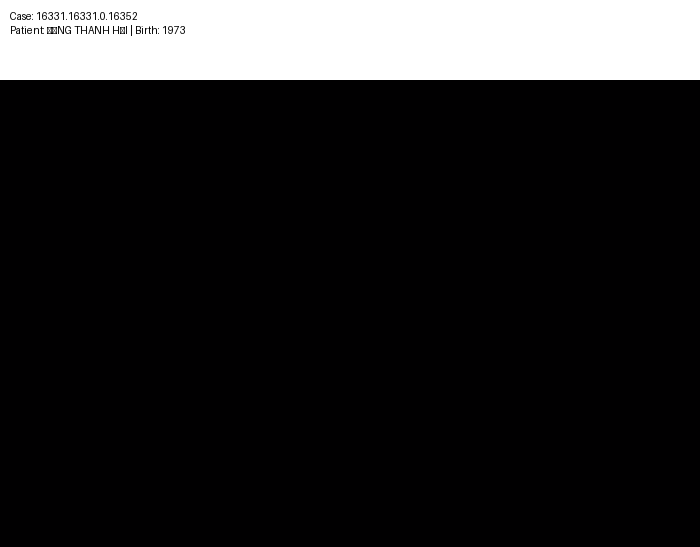

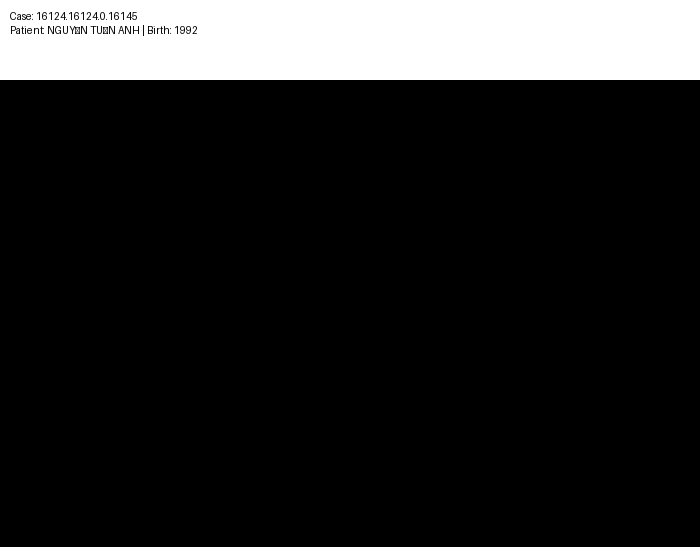

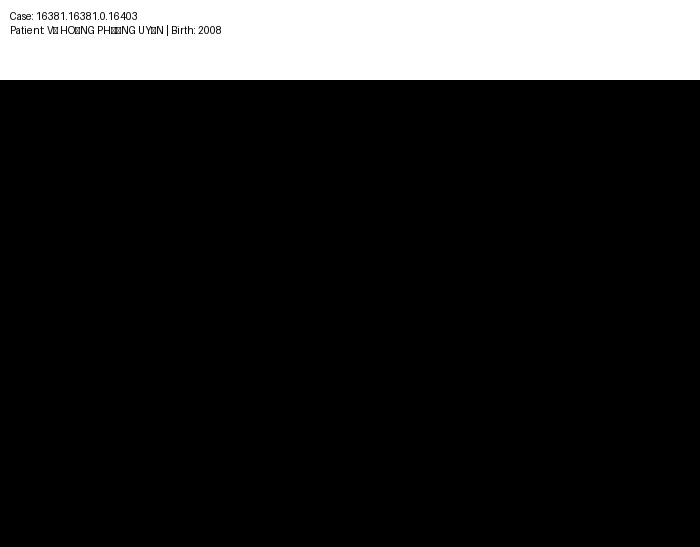

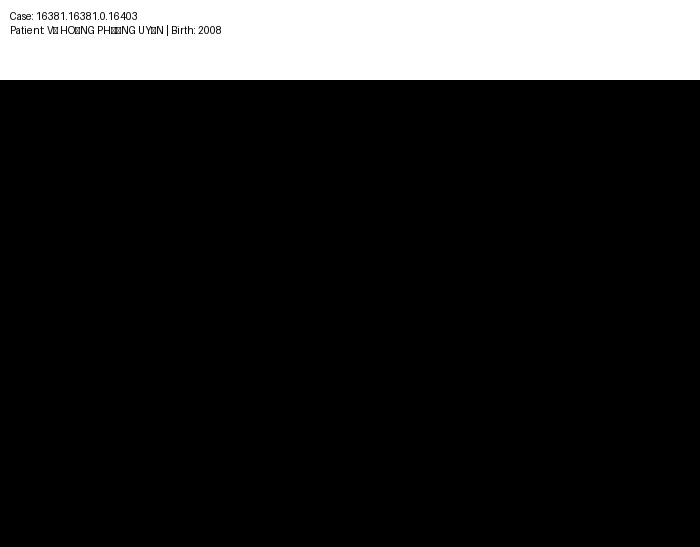

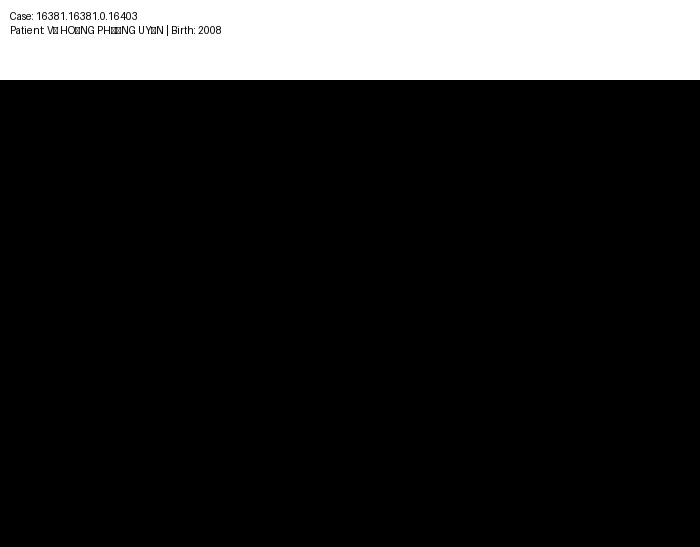


SHA256:
fb9ea5a2708f021497953fb07cf4c286af647dcc9a3aa7493f9844fc5cb44345

Case: 14241.14241.0.14260
Patient: LÊ GIANG PHƯƠNG THANH
Birth year: 1983
Image: 14241.14241.0.14260.20250115060912295.jpg
File size: 2113
Exists: True
Format: PNG
Size: (720, 480)
Mode: RGB

Case: 14362.14362.0.14381
Patient: LÊ VŨ BÍCH TRÂM
Birth year: 1990
Image: 14362.14362.0.14381.20250123071006272.jpg
File size: 2113
Exists: True
Format: PNG
Size: (720, 480)
Mode: RGB

Case: 14381.14381.0.14400
Patient: NGUYỄN THỊ THANH LAN
Birth year: 1998
Image: 14381.14381.0.14400.20250124081311277.jpg
File size: 2113
Exists: True
Format: PNG
Size: (720, 480)
Mode: RGB

Case: 12161.12161.0.12179
Patient: PHẠM THÀNH CÔNG
Birth year: 1971
Image: 12161.12161.0.12179.20240826101235144.jpg
File size: 2113
Exists: True
Format: PNG
Size: (720, 480)
Mode: RGB

Case: 12161.12161.0.12179
Patient: PHẠM THÀNH CÔNG
Birth year: 1971
Image: 12161.12161.0.12179.20240826101235705.jpg
File size: 2113
Exists: True
Format: PNG
Size: (720, 

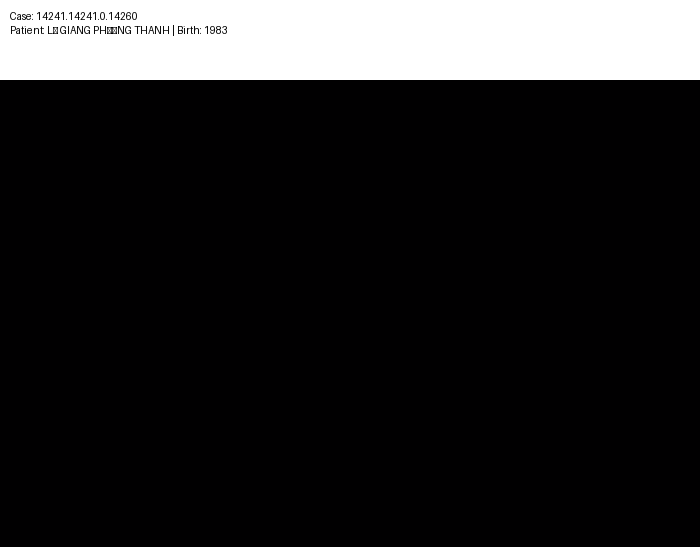

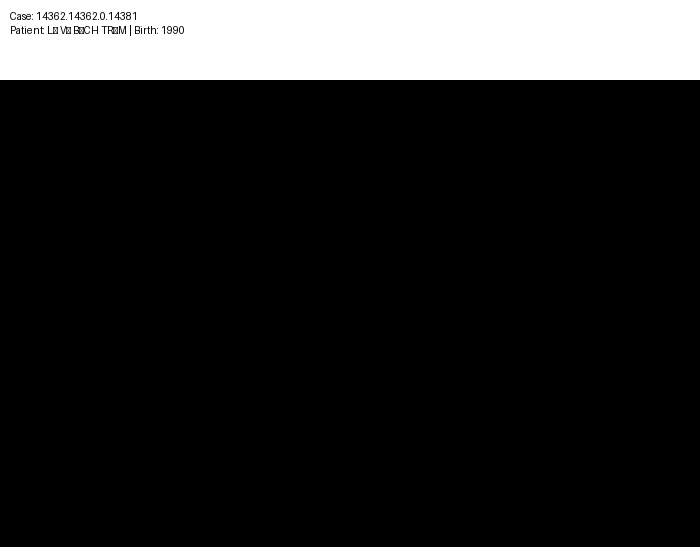

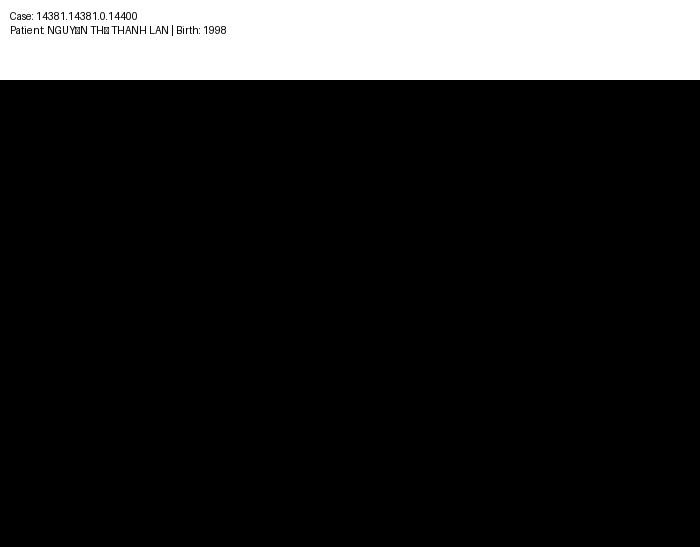

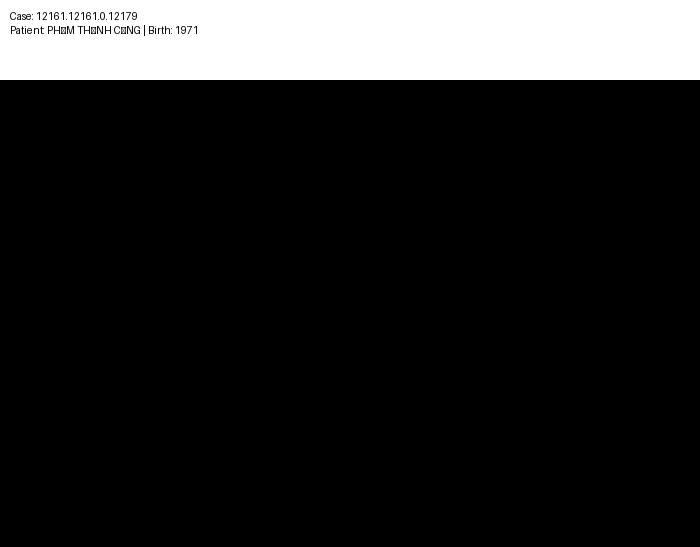

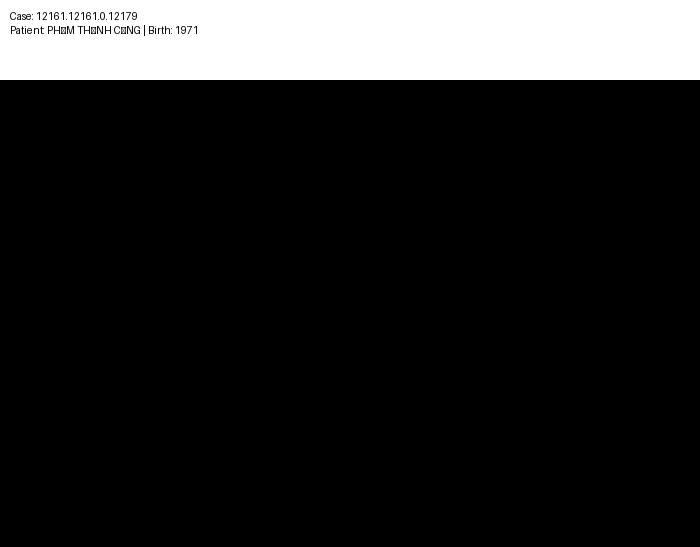

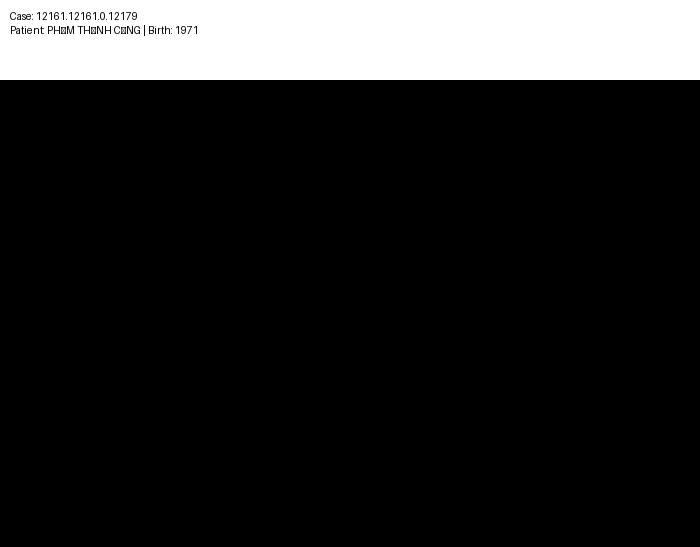

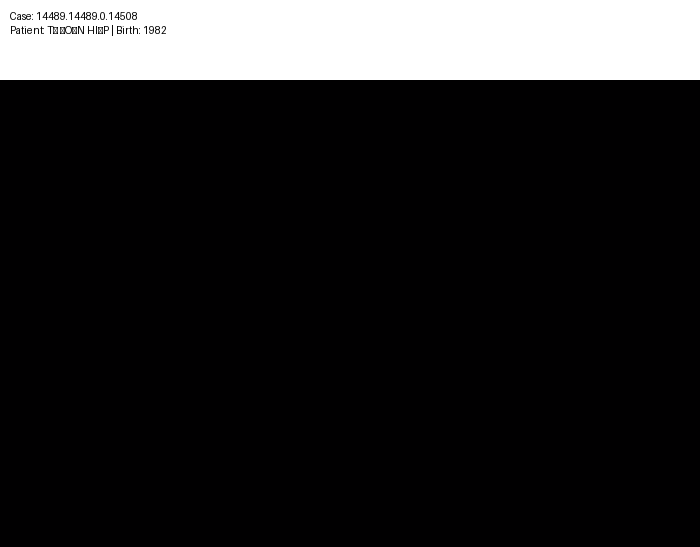

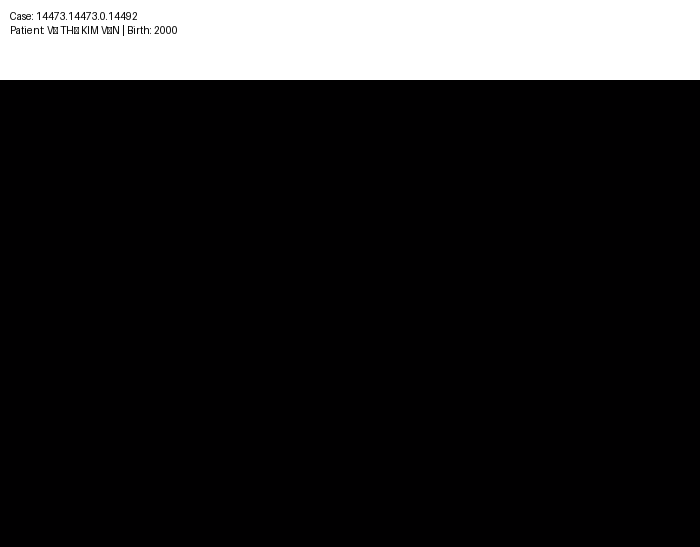

In [ ]:
# ============================================================
# CELL 49 — VISUAL INSPECTION OF CROSS-PATIENT EXACT DUPLICATES
# ============================================================

from PIL import Image, ImageOps, ImageDraw
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import os

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

DETAIL_FILE = BASE / "exact_duplicate_cross_patient_detailed.csv"

df = pd.read_csv(DETAIL_FILE, dtype=str)

print("=" * 70)
print("CELL 49 — VISUAL INSPECTION")
print("=" * 70)

print(f"Rows: {len(df):,}")
print(f"SHA groups: {df['sha256'].nunique():,}")

# ------------------------------------------------------------
# Mỗi SHA group
# ------------------------------------------------------------
for sha, g in df.groupby("sha256"):

    print("\n" + "=" * 70)
    print("SHA256:")
    print(sha)
    print("=" * 70)

    imgs = []

    for _, row in g.iterrows():

        path = row["image_path"]

        print("\nCase:", row["case_id"])
        print("Patient:", row["ho_ten_case"])
        print("Birth year:", row["nam_sinh_case"])
        print("Image:", row["image_name"])
        print("File size:", row["file_size"])
        print("Exists:", os.path.exists(path))

        try:
            im = Image.open(path).convert("RGB")

            print("Format:", Image.open(path).format)
            print("Size:", im.size)
            print("Mode:", im.mode)

            # thumbnail chỉ để display
            display_im = im.copy()
            display_im.thumbnail((700, 700))

            # thêm label
            canvas = Image.new(
                "RGB",
                (display_im.width, display_im.height + 80),
                "white"
            )

            canvas.paste(display_im, (0, 80))

            draw = ImageDraw.Draw(canvas)

            label = (
                f"Case: {row['case_id']}\n"
                f"Patient: {row['ho_ten_case']} | "
                f"Birth: {row['nam_sinh_case']}"
            )

            draw.text(
                (10, 10),
                label,
                fill="black"
            )

            imgs.append(canvas)

        except Exception as e:
            print("ERROR:", e)

    # --------------------------------------------------------
    # Display từng ảnh
    # --------------------------------------------------------
    for im in imgs:
        display(im)

In [ ]:
# ============================================================
# CELL 51 — NEAR-DUPLICATE CROSS-PATIENT AUDIT
# FINAL ROBUST VERSION
# ============================================================

import pandas as pd
import numpy as np
from pathlib import Path
from itertools import combinations
import re

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

PHASH_FILE = BASE / "original_image_phash.csv"
CASE_FILE = BASE / "dataset_v1_2_cases_final_clean.csv"

OUT_FILE = BASE / "near_duplicate_cross_patient_audit.csv"

PHASH_THRESHOLD = 4

# ============================================================
# 1. LOAD
# ============================================================

phash = pd.read_csv(PHASH_FILE, dtype=str)
cases = pd.read_csv(CASE_FILE, dtype=str)

print("=" * 70)
print("CELL 51 — NEAR-DUPLICATE CROSS-PATIENT AUDIT")
print("=" * 70)

print(f"pHash rows: {len(phash):,}")
print(f"Case rows:   {len(cases):,}")

print("\nActual pHash columns:")
print(phash.columns.tolist())

# ============================================================
# 2. IMAGE PATH + PHASH
# ============================================================

path_col = "image_path"
hash_col = "phash"

if path_col not in phash.columns:
    raise KeyError(f"Missing column: {path_col}")

if hash_col not in phash.columns:
    raise KeyError(f"Missing column: {hash_col}")

phash[path_col] = phash[path_col].astype(str).str.strip()
phash[hash_col] = phash[hash_col].astype(str).str.strip().str.lower()

# ============================================================
# 3. EXTRACT CASE_ID FROM PATH
# ============================================================

def extract_case_id(path):
    parts = Path(path).parts

    if len(parts) < 2:
        return None

    case_id = parts[-2]

    if re.fullmatch(r"\d+\.\d+\.0\.\d+", case_id):
        return case_id

    return None


phash["case_id"] = phash[path_col].map(extract_case_id)

print(
    f"\nExtracted case_id: "
    f"{phash['case_id'].notna().sum():,} / {len(phash):,}"
)

# ============================================================
# 4. REMOVE INVALID PHASH
# ============================================================

valid_phash = (
    phash[hash_col].notna()
    & (phash[hash_col] != "")
    & (phash[hash_col] != "nan")
    & phash[hash_col].str.fullmatch(r"[0-9a-fA-F]+")
)

phash = phash[valid_phash].copy()

print(f"Valid pHash rows: {len(phash):,}")

# ============================================================
# 5. CASE → PATIENT
# ============================================================

required_cols = [
    "case_id",
    "patient_group_id",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh_clean",
]

missing = [c for c in required_cols if c not in cases.columns]

if missing:
    raise KeyError(f"Missing case columns: {missing}")

case_info = (
    cases[required_cols]
    .drop_duplicates("case_id")
    .rename(columns={
        "patient_group_id": "patient_group_final",
        "ho_ten": "ho_ten_case",
        "nam_sinh": "nam_sinh_case",
        "gioi_tinh_clean": "gioi_tinh_case",
    })
)

# ============================================================
# 6. MERGE
# ============================================================

df = phash.merge(
    case_info,
    on="case_id",
    how="inner",
    validate="many_to_one"
)

print("\n" + "=" * 70)
print("MERGE RESULT")
print("=" * 70)

print(f"Matched pHash rows: {len(df):,}")
print(f"Unique cases:       {df['case_id'].nunique():,}")
print(f"Unique patients:    {df['patient_group_final'].nunique():,}")

# ============================================================
# 7. CONVERT PHASH TO PYTHON INTEGER
# ============================================================

# IMPORTANT:
# Do NOT use pandas Series >> directly.
# Convert each hash explicitly to Python int first.

df["phash_int"] = df[hash_col].map(
    lambda x: int(x, 16)
)

print(f"Usable pHash rows: {len(df):,}")

# ============================================================
# 8. CREATE 16-BIT BUCKETS
# ============================================================

# Convert to uint64 numpy array
h = df["phash_int"].to_numpy(dtype=np.uint64)

df["p0"] = (h >> np.uint64(48)) & np.uint64(0xFFFF)
df["p1"] = (h >> np.uint64(32)) & np.uint64(0xFFFF)
df["p2"] = (h >> np.uint64(16)) & np.uint64(0xFFFF)
df["p3"] = h & np.uint64(0xFFFF)

print("\n16-bit pHash buckets created successfully.")

# ============================================================
# 9. GENERATE CANDIDATE PAIRS
# ============================================================

candidate_pairs = set()

for col in ["p0", "p1", "p2", "p3"]:

    print(f"Processing bucket: {col}")

    for _, g in df.groupby(col, sort=False):

        n = len(g)

        if n < 2:
            continue

        # Large buckets are usually blank/common artifacts.
        if n > 500:
            continue

        idxs = g.index.to_list()

        for i, j in combinations(idxs, 2):

            patient_i = df.at[i, "patient_group_final"]
            patient_j = df.at[j, "patient_group_final"]

            if patient_i == patient_j:
                continue

            candidate_pairs.add(
                (min(i, j), max(i, j))
            )

print("\n" + "=" * 70)
print("CANDIDATES")
print("=" * 70)

print(
    f"Cross-patient candidate pairs: "
    f"{len(candidate_pairs):,}"
)

# ============================================================
# 10. HAMMING DISTANCE
# ============================================================

def hamming_distance(a, b):
    return (int(a) ^ int(b)).bit_count()


results = []

for i, j in candidate_pairs:

    a = df.loc[i]
    b = df.loc[j]

    dist = hamming_distance(
        a["phash_int"],
        b["phash_int"]
    )

    if dist <= PHASH_THRESHOLD:

        results.append({
            "phash_distance": dist,

            "case_id_a": a["case_id"],
            "case_id_b": b["case_id"],

            "patient_a": a["patient_group_final"],
            "patient_b": b["patient_group_final"],

            "name_a": a["ho_ten_case"],
            "name_b": b["ho_ten_case"],

            "birth_a": a["nam_sinh_case"],
            "birth_b": b["nam_sinh_case"],

            "image_a": a[path_col],
            "image_b": b[path_col],

            "phash_a": a[hash_col],
            "phash_b": b[hash_col],
        })

# ============================================================
# 11. SAVE
# ============================================================

result = pd.DataFrame(results)

if len(result) > 0:

    result = (
        result
        .drop_duplicates(
            subset=[
                "case_id_a",
                "case_id_b",
                "image_a",
                "image_b"
            ]
        )
        .sort_values(
            [
                "phash_distance",
                "case_id_a",
                "case_id_b"
            ]
        )
        .reset_index(drop=True)
    )

result.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

# ============================================================
# 12. SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("RESULT")
print("=" * 70)

print(
    f"Near-duplicate cross-patient pairs: "
    f"{len(result):,}"
)

if len(result) > 0:

    print("\nDistance distribution:")

    print(
        result["phash_distance"]
        .value_counts()
        .sort_index()
        .to_string()
    )

    print("\nTop 30 closest pairs:")

    display(result.head(30))

else:

    print("\nNo cross-patient near-duplicate pairs found.")

print("\nSaved:")
print(OUT_FILE)

CELL 51 — NEAR-DUPLICATE CROSS-PATIENT AUDIT
pHash rows: 81,786
Case rows:   7,607

Actual pHash columns:
['image_path', 'parent_folder', 'image_name', 'datetime', 'date', 'phash', 'status', 'error']

Extracted case_id: 81,786 / 81,786
Valid pHash rows: 81,784

MERGE RESULT
Matched pHash rows: 76,403
Unique cases:       7,607
Unique patients:    3,072
Usable pHash rows: 76,403

16-bit pHash buckets created successfully.
Processing bucket: p0
Processing bucket: p1
Processing bucket: p2
Processing bucket: p3

CANDIDATES
Cross-patient candidate pairs: 16,643,987

RESULT
Near-duplicate cross-patient pairs: 321,970

Distance distribution:
phash_distance
0      2810
2     49740
4    269420

Top 30 closest pairs:


,phash_distance,case_id_a,case_id_b,patient_a,patient_b,name_a,name_b,birth_a,birth_b,image_a,image_b,phash_a,phash_b
0,0,10000.10000.0.10014,13030.13030.0.13048,NGUYEN TRUONG TAN SANG_2015,NGUYEN THANH VAN_1983,NGUYỄN TRƯƠNG TẤN SANG,NGUYỄN THANH VÂN,2015,1983,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,92996d663666929b,92996d663666929b
1,0,10003.10003.0.10017,11191.11191.0.11207,NGUYEN THI THU LE_1985,PHAM LE PHUONG LAN_2017,NGUYỄN THỊ THU LỆ,PHẠM LÊ PHƯƠNG LAN,1985,2017,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,92ce693965313667,92ce693965313667
2,0,10003.10003.0.10017,12049.12049.0.12067,NGUYEN THI THU LE_1985,NGHIEM TUAN KIET_2017,NGUYỄN THỊ THU LỆ,NGHIÊM TUẤN KIỆT,1985,2017,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,92ce693965313667,92ce693965313667
3,0,10003.10003.0.10017,18344.18344.0.18369,NGUYEN THI THU LE_1985,PHAM OAN MINH KHUE_2024,NGUYỄN THỊ THU LỆ,PHẠM ĐOÀN MINH KHUÊ,1985,2024,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,92ce693965313667,92ce693965313667
4,0,10004.10004.0.10018,10894.10894.0.10909,NGO MINH TRIET_2013,NGUYEN THI CAM_1956,NGÔ MINH TRIẾT,NGUYỄN THỊ CẨM,2013,1956,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9e386d67318e6698,9e386d67318e6698
5,0,10011.10011.0.10025,10539.10539.0.10554,TRAN MINH UC_2017,NGUYEN THI ANH NGOC_1978,TRẦN MINH ĐỨC,NGUYỄN THỊ ÁNH NGỌC,2017,1978,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,cecc3832631b33ce,cecc3832631b33ce
6,0,10012.10012.0.10026,16502.16502.0.16524,KHONG UC LOI_1954,TRUONG PHAM KHANH CHI_2011,KHỔNG ĐỨC LỢI,TRƯƠNG PHẠM KHÁNH CHI,1954,2011,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,c6ce393965312667,c6ce393965312667
7,0,10012.10012.0.10026,17345.17345.0.17368,KHONG UC LOI_1954,NGUYEN HO DIEM LINH_1995,KHỔNG ĐỨC LỢI,NGUYỄN HỒ DIỄM LINH,1954,1995,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,c6ce393965312667,c6ce393965312667
8,0,10040.10040.0.10054,11898.11898.0.11916,TRUONG THI BE_1953,NGUYEN UC_1966,TRƯƠNG THỊ BÉ,NGUYỄN ĐỨC,1953,1966,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9a386d67309e66c9,9a386d67309e66c9
9,0,10043.10043.0.10057,17481.17481.0.17504,ANG HUU UC_1991,TRAN MINH UC_2017,ĐẶNG HỮU ĐỨC,TRẦN MINH ĐỨC,1991,2017,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,969b696c25653633,969b696c25653633



Saved:
/content/drive/MyDrive/NoiSoi_Matching/near_duplicate_cross_patient_audit.csv


In [ ]:
# ============================================================
# CELL 52 — PHASH EXACT-MATCH GROUP AUDIT
# ============================================================

import pandas as pd
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

NEAR_FILE = BASE / "near_duplicate_cross_patient_audit.csv"
OUT_FILE = BASE / "phash_exact_cross_patient_groups.csv"

df = pd.read_csv(NEAR_FILE, dtype=str)

print("=" * 70)
print("CELL 52 — PHASH EXACT-MATCH GROUP AUDIT")
print("=" * 70)

print(f"Near-duplicate pairs: {len(df):,}")

# ------------------------------------------------------------
# Chỉ distance = 0
# ------------------------------------------------------------

exact = df[
    df["phash_distance"].astype(str) == "0"
].copy()

print(f"pHash distance = 0 pairs: {len(exact):,}")

# ------------------------------------------------------------
# Chuẩn hóa pair → hash groups
#
# Mỗi pair có cùng phash_a / phash_b.
# ------------------------------------------------------------

exact["phash"] = exact["phash_a"]

# ------------------------------------------------------------
# Tổng hợp theo pHash
# ------------------------------------------------------------

groups = (
    exact
    .groupby("phash")
    .agg(
        num_pairs=("phash", "size"),
        num_cases_a=("case_id_a", "nunique"),
        num_cases_b=("case_id_b", "nunique"),
        num_patients_a=("patient_a", "nunique"),
        num_patients_b=("patient_b", "nunique"),
    )
    .reset_index()
)

groups["num_cases_total"] = (
    groups["num_cases_a"] + groups["num_cases_b"]
)

groups["num_patients_total"] = (
    groups["num_patients_a"] + groups["num_patients_b"]
)

groups = groups.sort_values(
    ["num_patients_total", "num_pairs"],
    ascending=False
).reset_index(drop=True)

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

groups.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

# ------------------------------------------------------------
# Summary
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("SUMMARY")
print("=" * 70)

print(
    f"Unique cross-patient exact pHash groups: "
    f"{len(groups):,}"
)

print(
    f"Maximum pairs in one pHash group: "
    f"{groups['num_pairs'].max():,}"
)

print(
    f"Maximum patients in one pHash group: "
    f"{groups['num_patients_total'].max():,}"
)

print("\nTop 30 largest pHash groups:")
display(groups.head(30))

print("\nSaved:")
print(OUT_FILE)

CELL 52 — PHASH EXACT-MATCH GROUP AUDIT
Near-duplicate pairs: 321,970
pHash distance = 0 pairs: 2,810

SUMMARY
Unique cross-patient exact pHash groups: 1,118
Maximum pairs in one pHash group: 462
Maximum patients in one pHash group: 54

Top 30 largest pHash groups:


,phash,num_pairs,num_cases_a,num_cases_b,num_patients_a,num_patients_b,num_cases_total,num_patients_total
0,9d279926997652d8,462,27,27,27,27,54,54
1,99279926d97652d8,55,10,10,10,10,20,20
2,0000000000000000,85,9,9,9,9,18,18
3,86cc793365332667,28,7,7,7,7,14,14
4,9299696765646676,28,7,7,7,7,14,14
5,92996d6664663676,28,7,7,7,7,14,14
6,9d2799269966d2d8,28,7,7,7,7,14,14
7,9299696665647676,21,6,6,6,6,12,12
8,96cc793365312667,21,6,6,6,6,12,12
9,96cc793365316666,21,6,6,6,6,12,12



Saved:
/content/drive/MyDrive/NoiSoi_Matching/phash_exact_cross_patient_groups.csv


CELL 53 — VISUAL AUDIT LARGE PHASH GROUPS
Groups to inspect: 20

pHash: 9d279926997652d8
Patients: 54
Pairs: 462
Representative case: 10157.10157.0.10171
Representative patient: LÊ CÔNG TRÍ
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10157.10157.0/10157.10157.0.10171/10157.10157.0.10171.20240313061641844.jpg
Format: PNG
Size: (720, 480)
File size: 63578


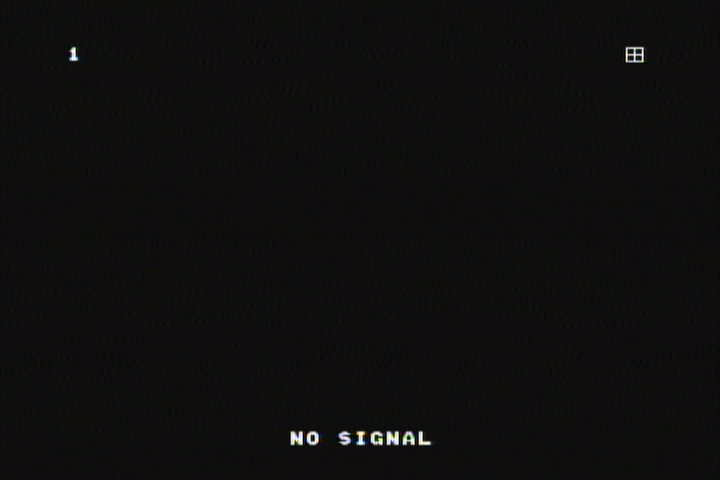


pHash: 99279926d97652d8
Patients: 20
Pairs: 55
Representative case: 10533.10533.0.10548
Representative patient: TRẦN PHAN MINH THƯ
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10533.10533.0/10533.10533.0.10548/10533.10533.0.10548.20240410080919283.jpg
Format: PNG
Size: (720, 480)
File size: 59925


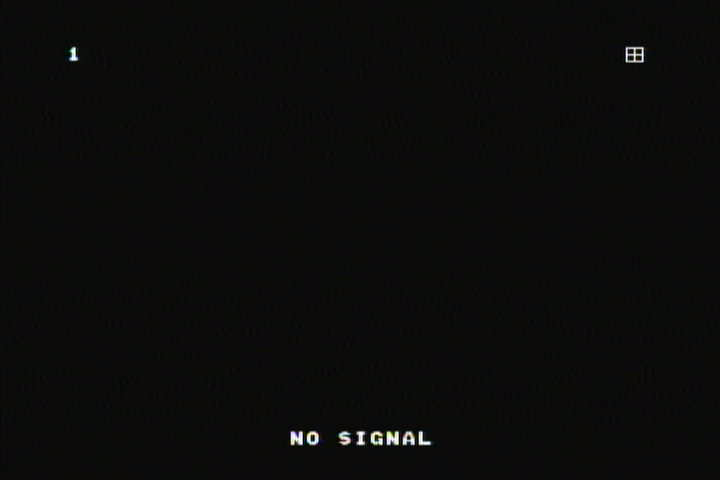


pHash: 86cc793365332667
Patients: 14
Pairs: 28
Representative case: 11292.11292.0.11308
Representative patient: TRẦN MAI THI
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/11292.11292.0/11292.11292.0.11308/11292.11292.0.11308.20240611061105121.jpg
Format: PNG
Size: (720, 480)
File size: 236619


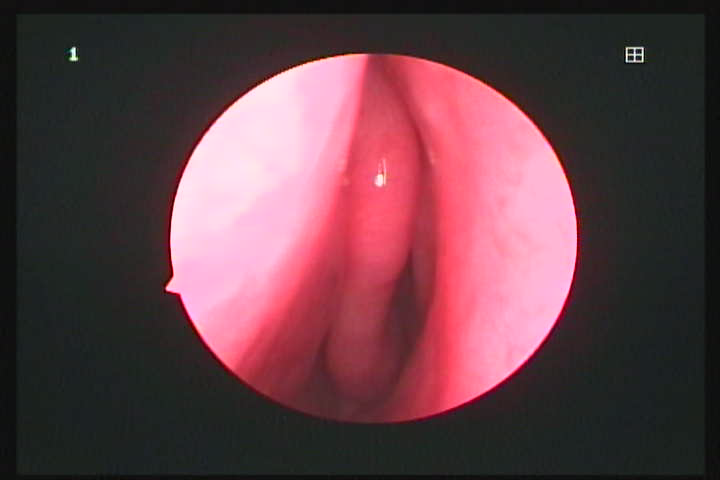


pHash: 9299696765646676
Patients: 14
Pairs: 28
Representative case: 10628.10628.0.10643
Representative patient: NGUYỄN NGỌC THẢO LY
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10628.10628.0/10628.10628.0.10643/10628.10628.0.10643.20240417080616919.jpg
Format: PNG
Size: (720, 480)
File size: 248067


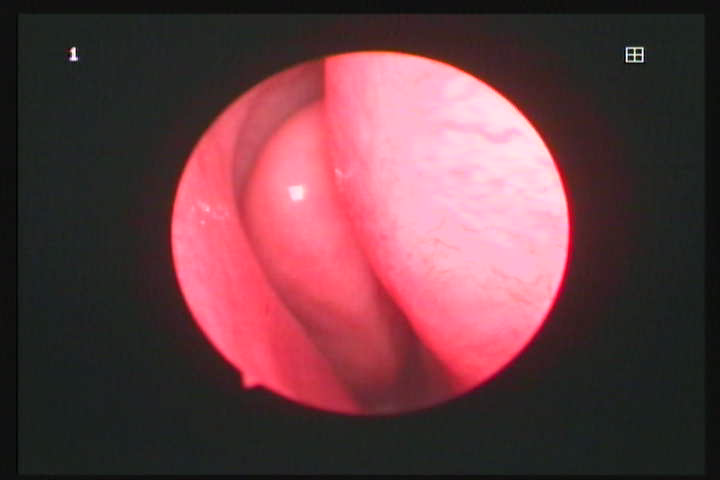


pHash: 92996d6664663676
Patients: 14
Pairs: 28
Representative case: 13977.13977.0.13996
Representative patient: TRƯƠNG MINH TRIẾT
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/13977.13977.0/13977.13977.0.13996/13977.13977.0.13996.20241228073259206.jpg
Format: PNG
Size: (720, 480)
File size: 219267


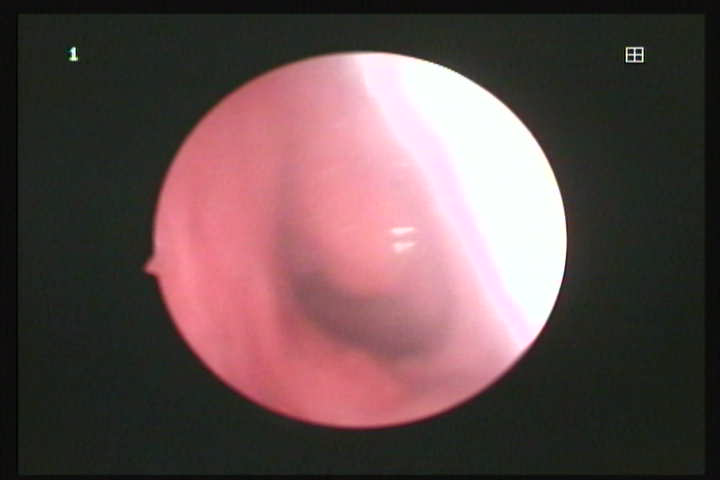


pHash: 9d2799269966d2d8
Patients: 14
Pairs: 28
Representative case: 10988.10988.0.11003
Representative patient: CHIU THỊ PHƯƠNG
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10988.10988.0/10988.10988.0.11003/10988.10988.0.11003.20240518061155765.jpg
Format: PNG
Size: (720, 480)
File size: 65419


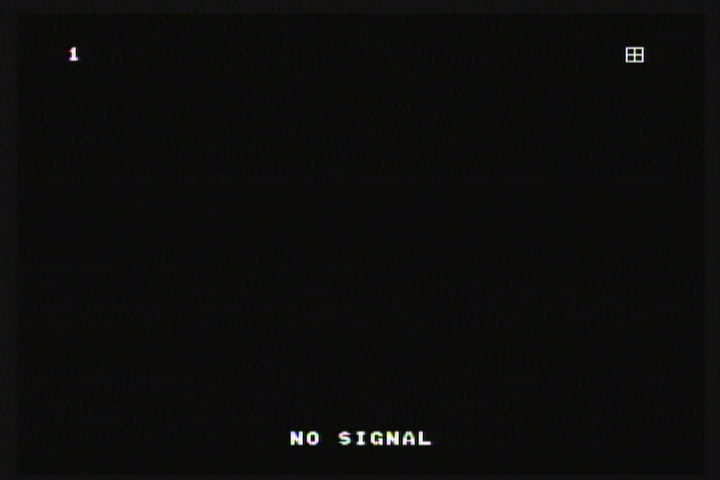


pHash: 9299696665647676
Patients: 12
Pairs: 21
Representative case: 11216.11216.0.11232
Representative patient: NGUYỄN THỊ MỸ DUNG
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/11216.11216.0/11216.11216.0.11232/11216.11216.0.11232.20240604062437218.jpg
Format: PNG
Size: (720, 480)
File size: 228473


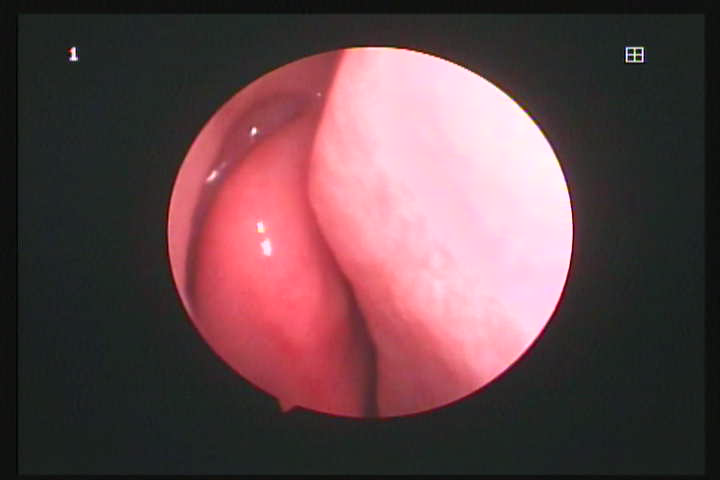


pHash: 96cc793365312667
Patients: 12
Pairs: 21
Representative case: 10084.10084.0.10098
Representative patient: NGUYỄN ĐỖ PHƯƠNG LINH
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10084.10084.0/10084.10084.0.10098/10084.10084.0.10098.20240308060304806.jpg
Format: PNG
Size: (720, 480)
File size: 239246


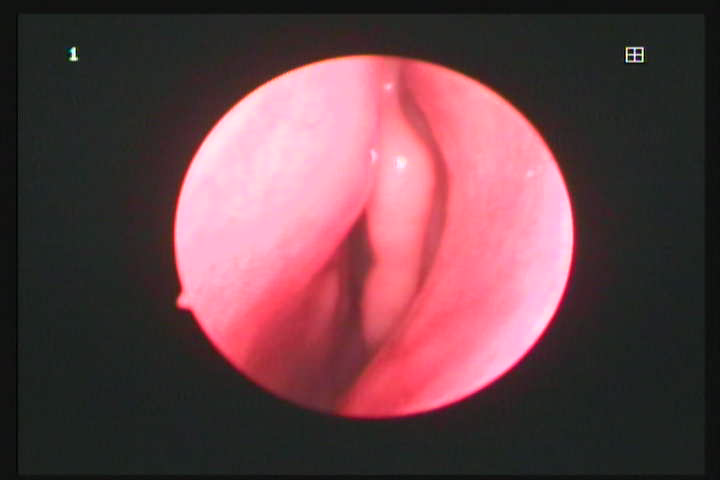


pHash: 96cc793365316666
Patients: 12
Pairs: 21
Representative case: 11078.11078.0.11093
Representative patient: NGUYỄN ĐỨC ANH MINH
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/11078.11078.0/11078.11078.0.11093/11078.11078.0.11093.20240525065525612.jpg
Format: PNG
Size: (720, 480)
File size: 251532


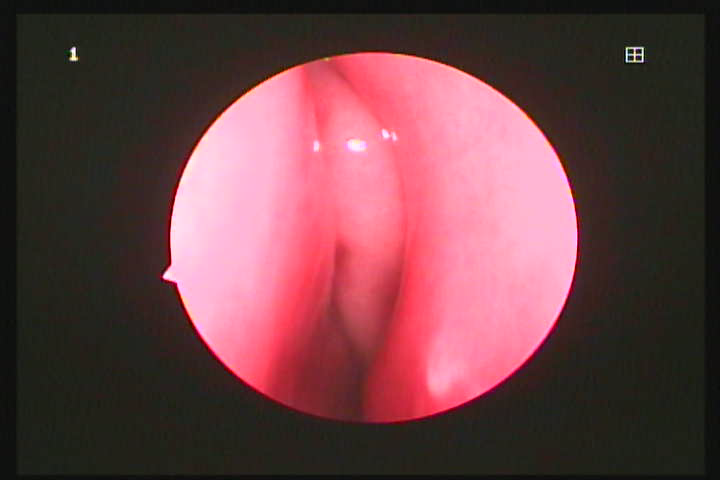


pHash: 96ce793165316666
Patients: 12
Pairs: 21
Representative case: 10577.10577.0.10592
Representative patient: TRẦN MINH ĐỨC
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10577.10577.0/10577.10577.0.10592/10577.10577.0.10592.20240413074804365.jpg
Format: PNG
Size: (720, 480)
File size: 252979


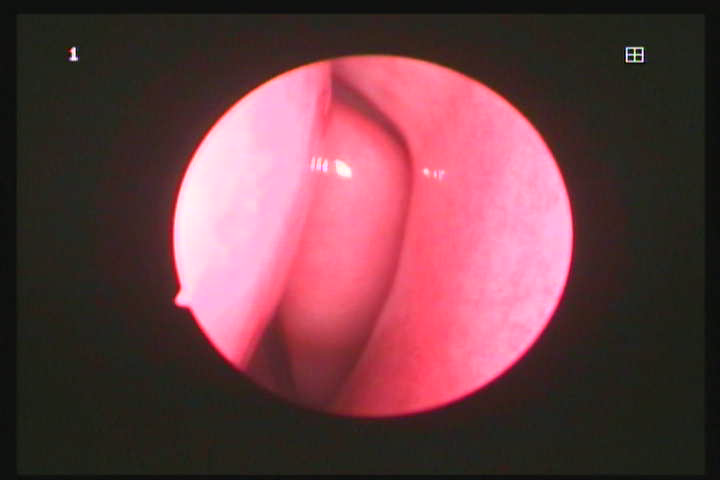


pHash: 9e9a696925656666
Patients: 12
Pairs: 21
Representative case: 12039.12039.0.12057
Representative patient: PHẠM HOÀNG MINH
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/12039.12039.0/12039.12039.0.12057/12039.12039.0.12057.20240817053915101.jpg
Format: PNG
Size: (720, 480)
File size: 236693


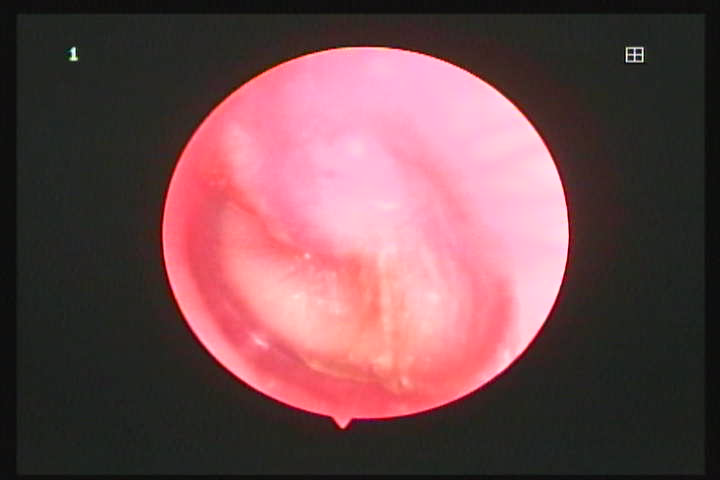


pHash: c6cc383331336767
Patients: 12
Pairs: 21
Representative case: 10372.10372.0.10386
Representative patient: LÊ VĂN MẠNH
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10372.10372.0/10372.10372.0.10386/10372.10372.0.10386.20240329092135158.jpg
Format: PNG
Size: (720, 480)
File size: 219833


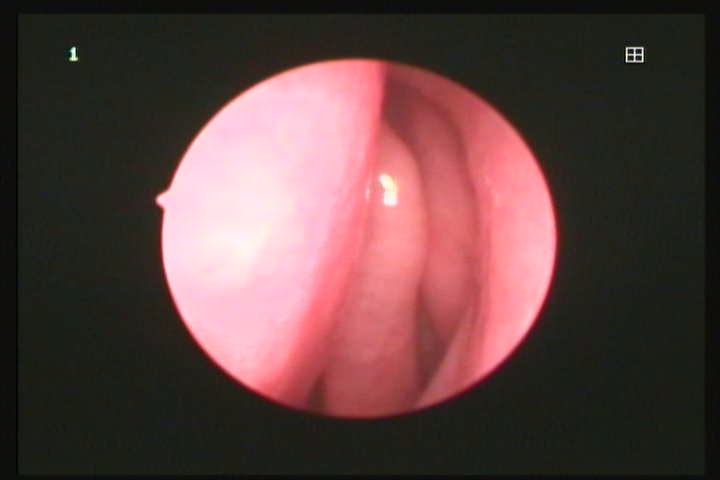


pHash: 9e996967318e6698
Patients: 10
Pairs: 20
Representative case: 10261.10261.0.10275
Representative patient: TRẦN TIẾN PHÁT
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10261.10261.0/10261.10261.0.10275/10261.10261.0.10275.20240321073819969.jpg
Format: PNG
Size: (720, 480)
File size: 195943


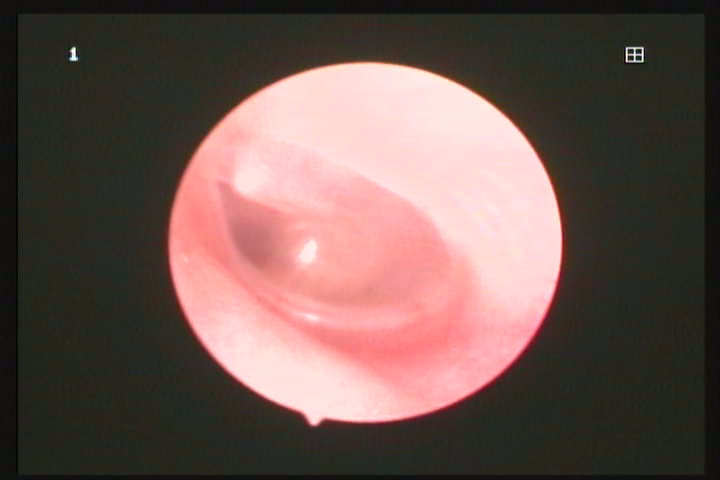


pHash: 86cc393365336667
Patients: 10
Pairs: 15
Representative case: 10181.10181.0.10195
Representative patient: HUỲNH NGỌC PHƯƠNG HÂN
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10181.10181.0/10181.10181.0.10195/10181.10181.0.10195.20240315072750952.jpg
Format: PNG
Size: (720, 480)
File size: 231469


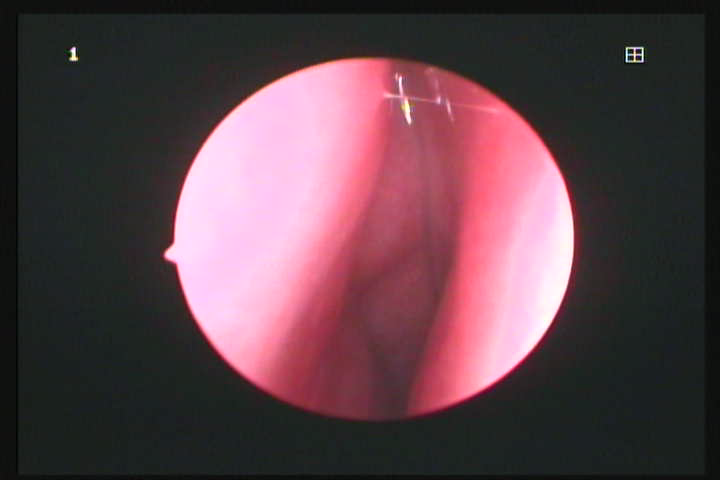


pHash: 86cc793365313667
Patients: 10
Pairs: 15
Representative case: 14345.14345.0.14364
Representative patient: PHAN HUỲNH TIẾN ĐẠT
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/14345.14345.0/14345.14345.0.14364/14345.14345.0.14364.20250121090227282.jpg
Format: PNG
Size: (720, 480)
File size: 249878


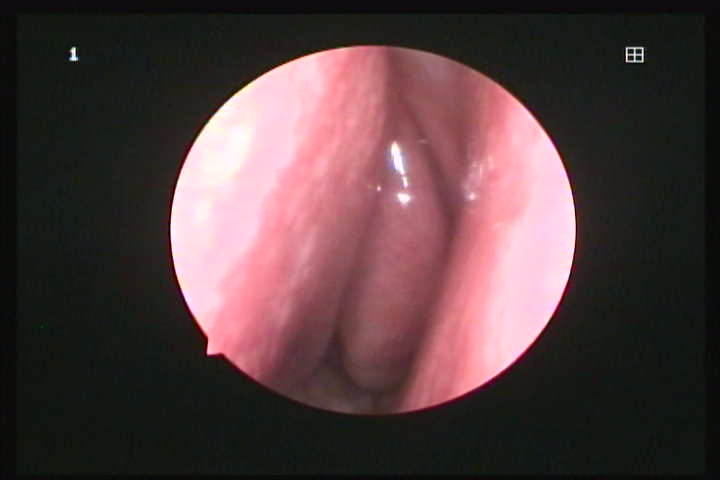


pHash: 86cc793365316667
Patients: 10
Pairs: 15
Representative case: 11197.11197.0.11213
Representative patient: LÊ TRẦN THANH THỦY
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/11197.11197.0/11197.11197.0.11213/11197.11197.0.11213.20240603072541704.jpg
Format: PNG
Size: (720, 480)
File size: 240753


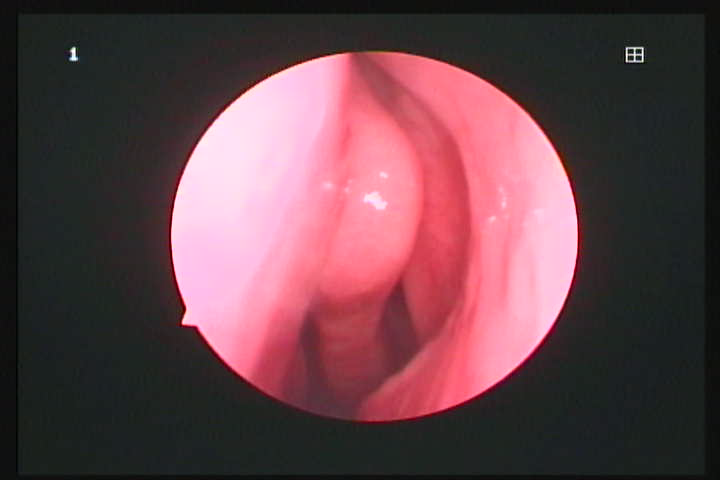


pHash: 9299696665663676
Patients: 10
Pairs: 15
Representative case: 14993.14993.0.15012
Representative patient: NGUYỄN DUY PHÚ
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/14993.14993.0/14993.14993.0.15012/14993.14993.0.15012.20250314073204630.jpg
Format: PNG
Size: (720, 480)
File size: 252286


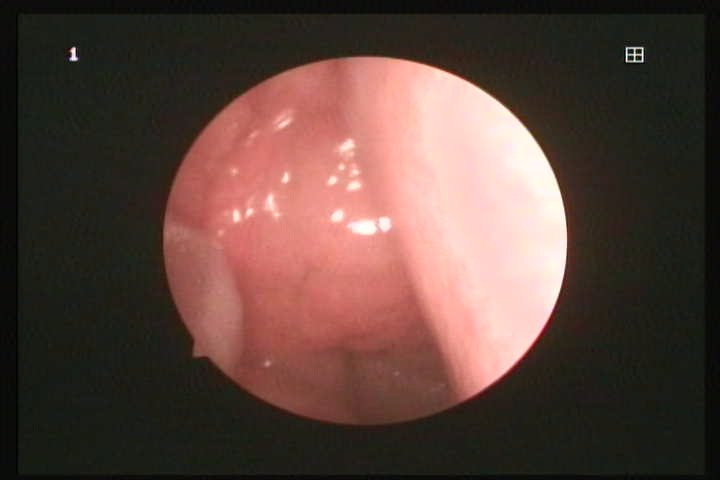


pHash: 969b696d65642636
Patients: 10
Pairs: 15
Representative case: 11382.11382.0.11398
Representative patient: NGUYỄN LÊ VƯƠNG NGỌC
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/11382.11382.0/11382.11382.0.11398/11382.11382.0.11398.20240620081922390.jpg
Format: PNG
Size: (720, 480)
File size: 249156


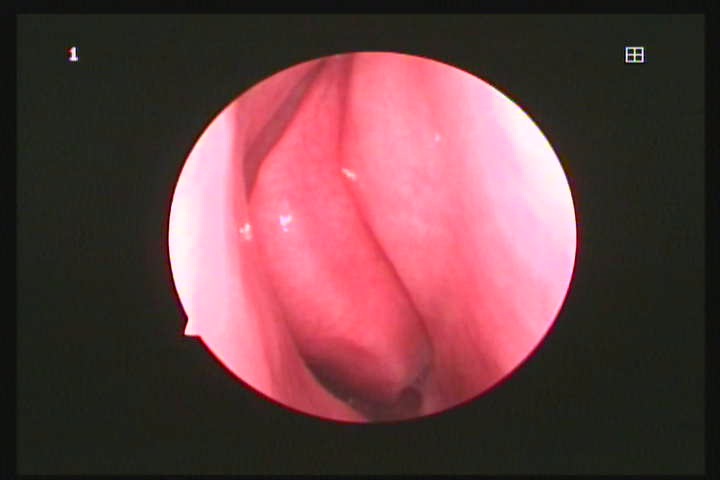


pHash: 96cc693365332667
Patients: 10
Pairs: 15
Representative case: 10637.10637.0.10652
Representative patient: LÊ TUẤN CHÍ
Path: /content/drive/MyDrive/ImageLocal/ImageLocal/10637.10637.0/10637.10637.0.10652/10637.10637.0.10652.20240419054943302.jpg
Format: PNG
Size: (720, 480)
File size: 252238


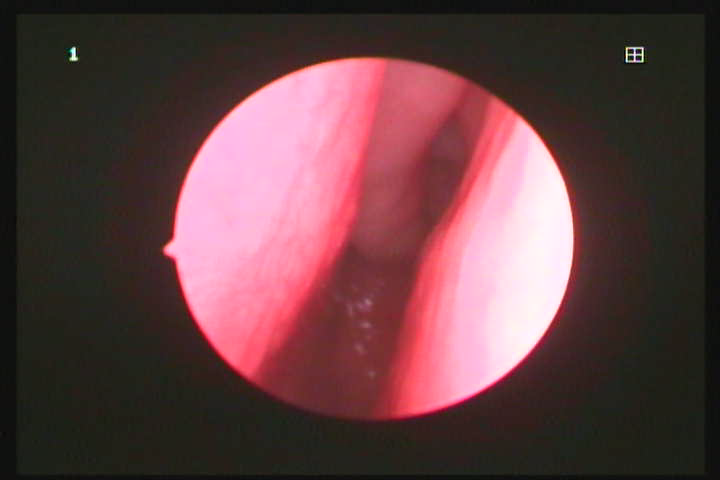

In [ ]:
# ============================================================
# CELL 53 — VISUAL AUDIT LARGE PHASH GROUPS
# ============================================================

import pandas as pd
from PIL import Image
from pathlib import Path
import os

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

NEAR_FILE = BASE / "near_duplicate_cross_patient_audit.csv"
GROUP_FILE = BASE / "phash_exact_cross_patient_groups.csv"

near = pd.read_csv(NEAR_FILE, dtype=str)
groups = pd.read_csv(GROUP_FILE, dtype=str)

# ------------------------------------------------------------
# Lấy 20 group lớn nhất
# ------------------------------------------------------------

top_groups = groups.head(20).copy()

print("=" * 70)
print("CELL 53 — VISUAL AUDIT LARGE PHASH GROUPS")
print("=" * 70)

print(f"Groups to inspect: {len(top_groups)}")

# ------------------------------------------------------------
# Với mỗi pHash, lấy một image representative
# ------------------------------------------------------------

for _, g in top_groups.iterrows():

    phash = g["phash"]

    # Bỏ zero hash
    if phash == "0000000000000000":
        continue

    rows = near[
        (near["phash_a"] == phash)
        | (near["phash_b"] == phash)
    ]

    if len(rows) == 0:
        continue

    row = rows.iloc[0]

    if row["phash_a"] == phash:
        image_path = row["image_a"]
        case_id = row["case_id_a"]
        patient = row["name_a"]
    else:
        image_path = row["image_b"]
        case_id = row["case_id_b"]
        patient = row["name_b"]

    print("\n" + "=" * 70)
    print("pHash:", phash)
    print("Patients:", g["num_patients_total"])
    print("Pairs:", g["num_pairs"])
    print("Representative case:", case_id)
    print("Representative patient:", patient)
    print("Path:", image_path)

    try:
        im = Image.open(image_path).convert("RGB")

        print("Format:", Image.open(image_path).format)
        print("Size:", im.size)
        print("File size:", os.path.getsize(image_path))

        display(im.resize((720, 480)))

    except Exception as e:
        print("ERROR:", e)

In [ ]:
# ============================================================
# CELL 54 — PHASH=0 PIXEL-LEVEL VERIFICATION
# ============================================================

import pandas as pd
import numpy as np
from PIL import Image
from pathlib import Path
from itertools import islice
import os

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

NEAR_FILE = BASE / "near_duplicate_cross_patient_audit.csv"
OUT_FILE = BASE / "phash0_pixel_similarity_audit.csv"

# ------------------------------------------------------------
# SETTINGS
# ------------------------------------------------------------

# Number of pairs to inspect
MAX_PAIRS = 300

# Resize before pixel comparison
SIZE = (256, 256)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

df = pd.read_csv(
    NEAR_FILE,
    dtype=str
)

exact = df[
    df["phash_distance"].astype(str) == "0"
].copy()

print("=" * 70)
print("CELL 54 — PHASH=0 PIXEL-LEVEL VERIFICATION")
print("=" * 70)

print(f"Total pHash=0 pairs: {len(exact):,}")

# ------------------------------------------------------------
# Remove duplicate pair orientation
# ------------------------------------------------------------

exact["pair_key"] = (
    exact["image_a"].astype(str)
    + "||"
    + exact["image_b"].astype(str)
)

exact = exact.drop_duplicates("pair_key")

print(f"Unique pHash=0 pairs: {len(exact):,}")

# ------------------------------------------------------------
# Inspect first MAX_PAIRS
# ------------------------------------------------------------

pairs = exact.head(MAX_PAIRS)

results = []


def load_gray(path):
    im = Image.open(path).convert("L")
    im = im.resize(SIZE)
    return np.asarray(im, dtype=np.float32)


for n, (_, row) in enumerate(pairs.iterrows(), start=1):

    path_a = row["image_a"]
    path_b = row["image_b"]

    try:

        a = load_gray(path_a)
        b = load_gray(path_b)

        # ----------------------------------------------------
        # MAE
        # ----------------------------------------------------

        mae = float(np.mean(np.abs(a - b)))

        # ----------------------------------------------------
        # MSE
        # ----------------------------------------------------

        mse = float(np.mean((a - b) ** 2))

        # ----------------------------------------------------
        # Normalized correlation
        # ----------------------------------------------------

        a_flat = a.ravel()
        b_flat = b.ravel()

        a_std = a_flat.std()
        b_std = b_flat.std()

        if a_std > 0 and b_std > 0:
            corr = float(
                np.corrcoef(a_flat, b_flat)[0, 1]
            )
        else:
            corr = np.nan

        # ----------------------------------------------------
        # Basic image information
        # ----------------------------------------------------

        size_a = os.path.getsize(path_a)
        size_b = os.path.getsize(path_b)

        results.append({
            "phash": row["phash_a"],

            "case_id_a": row["case_id_a"],
            "case_id_b": row["case_id_b"],

            "patient_a": row["patient_a"],
            "patient_b": row["patient_b"],

            "name_a": row["name_a"],
            "name_b": row["name_b"],

            "image_a": path_a,
            "image_b": path_b,

            "file_size_a": size_a,
            "file_size_b": size_b,

            "mae": mae,
            "mse": mse,
            "pixel_correlation": corr,
        })

    except Exception as e:

        results.append({
            "phash": row["phash_a"],
            "case_id_a": row["case_id_a"],
            "case_id_b": row["case_id_b"],
            "patient_a": row["patient_a"],
            "patient_b": row["patient_b"],
            "name_a": row["name_a"],
            "name_b": row["name_b"],
            "image_a": path_a,
            "image_b": path_b,
            "file_size_a": np.nan,
            "file_size_b": np.nan,
            "mae": np.nan,
            "mse": np.nan,
            "pixel_correlation": np.nan,
            "error": str(e),
        })

    if n % 50 == 0:
        print(f"Processed: {n:,}/{len(pairs):,}")


audit = pd.DataFrame(results)

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

audit.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

# ------------------------------------------------------------
# SUMMARY
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("SUMMARY")
print("=" * 70)

print(f"Pairs analyzed: {len(audit):,}")

if len(audit) > 0:

    print("\nPixel correlation:")
    print(audit["pixel_correlation"].describe())

    print("\nMAE:")
    print(audit["mae"].describe())

    print("\nTop 30 most similar by correlation:")

    display(
        audit
        .sort_values(
            "pixel_correlation",
            ascending=False
        )
        .head(30)
    )

print("\nSaved:")
print(OUT_FILE)

CELL 54 — PHASH=0 PIXEL-LEVEL VERIFICATION
Total pHash=0 pairs: 2,810
Unique pHash=0 pairs: 2,810
Processed: 50/300
Processed: 100/300
Processed: 150/300
Processed: 200/300
Processed: 250/300
Processed: 300/300

SUMMARY
Pairs analyzed: 300

Pixel correlation:
count    300.000000
mean       0.963399
std        0.035307
min        0.808713
25%        0.940704
50%        0.965318
75%        0.996733
max        0.999024
Name: pixel_correlation, dtype: float64

MAE:
count    300.000000
mean       9.797024
std        5.866576
min        0.156448
25%        4.732761
50%       10.008736
75%       14.014244
max       31.194214
Name: mae, dtype: float64

Top 30 most similar by correlation:


,phash,case_id_a,case_id_b,patient_a,patient_b,name_a,name_b,image_a,image_b,file_size_a,file_size_b,mae,mse,pixel_correlation
129,9d279926997652d8,10347.10347.0.10361,10948.10948.0.10963,NGUYEN THI NAM_1970,ANG ANH KHOA_2017,NGUYỄN THỊ NĂM,ĐẶNG ANH KHOA,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,53154,53952,0.156448,0.205856,0.999024
130,9d279926997652d8,10347.10347.0.10361,10948.10948.0.10963,NGUYEN THI NAM_1970,ANG ANH KHOA_2017,NGUYỄN THỊ NĂM,ĐẶNG ANH KHOA,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,53154,55526,0.166458,0.222855,0.998947
135,9d279926997652d8,10347.10347.0.10361,13838.13838.0.13857,NGUYEN THI NAM_1970,LAKMAL_1969,NGUYỄN THỊ NĂM,LAKMAL,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,53154,59222,6.969650,48.907181,0.998500
139,9d279926997652d8,10347.10347.0.10361,14647.14647.0.14666,NGUYEN THI NAM_1970,NGUYEN NHAT MAI_2018,NGUYỄN THỊ NĂM,NGUYỄN NHẤT MAI,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,53154,64969,0.241791,0.325134,0.998456
134,9d279926997652d8,10347.10347.0.10361,13724.13724.0.13743,NGUYEN THI NAM_1970,TRAN LE BAO NGOC_2011,NGUYỄN THỊ NĂM,TRẦN LÊ BẢO NGỌC,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,53154,64492,3.058563,9.701965,0.998310
131,9d279926997652d8,10347.10347.0.10361,11272.11272.0.11288,NGUYEN THI NAM_1970,LE THI AI MY_1984,NGUYỄN THỊ NĂM,LÊ THỊ ÁI MY,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,53154,68804,0.274490,0.373001,0.998231
183,9d279926997652d8,10395.10395.0.10409,10948.10948.0.10963,NGUYEN THI ANH THU_2012,ANG ANH KHOA_2017,NGUYỄN THỊ ANH THƯ,ĐẶNG ANH KHOA,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,64178,53952,2.215073,5.264114,0.998218
182,9d279926997652d8,10395.10395.0.10409,10948.10948.0.10963,NGUYEN THI ANH THU_2012,ANG ANH KHOA_2017,NGUYỄN THỊ ANH THƯ,ĐẶNG ANH KHOA,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,64178,53952,2.215073,5.264114,0.998218
184,9d279926997652d8,10395.10395.0.10409,10948.10948.0.10963,NGUYEN THI ANH THU_2012,ANG ANH KHOA_2017,NGUYỄN THỊ ANH THƯ,ĐẶNG ANH KHOA,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,64178,55526,2.205856,5.226242,0.998179
185,9d279926997652d8,10395.10395.0.10409,10948.10948.0.10963,NGUYEN THI ANH THU_2012,ANG ANH KHOA_2017,NGUYỄN THỊ ANH THƯ,ĐẶNG ANH KHOA,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,64178,55526,2.205856,5.226242,0.998179



Saved:
/content/drive/MyDrive/NoiSoi_Matching/phash0_pixel_similarity_audit.csv


CELL 55 — VISUAL AUDIT NEAR-PIXEL-DUPLICATES
Pairs available: 300
Pairs displayed: 30

RANK #1
pHash: 9d279926997652d8
MAE: 0.156448
MSE: 0.205856
Correlation: 0.999024

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    10948.10948.0.10963
  Patient: ĐẶNG ANH KHOA
  Birth:   
  Mean:    16.68


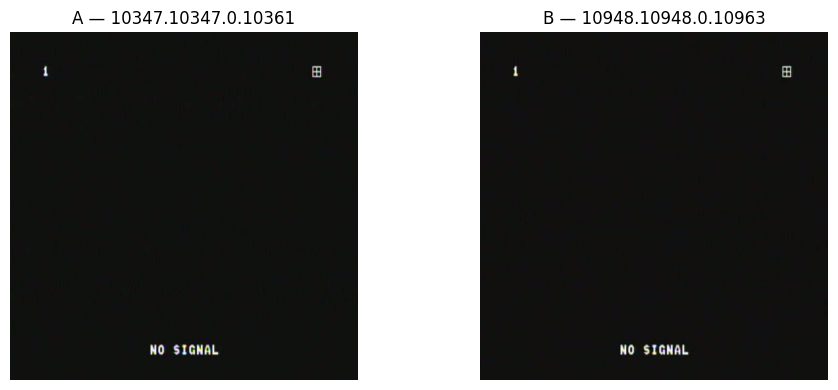


RANK #2
pHash: 9d279926997652d8
MAE: 0.166458
MSE: 0.222855
Correlation: 0.998947

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    10948.10948.0.10963
  Patient: ĐẶNG ANH KHOA
  Birth:   
  Mean:    16.67


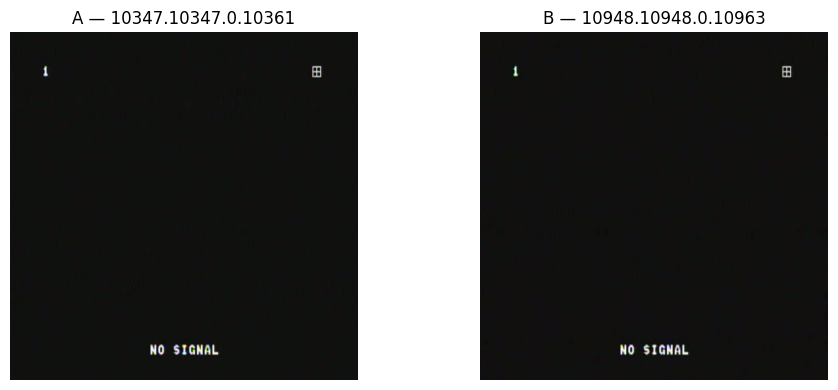


RANK #3
pHash: 9d279926997652d8
MAE: 0.241791
MSE: 0.325134
Correlation: 0.998456

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    14647.14647.0.14666
  Patient: NGUYỄN NHẤT MAI
  Birth:   
  Mean:    16.71


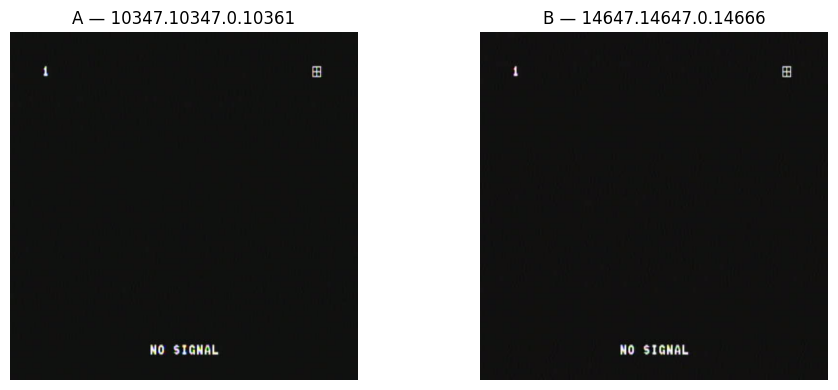


RANK #4
pHash: 9d279926997652d8
MAE: 0.274490
MSE: 0.373001
Correlation: 0.998231

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    11272.11272.0.11288
  Patient: LÊ THỊ ÁI MY
  Birth:   
  Mean:    16.70


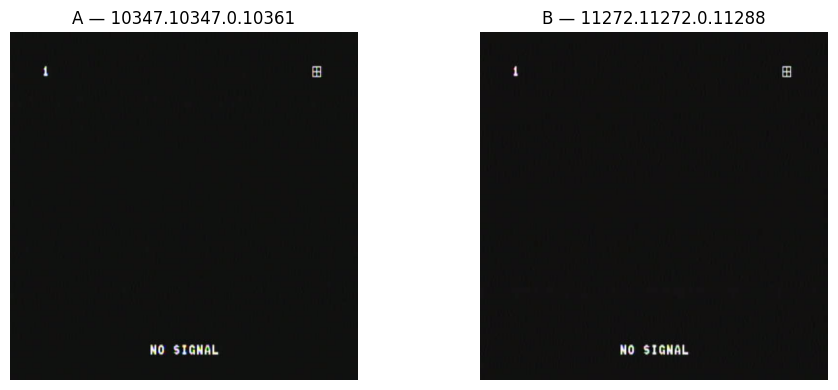


RANK #5
pHash: 9d279926997652d8
MAE: 0.369064
MSE: 0.592728
Correlation: 0.997291

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    11276.11276.0.11292
  Patient: NGUYỄN QUỐC ANH
  Birth:   
  Mean:    16.85


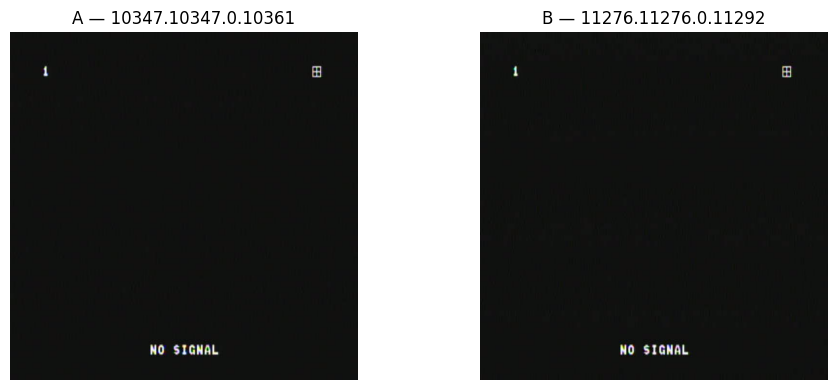


RANK #6
pHash: 9d279926997652d8
MAE: 0.399078
MSE: 0.672119
Correlation: 0.997040

CASE A
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63

CASE B
  Case:    14237.14237.0.14256
  Patient: PHẠM CHÍ HẢI
  Birth:   
  Mean:    14.82


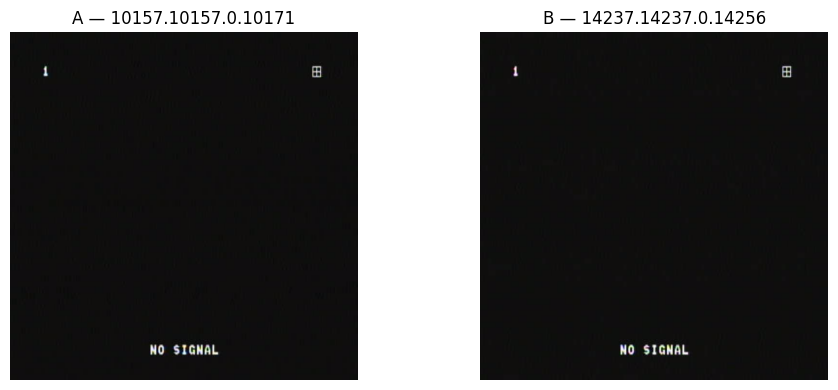


RANK #7
pHash: 9d279926997652d8
MAE: 0.455109
MSE: 0.720459
Correlation: 0.997075

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63


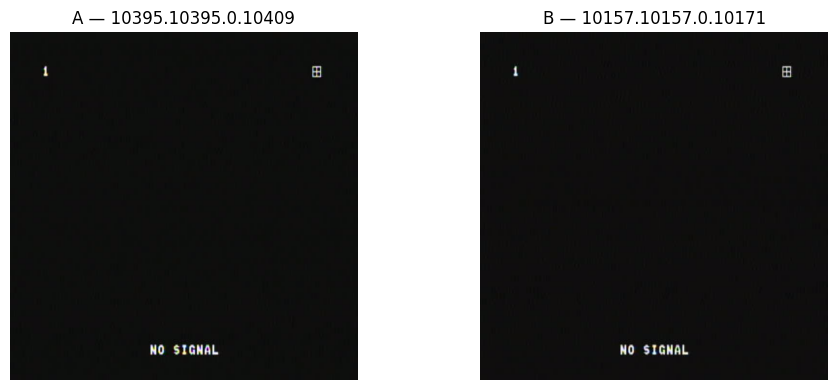


RANK #8
pHash: 9d279926997652d8
MAE: 0.455109
MSE: 0.720459
Correlation: 0.997075

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63


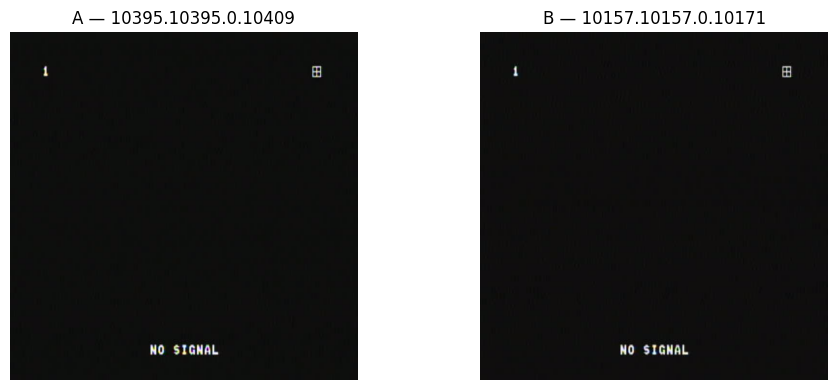


RANK #9
pHash: 9d279926997652d8
MAE: 0.460236
MSE: 0.732391
Correlation: 0.997208

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    14237.14237.0.14256
  Patient: PHẠM CHÍ HẢI
  Birth:   
  Mean:    14.82


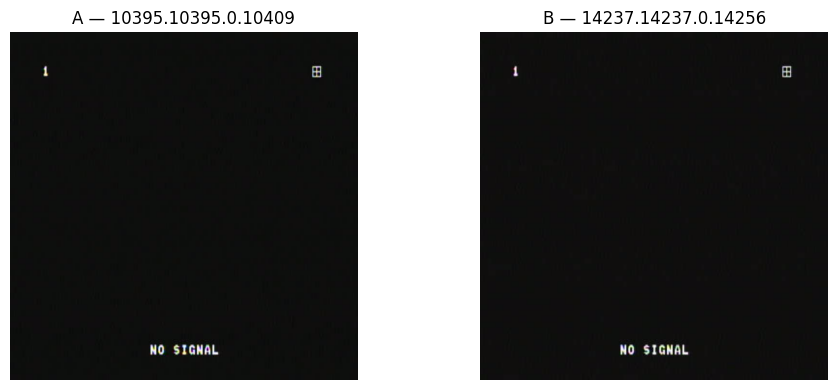


RANK #10
pHash: 9d279926997652d8
MAE: 0.460236
MSE: 0.732391
Correlation: 0.997208

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    14237.14237.0.14256
  Patient: PHẠM CHÍ HẢI
  Birth:   
  Mean:    14.82


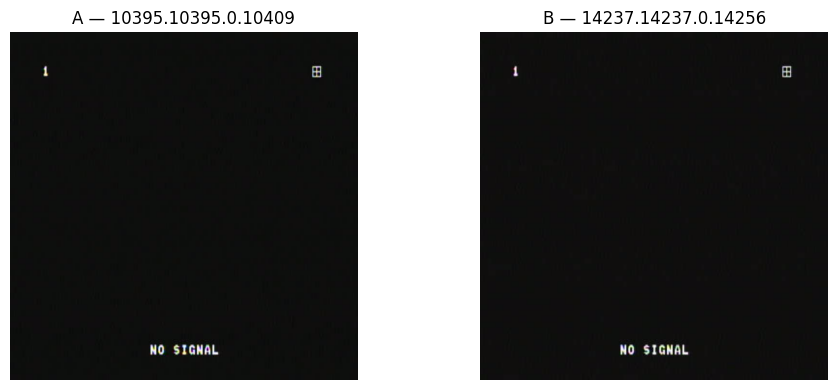


RANK #11
pHash: 9d279926997652d8
MAE: 0.642197
MSE: 1.159470
Correlation: 0.995859

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    11580.11580.0.11597
  Patient: ĐẶNG THỊ MỸ NGÂN
  Birth:   
  Mean:    16.20


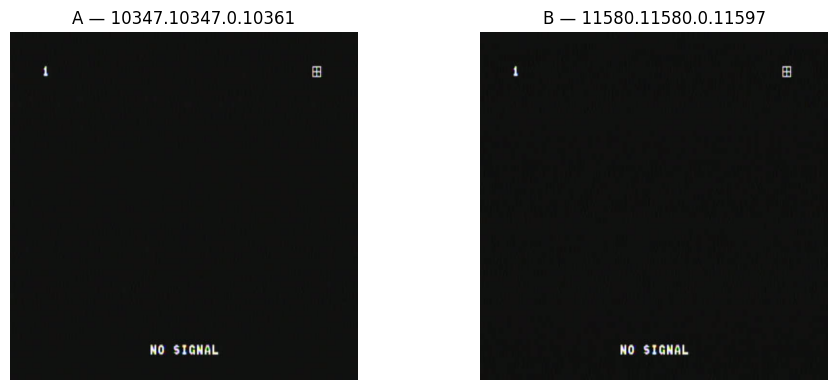


RANK #12
pHash: 9d279926997652d8
MAE: 0.900085
MSE: 1.225098
Correlation: 0.997547

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    13724.13724.0.13743
  Patient: TRẦN LÊ BẢO NGỌC
  Birth:   
  Mean:    13.65


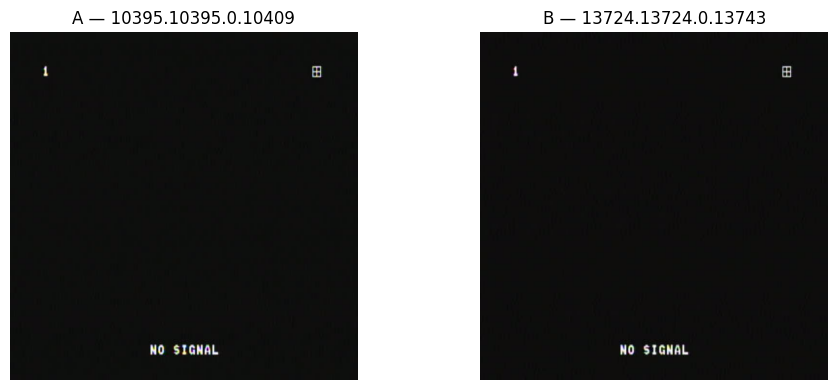


RANK #13
pHash: 9d279926997652d8
MAE: 0.900085
MSE: 1.225098
Correlation: 0.997547

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    13724.13724.0.13743
  Patient: TRẦN LÊ BẢO NGỌC
  Birth:   
  Mean:    13.65


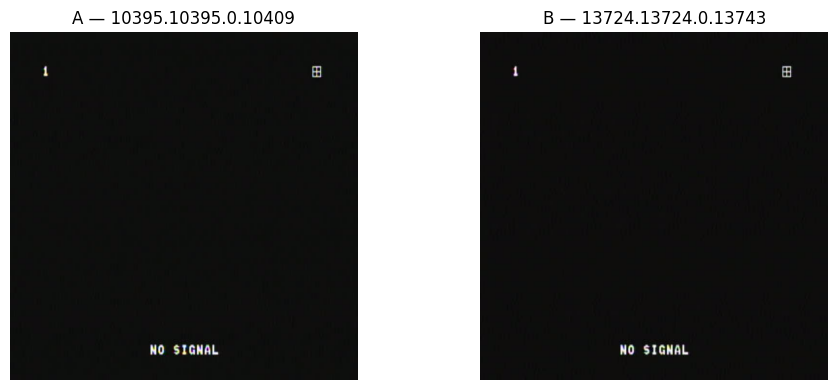


RANK #14
pHash: 9d279926997652d8
MAE: 1.021362
MSE: 1.635498
Correlation: 0.996885

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    14154.14154.0.14173
  Patient: PHẠM THỊ HỒNG TIÊN
  Birth:   
  Mean:    13.51


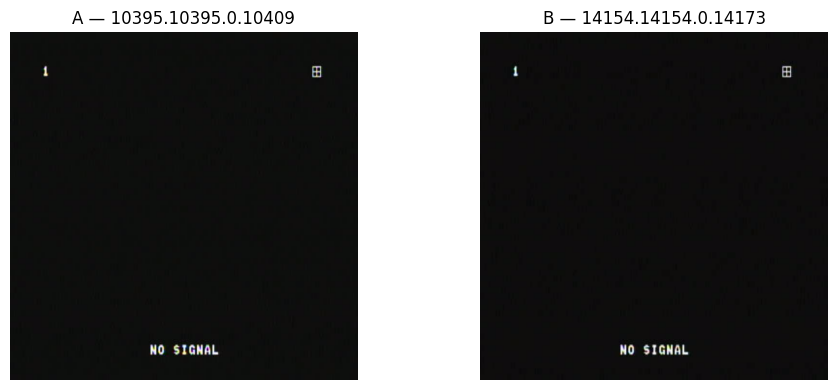


RANK #15
pHash: 9d279926997652d8
MAE: 1.021362
MSE: 1.635498
Correlation: 0.996885

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    14154.14154.0.14173
  Patient: PHẠM THỊ HỒNG TIÊN
  Birth:   
  Mean:    13.51


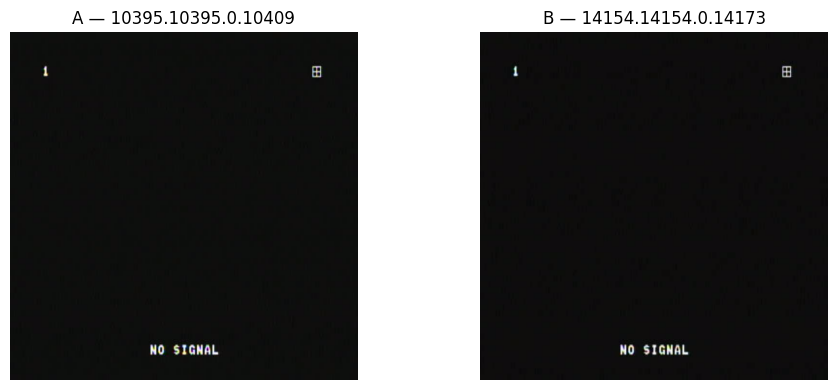


RANK #16
pHash: 9d279926997652d8
MAE: 1.071808
MSE: 1.592346
Correlation: 0.997389

CASE A
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63

CASE B
  Case:    13724.13724.0.13743
  Patient: TRẦN LÊ BẢO NGỌC
  Birth:   
  Mean:    13.65


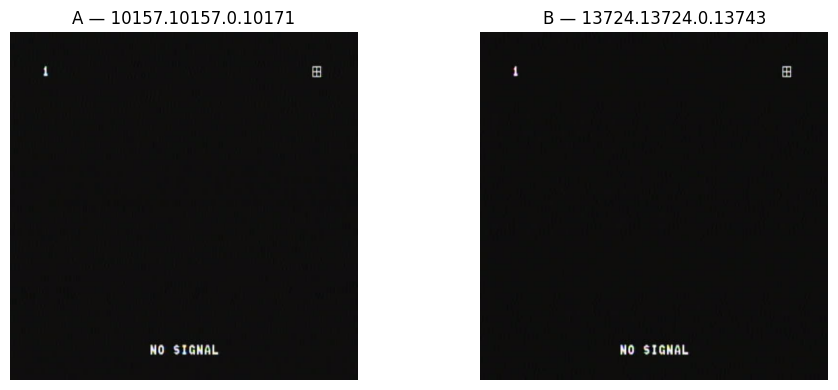


RANK #17
pHash: 9d279926997652d8
MAE: 1.184845
MSE: 1.970795
Correlation: 0.996832

CASE A
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63

CASE B
  Case:    14154.14154.0.14173
  Patient: PHẠM THỊ HỒNG TIÊN
  Birth:   
  Mean:    13.51


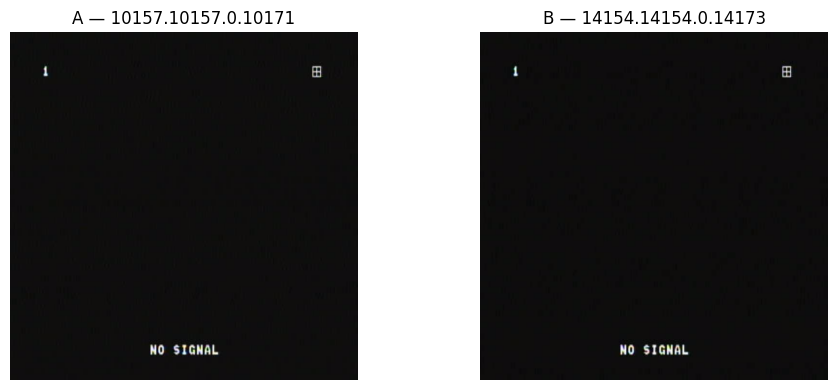


RANK #18
pHash: 9d279926997652d8
MAE: 1.613266
MSE: 3.576675
Correlation: 0.995044

CASE A
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63

CASE B
  Case:    11580.11580.0.11597
  Patient: ĐẶNG THỊ MỸ NGÂN
  Birth:   
  Mean:    16.20


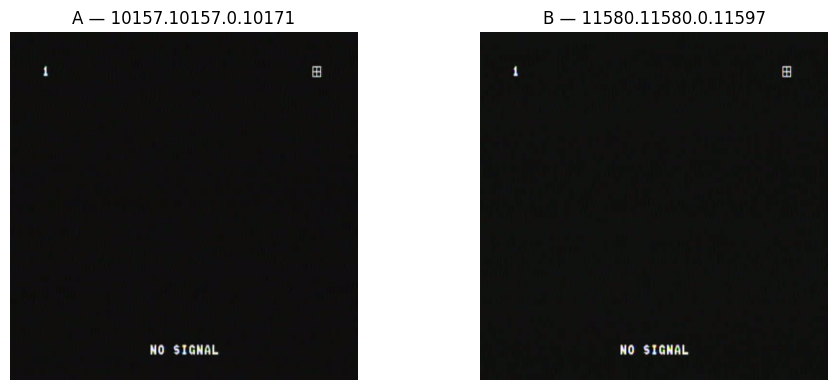


RANK #19
pHash: 9d279926997652d8
MAE: 1.756210
MSE: 4.002762
Correlation: 0.995220

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    11580.11580.0.11597
  Patient: ĐẶNG THỊ MỸ NGÂN
  Birth:   
  Mean:    16.20


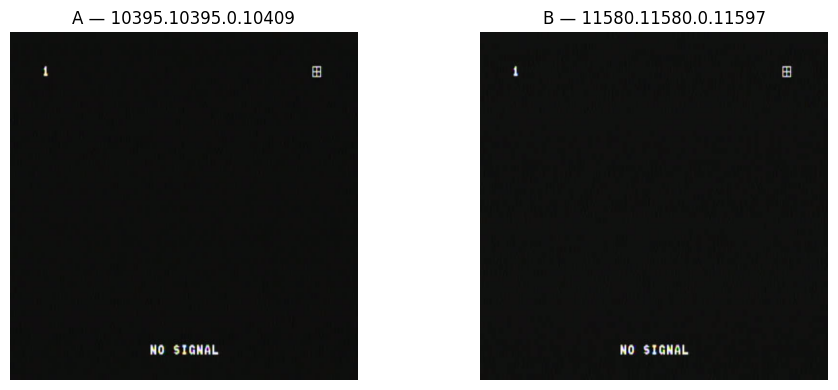


RANK #20
pHash: 9d279926997652d8
MAE: 1.756210
MSE: 4.002762
Correlation: 0.995220

CASE A
  Case:    10395.10395.0.10409
  Patient: NGUYỄN THỊ ANH THƯ
  Birth:   
  Mean:    14.47

CASE B
  Case:    11580.11580.0.11597
  Patient: ĐẶNG THỊ MỸ NGÂN
  Birth:   
  Mean:    16.20


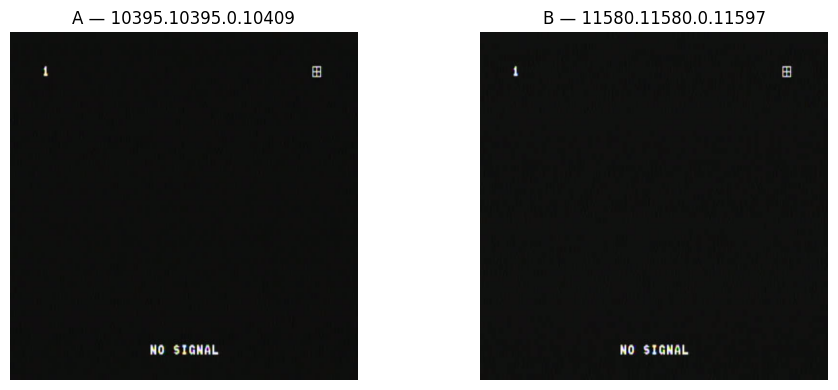


RANK #21
pHash: 99279926d97652d8
MAE: 1.803391
MSE: 3.936325
Correlation: 0.996297

CASE A
  Case:    10533.10533.0.10548
  Patient: TRẦN PHAN MINH THƯ
  Birth:   
  Mean:    11.64

CASE B
  Case:    15879.15879.0.15900
  Patient: VƯƠNG VẠN TOÀN
  Birth:   
  Mean:    9.86


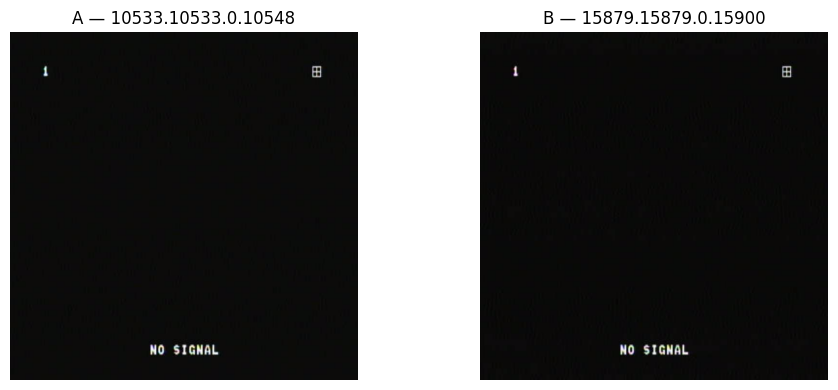


RANK #22
pHash: 9d279926997652d8
MAE: 1.804993
MSE: 3.659302
Correlation: 0.997524

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    10881.10881.0.10896
  Patient: ĐOÀN KIẾN LÂM
  Birth:   
  Mean:    18.46


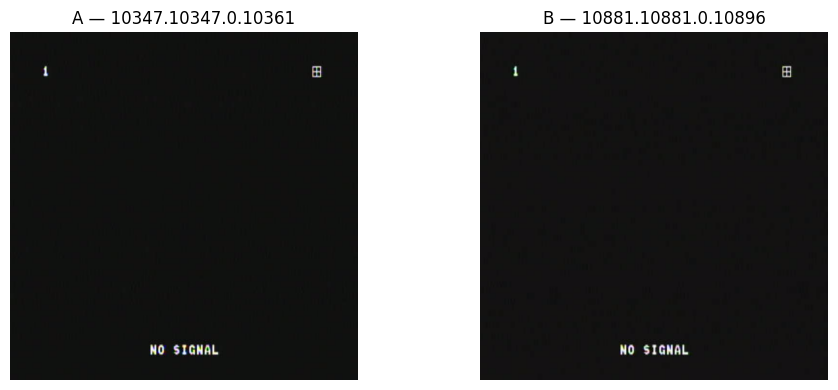


RANK #23
pHash: 9d279926997652d8
MAE: 1.869736
MSE: 3.836594
Correlation: 0.997968

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    10864.10864.0.10879
  Patient: TRẦN MINH TRANG
  Birth:   
  Mean:    18.54


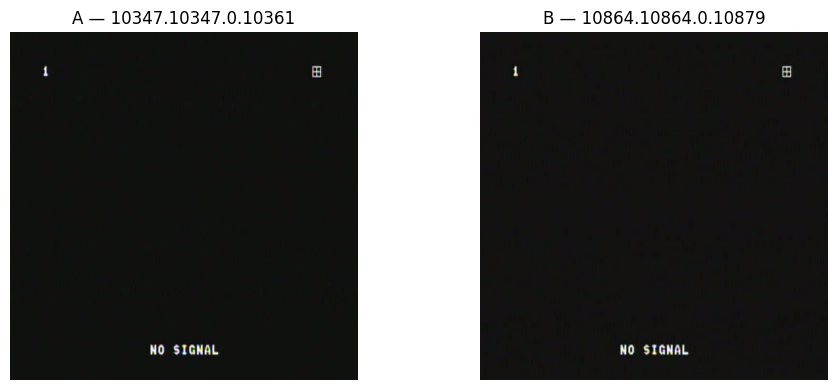


RANK #24
pHash: 9d279926997652d8
MAE: 1.880859
MSE: 3.921082
Correlation: 0.997996

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    14237.14237.0.14256
  Patient: PHẠM CHÍ HẢI
  Birth:   
  Mean:    14.82


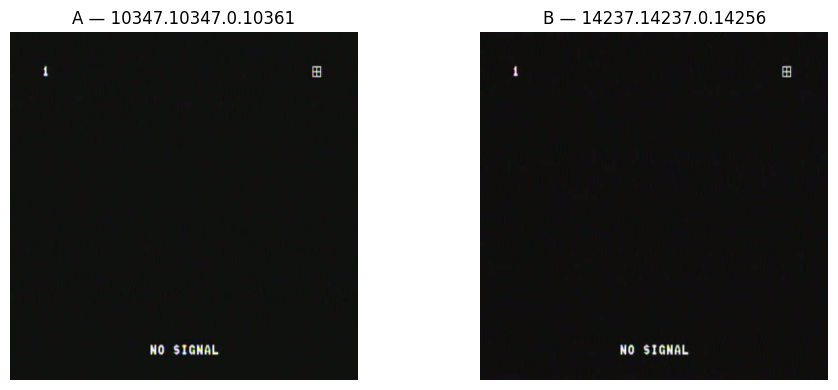


RANK #25
pHash: 99279926d97652d8
MAE: 1.969162
MSE: 4.256729
Correlation: 0.997888

CASE A
  Case:    10533.10533.0.10548
  Patient: TRẦN PHAN MINH THƯ
  Birth:   
  Mean:    11.64

CASE B
  Case:    11859.11859.0.11876
  Patient: VŨ THÁI NHẬT KHANG
  Birth:   
  Mean:    13.58


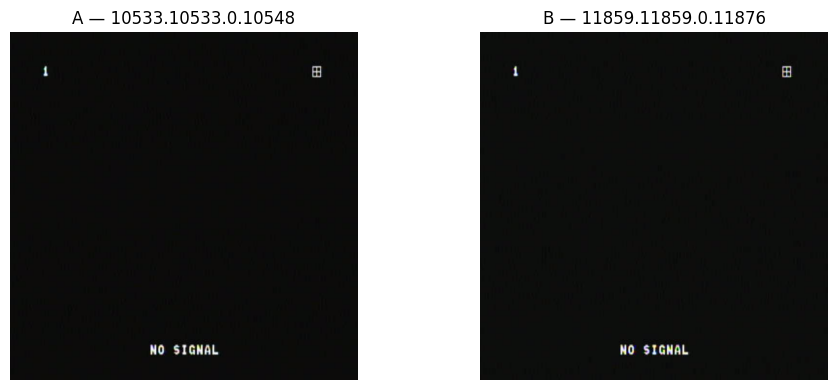


RANK #26
pHash: 9d279926997652d8
MAE: 2.035233
MSE: 4.538376
Correlation: 0.998056

CASE A
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63

CASE B
  Case:    10948.10948.0.10963
  Patient: ĐẶNG ANH KHOA
  Birth:   
  Mean:    16.67


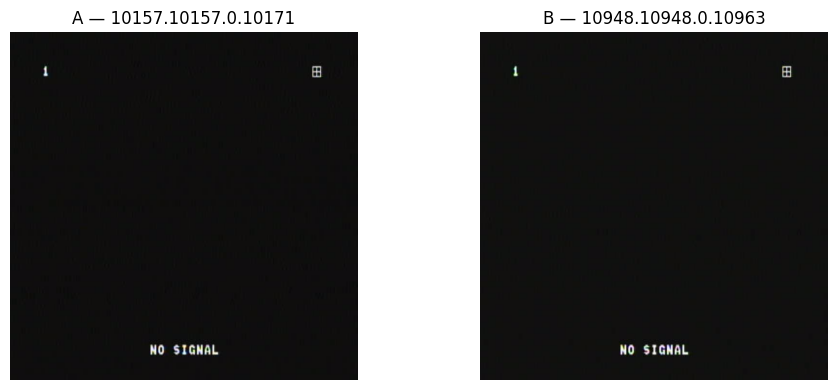


RANK #27
pHash: 9d279926997652d8
MAE: 2.045670
MSE: 4.580795
Correlation: 0.998086

CASE A
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63

CASE B
  Case:    10948.10948.0.10963
  Patient: ĐẶNG ANH KHOA
  Birth:   
  Mean:    16.68


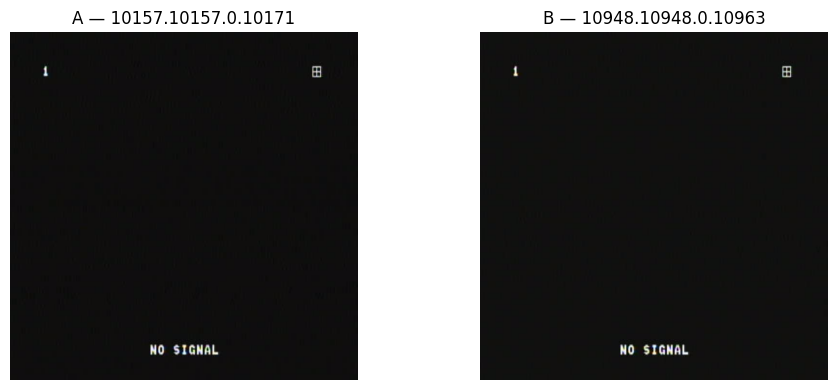


RANK #28
pHash: 9d279926997652d8
MAE: 2.061859
MSE: 4.702576
Correlation: 0.997859

CASE A
  Case:    10347.10347.0.10361
  Patient: NGUYỄN THỊ NĂM
  Birth:   
  Mean:    16.70

CASE B
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63


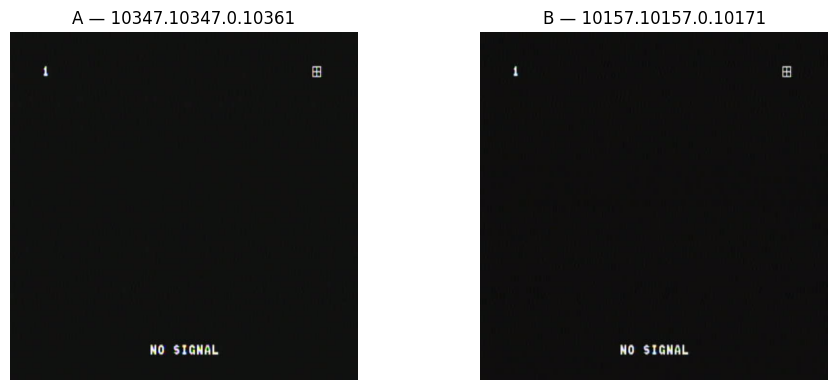


RANK #29
pHash: 9d279926997652d8
MAE: 2.064041
MSE: 4.831894
Correlation: 0.997232

CASE A
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63

CASE B
  Case:    11272.11272.0.11288
  Patient: LÊ THỊ ÁI MY
  Birth:   
  Mean:    16.70


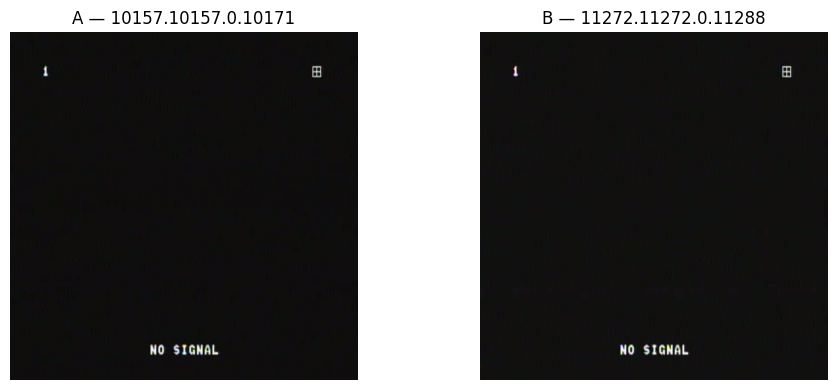


RANK #30
pHash: 9d279926997652d8
MAE: 2.070099
MSE: 4.821930
Correlation: 0.997431

CASE A
  Case:    10157.10157.0.10171
  Patient: LÊ CÔNG TRÍ
  Birth:   
  Mean:    14.63

CASE B
  Case:    14647.14647.0.14666
  Patient: NGUYỄN NHẤT MAI
  Birth:   
  Mean:    16.71


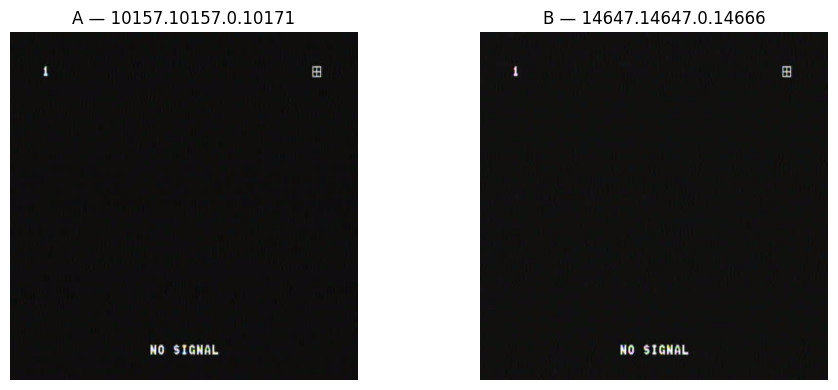


MAE DISTRIBUTION — ALL 300 SAMPLED PAIRS
MAE <=   0.5:   10 pairs
MAE <=     1:   13 pairs
MAE <=     2:   25 pairs
MAE <=     5:   81 pairs
MAE <=    10:  150 pairs
MAE <=    15:  244 pairs
MAE <=    20:  288 pairs

Saved:
/content/drive/MyDrive/NoiSoi_Matching/phash0_near_pixel_duplicate_review.csv


In [ ]:
# ============================================================
# CELL 55 — VISUAL AUDIT NEAR-PIXEL-DUPLICATES
# ============================================================

import pandas as pd
import numpy as np
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

AUDIT_FILE = BASE / "phash0_pixel_similarity_audit.csv"
OUT_FILE = BASE / "phash0_near_pixel_duplicate_review.csv"

MAX_PAIRS = 30
SIZE = (512, 512)

df = pd.read_csv(
    AUDIT_FILE,
    dtype=str
)

# ------------------------------------------------------------
# Numeric conversion
# ------------------------------------------------------------

df["mae"] = pd.to_numeric(df["mae"], errors="coerce")
df["mse"] = pd.to_numeric(df["mse"], errors="coerce")
df["pixel_correlation"] = pd.to_numeric(
    df["pixel_correlation"],
    errors="coerce"
)

# ------------------------------------------------------------
# Sort by MAE
# ------------------------------------------------------------

review = (
    df
    .dropna(subset=["mae", "pixel_correlation"])
    .sort_values(
        ["mae", "pixel_correlation"],
        ascending=[True, False]
    )
    .head(MAX_PAIRS)
    .copy()
)

# ------------------------------------------------------------
# Image loading
# ------------------------------------------------------------

def load_image(path):
    im = Image.open(path).convert("RGB")
    return im.resize(SIZE)


def mean_intensity(im):
    arr = np.asarray(im.convert("L"), dtype=np.float32)
    return float(arr.mean())


review["mean_intensity_a"] = np.nan
review["mean_intensity_b"] = np.nan

# ------------------------------------------------------------
# DISPLAY
# ------------------------------------------------------------

print("=" * 70)
print("CELL 55 — VISUAL AUDIT NEAR-PIXEL-DUPLICATES")
print("=" * 70)

print(f"Pairs available: {len(df):,}")
print(f"Pairs displayed: {len(review):,}")

for rank, (idx, row) in enumerate(
    review.iterrows(),
    start=1
):

    try:

        im_a = load_image(row["image_a"])
        im_b = load_image(row["image_b"])

        mi_a = mean_intensity(im_a)
        mi_b = mean_intensity(im_b)

        review.loc[idx, "mean_intensity_a"] = mi_a
        review.loc[idx, "mean_intensity_b"] = mi_b

        print("\n" + "=" * 70)
        print(f"RANK #{rank}")
        print("=" * 70)

        print(f"pHash: {row['phash']}")
        print(f"MAE: {row['mae']:.6f}")
        print(f"MSE: {row['mse']:.6f}")
        print(
            f"Correlation: "
            f"{row['pixel_correlation']:.6f}"
        )

        print("\nCASE A")
        print(f"  Case:    {row['case_id_a']}")
        print(f"  Patient: {row['name_a']}")
        print(f"  Birth:   {row.get('birth_a', '')}")
        print(f"  Mean:    {mi_a:.2f}")

        print("\nCASE B")
        print(f"  Case:    {row['case_id_b']}")
        print(f"  Patient: {row['name_b']}")
        print(f"  Birth:   {row.get('birth_b', '')}")
        print(f"  Mean:    {mi_b:.2f}")

        # ----------------------------------------------------
        # Side-by-side
        # ----------------------------------------------------

        fig, axes = plt.subplots(1, 2, figsize=(10, 4))

        axes[0].imshow(im_a)
        axes[0].set_title(
            f"A — {row['case_id_a']}"
        )
        axes[0].axis("off")

        axes[1].imshow(im_b)
        axes[1].set_title(
            f"B — {row['case_id_b']}"
        )
        axes[1].axis("off")

        plt.tight_layout()
        plt.show()

    except Exception as e:

        print("ERROR:", e)

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

review.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

# ------------------------------------------------------------
# DISTRIBUTION
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("MAE DISTRIBUTION — ALL 300 SAMPLED PAIRS")
print("=" * 70)

for threshold in [0.5, 1, 2, 5, 10, 15, 20]:

    n = (df["mae"] <= threshold).sum()

    print(
        f"MAE <= {threshold:>5}: "
        f"{n:>4} pairs"
    )

print("\nSaved:")
print(OUT_FILE)

In [ ]:
# ============================================================
# CELL 56 — BLACK / NO-SIGNAL IMAGE DETECTION
# ============================================================

import pandas as pd
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.auto import tqdm
import os

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

PHASH_FILE = BASE / "original_image_phash.csv"
OUT_FILE = BASE / "image_black_screen_metrics.csv"
CHECKPOINT = BASE / "image_black_screen_metrics_checkpoint.csv"

# ------------------------------------------------------------
# SETTINGS
# ------------------------------------------------------------

RESIZE = (128, 128)
CHECKPOINT_EVERY = 1000

# ------------------------------------------------------------
# LOAD PHASH INDEX
# ------------------------------------------------------------

phash = pd.read_csv(
    PHASH_FILE,
    dtype=str
)

phash = phash[
    phash["status"].astype(str).str.lower().eq("success")
].copy()

phash["image_path"] = phash["image_path"].astype(str)

print("=" * 70)
print("CELL 56 — BLACK / NO-SIGNAL IMAGE DETECTION")
print("=" * 70)

print(f"Usable images: {len(phash):,}")

# ------------------------------------------------------------
# RESUME
# ------------------------------------------------------------

if CHECKPOINT.exists():

    ckpt = pd.read_csv(
        CHECKPOINT,
        dtype={
            "image_path": str
        }
    )

    processed = set(
        ckpt["image_path"].astype(str)
    )

    rows = ckpt.to_dict("records")

    print(
        f"Checkpoint rows: {len(rows):,}"
    )

else:

    processed = set()
    rows = []

    print("No checkpoint found. Starting fresh.")

# ------------------------------------------------------------
# METRICS
# ------------------------------------------------------------

def image_metrics(path):

    try:

        im = Image.open(path).convert("L")
        im = im.resize(RESIZE)

        arr = np.asarray(
            im,
            dtype=np.float32
        )

        mean_gray = float(arr.mean())
        std_gray = float(arr.std())

        dark_fraction = float(
            np.mean(arr <= 20)
        )

        bright_fraction = float(
            np.mean(arr >= 220)
        )

        # Fraction of almost-black pixels
        very_dark_fraction = float(
            np.mean(arr <= 5)
        )

        return {
            "image_path": path,
            "mean_gray": mean_gray,
            "std_gray": std_gray,
            "dark_fraction": dark_fraction,
            "very_dark_fraction": very_dark_fraction,
            "bright_fraction": bright_fraction,
            "status": "success",
            "error": ""
        }

    except Exception as e:

        return {
            "image_path": path,
            "mean_gray": np.nan,
            "std_gray": np.nan,
            "dark_fraction": np.nan,
            "very_dark_fraction": np.nan,
            "bright_fraction": np.nan,
            "status": "error",
            "error": str(e)
        }

# ------------------------------------------------------------
# PROCESS
# ------------------------------------------------------------

remaining = phash[
    ~phash["image_path"].isin(processed)
].copy()

print(
    f"Already processed: {len(processed):,}"
)

print(
    f"Remaining:         {len(remaining):,}"
)

for n, path in enumerate(
    tqdm(
        remaining["image_path"],
        total=len(remaining)
    ),
    start=1
):

    rows.append(
        image_metrics(path)
    )

    if n % CHECKPOINT_EVERY == 0:

        tmp = pd.DataFrame(rows)

        tmp.to_csv(
            CHECKPOINT,
            index=False,
            encoding="utf-8-sig"
        )

# ------------------------------------------------------------
# FINAL SAVE
# ------------------------------------------------------------

metrics = pd.DataFrame(rows)

metrics.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

# Also update checkpoint
metrics.to_csv(
    CHECKPOINT,
    index=False,
    encoding="utf-8-sig"
)

# ------------------------------------------------------------
# SUMMARY
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("SUMMARY")
print("=" * 70)

print(
    f"Total metric rows: {len(metrics):,}"
)

print(
    f"Success: "
    f"{(metrics['status'] == 'success').sum():,}"
)

print(
    f"Errors: "
    f"{(metrics['status'] == 'error').sum():,}"
)

print("\nMetric distribution:")

display(
    metrics[
        [
            "mean_gray",
            "std_gray",
            "dark_fraction",
            "very_dark_fraction",
            "bright_fraction"
        ]
    ].describe()
)

print("\nLowest mean_gray images:")

display(
    metrics
    .sort_values("mean_gray")
    .head(30)
)

print("\nSaved:")
print(OUT_FILE)
print(CHECKPOINT)

CELL 56 — BLACK / NO-SIGNAL IMAGE DETECTION
Usable images: 81,784
No checkpoint found. Starting fresh.
Already processed: 0
Remaining:         81,784


  0%|          | 0/81784 [00:00<?, ?it/s]


SUMMARY
Total metric rows: 81,784
Success: 81,784
Errors: 0

Metric distribution:


,mean_gray,std_gray,dark_fraction,very_dark_fraction,bright_fraction
count,81784.000000,81784.000000,81784.000000,81784.000000,81784.000000
mean,80.065252,69.885437,0.080393,0.001794,0.058580
std,10.415122,8.918135,0.059274,0.027357,0.037807
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,74.520889,66.902344,0.069336,0.000000,0.032471
50%,79.929413,70.542645,0.081848,0.000000,0.054504
75%,85.898590,74.685852,0.087952,0.000000,0.078918
max,232.300171,108.275467,1.000000,1.000000,0.753113



Lowest mean_gray images:


,image_path,mean_gray,std_gray,dark_fraction,very_dark_fraction,bright_fraction,status,error
65557,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,
65046,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,
43157,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,
44397,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,
65047,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,
64805,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,
64804,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,
44213,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,
57100,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,
15578,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,



Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_black_screen_metrics.csv
/content/drive/MyDrive/NoiSoi_Matching/image_black_screen_metrics_checkpoint.csv


In [ ]:
# ============================================================
# CELL 57 — FLAG BLACK / NO-SIGNAL IMAGES
# ============================================================

import pandas as pd
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

METRICS_FILE = BASE / "image_black_screen_metrics.csv"
OUT_FILE = BASE / "image_black_screen_flags.csv"

# ------------------------------------------------------------
# SETTINGS
# ------------------------------------------------------------

MEAN_THRESHOLD = 10.0
DARK_THRESHOLD = 0.95

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

df = pd.read_csv(
    METRICS_FILE,
    dtype={"image_path": str}
)

print("=" * 70)
print("CELL 57 — BLACK / NO-SIGNAL FLAGGING")
print("=" * 70)

print(f"Total images: {len(df):,}")

# ------------------------------------------------------------
# FLAG
# ------------------------------------------------------------

df["is_black_screen"] = (
    (df["mean_gray"] <= MEAN_THRESHOLD)
    &
    (df["dark_fraction"] >= DARK_THRESHOLD)
)

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

df.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

# ------------------------------------------------------------
# SUMMARY
# ------------------------------------------------------------

n_black = int(df["is_black_screen"].sum())
n_normal = len(df) - n_black

print("\n" + "=" * 70)
print("SUMMARY")
print("=" * 70)

print(f"Black/no-signal candidates: {n_black:,}")
print(f"Remaining images:           {n_normal:,}")

print(
    f"Black-screen percentage: "
    f"{100*n_black/len(df):.2f}%"
)

print("\nBlack-screen metric distribution:")

display(
    df[df["is_black_screen"]][
        [
            "mean_gray",
            "std_gray",
            "dark_fraction",
            "very_dark_fraction",
            "bright_fraction"
        ]
    ].describe()
)

print("\nLowest 30 black-screen candidates:")

display(
    df[df["is_black_screen"]]
    .sort_values(
        ["mean_gray", "dark_fraction"]
    )
    .head(30)
)

print("\nSaved:")
print(OUT_FILE)

CELL 57 — BLACK / NO-SIGNAL FLAGGING
Total images: 81,784

SUMMARY
Black/no-signal candidates: 106
Remaining images:           81,678
Black-screen percentage: 0.13%

Black-screen metric distribution:


,mean_gray,std_gray,dark_fraction,very_dark_fraction,bright_fraction
count,106.000000,106.000000,106.000000,106.000000,106.000000
mean,5.071652,7.232666,0.994312,0.548471,0.000019
std,3.176420,3.830374,0.003010,0.425469,0.000042
min,0.000000,0.000000,0.992371,0.001038,0.000000
25%,3.313583,8.892441,0.992737,0.040268,0.000000
50%,5.486420,9.134906,0.992798,0.781525,0.000000
75%,7.263565,9.377296,0.992859,0.924286,0.000000
max,9.978088,9.830564,1.000000,1.000000,0.000122



Lowest 30 black-screen candidates:


,image_path,mean_gray,std_gray,dark_fraction,very_dark_fraction,bright_fraction,status,error,is_black_screen
15578,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True
15579,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True
15580,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True
35765,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True
43157,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True
43330,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True
44213,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True
44397,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True
57100,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True
64365,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,0.000000,0.000000,1.000000,1.000000,0.0,success,NaN,True



Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_black_screen_flags.csv


In [ ]:
# ============================================================
# CELL 58 — CLEAN IMAGE-LEVEL AUDIT TABLE
# ============================================================

import pandas as pd
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

PHASH_FILE = BASE / "original_image_phash.csv"
BLACK_FILE = BASE / "image_black_screen_flags.csv"
CASE_FILE = BASE / "dataset_v1_2_cases_final_clean.csv"

OUT_FILE = BASE / "image_audit_master.csv"

# ============================================================
# LOAD
# ============================================================

phash = pd.read_csv(
    PHASH_FILE,
    dtype=str
)

black = pd.read_csv(
    BLACK_FILE,
    dtype=str
)

cases = pd.read_csv(
    CASE_FILE,
    dtype=str
)

print("=" * 70)
print("CELL 58 — CLEAN IMAGE-LEVEL AUDIT TABLE")
print("=" * 70)

print(f"pHash rows:       {len(phash):,}")
print(f"Black metric rows:{len(black):,}")
print(f"Case rows:        {len(cases):,}")

# ============================================================
# EXTRACT CASE ID FROM IMAGE PATH
# ============================================================

def extract_case_id(path):
    parts = str(path).replace("\\", "/").split("/")

    # Find folder containing the case ID
    # Actual structure:
    # .../ImageLocal/<parent>/<case_id>/<image>
    for i, p in enumerate(parts):
        if p == "ImageLocal" and i + 2 < len(parts):
            return parts[i + 2]

    return None


phash["case_id"] = phash["image_path"].map(
    extract_case_id
)

# ============================================================
# KEEP ONLY SUCCESSFUL PHASH
# ============================================================

phash = phash[
    phash["status"].astype(str).str.lower().eq("success")
].copy()

# ============================================================
# MERGE CASE INFORMATION
# ============================================================

case_cols = [
    "case_id",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh_clean",
    "patient_group_id",
]

cases_small = cases[case_cols].drop_duplicates(
    subset=["case_id"]
)

df = phash.merge(
    cases_small,
    on="case_id",
    how="inner",
    validate="many_to_one"
)

print("\nAfter case merge:")
print(f"Rows:          {len(df):,}")
print(f"Unique cases:  {df['case_id'].nunique():,}")
print(
    f"Unique patients: "
    f"{df['patient_group_id'].nunique():,}"
)

# ============================================================
# MERGE BLACK-SCREEN FLAG
# ============================================================

black_small = black[
    [
        "image_path",
        "mean_gray",
        "std_gray",
        "dark_fraction",
        "very_dark_fraction",
        "bright_fraction",
        "is_black_screen",
    ]
].drop_duplicates(
    subset=["image_path"]
)

df = df.merge(
    black_small,
    on="image_path",
    how="left",
    validate="one_to_one"
)

# Missing flag = False
df["is_black_screen"] = (
    df["is_black_screen"]
    .fillna(False)
    .astype(bool)
)

# ============================================================
# NORMAL ENDOSCOPY SUBSET
# ============================================================

normal = df[
    ~df["is_black_screen"]
].copy()

# ============================================================
# SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("FINAL IMAGE AUDIT SUMMARY")
print("=" * 70)

print(f"Master rows:             {len(df):,}")
print(f"Normal rows:             {len(normal):,}")
print(f"Black-screen rows:       {df['is_black_screen'].sum():,}")

print(
    f"Normal cases:            "
    f"{normal['case_id'].nunique():,}"
)

print(
    f"Normal patients:         "
    f"{normal['patient_group_id'].nunique():,}"
)

print(
    f"Cases containing normal images: "
    f"{normal['case_id'].nunique():,}"
)

print("\nBlack-screen by patient count:")
print(
    df[df["is_black_screen"]]
    ["patient_group_id"]
    .nunique()
)

# ============================================================
# SAVE MASTER
# ============================================================

df.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

print("\nSaved:")
print(OUT_FILE)

CELL 58 — CLEAN IMAGE-LEVEL AUDIT TABLE
pHash rows:       81,786
Black metric rows:81,784
Case rows:        7,607

After case merge:
Rows:          0
Unique cases:  0
Unique patients: 0

FINAL IMAGE AUDIT SUMMARY
Master rows:             0
Normal rows:             0
Black-screen rows:       0
Normal cases:            0
Normal patients:         0
Cases containing normal images: 0

Black-screen by patient count:
0

Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_audit_master.csv


In [ ]:
# ============================================================
# CELL 58 — CLEAN IMAGE-LEVEL AUDIT TABLE
# FIXED CASE_ID EXTRACTION
# ============================================================

import pandas as pd
from pathlib import Path
import re

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

PHASH_FILE = BASE / "original_image_phash.csv"
BLACK_FILE = BASE / "image_black_screen_flags.csv"
CASE_FILE = BASE / "dataset_v1_2_cases_final_clean.csv"

OUT_FILE = BASE / "image_audit_master.csv"

# ============================================================
# 1. LOAD
# ============================================================

phash = pd.read_csv(PHASH_FILE, dtype=str)
black = pd.read_csv(BLACK_FILE, dtype=str)
cases = pd.read_csv(CASE_FILE, dtype=str)

print("=" * 70)
print("CELL 58 — CLEAN IMAGE-LEVEL AUDIT TABLE")
print("=" * 70)

print(f"pHash rows:        {len(phash):,}")
print(f"Black metric rows: {len(black):,}")
print(f"Case rows:         {len(cases):,}")

# ============================================================
# 2. EXTRACT CASE_ID
#
# Actual structure:
#
# ImageLocal/
#   parent_folder/
#       case_id/
#           image.jpg
#
# Therefore case_id = parts[-2]
# ============================================================

def extract_case_id(path):
    parts = Path(str(path)).parts

    if len(parts) < 2:
        return None

    case_id = parts[-2]

    # Verify expected case_id structure
    if re.fullmatch(r"\d+\.\d+\.0\.\d+", case_id):
        return case_id

    return None


phash["case_id"] = phash["image_path"].map(
    extract_case_id
)

print(
    "\nExtracted case_id:",
    phash["case_id"].notna().sum(),
    "/",
    len(phash)
)

# ============================================================
# 3. KEEP SUCCESSFUL PHASH
# ============================================================

phash = phash[
    phash["status"].astype(str).str.lower().eq("success")
].copy()

# ============================================================
# 4. CASE INFORMATION
# ============================================================

case_cols = [
    "case_id",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh_clean",
    "patient_group_id",
]

cases_small = (
    cases[case_cols]
    .drop_duplicates("case_id")
)

# ============================================================
# 5. MERGE CASE
# ============================================================

df = phash.merge(
    cases_small,
    on="case_id",
    how="inner",
    validate="many_to_one"
)

print("\n" + "=" * 70)
print("AFTER CASE MERGE")
print("=" * 70)

print(f"Rows:            {len(df):,}")
print(f"Unique cases:    {df['case_id'].nunique():,}")
print(
    f"Unique patients: "
    f"{df['patient_group_id'].nunique():,}"
)

# ============================================================
# SAFETY CHECK
# ============================================================

if len(df) == 0:
    raise RuntimeError(
        "Case merge vẫn trả về 0 rows. "
        "Dừng lại để kiểm tra schema, không tiếp tục."
    )

# ============================================================
# 6. MERGE BLACK-SCREEN METRICS
# ============================================================

black_small = (
    black[
        [
            "image_path",
            "mean_gray",
            "std_gray",
            "dark_fraction",
            "very_dark_fraction",
            "bright_fraction",
            "is_black_screen",
        ]
    ]
    .drop_duplicates("image_path")
)

df = df.merge(
    black_small,
    on="image_path",
    how="left",
    validate="one_to_one"
)

# Missing flag = False
df["is_black_screen"] = (
    df["is_black_screen"]
    .fillna(False)
    .astype(bool)
)

# ============================================================
# 7. NORMAL SUBSET
# ============================================================

normal = df[
    ~df["is_black_screen"]
].copy()

# ============================================================
# 8. SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("FINAL IMAGE AUDIT SUMMARY")
print("=" * 70)

print(f"Master rows:             {len(df):,}")
print(
    f"Normal rows:             "
    f"{len(normal):,}"
)
print(
    f"Black-screen rows:       "
    f"{int(df['is_black_screen'].sum()):,}"
)

print(
    f"Normal cases:            "
    f"{normal['case_id'].nunique():,}"
)

print(
    f"Normal patients:         "
    f"{normal['patient_group_id'].nunique():,}"
)

print(
    f"Cases containing normal images: "
    f"{normal['case_id'].nunique():,}"
)

# ============================================================
# 9. BLACK SCREEN PATIENT / CASE SUMMARY
# ============================================================

black_df = df[df["is_black_screen"]].copy()

print("\nBlack-screen cases:")
print(
    black_df["case_id"].nunique()
)

print("\nBlack-screen patients:")
print(
    black_df["patient_group_id"].nunique()
)

# ============================================================
# 10. SAVE
# ============================================================

df.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

print("\nSaved:")
print(OUT_FILE)

CELL 58 — CLEAN IMAGE-LEVEL AUDIT TABLE
pHash rows:        81,786
Black metric rows: 81,784
Case rows:         7,607

Extracted case_id: 81786 / 81786

AFTER CASE MERGE
Rows:            76,403
Unique cases:    7,607
Unique patients: 3,072

FINAL IMAGE AUDIT SUMMARY
Master rows:             76,403
Normal rows:             0
Black-screen rows:       76,403
Normal cases:            0
Normal patients:         0
Cases containing normal images: 0

Black-screen cases:
7607

Black-screen patients:
3072

Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_audit_master.csv


In [ ]:
# ======================================================================
# CELL 58B — FIX IMAGE-LEVEL AUDIT TABLE
# ======================================================================

import pandas as pd
from pathlib import Path
import re

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

PHASH_FILE = BASE / "original_image_phash.csv"
BLACK_FILE = BASE / "image_black_screen_flags.csv"
CASE_FILE = BASE / "dataset_v1_2_cases_final_clean.csv"
OUT_FILE = BASE / "image_audit_master.csv"


# ----------------------------------------------------------------------
# 1. LOAD
# ----------------------------------------------------------------------

phash = pd.read_csv(PHASH_FILE)
black = pd.read_csv(BLACK_FILE)
cases = pd.read_csv(CASE_FILE)

print("=" * 70)
print("INPUT")
print("=" * 70)
print(f"pHash rows:        {len(phash):,}")
print(f"Black flag rows:   {len(black):,}")
print(f"Case rows:         {len(cases):,}")

print("\nBlack flag columns:")
print(black.columns.tolist())


# ----------------------------------------------------------------------
# 2. EXTRACT CASE ID
# ----------------------------------------------------------------------

def extract_case_id(path):
    parts = Path(str(path)).parts

    # Actual structure:
    # ... / ImageLocal / ImageLocal / parent_folder / case_id / image.jpg
    if len(parts) >= 2:
        candidate = parts[-2]

        if re.fullmatch(r"\d+\.\d+\.0\.\d+", candidate):
            return candidate

    return None


phash["case_id"] = phash["image_path"].map(extract_case_id)

print("\n" + "=" * 70)
print("CASE ID EXTRACTION")
print("=" * 70)
print(
    f"Extracted case_id: "
    f"{phash['case_id'].notna().sum():,} / {len(phash):,}"
)


# ----------------------------------------------------------------------
# 3. KEEP ONLY SUCCESSFUL PHASH ROWS
# ----------------------------------------------------------------------

phash_ok = phash[
    phash["status"].astype(str).str.lower().eq("success")
].copy()

print(f"Successful pHash rows: {len(phash_ok):,}")


# ----------------------------------------------------------------------
# 4. PREPARE CASE INFORMATION
# ----------------------------------------------------------------------

case_cols = [
    "case_id",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh_clean",
    "patient_group_id",
]

case_info = cases[case_cols].drop_duplicates("case_id").copy()


# ----------------------------------------------------------------------
# 5. MERGE CASE INFO
# ----------------------------------------------------------------------

master = phash_ok.merge(
    case_info,
    on="case_id",
    how="inner",
    validate="many_to_one",
)

print("\n" + "=" * 70)
print("AFTER CASE MERGE")
print("=" * 70)
print(f"Rows:            {len(master):,}")
print(f"Unique cases:    {master['case_id'].nunique():,}")
print(f"Unique patients: {master['patient_group_id'].nunique():,}")


# ----------------------------------------------------------------------
# 6. PREPARE BLACK-SCREEN FLAGS
#
# IMPORTANT:
# Only images explicitly flagged by Cell 57 are True.
# Everything else is False.
# ----------------------------------------------------------------------

print("\nBlack flag columns:")
print(black.columns.tolist())

# Find image path column
black_path_col = "image_path"

if black_path_col not in black.columns:
    raise ValueError(
        f"Cannot find '{black_path_col}' in black-screen file."
    )

# Find the actual boolean flag column
possible_flag_cols = [
    "is_black_screen",
    "black_screen",
    "black_flag",
    "is_black",
]

flag_col = next(
    (c for c in possible_flag_cols if c in black.columns),
    None
)

if flag_col is None:
    raise ValueError(
        "Cannot find black-screen flag column. "
        f"Available columns: {black.columns.tolist()}"
    )

print(f"Using black-screen flag column: {flag_col}")


# Keep only the information needed
black_flags = black[
    [black_path_col, flag_col]
].copy()

black_flags = black_flags.rename(
    columns={flag_col: "is_black_screen"}
)

# Remove duplicate image paths if any
black_flags = black_flags.drop_duplicates(
    subset=["image_path"]
)

# Force strict boolean
black_flags["is_black_screen"] = (
    black_flags["is_black_screen"]
    .astype(str)
    .str.strip()
    .str.lower()
    .isin(["true", "1", "yes"])
)


# ----------------------------------------------------------------------
# 7. MERGE BLACK FLAGS
# ----------------------------------------------------------------------

master = master.merge(
    black_flags,
    on="image_path",
    how="left",
    validate="one_to_one",
)

# CRITICAL:
# Missing flag = NOT black.
master["is_black_screen"] = (
    master["is_black_screen"]
    .fillna(False)
    .astype(bool)
)


# ----------------------------------------------------------------------
# 8. FINAL SUMMARY
# ----------------------------------------------------------------------

normal = master[~master["is_black_screen"]].copy()
black_rows = master[master["is_black_screen"]].copy()

print("\n" + "=" * 70)
print("FINAL IMAGE AUDIT SUMMARY")
print("=" * 70)

print(f"Master rows:             {len(master):,}")
print(f"Normal rows:             {len(normal):,}")
print(f"Black-screen rows:       {len(black_rows):,}")

print(f"Normal cases:            {normal['case_id'].nunique():,}")
print(f"Normal patients:         {normal['patient_group_id'].nunique():,}")

print(
    f"Cases containing normal images: "
    f"{normal['case_id'].nunique():,}"
)

print(
    f"Black-screen cases:      "
    f"{black_rows['case_id'].nunique():,}"
)

print(
    f"Black-screen patients:   "
    f"{black_rows['patient_group_id'].nunique():,}"
)


# ----------------------------------------------------------------------
# 9. SANITY CHECK
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("SANITY CHECK")
print("=" * 70)

black_pct = len(black_rows) / len(master) * 100

print(f"Black-screen percentage: {black_pct:.3f}%")

if len(black_rows) > 200:
    print("⚠️ WARNING: unexpectedly many black-screen images.")

elif len(black_rows) <= 106:
    print("✅ Black-screen count is consistent with Cell 57.")

else:
    print(
        "⚠️ Black-screen count exceeds the 106-image Cell 57 "
        "candidate count. Please inspect."
    )


# ----------------------------------------------------------------------
# 10. SAVE
# ----------------------------------------------------------------------

master.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

print("\nSaved:")
print(OUT_FILE)

/tmp/ipykernel_636/194227419.py:21: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  phash = pd.read_csv(PHASH_FILE)


INPUT
pHash rows:        81,786
Black flag rows:   81,784
Case rows:         7,607

Black flag columns:
['image_path', 'mean_gray', 'std_gray', 'dark_fraction', 'very_dark_fraction', 'bright_fraction', 'status', 'error', 'is_black_screen']

CASE ID EXTRACTION
Extracted case_id: 81,786 / 81,786
Successful pHash rows: 81,784

AFTER CASE MERGE
Rows:            76,403
Unique cases:    7,607
Unique patients: 3,072

Black flag columns:
['image_path', 'mean_gray', 'std_gray', 'dark_fraction', 'very_dark_fraction', 'bright_fraction', 'status', 'error', 'is_black_screen']
Using black-screen flag column: is_black_screen

FINAL IMAGE AUDIT SUMMARY
Master rows:             76,403
Normal rows:             76,328
Black-screen rows:       75
Normal cases:            7,607
Normal patients:         3,072
Cases containing normal images: 7,607
Black-screen cases:      54
Black-screen patients:   53

SANITY CHECK
Black-screen percentage: 0.098%
✅ Black-screen count is consistent with Cell 57.

Saved:
/con

In [ ]:
# ======================================================================
# CELL 59 — NORMAL IMAGE CROSS-PATIENT pHash = 0 AUDIT
# ======================================================================

import pandas as pd
import numpy as np
from pathlib import Path
from collections import defaultdict

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

MASTER_FILE = BASE / "image_audit_master.csv"
OUT_FILE = BASE / "normal_phash0_cross_patient_audit.csv"


# ----------------------------------------------------------------------
# 1. LOAD MASTER AUDIT TABLE
# ----------------------------------------------------------------------

master = pd.read_csv(
    MASTER_FILE,
    low_memory=False
)

print("=" * 70)
print("LOAD")
print("=" * 70)

print(f"Master rows: {len(master):,}")

# Keep only normal images with valid pHash
normal = master[
    (master["is_black_screen"] == False) &
    (master["phash"].notna()) &
    (master["status"].astype(str).str.lower() == "success")
].copy()

print(f"Normal images: {len(normal):,}")
print(f"Normal cases: {normal['case_id'].nunique():,}")
print(f"Normal patients: {normal['patient_group_id'].nunique():,}")


# ----------------------------------------------------------------------
# 2. NORMALIZE pHASH
# ----------------------------------------------------------------------

normal["phash"] = (
    normal["phash"]
    .astype(str)
    .str.strip()
    .str.lower()
)

# Remove obviously invalid hashes
normal = normal[
    normal["phash"].str.fullmatch(r"[0-9a-f]{16}", na=False)
].copy()

print(f"Normal images with valid 64-bit pHash: {len(normal):,}")


# ----------------------------------------------------------------------
# 3. GROUP IMAGES BY EXACT pHASH
# ----------------------------------------------------------------------

groups = normal.groupby("phash", sort=False)

records = []

for phash_value, g in groups:

    # Exact pHash occurs more than once
    if len(g) < 2:
        continue

    patients = g["patient_group_id"].dropna().unique()
    cases = g["case_id"].dropna().unique()

    # Only cross-patient groups are relevant for leakage
    if len(patients) <= 1:
        continue

    records.append({
        "phash": phash_value,
        "n_images": len(g),
        "n_cases": len(cases),
        "n_patients": len(patients),
    })


groups_df = pd.DataFrame(records)


# ----------------------------------------------------------------------
# 4. SUMMARY
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("EXACT pHASH=0 / CROSS-PATIENT SUMMARY")
print("=" * 70)

if len(groups_df) == 0:

    print("✅ No cross-patient exact pHash groups found.")

else:

    print(
        f"Cross-patient exact pHash groups: "
        f"{len(groups_df):,}"
    )

    print(
        f"Total images in these groups: "
        f"{groups_df['n_images'].sum():,}"
    )

    print(
        f"Total cases represented: "
        f"{groups_df['n_cases'].sum():,}"
    )

    print(
        f"Total patients represented: "
        f"{groups_df['n_patients'].sum():,}"
    )

    print("\nLargest groups:")
    print(
        groups_df
        .sort_values(
            ["n_patients", "n_images"],
            ascending=False
        )
        .head(20)
        .to_string(index=False)
    )


# ----------------------------------------------------------------------
# 5. SAVE GROUP SUMMARY
# ----------------------------------------------------------------------

groups_df.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

print("\nSaved:")
print(OUT_FILE)

LOAD
Master rows: 76,403
Normal images: 76,328
Normal cases: 7,607
Normal patients: 3,072
Normal images with valid 64-bit pHash: 76,328

EXACT pHASH=0 / CROSS-PATIENT SUMMARY
Cross-patient exact pHash groups: 1,179
Total images in these groups: 2,877
Total cases represented: 2,845
Total patients represented: 2,836

Largest groups:
           phash  n_images  n_cases  n_patients
9d279926997652d8        27       24          24
9699696765646636        13       13          13
969b696c65646636        10       10          10
96cc693165333667         9        9           9
9299696765646676         8        8           8
99279926d97652d8         8        8           8
96cc693365313667         8        8           8
86cc793365332667         8        8           8
92996d6664663676         8        8           8
96cc793365312667         7        7           7
96ce793165316666         7        7           7
c6cc383331336767         7        7           7
96cc793365316666         7        7        

In [ ]:
# ======================================================================
# CELL 60 — pHash=0 VISUAL AUDIT
# ======================================================================

import pandas as pd
import numpy as np
from pathlib import Path
from PIL import Image, ImageDraw
import math
import random

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

MASTER_FILE = BASE / "image_audit_master.csv"
GROUP_FILE = BASE / "normal_phash0_cross_patient_audit.csv"

OUT_DIR = BASE / "phash0_visual_audit"
OUT_DIR.mkdir(exist_ok=True)


# ----------------------------------------------------------------------
# 1. LOAD
# ----------------------------------------------------------------------

master = pd.read_csv(
    MASTER_FILE,
    low_memory=False
)

groups = pd.read_csv(
    GROUP_FILE,
    low_memory=False
)

print("=" * 70)
print("LOAD")
print("=" * 70)
print(f"Master images: {len(master):,}")
print(f"pHash=0 cross-patient groups: {len(groups):,}")


# ----------------------------------------------------------------------
# 2. SELECT GROUPS
#
# Always include the largest group + several large groups
# + random groups for coverage.
# ----------------------------------------------------------------------

largest = (
    groups
    .sort_values(
        ["n_patients", "n_images"],
        ascending=False
    )
    .head(10)
)

# Random reproducible sample
random_groups = groups.sample(
    min(10, len(groups)),
    random_state=42
)

# Explicitly include the historically important group
special = groups[
    groups["phash"] == "9d279926997652d8"
]

selected = pd.concat(
    [largest, random_groups, special],
    ignore_index=True
).drop_duplicates("phash")

print("\nSelected groups:")
print(f"{len(selected):,}")

print(
    selected[
        ["phash", "n_images", "n_cases", "n_patients"]
    ].to_string(index=False)
)


# ----------------------------------------------------------------------
# 3. BUILD CONTACT SHEETS
# ----------------------------------------------------------------------

def make_contact_sheet(df, phash_value, max_images=30):

    subset = df[
        df["phash"].astype(str).str.lower() == phash_value
    ].copy()

    if len(subset) == 0:
        return None

    # Limit displayed images
    subset = subset.head(max_images)

    thumb_w = 240
    thumb_h = 180
    label_h = 55

    cols = 5
    rows = math.ceil(len(subset) / cols)

    sheet = Image.new(
        "RGB",
        (
            cols * thumb_w,
            rows * (thumb_h + label_h)
        ),
        "white"
    )

    draw = ImageDraw.Draw(sheet)

    for i, (_, row) in enumerate(subset.iterrows()):

        path = Path(str(row["image_path"]))

        try:
            img = Image.open(path).convert("RGB")
            img.thumbnail((thumb_w - 10, thumb_h - 10))

            x = (i % cols) * thumb_w
            y = (i // cols) * (thumb_h + label_h)

            px = x + (thumb_w - img.width) // 2
            py = y + (thumb_h - img.height) // 2

            sheet.paste(img, (px, py))

            # Short label
            case_id = str(row["case_id"])
            patient_id = str(row["patient_group_id"])

            label = (
                f"case: {case_id[:18]}\n"
                f"patient: {patient_id[:22]}"
            )

            draw.text(
                (x + 5, y + thumb_h + 3),
                label,
                fill="black"
            )

        except Exception as e:

            x = (i % cols) * thumb_w
            y = (i // cols) * (thumb_h + label_h)

            draw.text(
                (x + 5, y + 5),
                f"ERROR\n{str(e)[:30]}",
                fill="black"
            )

    return sheet


# ----------------------------------------------------------------------
# 4. GENERATE
# ----------------------------------------------------------------------

generated = []

for _, group_row in selected.iterrows():

    phash_value = str(group_row["phash"])

    subset = master[
        master["phash"].astype(str).str.lower() == phash_value
    ]

    # Only normal images
    subset = subset[
        subset["is_black_screen"] == False
    ]

    if len(subset) == 0:
        continue

    sheet = make_contact_sheet(
        subset,
        phash_value,
        max_images=30
    )

    if sheet is None:
        continue

    outfile = OUT_DIR / f"phash0_{phash_value}.jpg"

    sheet.save(
        outfile,
        quality=95
    )

    generated.append(str(outfile))


print("\n" + "=" * 70)
print("VISUAL AUDIT FILES")
print("=" * 70)

print(f"Generated: {len(generated):,}")

for f in generated:
    print(f)

LOAD
Master images: 76,403
pHash=0 cross-patient groups: 1,179

Selected groups:
20
           phash  n_images  n_cases  n_patients
9d279926997652d8        27       24          24
9699696765646636        13       13          13
969b696c65646636        10       10          10
96cc693165333667         9        9           9
9299696765646676         8        8           8
99279926d97652d8         8        8           8
96cc693365313667         8        8           8
86cc793365332667         8        8           8
92996d6664663676         8        8           8
96cc793365312667         7        7           7
c799386c64666733         3        3           3
c6cc383331337367         2        2           2
c6cc3d3930317373         2        2           2
c6cc393365336663         5        5           5
96cc6d3331673266         2        2           2
966d693665932699         2        2           2
969a696d65653632         2        2           2
93996c653466939e         2        2           2
9ecd

In [ ]:
# ======================================================================
# CELL 57B — BLACK / NO-SIGNAL THRESHOLD AUDIT V2
# ======================================================================

import pandas as pd
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

METRIC_FILE = BASE / "image_black_screen_metrics.csv"

metrics = pd.read_csv(
    METRIC_FILE,
    low_memory=False
)

print("=" * 70)
print("BLACK / NO-SIGNAL THRESHOLD SENSITIVITY")
print("=" * 70)

print(f"Total metric rows: {len(metrics):,}")


# ----------------------------------------------------------------------
# Test several increasingly relaxed thresholds
# ----------------------------------------------------------------------

thresholds = [
    (10, 0.95),
    (15, 0.95),
    (20, 0.95),
    (25, 0.95),
    (30, 0.95),

    (15, 0.90),
    (20, 0.90),
    (25, 0.90),
    (30, 0.90),

    (20, 0.85),
    (25, 0.85),
    (30, 0.85),
]

results = []

for mean_thr, dark_thr in thresholds:

    mask = (
        (metrics["mean_gray"] <= mean_thr) &
        (metrics["dark_fraction"] >= dark_thr)
    )

    n = mask.sum()

    results.append({
        "mean_gray_max": mean_thr,
        "dark_fraction_min": dark_thr,
        "black_candidates": int(n),
        "percentage": round(n / len(metrics) * 100, 4)
    })


result_df = pd.DataFrame(results)

print(result_df.to_string(index=False))


# ----------------------------------------------------------------------
# Additional useful statistics
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("LOW-MEAN IMAGE DISTRIBUTION")
print("=" * 70)

for threshold in [5, 10, 15, 20, 25, 30, 40, 50]:

    n = (metrics["mean_gray"] <= threshold).sum()

    print(
        f"mean_gray <= {threshold:2d}: "
        f"{n:6,} images "
        f"({n / len(metrics) * 100:.3f}%)"
    )


print("\n" + "=" * 70)
print("VERY DARK IMAGE DISTRIBUTION")
print("=" * 70)

for threshold in [0.80, 0.85, 0.90, 0.95, 0.98, 0.99]:

    n = (
        metrics["dark_fraction"] >= threshold
    ).sum()

    print(
        f"dark_fraction >= {threshold:.2f}: "
        f"{n:6,} images "
        f"({n / len(metrics) * 100:.3f}%)"
    )

BLACK / NO-SIGNAL THRESHOLD SENSITIVITY
Total metric rows: 81,784
 mean_gray_max  dark_fraction_min  black_candidates  percentage
            10               0.95               106      0.1296
            15               0.95               172      0.2103
            20               0.95               215      0.2629
            25               0.95               216      0.2641
            30               0.95               216      0.2641
            15               0.90               172      0.2103
            20               0.90               222      0.2714
            25               0.90               224      0.2739
            30               0.90               224      0.2739
            20               0.85               222      0.2714
            25               0.85               227      0.2776
            30               0.85               227      0.2776

LOW-MEAN IMAGE DISTRIBUTION
mean_gray <=  5:     46 images (0.056%)
mean_gray <= 10:    107 images (0

In [ ]:
# ======================================================================
# CELL 57C — VISUAL CALIBRATION FOR BLACK / NO-SIGNAL V2
# ======================================================================

import pandas as pd
from pathlib import Path
from PIL import Image, ImageDraw
import math

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

METRIC_FILE = BASE / "image_black_screen_metrics.csv"
OUT_DIR = BASE / "black_screen_threshold_audit"
OUT_DIR.mkdir(exist_ok=True)

metrics = pd.read_csv(
    METRIC_FILE,
    low_memory=False
)

print("=" * 70)
print("BLACK / NO-SIGNAL VISUAL CALIBRATION")
print("=" * 70)

print(f"Total images: {len(metrics):,}")


# ----------------------------------------------------------------------
# 1. DEFINE THRESHOLD GROUPS
# ----------------------------------------------------------------------

v1 = (
    (metrics["mean_gray"] <= 10) &
    (metrics["dark_fraction"] >= 0.95)
)

v2_15 = (
    (metrics["mean_gray"] <= 15) &
    (metrics["dark_fraction"] >= 0.95)
)

v2_20 = (
    (metrics["mean_gray"] <= 20) &
    (metrics["dark_fraction"] >= 0.95)
)

metrics["v1_black"] = v1
metrics["v2_15_black"] = v2_15
metrics["v2_20_black"] = v2_20


# ----------------------------------------------------------------------
# 2. SHOW COUNTS
# ----------------------------------------------------------------------

print("\nThreshold counts:")

print(
    f"V1  <=10 : {v1.sum():,}"
)

print(
    f"V2  <=15 : {v2_15.sum():,}"
)

print(
    f"V2  <=20 : {v2_20.sum():,}"
)

print("\nAdditional images:")

print(
    f"10 -> 15 : {(v2_15 & ~v1).sum():,}"
)

print(
    f"10 -> 20 : {(v2_20 & ~v1).sum():,}"
)


# ----------------------------------------------------------------------
# 3. CONTACT SHEET FUNCTION
# ----------------------------------------------------------------------

def make_sheet(df, outfile, title, max_images=100):

    if len(df) == 0:
        print(f"No images for {title}")
        return

    df = df.head(max_images).copy()

    thumb_w = 260
    thumb_h = 190
    label_h = 70

    cols = 5
    rows = math.ceil(len(df) / cols)

    sheet = Image.new(
        "RGB",
        (
            cols * thumb_w,
            rows * (thumb_h + label_h) + 45
        ),
        "white"
    )

    draw = ImageDraw.Draw(sheet)

    draw.text(
        (10, 10),
        title,
        fill="black"
    )

    for i, (_, row) in enumerate(df.iterrows()):

        x = (i % cols) * thumb_w
        y = 45 + (i // cols) * (thumb_h + label_h)

        try:

            img = Image.open(
                str(row["image_path"])
            ).convert("RGB")

            img.thumbnail(
                (thumb_w - 10, thumb_h - 10)
            )

            px = x + (thumb_w - img.width) // 2
            py = y + (thumb_h - img.height) // 2

            sheet.paste(
                img,
                (px, py)
            )

        except Exception as e:

            draw.text(
                (x + 5, y + 5),
                "IMAGE ERROR",
                fill="black"
            )

        label = (
            f"mean={row['mean_gray']:.2f}  "
            f"dark={row['dark_fraction']:.3f}\n"
            f"std={row['std_gray']:.2f}  "
            f"bright={row['bright_fraction']:.3f}\n"
            f"{str(row['image_path'])[-45:]}"
        )

        draw.text(
            (x + 5, y + thumb_h + 3),
            label,
            fill="black"
        )

    sheet.save(
        outfile,
        quality=95
    )

    print(f"Saved: {outfile}")


# ----------------------------------------------------------------------
# 4. V1 — REFERENCE SAMPLE
#
# We don't need to inspect all 106 again.
# Show up to 30 representative V1 images.
# ----------------------------------------------------------------------

v1_sample = (
    metrics[v1]
    .sort_values("mean_gray")
    .head(30)
)

make_sheet(
    v1_sample,
    OUT_DIR / "v1_reference_30.jpg",
    "V1 reference: mean <= 10, dark >= 0.95",
    max_images=30
)


# ----------------------------------------------------------------------
# 5. NEW 10 -> 15
# ----------------------------------------------------------------------

new_15 = metrics[
    v2_15 & ~v1
].sort_values(
    "mean_gray"
)

print("\n" + "=" * 70)
print("NEW IMAGES: 10 -> 15")
print("=" * 70)

print(
    new_15[
        [
            "mean_gray",
            "std_gray",
            "dark_fraction",
            "very_dark_fraction",
            "bright_fraction",
            "image_path"
        ]
    ].head(20).to_string(index=False)
)

make_sheet(
    new_15,
    OUT_DIR / "new_10_to_15.jpg",
    "NEW candidates: 10 < mean <= 15, dark >= 0.95",
    max_images=100
)


# ----------------------------------------------------------------------
# 6. NEW 15 -> 20
# ----------------------------------------------------------------------

new_20 = metrics[
    v2_20 & ~v2_15
].sort_values(
    "mean_gray"
)

print("\n" + "=" * 70)
print("NEW IMAGES: 15 -> 20")
print("=" * 70)

print(
    new_20[
        [
            "mean_gray",
            "std_gray",
            "dark_fraction",
            "very_dark_fraction",
            "bright_fraction",
            "image_path"
        ]
    ].head(20).to_string(index=False)
)

make_sheet(
    new_20,
    OUT_DIR / "new_15_to_20.jpg",
    "NEW candidates: 15 < mean <= 20, dark >= 0.95",
    max_images=100
)


# ----------------------------------------------------------------------
# 7. SUMMARY BY RANGE
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("MEAN GRAY BANDS")
print("=" * 70)

bins = [0, 5, 10, 12, 15, 17, 20, 25, 30, 40, 50, 255]

metrics["mean_band"] = pd.cut(
    metrics["mean_gray"],
    bins=bins,
    right=True,
    include_lowest=True
)

summary = (
    metrics
    .groupby("mean_band", observed=True)
    .agg(
        n=("image_path", "count"),
        median_dark=("dark_fraction", "median"),
        min_dark=("dark_fraction", "min"),
        max_dark=("dark_fraction", "max"),
        median_std=("std_gray", "median")
    )
    .reset_index()
)

print(summary.to_string(index=False))


print("\n" + "=" * 70)
print("FILES")
print("=" * 70)

print(OUT_DIR)

BLACK / NO-SIGNAL VISUAL CALIBRATION
Total images: 81,784

Threshold counts:
V1  <=10 : 106
V2  <=15 : 172
V2  <=20 : 215

Additional images:
10 -> 15 : 66
10 -> 20 : 109
Saved: /content/drive/MyDrive/NoiSoi_Matching/black_screen_threshold_audit/v1_reference_30.jpg

NEW IMAGES: 10 -> 15
 mean_gray  std_gray  dark_fraction  very_dark_fraction  bright_fraction                                                                                                               image_path
 10.049561  9.493759       0.992615            0.001892         0.000122 /content/drive/MyDrive/ImageLocal/ImageLocal/12025.12025.0/12025.12025.0.12043/12025.12025.0.12043.20240815071940133.jpg
 10.111633  9.223849       0.992615            0.002014         0.000122 /content/drive/MyDrive/ImageLocal/ImageLocal/15380.15380.0/15380.15380.0.15401/15380.15380.0.15401.20250410081329915.jpg
 10.176392  8.994058       0.992615            0.001404         0.000000 /content/drive/MyDrive/ImageLocal/ImageLocal/15701.15701.

In [ ]:
# ======================================================================
# CELL 57D — FINAL NO-SIGNAL DETECTOR V2
# ======================================================================

import pandas as pd
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

METRIC_FILE = BASE / "image_black_screen_metrics.csv"
OUT_FILE = BASE / "image_no_signal_flags_v2.csv"

metrics = pd.read_csv(
    METRIC_FILE,
    low_memory=False
)

# Conservative NO SIGNAL rule
metrics["is_no_signal_v2"] = (
    (metrics["mean_gray"] <= 20.0) &
    (metrics["dark_fraction"] >= 0.95)
)

print("=" * 70)
print("NO-SIGNAL V2")
print("=" * 70)

print(f"Total images:       {len(metrics):,}")
print(
    f"NO SIGNAL V2:        "
    f"{metrics['is_no_signal_v2'].sum():,}"
)

print(
    f"Percentage:          "
    f"{metrics['is_no_signal_v2'].mean() * 100:.3f}%"
)

print("\nMean-gray distribution of flagged images:")

flagged = metrics[
    metrics["is_no_signal_v2"]
]

print(
    flagged["mean_gray"]
    .describe()
    .to_string()
)

# Save only the relevant columns
flags = metrics[
    [
        "image_path",
        "mean_gray",
        "std_gray",
        "dark_fraction",
        "very_dark_fraction",
        "bright_fraction",
        "is_no_signal_v2"
    ]
].copy()

flags.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

print("\nSaved:")
print(OUT_FILE)

NO-SIGNAL V2
Total images:       81,784
NO SIGNAL V2:        215
Percentage:          0.263%

Mean-gray distribution of flagged images:
count    215.000000
mean       9.773217
std        5.441409
min        0.000000
25%        5.562744
50%       10.111633
75%       14.468353
max       19.846497

Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_no_signal_flags_v2.csv


In [ ]:
# ======================================================================
# CELL 58C — REBUILD IMAGE AUDIT MASTER WITH NO-SIGNAL V2
# ======================================================================

import pandas as pd
from pathlib import Path
import re

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

PHASH_FILE = BASE / "original_image_phash.csv"
NOSIGNAL_FILE = BASE / "image_no_signal_flags_v2.csv"
CASE_FILE = BASE / "dataset_v1_2_cases_final_clean.csv"
OUT_FILE = BASE / "image_audit_master.csv"


# ----------------------------------------------------------------------
# LOAD
# ----------------------------------------------------------------------

phash = pd.read_csv(
    PHASH_FILE,
    low_memory=False
)

nosignal = pd.read_csv(
    NOSIGNAL_FILE,
    low_memory=False
)

cases = pd.read_csv(
    CASE_FILE,
    low_memory=False
)

print("=" * 70)
print("INPUT")
print("=" * 70)

print(f"pHash rows:       {len(phash):,}")
print(f"No-signal rows:   {len(nosignal):,}")
print(f"Case rows:        {len(cases):,}")


# ----------------------------------------------------------------------
# EXTRACT CASE ID
# ----------------------------------------------------------------------

def extract_case_id(path):

    parts = Path(str(path)).parts

    if len(parts) >= 2:
        candidate = parts[-2]

        if re.fullmatch(
            r"\d+\.\d+\.0\.\d+",
            candidate
        ):
            return candidate

    return None


phash["case_id"] = phash["image_path"].map(
    extract_case_id
)


# ----------------------------------------------------------------------
# KEEP SUCCESSFUL PHASH
# ----------------------------------------------------------------------

phash_ok = phash[
    phash["status"]
    .astype(str)
    .str.lower()
    .eq("success")
].copy()


# ----------------------------------------------------------------------
# CASE INFO
# ----------------------------------------------------------------------

case_info = cases[
    [
        "case_id",
        "ho_ten",
        "nam_sinh",
        "gioi_tinh_clean",
        "patient_group_id"
    ]
].drop_duplicates(
    "case_id"
)


# ----------------------------------------------------------------------
# CASE MERGE
# ----------------------------------------------------------------------

master = phash_ok.merge(
    case_info,
    on="case_id",
    how="inner",
    validate="many_to_one"
)


# ----------------------------------------------------------------------
# NO-SIGNAL MERGE
# ----------------------------------------------------------------------

nosignal_use = nosignal[
    [
        "image_path",
        "is_no_signal_v2"
    ]
].drop_duplicates(
    "image_path"
)

master = master.merge(
    nosignal_use,
    on="image_path",
    how="left",
    validate="one_to_one"
)

# Missing = normal
master["is_no_signal_v2"] = (
    master["is_no_signal_v2"]
    .fillna(False)
    .astype(bool)
)


# ----------------------------------------------------------------------
# SUMMARY
# ----------------------------------------------------------------------

normal = master[
    ~master["is_no_signal_v2"]
].copy()

no_signal = master[
    master["is_no_signal_v2"]
].copy()

print("\n" + "=" * 70)
print("FINAL IMAGE AUDIT V2")
print("=" * 70)

print(f"Master rows:             {len(master):,}")
print(f"Normal rows:             {len(normal):,}")
print(f"NO SIGNAL rows:          {len(no_signal):,}")

print(
    f"Normal cases:            "
    f"{normal['case_id'].nunique():,}"
)

print(
    f"Normal patients:         "
    f"{normal['patient_group_id'].nunique():,}"
)

print(
    f"NO SIGNAL cases:         "
    f"{no_signal['case_id'].nunique():,}"
)

print(
    f"NO SIGNAL patients:      "
    f"{no_signal['patient_group_id'].nunique():,}"
)

print(
    f"NO SIGNAL percentage:    "
    f"{len(no_signal) / len(master) * 100:.3f}%"
)


# ----------------------------------------------------------------------
# SANITY CHECK
# ----------------------------------------------------------------------

assert len(master) == 76403
assert master["case_id"].nunique() == 7607
assert master["patient_group_id"].nunique() == 3072

print("\n✅ Master dimensions match Dataset V1.2 baseline.")


# ----------------------------------------------------------------------
# SAVE
# ----------------------------------------------------------------------

master.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

print("\nSaved:")
print(OUT_FILE)

INPUT
pHash rows:       81,786
No-signal rows:   81,784
Case rows:        7,607

FINAL IMAGE AUDIT V2
Master rows:             76,403
Normal rows:             76,228
NO SIGNAL rows:          175
Normal cases:            7,607
Normal patients:         3,072
NO SIGNAL cases:         141
NO SIGNAL patients:      131
NO SIGNAL percentage:    0.229%

✅ Master dimensions match Dataset V1.2 baseline.

Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_audit_master.csv


In [ ]:
# ======================================================================
# CELL 59B — NORMAL IMAGE CROSS-PATIENT pHash=0 AUDIT V2
# ======================================================================

import pandas as pd
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

MASTER_FILE = BASE / "image_audit_master.csv"
OUT_FILE = BASE / "normal_phash0_cross_patient_audit_v2.csv"

# ----------------------------------------------------------------------
# 1. LOAD
# ----------------------------------------------------------------------

master = pd.read_csv(
    MASTER_FILE,
    low_memory=False
)

print("=" * 70)
print("LOAD")
print("=" * 70)

print(f"Master rows: {len(master):,}")


# ----------------------------------------------------------------------
# 2. KEEP ONLY NORMAL IMAGES
# ----------------------------------------------------------------------

normal = master[
    (~master["is_no_signal_v2"]) &
    (master["phash"].notna()) &
    (master["status"].astype(str).str.lower() == "success")
].copy()

print(f"Normal images: {len(normal):,}")
print(f"Normal cases: {normal['case_id'].nunique():,}")
print(f"Normal patients: {normal['patient_group_id'].nunique():,}")


# ----------------------------------------------------------------------
# 3. NORMALIZE HASH
# ----------------------------------------------------------------------

normal["phash"] = (
    normal["phash"]
    .astype(str)
    .str.strip()
    .str.lower()
)

normal = normal[
    normal["phash"].str.fullmatch(
        r"[0-9a-f]{16}",
        na=False
    )
].copy()

print(f"Valid pHash images: {len(normal):,}")


# ----------------------------------------------------------------------
# 4. GROUP BY EXACT pHASH
# ----------------------------------------------------------------------

records = []

for phash_value, g in normal.groupby("phash", sort=False):

    if len(g) < 2:
        continue

    patients = g["patient_group_id"].dropna().unique()
    cases = g["case_id"].dropna().unique()

    # Only cross-patient groups
    if len(patients) <= 1:
        continue

    records.append({
        "phash": phash_value,
        "n_images": len(g),
        "n_cases": len(cases),
        "n_patients": len(patients)
    })


groups_df = pd.DataFrame(records)


# ----------------------------------------------------------------------
# 5. SUMMARY
# ----------------------------------------------------------------------

print("\n" + "=" * 70)
print("EXACT pHASH=0 / CROSS-PATIENT — AFTER NO SIGNAL V2")
print("=" * 70)

if len(groups_df) == 0:

    print("✅ No cross-patient exact pHash groups found.")

else:

    print(
        f"Cross-patient exact pHash groups: "
        f"{len(groups_df):,}"
    )

    print(
        f"Total images in groups: "
        f"{groups_df['n_images'].sum():,}"
    )

    print(
        f"Total cases represented: "
        f"{groups_df['n_cases'].sum():,}"
    )

    print(
        f"Total patients represented: "
        f"{groups_df['n_patients'].sum():,}"
    )

    print("\nLargest groups:")

    print(
        groups_df
        .sort_values(
            ["n_patients", "n_images"],
            ascending=False
        )
        .head(30)
        .to_string(index=False)
    )


# ----------------------------------------------------------------------
# 6. SAVE
# ----------------------------------------------------------------------

groups_df.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

print("\nSaved:")
print(OUT_FILE)

LOAD
Master rows: 76,403
Normal images: 76,228
Normal cases: 7,607
Normal patients: 3,072
Valid pHash images: 76,228

EXACT pHASH=0 / CROSS-PATIENT — AFTER NO SIGNAL V2
Cross-patient exact pHash groups: 1,164
Total images in groups: 2,812
Total cases represented: 2,784
Total patients represented: 2,776

Largest groups:
           phash  n_images  n_cases  n_patients
9699696765646636        13       13          13
969b696c65646636        10       10          10
96cc693165333667         9        9           9
9299696765646676         8        8           8
96cc693365313667         8        8           8
86cc793365332667         8        8           8
92996d6664663676         8        8           8
96cc793365312667         7        7           7
96ce793165316666         7        7           7
c6cc383331336767         7        7           7
96cc793365316666         7        7           7
c6cc393365336666         7        7           7
9299696665647676         7        7           7
9e9a696

In [ ]:
# ======================================================================
# CELL 60B — pHash=0 PIXEL SIMILARITY AUDIT
# ======================================================================

import pandas as pd
import numpy as np
from pathlib import Path
from PIL import Image
from itertools import combinations

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

MASTER_FILE = BASE / "image_audit_master.csv"
GROUP_FILE = BASE / "normal_phash0_cross_patient_audit_v2.csv"

OUT_FILE = BASE / "normal_phash0_pixel_audit_v2.csv"


# ----------------------------------------------------------------------
# 1. LOAD
# ----------------------------------------------------------------------

master = pd.read_csv(
    MASTER_FILE,
    low_memory=False
)

groups = pd.read_csv(
    GROUP_FILE,
    low_memory=False
)

normal = master[
    (~master["is_no_signal_v2"]) &
    (master["phash"].notna())
].copy()

normal["phash"] = (
    normal["phash"]
    .astype(str)
    .str.strip()
    .str.lower()
)

print("=" * 70)
print("LOAD")
print("=" * 70)

print(f"Normal images: {len(normal):,}")
print(f"pHash=0 groups: {len(groups):,}")


# ----------------------------------------------------------------------
# 2. IMAGE LOADER
# ----------------------------------------------------------------------

def load_gray(path, size=(128, 128)):

    try:

        img = Image.open(
            str(path)
        ).convert("L")

        img = img.resize(
            size,
            Image.Resampling.LANCZOS
        )

        arr = np.asarray(
            img,
            dtype=np.float32
        ) / 255.0

        return arr

    except Exception:
        return None


# ----------------------------------------------------------------------
# 3. SELECT REPRESENTATIVE PAIRS
#
# For each pHash group:
#   - take up to 5 different patients
#   - compare every pair
#
# This gives a manageable but meaningful sample.
# ----------------------------------------------------------------------

records = []

for _, ginfo in groups.iterrows():

    phash_value = str(
        ginfo["phash"]
    ).lower()

    g = normal[
        normal["phash"] == phash_value
    ].copy()

    if len(g) < 2:
        continue

    # One representative image per patient
    reps = (
        g.sort_values("image_path")
        .drop_duplicates("patient_group_id")
        .head(5)
    )

    if len(reps) < 2:
        continue

    for (_, a), (_, b) in combinations(
        reps.iterrows(),
        2
    ):

        arr_a = load_gray(a["image_path"])
        arr_b = load_gray(b["image_path"])

        if arr_a is None or arr_b is None:
            continue

        # Pixel metrics
        mae = np.mean(
            np.abs(arr_a - arr_b)
        )

        mse = np.mean(
            (arr_a - arr_b) ** 2
        )

        # Correlation
        x = arr_a.flatten()
        y = arr_b.flatten()

        if (
            np.std(x) > 0 and
            np.std(y) > 0
        ):
            corr = np.corrcoef(x, y)[0, 1]
        else:
            corr = np.nan

        records.append({
            "phash": phash_value,

            "case_a": a["case_id"],
            "patient_a": a["patient_group_id"],
            "image_a": a["image_path"],

            "case_b": b["case_id"],
            "patient_b": b["patient_group_id"],
            "image_b": b["image_path"],

            "mae": float(mae),
            "mse": float(mse),
            "correlation": float(corr)
        })


# ----------------------------------------------------------------------
# 4. RESULT
# ----------------------------------------------------------------------

audit = pd.DataFrame(records)

print("\n" + "=" * 70)
print("PIXEL AUDIT")
print("=" * 70)

print(f"Pairs tested: {len(audit):,}")

if len(audit):

    print("\nMAE:")
    print(
        audit["mae"]
        .describe()
        .to_string()
    )

    print("\nCorrelation:")
    print(
        audit["correlation"]
        .describe()
        .to_string()
    )

    print("\nHighest correlations:")
    print(
        audit
        .sort_values(
            "correlation",
            ascending=False
        )
        .head(30)
        .to_string(index=False)
    )


# ----------------------------------------------------------------------
# 5. SAVE
# ----------------------------------------------------------------------

audit.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

print("\nSaved:")
print(OUT_FILE)

LOAD
Normal images: 76,228
pHash=0 groups: 1,164

PIXEL AUDIT
Pairs tested: 2,136

MAE:
count    2136.000000
mean        0.055847
std         0.016575
min         0.000645
25%         0.044611
50%         0.054006
75%         0.065427
max         0.129590

Correlation:
count    2136.000000
mean        0.943612
std         0.028441
min         0.801871
25%         0.928074
50%         0.948064
75%         0.964447
max         0.998925

Highest correlations:
           phash              case_a                   patient_a                                                                                                                  image_a              case_b                    patient_b                                                                                                                  image_b      mae      mse  correlation
9d279926997652d8 16469.16469.0.16491          NGUYEN VAN UC_1956 /content/drive/MyDrive/ImageLocal/ImageLocal/16469.16469.0/16469.16469.0.16491/16469.16

LOAD
Rows: 2136
Columns: ['phash', 'case_a', 'patient_a', 'image_a', 'case_b', 'patient_b', 'image_b', 'mae', 'mse', 'correlation']

Top 100 selected.
Saved: /content/drive/MyDrive/NoiSoi_Matching/normal_phash0_top100_visual_audit.csv

Correlation distribution:
count    100.000000
mean       0.987236
std        0.004575
min        0.982222
25%        0.983853
50%        0.985912
75%        0.988594
max        0.998925
Name: correlation, dtype: float64

MAE distribution:
count    100.000000
mean       0.032399
std        0.016637
min        0.000645
25%        0.025142
50%        0.030809
75%        0.040617
max        0.082926
Name: mae, dtype: float64


,audit_id,phash,case_a,patient_a,case_b,patient_b,mae,correlation
1929,1,9d279926997652d8,16469.16469.0.16491,NGUYEN VAN UC_1956,16475.16475.0.16497,INH HOANG PHUC_2014,0.000645,0.998925
1926,2,9d279926997652d8,15448.15448.0.15469,LA THI LIEN_1973,16475.16475.0.16497,INH HOANG PHUC_2014,0.001172,0.997759
1925,3,9d279926997652d8,15448.15448.0.15469,LA THI LIEN_1973,16469.16469.0.16491,NGUYEN VAN UC_1956,0.001166,0.997734
1933,4,9d279926997652d8,16475.16475.0.16497,INH HOANG PHUC_2014,16973.16973.0.16996,BUI NHA PHUONG_1982,0.004351,0.997537
1931,5,9d279926997652d8,16469.16469.0.16491,NGUYEN VAN UC_1956,16973.16973.0.16996,BUI NHA PHUONG_1982,0.004359,0.997434
1617,6,96cc793165336647,14037.14037.0.14056,TRAN LUONG TUE MAN_2018,14038.14038.0.14057,NGUYEN BAO TIEN_2016,0.006286,0.997277
1932,7,9d279926997652d8,16475.16475.0.16497,INH HOANG PHUC_2014,16694.16694.0.16716,HUGO LAPOINTE_1982,0.001778,0.997237
1930,8,9d279926997652d8,16469.16469.0.16491,NGUYEN VAN UC_1956,16694.16694.0.16716,HUGO LAPOINTE_1982,0.001807,0.997155
1928,9,9d279926997652d8,15448.15448.0.15469,LA THI LIEN_1973,16973.16973.0.16996,BUI NHA PHUONG_1982,0.004845,0.997135
1967,10,99279926997656d8,16270.16270.0.16291,NGUYEN MINH TRUONG_2012,16969.16969.0.16992,TRAN THI VAN ANH_1987,0.004438,0.996759


Saved: /content/drive/MyDrive/NoiSoi_Matching/normal_phash0_visual_audit/top100_001_020.jpg
Saved: /content/drive/MyDrive/NoiSoi_Matching/normal_phash0_visual_audit/top100_021_040.jpg
Saved: /content/drive/MyDrive/NoiSoi_Matching/normal_phash0_visual_audit/top100_041_060.jpg
Saved: /content/drive/MyDrive/NoiSoi_Matching/normal_phash0_visual_audit/top100_061_080.jpg
Saved: /content/drive/MyDrive/NoiSoi_Matching/normal_phash0_visual_audit/top100_081_100.jpg


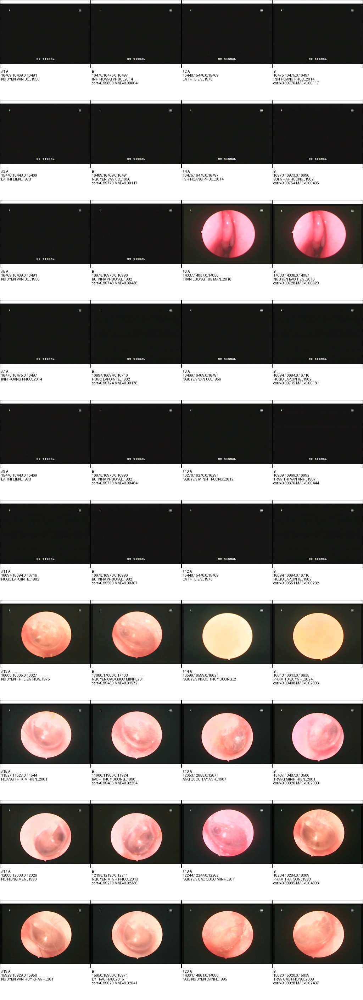


DONE
Contact sheets: /content/drive/MyDrive/NoiSoi_Matching/normal_phash0_visual_audit
CSV: /content/drive/MyDrive/NoiSoi_Matching/normal_phash0_top100_visual_audit.csv


In [ ]:
# ============================================================
# CELL 61 — TOP pHash=0 PIXEL-SIMILARITY VISUAL AUDIT
# ============================================================

import os
import math
import pandas as pd
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

PIXEL_FILE = os.path.join(
    BASE, "normal_phash0_pixel_audit_v2.csv"
)

OUT_CSV = os.path.join(
    BASE, "normal_phash0_top100_visual_audit.csv"
)

CONTACT_DIR = os.path.join(
    BASE, "normal_phash0_visual_audit"
)

os.makedirs(CONTACT_DIR, exist_ok=True)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

df = pd.read_csv(PIXEL_FILE, low_memory=False)

print("=" * 70)
print("LOAD")
print("=" * 70)
print("Rows:", len(df))
print("Columns:", list(df.columns))

# ------------------------------------------------------------
# TOP 100
# Sort by:
#   1. correlation descending
#   2. MAE ascending
# ------------------------------------------------------------

top100 = (
    df.sort_values(
        ["correlation", "mae"],
        ascending=[False, True]
    )
    .head(100)
    .copy()
)

top100.insert(0, "audit_id", range(1, len(top100) + 1))

top100.to_csv(OUT_CSV, index=False)

print("\nTop 100 selected.")
print("Saved:", OUT_CSV)

print("\nCorrelation distribution:")
print(top100["correlation"].describe())

print("\nMAE distribution:")
print(top100["mae"].describe())

display(
    top100[
        [
            "audit_id",
            "phash",
            "case_a",
            "patient_a",
            "case_b",
            "patient_b",
            "mae",
            "correlation",
        ]
    ].head(20)
)


# ============================================================
# IMAGE LOADER
# ============================================================

def load_image(path, size=(256, 192)):
    try:
        img = Image.open(path).convert("RGB")
        img.thumbnail(size)

        canvas = Image.new("RGB", size, "white")

        x = (size[0] - img.width) // 2
        y = (size[1] - img.height) // 2

        canvas.paste(img, (x, y))

        return canvas

    except Exception as e:
        canvas = Image.new("RGB", size, "white")
        draw = ImageDraw.Draw(canvas)
        draw.text(
            (10, 80),
            f"ERROR\n{str(e)[:50]}",
            fill="black"
        )
        return canvas


# ============================================================
# CONTACT SHEETS
#
# 20 pairs / sheet
# 2 images per pair
# ============================================================

IMG_W, IMG_H = 256, 192
TEXT_H = 90
ROW_H = IMG_H + TEXT_H

COLS = 2
ROWS_PER_SHEET = 10

for batch_start in range(0, len(top100), 20):

    batch = top100.iloc[batch_start:batch_start + 20]

    sheet_w = COLS * IMG_W
    sheet_h = ROWS_PER_SHEET * ROW_H

    sheet = Image.new(
        "RGB",
        (sheet_w, sheet_h),
        "white"
    )

    draw = ImageDraw.Draw(sheet)

    for i, (_, row) in enumerate(batch.iterrows()):

        local_row = i // 2
        local_col = i % 2

        x = local_col * IMG_W
        y = local_row * ROW_H

        img_a = load_image(row["image_a"], (IMG_W, IMG_H))

        sheet.paste(img_a, (x, y))

        # Border
        draw.rectangle(
            [x, y, x + IMG_W - 1, y + IMG_H - 1],
            outline="black"
        )

        text = (
            f"#{int(row['audit_id'])}  "
            f"corr={row['correlation']:.5f}\n"
            f"MAE={row['mae']:.5f}\n"
            f"A: {str(row['case_a'])[:28]}\n"
            f"B: {str(row['case_b'])[:28]}"
        )

        draw.multiline_text(
            (x + 4, y + IMG_H + 4),
            text,
            fill="black",
            spacing=2
        )

    # --------------------------------------------------------
    # SECOND IMAGE COLUMN IS currently image A/B alternating
    # To make comparison clearer, replace layout below:
    # --------------------------------------------------------

    # Rebuild as 10 rows × 4 columns:
    # A | B | metadata | metadata
    sheet_w = 4 * IMG_W
    sheet_h = ROWS_PER_SHEET * ROW_H

    sheet = Image.new(
        "RGB",
        (sheet_w, sheet_h),
        "white"
    )

    draw = ImageDraw.Draw(sheet)

    for j, (_, row) in enumerate(batch.iterrows()):

        r = j // 2
        c_pair = j % 2

        base_x = c_pair * 2 * IMG_W
        y = r * ROW_H

        img_a = load_image(row["image_a"], (IMG_W, IMG_H))
        img_b = load_image(row["image_b"], (IMG_W, IMG_H))

        sheet.paste(img_a, (base_x, y))
        sheet.paste(img_b, (base_x + IMG_W, y))

        draw.rectangle(
            [base_x, y, base_x + IMG_W - 1, y + IMG_H - 1],
            outline="black"
        )

        draw.rectangle(
            [
                base_x + IMG_W,
                y,
                base_x + 2 * IMG_W - 1,
                y + IMG_H - 1
            ],
            outline="black"
        )

        text_a = (
            f"#{int(row['audit_id'])} A\n"
            f"{str(row['case_a'])[:25]}\n"
            f"{str(row['patient_a'])[:24]}"
        )

        text_b = (
            f"B\n"
            f"{str(row['case_b'])[:25]}\n"
            f"{str(row['patient_b'])[:24]}\n"
            f"corr={row['correlation']:.5f} "
            f"MAE={row['mae']:.5f}"
        )

        draw.multiline_text(
            (base_x + 3, y + IMG_H + 3),
            text_a,
            fill="black",
            spacing=1
        )

        draw.multiline_text(
            (base_x + IMG_W + 3, y + IMG_H + 3),
            text_b,
            fill="black",
            spacing=1
        )

    out_file = os.path.join(
        CONTACT_DIR,
        f"top100_{batch_start+1:03d}_{batch_start+len(batch):03d}.jpg"
    )

    sheet.save(
        out_file,
        quality=92
    )

    print("Saved:", out_file)


# ============================================================
# SHOW FIRST CONTACT SHEET
# ============================================================

first_sheet = os.path.join(
    CONTACT_DIR,
    "top100_001_020.jpg"
)

display(Image.open(first_sheet))

print("\n" + "=" * 70)
print("DONE")
print("=" * 70)
print("Contact sheets:", CONTACT_DIR)
print("CSV:", OUT_CSV)

In [ ]:
# ============================================================
# CELL 62 — INSPECT NO SIGNAL MISSED BY V2
# ============================================================

import os
import pandas as pd
import numpy as np

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

MASTER = os.path.join(BASE, "image_audit_master.csv")
METRICS = os.path.join(BASE, "image_black_screen_metrics.csv")

master = pd.read_csv(MASTER, low_memory=False)
metrics = pd.read_csv(METRICS, low_memory=False)

print("=" * 70)
print("MASTER")
print("=" * 70)
print("Rows:", len(master))
print("Normal:", (~master["is_no_signal_v2"]).sum())
print("NO SIGNAL:", master["is_no_signal_v2"].sum())


# ------------------------------------------------------------
# Look specifically at pHash group 9d279926997652d8
# ------------------------------------------------------------

group = master[
    (master["phash"] == "9d279926997652d8")
].copy()

print("\n" + "=" * 70)
print("GROUP 9d279926997652d8")
print("=" * 70)

cols = [
    "case_id",
    "patient_group_id",
    "image_path",
    "phash",
    "is_no_signal_v2"
]

display(group[cols])


# ------------------------------------------------------------
# Merge image metrics
# ------------------------------------------------------------

metric_cols = [
    "image_path",
    "mean_gray",
    "std_gray",
    "dark_fraction",
    "very_dark_fraction",
    "bright_fraction"
]

group_metrics = group.merge(
    metrics[metric_cols],
    on="image_path",
    how="left"
)

print("\nMetrics:")
display(
    group_metrics[
        [
            "case_id",
            "patient_group_id",
            "mean_gray",
            "std_gray",
            "dark_fraction",
            "very_dark_fraction",
            "bright_fraction",
            "is_no_signal_v2"
        ]
    ].sort_values("mean_gray")
)


# ------------------------------------------------------------
# Print numerical ranges
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("METRIC RANGE")
print("=" * 70)

for col in [
    "mean_gray",
    "std_gray",
    "dark_fraction",
    "very_dark_fraction",
    "bright_fraction"
]:
    print(f"\n{col}")
    print(group_metrics[col].describe())

MASTER
Rows: 76403
Normal: 76228
NO SIGNAL: 175

GROUP 9d279926997652d8


,case_id,patient_group_id,image_path,phash,is_no_signal_v2
2949,10395.10395.0.10409,NGUYEN THI ANH THU_2012,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True
2950,10395.10395.0.10409,NGUYEN THI ANH THU_2012,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True
3365,10347.10347.0.10361,NGUYEN THI NAM_1970,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True
4960,10157.10157.0.10171,LE CONG TRI_2014,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True
6918,10948.10948.0.10963,ANG ANH KHOA_2017,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True
6919,10948.10948.0.10963,ANG ANH KHOA_2017,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True
7490,10881.10881.0.10896,OAN KIEN LAM_2018,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True
7607,10864.10864.0.10879,TRAN MINH TRANG_1983,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True
10060,11580.11580.0.11597,ANG THI MY NGAN_1984,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True
12765,11276.11276.0.11292,NGUYEN QUOC ANH_1969,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,9d279926997652d8,True



Metrics:


,case_id,patient_group_id,mean_gray,std_gray,dark_fraction,very_dark_fraction,bright_fraction,is_no_signal_v2
27,16886.16886.0.16908,PHAN INH MY THANH_2015,4.713806,9.185869,0.992798,0.805969,0.000000,True
14,14071.14071.0.14090,BUI THOAI VY_1999,7.773193,8.937606,0.992737,0.003906,0.000000,True
15,13838.13838.0.13857,LAKMAL_1969,9.725952,9.101490,0.992615,0.001465,0.000061,True
20,15877.15877.0.15898,NGUYEN THI VIET HA_2014,9.769531,9.007199,0.992615,0.001404,0.000000,True
17,15565.15565.0.15586,NGUYEN THANH BINH_1981,11.544067,8.813471,0.992615,0.000671,0.000000,True
19,16163.16163.0.16184,HUYNH MAI HUYEN MY_2020,11.583557,8.813455,0.992615,0.000793,0.000000,True
29,17375.17375.0.17398,PHAM NGUYEN QUOC UY_2015,11.614807,9.132716,0.992371,0.000732,0.000122,True
28,17375.17375.0.17398,PHAM NGUYEN QUOC UY_2015,11.664001,9.123827,0.992432,0.000732,0.000122,True
13,14154.14154.0.14173,PHAM THI HONG TIEN_1988,13.501831,8.933142,0.992310,0.000488,0.000122,True
11,13724.13724.0.13743,TRAN LE BAO NGOC_2011,13.647217,9.028272,0.992249,0.000183,0.000122,True



METRIC RANGE

mean_gray
count    31.000000
mean     16.002276
std       5.131839
min       4.713806
25%      12.582916
50%      16.667664
75%      19.196411
max      30.674622
Name: mean_gray, dtype: float64

std_gray
count    31.000000
mean      8.961454
std       0.122267
min       8.763226
25%       8.874803
50%       8.959827
75%       9.060892
max       9.185869
Name: std_gray, dtype: float64

dark_fraction
count    31.000000
mean      0.834943
std       0.347235
min       0.000000
25%       0.988983
50%       0.991882
75%       0.992340
max       0.992798
Name: dark_fraction, dtype: float64

very_dark_fraction
count    31.000000
mean      0.026334
std       0.144696
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000580
max       0.805969
Name: very_dark_fraction, dtype: float64

bright_fraction
count    31.000000
mean      0.000114
std       0.000061
min       0.000000
25%       0.000122
50%       0.000122
75%       0.000122
max       0.000244
Name: bright_

In [ ]:
# ============================================================
# CELL 63 — RGB FORENSIC AUDIT FOR NO SIGNAL
# ============================================================

import os
import numpy as np
import pandas as pd
from PIL import Image

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

MASTER = os.path.join(BASE, "image_audit_master.csv")

master = pd.read_csv(MASTER, low_memory=False)

# ------------------------------------------------------------
# Representative images
# ------------------------------------------------------------

CASE_IDS = [
    # Confirmed / suspected NO SIGNAL
    "16469.16469.0.16491",
    "16475.16475.0.16497",
    "15448.15448.0.15469",
    "16973.16973.0.16996",

    # Detected NO SIGNAL
    "10395.10395.0.10409",
    "14071.14071.0.14090",
    "13838.13838.0.13857",

    # Real endoscopy
    "14037.14037.0.14056",
    "14038.14038.0.14057",
    "16605.16605.0.16627",
    "17080.17080.0.17103",
]

# ------------------------------------------------------------
# Image analysis
# ------------------------------------------------------------

def analyze_rgb(path):

    img = Image.open(path).convert("RGB")
    arr = np.asarray(img.resize((256, 256))).astype(np.float32)

    r = arr[:, :, 0]
    g = arr[:, :, 1]
    b = arr[:, :, 2]

    gray = (
        0.299 * r +
        0.587 * g +
        0.114 * b
    )

    mx = arr.max(axis=2)
    mn = arr.min(axis=2)

    saturation = np.where(
        mx > 0,
        (mx - mn) / mx,
        0
    )

    # Dark definitions
    dark10 = (gray <= 10).mean()
    dark20 = (gray <= 20).mean()
    dark30 = (gray <= 30).mean()
    dark40 = (gray <= 40).mean()

    # RGB near-black
    rgb10 = ((r <= 10) & (g <= 10) & (b <= 10)).mean()
    rgb20 = ((r <= 20) & (g <= 20) & (b <= 20)).mean()
    rgb30 = ((r <= 30) & (g <= 30) & (b <= 30)).mean()

    # Bright/color pixels
    bright100 = (gray >= 100).mean()
    bright150 = (gray >= 150).mean()

    colored = (saturation >= 0.30).mean()
    strongly_colored = (saturation >= 0.50).mean()

    return {
        "mean_R": r.mean(),
        "mean_G": g.mean(),
        "mean_B": b.mean(),

        "std_R": r.std(),
        "std_G": g.std(),
        "std_B": b.std(),

        "mean_gray": gray.mean(),
        "std_gray": gray.std(),

        "dark_gray_10": dark10,
        "dark_gray_20": dark20,
        "dark_gray_30": dark30,
        "dark_gray_40": dark40,

        "rgb_black_10": rgb10,
        "rgb_black_20": rgb20,
        "rgb_black_30": rgb30,

        "bright_100": bright100,
        "bright_150": bright150,

        "mean_saturation": saturation.mean(),
        "colored_fraction": colored,
        "strongly_colored_fraction": strongly_colored,
    }


rows = []

for case_id in CASE_IDS:

    sub = master[master["case_id"] == case_id]

    if len(sub) == 0:
        print("NOT FOUND:", case_id)
        continue

    # Take first image from case
    row = sub.iloc[0]

    path = row["image_path"]

    try:
        metrics = analyze_rgb(path)

        metrics["case_id"] = case_id
        metrics["patient_group_id"] = row["patient_group_id"]
        metrics["image_path"] = path
        metrics["is_no_signal_v2"] = row["is_no_signal_v2"]

        rows.append(metrics)

    except Exception as e:
        print("ERROR:", case_id, e)


result = pd.DataFrame(rows)

cols_first = [
    "case_id",
    "patient_group_id",
    "is_no_signal_v2",
]

result = result[
    cols_first +
    [c for c in result.columns if c not in cols_first]
]

pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)

print("=" * 100)
print("RGB FORENSIC AUDIT")
print("=" * 100)

display(result)

/tmp/ipykernel_2594/2490462164.py:63: RuntimeWarning: invalid value encountered in divide
  (mx - mn) / mx,


RGB FORENSIC AUDIT


,case_id,patient_group_id,is_no_signal_v2,mean_R,mean_G,mean_B,std_R,std_G,std_B,mean_gray,std_gray,dark_gray_10,dark_gray_20,dark_gray_30,dark_gray_40,rgb_black_10,rgb_black_20,rgb_black_30,bright_100,bright_150,mean_saturation,colored_fraction,strongly_colored_fraction,image_path
0,16469.16469.0.16491,NGUYEN VAN UC_1956,False,21.462082,22.301361,20.919342,10.316823,10.256084,10.167439,21.892868,10.191956,0.000061,0.013657,0.993515,0.994293,0.000015,0.008026,0.992691,0.003693,0.002640,0.092235,0.004990,0.001694,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
1,16475.16475.0.16497,INH HOANG PHUC_2014,False,118.380890,86.034332,78.597305,83.151825,59.203728,55.719288,94.858139,65.073738,0.000000,0.003296,0.080338,0.206985,0.000000,0.001892,0.079956,0.412491,0.185913,0.284152,0.442307,0.085632,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
2,15448.15448.0.15469,LA THI LIEN_1973,False,22.349472,21.932983,21.293701,10.091415,10.319656,10.191526,21.984636,10.189189,0.000046,0.035172,0.993530,0.994354,0.000015,0.022644,0.993225,0.003754,0.002640,0.090640,0.002884,0.000824,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
3,16973.16973.0.16996,BUI NHA PHUONG_1982,False,113.124008,73.683746,66.034637,91.853783,56.194759,53.754917,84.604378,65.088860,0.000000,0.032654,0.086975,0.242538,0.000000,0.019699,0.085037,0.308426,0.220627,0.352074,0.584915,0.226242,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
4,10395.10395.0.10409,NGUYEN THI ANH THU_2012,True,14.196823,14.987793,13.688431,10.486068,10.407245,10.385004,14.603167,10.359049,0.000885,0.993393,0.994156,0.994659,0.000427,0.992630,0.993652,0.003601,0.002487,0.134129,0.005753,0.002594,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
5,14071.14071.0.14090,BUI THOAI VY_1999,True,8.246246,7.752213,7.289688,10.134107,10.247343,10.097847,7.847200,10.156783,0.992493,0.993805,0.994537,0.994843,0.991241,0.993378,0.994385,0.003540,0.002106,0.245559,0.049622,0.027664,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
6,13838.13838.0.13857,LAKMAL_1969,False,41.659744,48.238983,40.959595,24.265396,27.207907,26.566631,45.441940,26.200132,0.066071,0.086639,0.444138,0.574905,0.056030,0.083878,0.399048,0.013275,0.000412,0.215107,0.157013,0.004425,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
7,14037.14037.0.14056,TRAN LUONG TUE MAN_2018,False,114.495514,88.259613,80.403076,101.645065,72.168404,68.732132,95.208496,79.108498,0.000000,0.037033,0.082947,0.315384,0.000000,0.023346,0.082001,0.363190,0.296997,0.220707,0.220947,0.130112,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
8,14038.14038.0.14057,NGUYEN BAO TIEN_2016,False,118.307251,77.028397,78.224030,97.031853,55.442413,65.055107,89.507072,67.656540,0.000000,0.012070,0.037857,0.348465,0.000000,0.002869,0.035950,0.375198,0.277878,0.320897,0.453583,0.160782,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
9,16605.16605.0.16627,NGUYEN THI LIEN HOA_1975,False,102.921844,83.689621,65.471054,95.542297,70.615738,57.505039,87.363144,75.913551,0.000000,0.035599,0.088516,0.497742,0.000000,0.020966,0.086639,0.328781,0.271347,0.298488,0.293503,0.140778,/content/drive/MyDrive/ImageLocal/ImageLocal/1...


In [ ]:
# ============================================================
# CELL 64 — EXACT IMAGE FORENSIC AUDIT
# Analyze the EXACT image_a / image_b shown in Cell 61
# ============================================================

import os
import numpy as np
import pandas as pd
from PIL import Image

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

TOP100 = os.path.join(
    BASE,
    "normal_phash0_top100_visual_audit.csv"
)

top100 = pd.read_csv(TOP100, low_memory=False)

print("=" * 80)
print("LOAD TOP 100")
print("=" * 80)
print("Rows:", len(top100))


# ------------------------------------------------------------
# Analyze exact image
# ------------------------------------------------------------

def analyze_exact_rgb(path):

    img = Image.open(path).convert("RGB")
    arr = np.asarray(img.resize((256, 256))).astype(np.float32)

    r = arr[:, :, 0]
    g = arr[:, :, 1]
    b = arr[:, :, 2]

    gray = (
        0.299 * r +
        0.587 * g +
        0.114 * b
    )

    mx = arr.max(axis=2)
    mn = arr.min(axis=2)

    # Safe saturation calculation
    saturation = np.zeros_like(mx)

    mask = mx > 0

    saturation[mask] = (
        (mx[mask] - mn[mask]) / mx[mask]
    )

    return {
        "mean_R": r.mean(),
        "mean_G": g.mean(),
        "mean_B": b.mean(),

        "std_R": r.std(),
        "std_G": g.std(),
        "std_B": b.std(),

        "mean_gray": gray.mean(),
        "std_gray": gray.std(),

        "dark_10": (gray <= 10).mean(),
        "dark_20": (gray <= 20).mean(),
        "dark_30": (gray <= 30).mean(),
        "dark_40": (gray <= 40).mean(),

        "rgb_black_10": (
            (r <= 10) &
            (g <= 10) &
            (b <= 10)
        ).mean(),

        "rgb_black_20": (
            (r <= 20) &
            (g <= 20) &
            (b <= 20)
        ).mean(),

        "rgb_black_30": (
            (r <= 30) &
            (g <= 30) &
            (b <= 30)
        ).mean(),

        "bright_100": (gray >= 100).mean(),
        "bright_150": (gray >= 150).mean(),

        "mean_saturation": saturation.mean(),

        "colored_30": (
            saturation >= 0.30
        ).mean(),

        "colored_50": (
            saturation >= 0.50
        ).mean(),
    }


# ------------------------------------------------------------
# We specifically inspect top 20
# ------------------------------------------------------------

rows = []

for _, row in top100.head(20).iterrows():

    for side in ["A", "B"]:

        path = row[f"image_{side.lower()}"]

        try:
            m = analyze_exact_rgb(path)

            m["audit_id"] = int(row["audit_id"])
            m["side"] = side
            m["phash"] = row["phash"]

            m["case_id"] = (
                row[f"case_{side.lower()}"]
            )

            m["patient"] = (
                row[f"patient_{side.lower()}"]
            )

            m["image_path"] = path

            rows.append(m)

        except Exception as e:

            print(
                "ERROR:",
                row["audit_id"],
                side,
                e
            )


exact = pd.DataFrame(rows)

# Put identifying columns first
first_cols = [
    "audit_id",
    "side",
    "case_id",
    "patient",
    "phash"
]

exact = exact[
    first_cols +
    [
        c for c in exact.columns
        if c not in first_cols
    ]
]

pd.set_option("display.max_columns", None)
pd.set_option("display.width", 220)

print("\n" + "=" * 80)
print("EXACT IMAGE METRICS")
print("=" * 80)

display(exact)

LOAD TOP 100
Rows: 100

EXACT IMAGE METRICS


,audit_id,side,case_id,patient,phash,mean_R,mean_G,mean_B,std_R,std_G,std_B,mean_gray,std_gray,dark_10,dark_20,dark_30,dark_40,rgb_black_10,rgb_black_20,rgb_black_30,bright_100,bright_150,mean_saturation,colored_30,colored_50,image_path
0,1,A,16469.16469.0.16491,NGUYEN VAN UC_1956,9d279926997652d8,21.462082,22.301361,20.919342,10.316823,10.256084,10.167439,21.892868,10.191956,0.000061,0.013657,0.993515,0.994293,0.000015,0.008026,0.992691,0.003693,0.002640,0.092235,0.004990,0.001694,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
1,1,B,16475.16475.0.16497,INH HOANG PHUC_2014,9d279926997652d8,21.380692,22.352066,20.896500,10.319891,10.251707,10.224833,21.895691,10.194621,0.000031,0.011032,0.993576,0.994232,0.000031,0.006958,0.992767,0.003723,0.002670,0.091533,0.004425,0.002045,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
2,2,A,15448.15448.0.15469,LA THI LIEN_1973,9d279926997652d8,22.349472,21.932983,21.293701,10.091415,10.319656,10.191526,21.984636,10.189189,0.000046,0.035172,0.993530,0.994354,0.000015,0.022644,0.993225,0.003754,0.002640,0.090640,0.002884,0.000824,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
3,2,B,16475.16475.0.16497,INH HOANG PHUC_2014,9d279926997652d8,21.380692,22.352066,20.896500,10.319891,10.251707,10.224833,21.895691,10.194621,0.000031,0.011032,0.993576,0.994232,0.000031,0.006958,0.992767,0.003723,0.002670,0.091533,0.004425,0.002045,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
4,3,A,15448.15448.0.15469,LA THI LIEN_1973,9d279926997652d8,22.349472,21.932983,21.293701,10.091415,10.319656,10.191526,21.984636,10.189189,0.000046,0.035172,0.993530,0.994354,0.000015,0.022644,0.993225,0.003754,0.002640,0.090640,0.002884,0.000824,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
5,3,B,16469.16469.0.16491,NGUYEN VAN UC_1956,9d279926997652d8,21.462082,22.301361,20.919342,10.316823,10.256084,10.167439,21.892868,10.191956,0.000061,0.013657,0.993515,0.994293,0.000015,0.008026,0.992691,0.003693,0.002640,0.092235,0.004990,0.001694,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
6,4,A,16475.16475.0.16497,INH HOANG PHUC_2014,9d279926997652d8,21.380692,22.352066,20.896500,10.319891,10.251707,10.224833,21.895691,10.194621,0.000031,0.011032,0.993576,0.994232,0.000031,0.006958,0.992767,0.003723,0.002670,0.091533,0.004425,0.002045,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
7,4,B,16973.16973.0.16996,BUI NHA PHUONG_1982,9d279926997652d8,21.138763,20.603760,20.207825,10.110823,10.178968,10.052668,20.718588,10.095283,0.000076,0.416748,0.993713,0.994461,0.000015,0.186829,0.993362,0.003677,0.002548,0.096758,0.003143,0.001038,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
8,5,A,16469.16469.0.16491,NGUYEN VAN UC_1956,9d279926997652d8,21.462082,22.301361,20.919342,10.316823,10.256084,10.167439,21.892868,10.191956,0.000061,0.013657,0.993515,0.994293,0.000015,0.008026,0.992691,0.003693,0.002640,0.092235,0.004990,0.001694,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
9,5,B,16973.16973.0.16996,BUI NHA PHUONG_1982,9d279926997652d8,21.138763,20.603760,20.207825,10.110823,10.178968,10.052668,20.718588,10.095283,0.000076,0.416748,0.993713,0.994461,0.000015,0.186829,0.993362,0.003677,0.002548,0.096758,0.003143,0.001038,/content/drive/MyDrive/ImageLocal/ImageLocal/1...


In [ ]:
# ============================================================
# CELL 65 — NO SIGNAL V3 CANDIDATE
#
# Rule candidate:
#   mean_gray <= 25
#   AND std_gray <= 15
#   AND mean_saturation <= 0.10
#
# IMPORTANT:
# This cell DOES NOT modify the master dataset.
# It only creates an audit candidate list.
# ============================================================

import os
import numpy as np
import pandas as pd
from PIL import Image

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

MASTER_FILE = os.path.join(
    BASE,
    "image_audit_master.csv"
)

METRICS_FILE = os.path.join(
    BASE,
    "image_black_screen_metrics.csv"
)

OUT_FILE = os.path.join(
    BASE,
    "image_no_signal_v3_candidates.csv"
)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

master = pd.read_csv(
    MASTER_FILE,
    low_memory=False
)

metrics = pd.read_csv(
    METRICS_FILE,
    low_memory=False
)

print("=" * 80)
print("LOAD")
print("=" * 80)

print("Master rows:", len(master))
print("Metric rows:", len(metrics))


# ------------------------------------------------------------
# Candidate 1:
# low brightness + low variation
# ------------------------------------------------------------

candidate = metrics[
    (metrics["mean_gray"] <= 25) &
    (metrics["std_gray"] <= 15)
].copy()

print("\nLow brightness + low variation candidates:",
      len(candidate))


# ------------------------------------------------------------
# RGB saturation
# Only analyze these candidates
# ------------------------------------------------------------

def get_mean_saturation(path):

    img = Image.open(path).convert("RGB")

    # Small resize is enough for artifact detection
    arr = np.asarray(
        img.resize((128, 128))
    ).astype(np.float32)

    mx = arr.max(axis=2)
    mn = arr.min(axis=2)

    saturation = np.zeros_like(mx)

    mask = mx > 0

    saturation[mask] = (
        (mx[mask] - mn[mask]) /
        mx[mask]
    )

    return float(saturation.mean())


sat_values = []
errors = []

for i, row in enumerate(candidate.itertuples(index=False)):

    path = row.image_path

    try:
        sat = get_mean_saturation(path)
        sat_values.append(sat)

    except Exception as e:

        sat_values.append(np.nan)
        errors.append(
            (path, str(e))
        )

    if (i + 1) % 50 == 0:
        print(
            f"Processed {i+1}/{len(candidate)}"
        )


candidate["mean_saturation"] = sat_values


# ------------------------------------------------------------
# V3 candidate
# ------------------------------------------------------------

candidate["is_no_signal_v3_candidate"] = (
    (candidate["mean_gray"] <= 25) &
    (candidate["std_gray"] <= 15) &
    (candidate["mean_saturation"] <= 0.10)
)


# ------------------------------------------------------------
# Merge current V2 flag
# ------------------------------------------------------------

candidate = candidate.merge(
    master[
        [
            "image_path",
            "case_id",
            "patient_group_id",
            "is_no_signal_v2"
        ]
    ],
    on="image_path",
    how="left"
)


# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

candidate.to_csv(
    OUT_FILE,
    index=False
)


# ============================================================
# RESULTS
# ============================================================

print("\n" + "=" * 80)
print("V3 CANDIDATE RESULTS")
print("=" * 80)

print(
    "Low-gray/low-std candidates:",
    len(candidate)
)

print(
    "V3 candidates:",
    candidate["is_no_signal_v3_candidate"].sum()
)

print(
    "Already V2:",
    candidate["is_no_signal_v2"].sum()
)

print(
    "New candidates beyond V2:",
    (
        candidate["is_no_signal_v3_candidate"] &
        ~candidate["is_no_signal_v2"]
    ).sum()
)

print(
    "Errors:",
    len(errors)
)


# ------------------------------------------------------------
# Distribution
# ------------------------------------------------------------

print("\nV3 candidate metrics:")

display(
    candidate[
        [
            "case_id",
            "patient_group_id",
            "mean_gray",
            "std_gray",
            "mean_saturation",
            "is_no_signal_v2",
            "is_no_signal_v3_candidate",
            "image_path"
        ]
    ]
    .sort_values(
        ["is_no_signal_v3_candidate",
         "mean_gray"],
        ascending=[False, True]
    )
)


# ------------------------------------------------------------
# Save error log if needed
# ------------------------------------------------------------

if errors:

    error_file = os.path.join(
        BASE,
        "image_no_signal_v3_errors.csv"
    )

    pd.DataFrame(
        errors,
        columns=["image_path", "error"]
    ).to_csv(
        error_file,
        index=False
    )

    print(
        "\nErrors saved:",
        error_file
    )

print("\nSaved:")
print(OUT_FILE)

LOAD
Master rows: 76403
Metric rows: 81784

Low brightness + low variation candidates: 245
Processed 50/245
Processed 100/245
Processed 150/245
Processed 200/245

V3 CANDIDATE RESULTS
Low-gray/low-std candidates: 245
V3 candidates: 26
Already V2: 175


TypeError: bad operand type for unary ~: 'float'

In [ ]:
# ============================================================
# CELL 65B — NO SIGNAL V3 CANDIDATE (FIXED)
# ============================================================

import os
import numpy as np
import pandas as pd
from PIL import Image

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

MASTER_FILE = os.path.join(
    BASE,
    "image_audit_master.csv"
)

METRICS_FILE = os.path.join(
    BASE,
    "image_black_screen_metrics.csv"
)

OUT_FILE = os.path.join(
    BASE,
    "image_no_signal_v3_candidates.csv"
)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

master = pd.read_csv(
    MASTER_FILE,
    low_memory=False
)

metrics = pd.read_csv(
    METRICS_FILE,
    low_memory=False
)

print("=" * 80)
print("LOAD")
print("=" * 80)
print("Master rows:", len(master))
print("Metric rows:", len(metrics))


# ============================================================
# STEP 1 — LOW BRIGHTNESS + LOW VARIATION
# ============================================================

candidate = metrics[
    (metrics["mean_gray"] <= 25) &
    (metrics["std_gray"] <= 15)
].copy()

print(
    "\nLow brightness + low variation candidates:",
    len(candidate)
)


# ============================================================
# STEP 2 — RGB SATURATION
# ============================================================

def get_mean_saturation(path):

    img = Image.open(path).convert("RGB")

    arr = np.asarray(
        img.resize((128, 128))
    ).astype(np.float32)

    mx = arr.max(axis=2)
    mn = arr.min(axis=2)

    saturation = np.zeros_like(mx)

    mask = mx > 0

    saturation[mask] = (
        (mx[mask] - mn[mask]) /
        mx[mask]
    )

    return float(saturation.mean())


sat_values = []
errors = []

for i, row in enumerate(
    candidate.itertuples(index=False)
):

    path = row.image_path

    try:

        sat = get_mean_saturation(path)
        sat_values.append(sat)

    except Exception as e:

        sat_values.append(np.nan)

        errors.append(
            (path, str(e))
        )

    if (i + 1) % 50 == 0:

        print(
            f"Processed {i+1}/{len(candidate)}"
        )


candidate["mean_saturation"] = sat_values


# ============================================================
# STEP 3 — V3 CANDIDATE
# ============================================================

candidate["is_no_signal_v3_candidate"] = (
    (candidate["mean_gray"] <= 25) &
    (candidate["std_gray"] <= 15) &
    (candidate["mean_saturation"] <= 0.10)
)


# ============================================================
# STEP 4 — MERGE CURRENT V2 FLAG
# ============================================================

v2_flags = master[
    [
        "image_path",
        "case_id",
        "patient_group_id",
        "is_no_signal_v2"
    ]
].copy()

# Force V2 flag to proper boolean
v2_flags["is_no_signal_v2"] = (
    v2_flags["is_no_signal_v2"]
    .fillna(False)
    .astype(bool)
)

candidate = candidate.merge(
    v2_flags,
    on="image_path",
    how="left"
)

# IMPORTANT:
# merge can create NaN if path is not found.
candidate["is_no_signal_v2"] = (
    candidate["is_no_signal_v2"]
    .fillna(False)
    .astype(bool)
)


# ============================================================
# STEP 5 — NEW V3 BEYOND V2
# ============================================================

candidate["new_beyond_v2"] = (
    candidate["is_no_signal_v3_candidate"] &
    (~candidate["is_no_signal_v2"])
)


# ============================================================
# STEP 6 — SAVE
# ============================================================

candidate.to_csv(
    OUT_FILE,
    index=False
)


# ============================================================
# RESULTS
# ============================================================

print("\n" + "=" * 80)
print("V3 CANDIDATE RESULTS")
print("=" * 80)

print(
    "Low brightness + low variation:",
    len(candidate)
)

print(
    "V3 candidates:",
    int(
        candidate["is_no_signal_v3_candidate"].sum()
    )
)

print(
    "Already V2:",
    int(
        candidate["is_no_signal_v2"].sum()
    )
)

print(
    "NEW V3 beyond V2:",
    int(
        candidate["new_beyond_v2"].sum()
    )
)

print(
    "Errors:",
    len(errors)
)


# ============================================================
# SHOW NEW CANDIDATES FIRST
# ============================================================

print("\n" + "=" * 80)
print("NEW V3 CANDIDATES — V2=False, V3=True")
print("=" * 80)

new_candidates = (
    candidate[
        candidate["new_beyond_v2"]
    ]
    .sort_values(
        ["mean_gray", "mean_saturation"]
    )
)

display(
    new_candidates[
        [
            "case_id",
            "patient_group_id",
            "mean_gray",
            "std_gray",
            "mean_saturation",
            "dark_fraction",
            "very_dark_fraction",
            "bright_fraction",
            "is_no_signal_v2",
            "is_no_signal_v3_candidate",
            "image_path"
        ]
    ]
)


# ============================================================
# SHOW ALL V3 CANDIDATES
# ============================================================

print("\n" + "=" * 80)
print("ALL V3 CANDIDATES")
print("=" * 80)

display(
    candidate[
        candidate["is_no_signal_v3_candidate"]
    ][
        [
            "case_id",
            "patient_group_id",
            "mean_gray",
            "std_gray",
            "mean_saturation",
            "dark_fraction",
            "is_no_signal_v2",
            "image_path"
        ]
    ]
    .sort_values("mean_gray")
)


# ============================================================
# ERROR LOG
# ============================================================

if errors:

    error_file = os.path.join(
        BASE,
        "image_no_signal_v3_errors.csv"
    )

    pd.DataFrame(
        errors,
        columns=["image_path", "error"]
    ).to_csv(
        error_file,
        index=False
    )

    print(
        "\nErrors saved:",
        error_file
    )


print("\nSaved:")
print(OUT_FILE)

LOAD
Master rows: 76403
Metric rows: 81784

Low brightness + low variation candidates: 245
Processed 50/245
Processed 100/245
Processed 150/245
Processed 200/245

V3 CANDIDATE RESULTS
Low brightness + low variation: 245
V3 candidates: 26
Already V2: 175
NEW V3 beyond V2: 23
Errors: 0

NEW V3 CANDIDATES — V2=False, V3=True


/tmp/ipykernel_2594/1381398944.py:163: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  .fillna(False)


,case_id,patient_group_id,mean_gray,std_gray,mean_saturation,dark_fraction,very_dark_fraction,bright_fraction,is_no_signal_v2,is_no_signal_v3_candidate,image_path
203,17059.17059.0.17082,TRAN NGUYEN KHOA_1994,20.305908,8.818887,0.093616,0.966980,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
208,16964.16964.0.16986,NGUYEN HUY HOANG_2021,20.591431,8.827306,0.091712,0.931213,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
202,17069.17069.0.17092,PHAN HOANG VU_2019,20.652588,8.776259,0.094105,0.882874,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
207,16969.16969.0.16992,TRAN THI VAN ANH_1987,20.658508,8.852043,0.092943,0.859802,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
206,16973.16973.0.16996,BUI NHA PHUONG_1982,20.665588,8.842427,0.091651,0.867554,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
150,16785.16785.0.16807,MAI MINH PHUONG_1986,20.775879,8.872348,0.090846,0.793762,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
191,NaN,NaN,21.111877,8.815159,0.090512,0.524292,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
195,NaN,NaN,21.159790,8.792432,0.090980,0.494568,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
196,NaN,NaN,21.247131,8.764365,0.089724,0.428040,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
193,NaN,NaN,21.303040,8.783170,0.092104,0.377258,0.0,0.000122,False,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...



ALL V3 CANDIDATES


,case_id,patient_group_id,mean_gray,std_gray,mean_saturation,dark_fraction,is_no_signal_v2,image_path
221,17467.17467.0.17490,NGUYEN THI TAM_1932,0.000000,0.000000,0.000000,1.000000,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
20,10848.10848.0.10863,TRAN THI KIM THANH_1991,18.459290,8.966425,0.099717,0.991699,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
205,17015.17015.0.17038,TRAN HUONG_1973,19.846497,8.774515,0.098132,0.986267,True,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
203,17059.17059.0.17082,TRAN NGUYEN KHOA_1994,20.305908,8.818887,0.093616,0.966980,False,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
208,16964.16964.0.16986,NGUYEN HUY HOANG_2021,20.591431,8.827306,0.091712,0.931213,False,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
202,17069.17069.0.17092,PHAN HOANG VU_2019,20.652588,8.776259,0.094105,0.882874,False,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
207,16969.16969.0.16992,TRAN THI VAN ANH_1987,20.658508,8.852043,0.092943,0.859802,False,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
206,16973.16973.0.16996,BUI NHA PHUONG_1982,20.665588,8.842427,0.091651,0.867554,False,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
150,16785.16785.0.16807,MAI MINH PHUONG_1986,20.775879,8.872348,0.090846,0.793762,False,/content/drive/MyDrive/ImageLocal/ImageLocal/1...
191,NaN,NaN,21.111877,8.815159,0.090512,0.524292,False,/content/drive/MyDrive/ImageLocal/ImageLocal/1...



Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_no_signal_v3_candidates.csv


In [ ]:
# ============================================================
# CELL 66 — VISUAL AUDIT NEW V3 CANDIDATES
# ============================================================

from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageOps, ImageDraw
import math
import os

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")
V3_FILE = BASE / "image_no_signal_v3_candidates.csv"
OUT_DIR = BASE / "no_signal_v3_visual_audit"
OUT_DIR.mkdir(parents=True, exist_ok=True)

df = pd.read_csv(V3_FILE)

# Chỉ lấy V3 mới, chưa phải V2
df["is_no_signal_v2"] = (
    df["is_no_signal_v2"]
    .fillna(False)
    .astype(bool)
)

new_v3 = df[df["is_no_signal_v3_candidate"] & ~df["is_no_signal_v2"]].copy()

print("=" * 70)
print("NEW V3 VISUAL AUDIT")
print("=" * 70)
print("New V3 candidates:", len(new_v3))

# ------------------------------------------------------------
# Load images
# ------------------------------------------------------------

items = []

for _, row in new_v3.iterrows():

    path = Path(row["image_path"])

    try:
        img = Image.open(path).convert("RGB")

        # Resize for contact sheet
        img.thumbnail((260, 200))

        canvas = Image.new("RGB", (280, 270), "white")

        x = (280 - img.width) // 2
        y = 5

        canvas.paste(img, (x, y))

        draw = ImageDraw.Draw(canvas)

        case_id = str(row.get("case_id", ""))

        # Metrics
        text = (
            f"case: {case_id}\n"
            f"mean: {row['mean_gray']:.2f}\n"
            f"std: {row['std_gray']:.2f}\n"
            f"sat: {row['mean_saturation']:.4f}\n"
            f"dark20: {row['dark_fraction']:.3f}\n"
        )

        draw.multiline_text(
            (5, 210),
            text,
            fill="black"
        )

        items.append({
            "case_id": case_id,
            "image_path": str(path),
            "mean_gray": row["mean_gray"],
            "std_gray": row["std_gray"],
            "mean_saturation": row["mean_saturation"],
            "dark_fraction": row["dark_fraction"],
            "image": canvas
        })

    except Exception as e:
        print("ERROR:", path, e)

# ------------------------------------------------------------
# Contact sheet
# ------------------------------------------------------------

cols = 4
rows = math.ceil(len(items) / cols)

sheet = Image.new(
    "RGB",
    (cols * 280, rows * 270),
    "white"
)

for i, item in enumerate(items):

    x = (i % cols) * 280
    y = (i // cols) * 270

    sheet.paste(item["image"], (x, y))

sheet_path = OUT_DIR / "new_v3_candidates_contact_sheet.jpg"
sheet.save(sheet_path, quality=95)

print()
print("Saved contact sheet:")
print(sheet_path)

# ------------------------------------------------------------
# Save audit table
# ------------------------------------------------------------

audit_df = pd.DataFrame([
    {
        "case_id": x["case_id"],
        "image_path": x["image_path"],
        "mean_gray": x["mean_gray"],
        "std_gray": x["std_gray"],
        "mean_saturation": x["mean_saturation"],
        "dark_fraction": x["dark_fraction"],
    }
    for x in items
])

audit_path = OUT_DIR / "new_v3_visual_audit.csv"
audit_df.to_csv(audit_path, index=False)

print("Saved audit CSV:")
print(audit_path)

print()
print(audit_df.to_string(index=False))

NEW V3 VISUAL AUDIT
New V3 candidates: 23

Saved contact sheet:
/content/drive/MyDrive/NoiSoi_Matching/no_signal_v3_visual_audit/new_v3_candidates_contact_sheet.jpg
Saved audit CSV:
/content/drive/MyDrive/NoiSoi_Matching/no_signal_v3_visual_audit/new_v3_visual_audit.csv

            case_id                                                                                                               image_path  mean_gray  std_gray  mean_saturation  dark_fraction
                nan /content/drive/MyDrive/ImageLocal/ImageLocal/10457.10457.0/10457.10457.0.10471/10457.10457.0.10471.20240405072628418.jpg  21.738831  8.986452         0.083699       0.006897
                nan /content/drive/MyDrive/ImageLocal/ImageLocal/10452.10452.0/10452.10452.0.10466/10452.10452.0.10466.20240405052945391.jpg  21.758118  9.014625         0.088197       0.006592
                nan /content/drive/MyDrive/ImageLocal/ImageLocal/12853.12853.0/12853.12853.0.12871/12853.12853.0.12871.20241021051652305.jpg  21.7

In [ ]:
# ============================================================
# CELL 66C — V3 NEW CANDIDATES
# Robust version: map by parent-folder case_id
# ============================================================

from pathlib import Path
import pandas as pd
from PIL import Image, ImageDraw
import math

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

V3_FILE = BASE / "image_no_signal_v3_candidates.csv"
MASTER_FILE = BASE / "image_audit_master.csv"

OUT_DIR = BASE / "no_signal_v3_visual_audit"
OUT_DIR.mkdir(parents=True, exist_ok=True)

v3 = pd.read_csv(V3_FILE)
master = pd.read_csv(MASTER_FILE)

# ------------------------------------------------------------
# 1. NEW V3
# ------------------------------------------------------------

v3["is_no_signal_v2"] = (
    v3["is_no_signal_v2"]
    .fillna(False)
    .astype(bool)
)

new_v3 = v3[
    v3["is_no_signal_v3_candidate"]
    & ~v3["is_no_signal_v2"]
].copy()

print("=" * 70)
print("V3 NEW CANDIDATES")
print("=" * 70)
print("Total new V3:", len(new_v3))

# ------------------------------------------------------------
# 2. Extract case_id from image path
#
# Folder structure:
# ImageLocal/
#   15448.15448.0/
#       15448.15448.0.15469/
#           image.jpg
#
# Parent folder = case folder
# ------------------------------------------------------------

def extract_case_folder(path):
    try:
        return Path(path).parent.name
    except:
        return None

new_v3["case_folder"] = new_v3["image_path"].apply(
    extract_case_folder
)

# ------------------------------------------------------------
# 3. Master case IDs
# ------------------------------------------------------------

master["case_id_str"] = master["case_id"].astype(str)

master_case_map = (
    master[
        ["case_id_str", "patient_group_id"]
    ]
    .drop_duplicates("case_id_str")
)

# ------------------------------------------------------------
# 4. Match candidate folder to master case_id
# ------------------------------------------------------------

new_v3 = new_v3.merge(
    master_case_map,
    left_on="case_folder",
    right_on="case_id_str",
    how="left"
)

new_v3["in_dataset_v1_2"] = (
    new_v3["patient_group_id"].notna()
)

print()
print("Inside Dataset V1.2:",
      new_v3["in_dataset_v1_2"].sum())

print("Outside Dataset V1.2:",
      (~new_v3["in_dataset_v1_2"]).sum())

# ------------------------------------------------------------
# 5. Show matching problem if any
# ------------------------------------------------------------

if new_v3["in_dataset_v1_2"].sum() == 0:

    print()
    print("WARNING: No candidates matched Dataset V1.2.")
    print()
    print("Candidate folders:")
    print(
        new_v3[
            ["case_folder", "image_path"]
        ].to_string(index=False)
    )

else:

    # --------------------------------------------------------
    # 6. Keep only Dataset V1.2
    # --------------------------------------------------------

    audit = new_v3[
        new_v3["in_dataset_v1_2"]
    ].copy()

    print()
    print("=" * 70)
    print("DATASET V1.2 V3 CANDIDATES")
    print("=" * 70)

    print(
        audit[
            [
                "case_folder",
                "patient_group_id",
                "mean_gray",
                "std_gray",
                "mean_saturation",
                "dark_fraction"
            ]
        ].to_string(index=False)
    )

    # --------------------------------------------------------
    # 7. Create contact sheet
    # --------------------------------------------------------

    tiles = []

    for _, row in audit.iterrows():

        try:

            img = Image.open(
                row["image_path"]
            ).convert("RGB")

            img.thumbnail((300, 210))

            canvas = Image.new(
                "RGB",
                (320, 300),
                "white"
            )

            x = (320 - img.width) // 2
            canvas.paste(img, (x, 5))

            draw = ImageDraw.Draw(canvas)

            text = (
                f"case: {row['case_folder']}\n"
                f"patient: {row['patient_group_id']}\n"
                f"mean={row['mean_gray']:.2f} "
                f"std={row['std_gray']:.2f}\n"
                f"sat={row['mean_saturation']:.4f}\n"
                f"dark20={row['dark_fraction']:.3f}"
            )

            draw.multiline_text(
                (5, 220),
                text,
                fill="black"
            )

            tiles.append(canvas)

        except Exception as e:

            print(
                "IMAGE ERROR:",
                row["image_path"],
                e
            )

    # --------------------------------------------------------
    # 8. Save contact sheet
    # --------------------------------------------------------

    if len(tiles) > 0:

        cols = 3
        rows = math.ceil(len(tiles) / cols)

        sheet = Image.new(
            "RGB",
            (cols * 320, rows * 300),
            "white"
        )

        for i, tile in enumerate(tiles):

            x = (i % cols) * 320
            y = (i // cols) * 300

            sheet.paste(tile, (x, y))

        sheet_path = (
            OUT_DIR /
            "new_v3_dataset_only_contact_sheet.jpg"
        )

        sheet.save(
            sheet_path,
            quality=95
        )

        print()
        print("Contact sheet saved:")
        print(sheet_path)

    else:

        print()
        print("WARNING: Candidates matched, but no images could be loaded.")

    # --------------------------------------------------------
    # 9. Save audit CSV
    # --------------------------------------------------------

    audit_path = (
        OUT_DIR /
        "new_v3_dataset_only_audit.csv"
    )

    audit.to_csv(
        audit_path,
        index=False
    )

    print()
    print("Audit CSV saved:")
    print(audit_path)

V3 NEW CANDIDATES
Total new V3: 23


KeyError: 'patient_group_id'

In [ ]:
# ============================================================
# CELL 66D — CHECK ACTUAL COLUMNS
# ============================================================

from pathlib import Path
import pandas as pd

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

V3_FILE = BASE / "image_no_signal_v3_candidates.csv"
MASTER_FILE = BASE / "image_audit_master.csv"

v3 = pd.read_csv(V3_FILE)
master = pd.read_csv(MASTER_FILE)

print("=" * 70)
print("V3 COLUMNS")
print("=" * 70)
print(v3.columns.tolist())

print()
print("=" * 70)
print("MASTER COLUMNS")
print("=" * 70)
print(master.columns.tolist())

print()
print("=" * 70)
print("MASTER SAMPLE")
print("=" * 70)
print(master.head(3).to_string())

V3 COLUMNS
['image_path', 'mean_gray', 'std_gray', 'dark_fraction', 'very_dark_fraction', 'bright_fraction', 'status', 'error', 'mean_saturation', 'is_no_signal_v3_candidate', 'case_id', 'patient_group_id', 'is_no_signal_v2', 'new_beyond_v2']

MASTER COLUMNS
['image_path', 'parent_folder', 'image_name', 'datetime', 'date', 'phash', 'status', 'error', 'case_id', 'ho_ten', 'nam_sinh', 'gioi_tinh_clean', 'patient_group_id', 'is_no_signal_v2']

MASTER SAMPLE
                                                                                                                 image_path        parent_folder                                 image_name             datetime        date             phash   status  error              case_id                 ho_ten  nam_sinh gioi_tinh_clean            patient_group_id  is_no_signal_v2
0  /content/drive/MyDrive/ImageLocal/ImageLocal/10135.10135.0/10135.10135.0.10149/10135.10135.0.10149.20240312055752587.jpg  10135.10135.0.10149  10135.10135.0.10149.20240

In [ ]:
# ============================================================
# CELL 66E — VISUAL AUDIT NEW V3
# FIXED VERSION
# ============================================================

from pathlib import Path
import pandas as pd
from PIL import Image, ImageDraw
import math

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

V3_FILE = BASE / "image_no_signal_v3_candidates.csv"
MASTER_FILE = BASE / "image_audit_master.csv"

OUT_DIR = BASE / "no_signal_v3_visual_audit"
OUT_DIR.mkdir(parents=True, exist_ok=True)

v3 = pd.read_csv(V3_FILE)
master = pd.read_csv(MASTER_FILE)

# ------------------------------------------------------------
# 1. NEW V3 candidates
# ------------------------------------------------------------

v3["is_no_signal_v2"] = (
    v3["is_no_signal_v2"]
    .fillna(False)
    .astype(bool)
)

new_v3 = v3[
    v3["is_no_signal_v3_candidate"]
    & ~v3["is_no_signal_v2"]
].copy()

print("=" * 70)
print("NEW V3 CANDIDATES")
print("=" * 70)
print("Total new V3:", len(new_v3))

# ------------------------------------------------------------
# 2. Extract case folder from image path
# ------------------------------------------------------------

new_v3["case_folder"] = (
    new_v3["image_path"]
    .astype(str)
    .apply(lambda x: Path(x).parent.name)
)

# ------------------------------------------------------------
# 3. Get case -> patient mapping from MASTER
# ------------------------------------------------------------

master_case_map = (
    master[
        ["case_id", "patient_group_id"]
    ]
    .drop_duplicates("case_id")
    .copy()
)

master_case_map["case_id_str"] = (
    master_case_map["case_id"].astype(str)
)

# ------------------------------------------------------------
# 4. Match candidate case folder to Dataset V1.2
# ------------------------------------------------------------

new_v3 = new_v3.merge(
    master_case_map[
        ["case_id_str", "patient_group_id"]
    ],
    left_on="case_folder",
    right_on="case_id_str",
    how="left",
    suffixes=("", "_master")
)

# Use master patient ID
new_v3["dataset_patient_group_id"] = (
    new_v3["patient_group_id_master"]
)

new_v3["in_dataset_v1_2"] = (
    new_v3["dataset_patient_group_id"].notna()
)

print()
print("Inside Dataset V1.2:",
      int(new_v3["in_dataset_v1_2"].sum()))

print("Outside Dataset V1.2:",
      int((~new_v3["in_dataset_v1_2"]).sum()))

# ------------------------------------------------------------
# 5. Keep only Dataset V1.2
# ------------------------------------------------------------

audit = new_v3[
    new_v3["in_dataset_v1_2"]
].copy()

print()
print("=" * 70)
print("V3 CANDIDATES INSIDE DATASET V1.2")
print("=" * 70)
print("Count:", len(audit))

if len(audit) == 0:

    print()
    print("WARNING: No V3 candidates matched Dataset V1.2.")
    print()
    print(
        new_v3[
            ["case_folder", "image_path"]
        ].to_string(index=False)
    )

else:

    # --------------------------------------------------------
    # 6. Create contact sheet
    # --------------------------------------------------------

    tiles = []

    for _, row in audit.iterrows():

        try:

            img = Image.open(
                row["image_path"]
            ).convert("RGB")

            img.thumbnail((300, 210))

            canvas = Image.new(
                "RGB",
                (320, 300),
                "white"
            )

            x = (320 - img.width) // 2
            canvas.paste(img, (x, 5))

            draw = ImageDraw.Draw(canvas)

            text = (
                f"case: {row['case_folder']}\n"
                f"patient: {row['dataset_patient_group_id']}\n"
                f"mean={row['mean_gray']:.2f} "
                f"std={row['std_gray']:.2f}\n"
                f"sat={row['mean_saturation']:.4f}\n"
                f"dark20={row['dark_fraction']:.3f}"
            )

            draw.multiline_text(
                (5, 220),
                text,
                fill="black"
            )

            tiles.append(canvas)

        except Exception as e:

            print(
                "IMAGE ERROR:",
                row["image_path"],
                e
            )

    # --------------------------------------------------------
    # 7. Save contact sheet
    # --------------------------------------------------------

    if len(tiles) > 0:

        cols = 3
        rows = math.ceil(len(tiles) / cols)

        sheet = Image.new(
            "RGB",
            (cols * 320, rows * 300),
            "white"
        )

        for i, tile in enumerate(tiles):

            x = (i % cols) * 320
            y = (i // cols) * 300

            sheet.paste(tile, (x, y))

        sheet_path = (
            OUT_DIR /
            "new_v3_dataset_only_contact_sheet.jpg"
        )

        sheet.save(
            sheet_path,
            quality=95
        )

        print()
        print("Contact sheet saved:")
        print(sheet_path)

    # --------------------------------------------------------
    # 8. Save audit CSV
    # --------------------------------------------------------

    audit_cols = [
        "case_folder",
        "dataset_patient_group_id",
        "image_path",
        "mean_gray",
        "std_gray",
        "mean_saturation",
        "dark_fraction"
    ]

    audit_path = (
        OUT_DIR /
        "new_v3_dataset_only_audit.csv"
    )

    audit[audit_cols].to_csv(
        audit_path,
        index=False
    )

    print()
    print("Audit CSV saved:")
    print(audit_path)

NEW V3 CANDIDATES
Total new V3: 23

Inside Dataset V1.2: 12
Outside Dataset V1.2: 11

V3 CANDIDATES INSIDE DATASET V1.2
Count: 12

Contact sheet saved:
/content/drive/MyDrive/NoiSoi_Matching/no_signal_v3_visual_audit/new_v3_dataset_only_contact_sheet.jpg

Audit CSV saved:
/content/drive/MyDrive/NoiSoi_Matching/no_signal_v3_visual_audit/new_v3_dataset_only_audit.csv


In [ ]:
# ============================================================
# CELL 67 — FINALIZE NO SIGNAL V3
# ============================================================

from pathlib import Path
import pandas as pd

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

MASTER_FILE = BASE / "image_audit_master.csv"
V3_FILE = BASE / "image_no_signal_v3_candidates.csv"

OUT_FLAG = BASE / "image_no_signal_flags_v3.csv"
OUT_MASTER = BASE / "image_audit_master_v3.csv"

# ------------------------------------------------------------
# Load
# ------------------------------------------------------------

master = pd.read_csv(MASTER_FILE)
v3 = pd.read_csv(V3_FILE)

print("=" * 70)
print("FINALIZE NO SIGNAL V3")
print("=" * 70)

print("Master rows:", len(master))
print("V3 candidate rows:", len(v3))

# ------------------------------------------------------------
# Normalize paths
# ------------------------------------------------------------

master["image_path"] = master["image_path"].astype(str)
v3["image_path"] = v3["image_path"].astype(str)

# ------------------------------------------------------------
# V2 flags
# ------------------------------------------------------------

master["is_no_signal_v2"] = (
    master["is_no_signal_v2"]
    .fillna(False)
    .astype(bool)
)

# ------------------------------------------------------------
# All V3 candidate paths
# ------------------------------------------------------------

v3_paths = set(
    v3.loc[
        v3["is_no_signal_v3_candidate"].fillna(False),
        "image_path"
    ]
)

# Only candidates actually present in master
master_paths = set(master["image_path"])

v3_paths_in_master = v3_paths & master_paths
v3_paths_outside_master = v3_paths - master_paths

print()
print("V3 candidate paths:", len(v3_paths))
print("V3 candidates inside master:", len(v3_paths_in_master))
print("V3 candidates outside master:", len(v3_paths_outside_master))

# ------------------------------------------------------------
# Final V3 flag
#
# V3 = previous V2 OR visually confirmed V3 candidate
# ------------------------------------------------------------

master["is_no_signal_v3"] = (
    master["is_no_signal_v2"]
    |
    master["image_path"].isin(v3_paths_in_master)
)

# ------------------------------------------------------------
# Check
# ------------------------------------------------------------

n_v2 = int(master["is_no_signal_v2"].sum())
n_v3 = int(master["is_no_signal_v3"].sum())
n_new = n_v3 - n_v2

print()
print("=" * 70)
print("FINAL RESULTS")
print("=" * 70)

print("V2 NO SIGNAL:", n_v2)
print("New V3 confirmed:", n_new)
print("V3 NO SIGNAL total:", n_v3)
print("Normal images:", len(master) - n_v3)

# ------------------------------------------------------------
# Save flags only
# ------------------------------------------------------------

flags = master[
    [
        "image_path",
        "case_id",
        "patient_group_id",
        "is_no_signal_v2",
        "is_no_signal_v3"
    ]
].copy()

flags.to_csv(
    OUT_FLAG,
    index=False
)

# ------------------------------------------------------------
# Save new master
# ------------------------------------------------------------

master.to_csv(
    OUT_MASTER,
    index=False
)

print()
print("Saved:")
print(OUT_FLAG)

print()
print("Saved:")
print(OUT_MASTER)

# ------------------------------------------------------------
# Case / patient statistics
# ------------------------------------------------------------

v3_rows = master[master["is_no_signal_v3"]].copy()
normal_rows = master[~master["is_no_signal_v3"]].copy()

print()
print("=" * 70)
print("CASE / PATIENT IMPACT")
print("=" * 70)

print("V3 NO SIGNAL cases:",
      v3_rows["case_id"].nunique())

print("V3 NO SIGNAL patients:",
      v3_rows["patient_group_id"].nunique())

print("Normal cases:",
      normal_rows["case_id"].nunique())

print("Normal patients:",
      normal_rows["patient_group_id"].nunique())

print()
print("V3 percentage:",
      round(100 * n_v3 / len(master), 4),
      "%")

FINALIZE NO SIGNAL V3
Master rows: 76403
V3 candidate rows: 245

V3 candidate paths: 26
V3 candidates inside master: 15
V3 candidates outside master: 11

FINAL RESULTS
V2 NO SIGNAL: 175
New V3 confirmed: 12
V3 NO SIGNAL total: 187
Normal images: 76216

Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_no_signal_flags_v3.csv

Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_audit_master_v3.csv

CASE / PATIENT IMPACT
V3 NO SIGNAL cases: 152
V3 NO SIGNAL patients: 142
Normal cases: 7607
Normal patients: 3072

V3 percentage: 0.2448 %


In [ ]:
# ============================================================
# CELL 68 — pHash = 0 CROSS-PATIENT AUDIT AFTER NO SIGNAL V3
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

MASTER_FILE = BASE / "image_audit_master_v3.csv"
OUT_GROUPS = BASE / "normal_v3_phash0_cross_patient_groups.csv"
OUT_ROWS = BASE / "normal_v3_phash0_cross_patient_audit.csv"

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

df = pd.read_csv(MASTER_FILE)

print("=" * 70)
print("pHash = 0 AUDIT — AFTER NO SIGNAL V3")
print("=" * 70)

print("Master rows:", len(df))

# ------------------------------------------------------------
# Keep ONLY normal images
# ------------------------------------------------------------

normal = df[
    ~df["is_no_signal_v3"].fillna(False).astype(bool)
].copy()

print("Normal images:", len(normal))
print("Normal cases:", normal["case_id"].nunique())
print("Normal patients:", normal["patient_group_id"].nunique())

# ------------------------------------------------------------
# Remove missing pHash
# ------------------------------------------------------------

normal["phash"] = normal["phash"].astype(str)

invalid_phash = (
    normal["phash"].isna()
    | normal["phash"].isin(["", "nan", "None"])
)

normal_valid = normal[~invalid_phash].copy()

print("Valid pHash:", len(normal_valid))
print("Missing pHash:", invalid_phash.sum())

# ------------------------------------------------------------
# pHash exact groups
#
# A group is interesting only if it contains
# images from >= 2 different patients.
# ------------------------------------------------------------

group_info = (
    normal_valid
    .groupby("phash")
    .agg(
        n_images=("image_path", "size"),
        n_cases=("case_id", "nunique"),
        n_patients=("patient_group_id", "nunique")
    )
    .reset_index()
)

cross_patient_groups = group_info[
    group_info["n_patients"] >= 2
].copy()

cross_patient_groups = cross_patient_groups.sort_values(
    ["n_patients", "n_images"],
    ascending=False
).reset_index(drop=True)

# ------------------------------------------------------------
# SUMMARY
# ------------------------------------------------------------

print()
print("=" * 70)
print("RESULT")
print("=" * 70)

print("Unique pHash groups:", len(group_info))

print(
    "Cross-patient exact pHash groups:",
    len(cross_patient_groups)
)

print(
    "Images contained in cross-patient groups:",
    int(
        normal_valid[
            normal_valid["phash"].isin(
                cross_patient_groups["phash"]
            )
        ]["image_path"].nunique()
    )
)

print(
    "Cases involved:",
    normal_valid[
        normal_valid["phash"].isin(
            cross_patient_groups["phash"]
        )
    ]["case_id"].nunique()
)

print(
    "Patients involved:",
    normal_valid[
        normal_valid["phash"].isin(
            cross_patient_groups["phash"]
        )
    ]["patient_group_id"].nunique()
)

print()
print("Top cross-patient pHash groups:")
print(
    cross_patient_groups.head(30).to_string(index=False)
)

# ------------------------------------------------------------
# SAVE GROUP SUMMARY
# ------------------------------------------------------------

cross_patient_groups.to_csv(
    OUT_GROUPS,
    index=False
)

# ------------------------------------------------------------
# SAVE ALL ROWS BELONGING TO THESE GROUPS
# ------------------------------------------------------------

audit = normal_valid[
    normal_valid["phash"].isin(
        cross_patient_groups["phash"]
    )
].copy()

audit = audit.sort_values(
    ["phash", "patient_group_id", "case_id", "image_path"]
)

audit.to_csv(
    OUT_ROWS,
    index=False
)

print()
print("Saved group summary:")
print(OUT_GROUPS)

print()
print("Saved detailed rows:")
print(OUT_ROWS)

pHash = 0 AUDIT — AFTER NO SIGNAL V3
Master rows: 76403
Normal images: 76216
Normal cases: 7607
Normal patients: 3072
Valid pHash: 76216
Missing pHash: 0

RESULT
Unique pHash groups: 74255
Cross-patient exact pHash groups: 1162
Images contained in cross-patient groups: 2803
Cases involved: 2164
Patients involved: 1352

Top cross-patient pHash groups:
           phash  n_images  n_cases  n_patients
9699696765646636        13       13          13
969b696c65646636        10       10          10
96cc693165333667         9        9           9
86cc793365332667         8        8           8
9299696765646676         8        8           8
92996d6664663676         8        8           8
96cc693365313667         8        8           8
9299696665647676         7        7           7
9699696765646666         7        7           7
96cc793365312667         7        7           7
96cc793365316666         7        7           7
96ce793165316666         7        7           7
9e9a696925656666       

In [ ]:
# ============================================================
# CELL 69 — VISUAL AUDIT TOP 100 CROSS-PATIENT pHash=0 GROUPS
# ============================================================

from pathlib import Path
import pandas as pd
from PIL import Image, ImageDraw
import math

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

GROUP_FILE = BASE / "normal_v3_phash0_cross_patient_groups.csv"
ROWS_FILE = BASE / "normal_v3_phash0_cross_patient_audit.csv"

OUT_DIR = BASE / "normal_v3_phash0_visual_audit"
OUT_DIR.mkdir(parents=True, exist_ok=True)

groups = pd.read_csv(GROUP_FILE)
rows = pd.read_csv(ROWS_FILE)

# ------------------------------------------------------------
# Top 100 groups
# ------------------------------------------------------------

top_groups = (
    groups
    .sort_values(
        ["n_patients", "n_images"],
        ascending=False
    )
    .head(100)
)

print("=" * 70)
print("TOP 100 pHash=0 GROUPS — VISUAL AUDIT")
print("=" * 70)

print("Groups selected:", len(top_groups))

# ------------------------------------------------------------
# Select ONE pair from TWO DIFFERENT patients
# per pHash group
# ------------------------------------------------------------

selected = []

for _, g in top_groups.iterrows():

    phash = g["phash"]

    subset = rows[
        rows["phash"] == phash
    ].copy()

    # one image per patient
    subset = (
        subset
        .drop_duplicates("patient_group_id")
    )

    if len(subset) < 2:
        continue

    # first two different patients
    pair = subset.iloc[:2]

    selected.append({
        "phash": phash,

        "image_a": pair.iloc[0]["image_path"],
        "patient_a": pair.iloc[0]["patient_group_id"],
        "case_a": pair.iloc[0]["case_id"],

        "image_b": pair.iloc[1]["image_path"],
        "patient_b": pair.iloc[1]["patient_group_id"],
        "case_b": pair.iloc[1]["case_id"],

        "n_images_group": g["n_images"],
        "n_patients_group": g["n_patients"]
    })

pairs = pd.DataFrame(selected)

print("Pairs selected:", len(pairs))

# ------------------------------------------------------------
# Create contact sheets in batches of 25 pairs
# ------------------------------------------------------------

batch_size = 25

for batch_start in range(0, len(pairs), batch_size):

    batch = pairs.iloc[
        batch_start:batch_start + batch_size
    ]

    tiles = []

    for _, row in batch.iterrows():

        try:

            img_a = Image.open(
                row["image_a"]
            ).convert("RGB")

            img_b = Image.open(
                row["image_b"]
            ).convert("RGB")

            img_a.thumbnail((280, 180))
            img_b.thumbnail((280, 180))

            # ------------------------------------------------
            # Pair canvas
            # ------------------------------------------------

            canvas = Image.new(
                "RGB",
                (600, 260),
                "white"
            )

            # image A
            xa = (280 - img_a.width) // 2
            canvas.paste(img_a, (xa, 5))

            # image B
            xb = 300 + (280 - img_b.width) // 2
            canvas.paste(img_b, (xb, 5))

            draw = ImageDraw.Draw(canvas)

            draw.text(
                (5, 190),
                f"A: {row['case_a']} | {row['patient_a']}",
                fill="black"
            )

            draw.text(
                (305, 190),
                f"B: {row['case_b']} | {row['patient_b']}",
                fill="black"
            )

            draw.text(
                (5, 220),
                f"pHash: {row['phash']} | "
                f"group patients: {row['n_patients_group']}",
                fill="black"
            )

            tiles.append(canvas)

        except Exception as e:

            print(
                "IMAGE ERROR:",
                row["image_a"],
                row["image_b"],
                e
            )

    if len(tiles) == 0:
        continue

    cols = 1
    rows_n = len(tiles)

    sheet = Image.new(
        "RGB",
        (600, rows_n * 260),
        "white"
    )

    for i, tile in enumerate(tiles):

        sheet.paste(
            tile,
            (0, i * 260)
        )

    batch_no = batch_start // batch_size + 1

    out_file = (
        OUT_DIR /
        f"phash0_top100_batch_{batch_no:02d}.jpg"
    )

    sheet.save(
        out_file,
        quality=95
    )

    print(
        f"Saved batch {batch_no}: "
        f"{out_file}"
    )

# ------------------------------------------------------------
# Save selected pairs
# ------------------------------------------------------------

pairs_file = (
    OUT_DIR /
    "phash0_top100_selected_pairs.csv"
)

pairs.to_csv(
    pairs_file,
    index=False
)

print()
print("Saved pair table:")
print(pairs_file)

print()
print("DONE")

TOP 100 pHash=0 GROUPS — VISUAL AUDIT
Groups selected: 100
Pairs selected: 100
Saved batch 1: /content/drive/MyDrive/NoiSoi_Matching/normal_v3_phash0_visual_audit/phash0_top100_batch_01.jpg
Saved batch 2: /content/drive/MyDrive/NoiSoi_Matching/normal_v3_phash0_visual_audit/phash0_top100_batch_02.jpg
Saved batch 3: /content/drive/MyDrive/NoiSoi_Matching/normal_v3_phash0_visual_audit/phash0_top100_batch_03.jpg
Saved batch 4: /content/drive/MyDrive/NoiSoi_Matching/normal_v3_phash0_visual_audit/phash0_top100_batch_04.jpg

Saved pair table:
/content/drive/MyDrive/NoiSoi_Matching/normal_v3_phash0_visual_audit/phash0_top100_selected_pairs.csv

DONE


In [ ]:
# ============================================================
# CELL 70 — pHash DISTANCE = 2 CROSS-PATIENT AUDIT
# Candidate generation + representative visual audit
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
from PIL import Image, ImageDraw
import math
import itertools

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

MASTER_FILE = BASE / "image_audit_master_v3.csv"

OUT_DIR = BASE / "phash2_visual_audit"
OUT_DIR.mkdir(parents=True, exist_ok=True)

OUT_PAIRS = OUT_DIR / "phash2_representative_pairs.csv"

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

df = pd.read_csv(MASTER_FILE)

# ONLY normal images
df = df[
    ~df["is_no_signal_v3"].fillna(False).astype(bool)
].copy()

df["phash"] = df["phash"].astype(str)
df["patient_group_id"] = df["patient_group_id"].astype(str)

print("=" * 70)
print("pHash DISTANCE = 2")
print("=" * 70)

print("Normal images:", len(df))
print("Normal patients:", df["patient_group_id"].nunique())

# ------------------------------------------------------------
# Convert hex pHash -> 64-bit integer
# ------------------------------------------------------------

def phash_to_int(x):
    try:
        return int(x, 16)
    except:
        return None

df["phash_int"] = df["phash"].apply(phash_to_int)

df = df[df["phash_int"].notna()].copy()

# ------------------------------------------------------------
# Hamming distance
# ------------------------------------------------------------

def hamming_distance(a, b):
    return (a ^ b).bit_count()

# ------------------------------------------------------------
# IMPORTANT:
# Compare only pHash values that actually occur.
#
# Generate unique pHash pairs with distance <= 2.
# This is much smaller than comparing all 76k images.
# ------------------------------------------------------------

unique_hashes = (
    df["phash_int"]
    .drop_duplicates()
    .tolist()
)

print("Unique pHash values:", len(unique_hashes))

# Build lookup by bit-flip neighborhood.
# For each hash, generate all hashes obtained by
# flipping 1 or 2 bits.
#
# This finds exact distance 1/2 neighbors without
# O(N^2) comparison.
# ------------------------------------------------------------

hash_set = set(unique_hashes)

candidate_hash_pairs = set()

for idx, h in enumerate(unique_hashes):

    # distance 1
    for i in range(64):
        x = h ^ (1 << i)

        if x in hash_set:
            pair = tuple(sorted((h, x)))
            candidate_hash_pairs.add(pair)

    # distance 2
    for i in range(64):
        bit_i = 1 << i

        for j in range(i + 1, 64):
            x = h ^ bit_i ^ (1 << j)

            if x in hash_set:
                pair = tuple(sorted((h, x)))
                candidate_hash_pairs.add(pair)

    if (idx + 1) % 5000 == 0:
        print(
            f"Processed hashes: "
            f"{idx + 1}/{len(unique_hashes)}"
        )

print()
print(
    "Unique pHash pairs with distance <=2:",
    len(candidate_hash_pairs)
)

# ------------------------------------------------------------
# Keep ONLY exact distance = 2
# ------------------------------------------------------------

hash_pairs_d2 = []

for a, b in candidate_hash_pairs:

    d = hamming_distance(a, b)

    if d == 2:
        hash_pairs_d2.append((a, b))

print(
    "Unique pHash pairs at distance = 2:",
    len(hash_pairs_d2)
)

# ------------------------------------------------------------
# Map hash -> images
# ------------------------------------------------------------

hash_to_rows = {}

for _, row in df.iterrows():

    h = row["phash_int"]

    hash_to_rows.setdefault(h, []).append(row)

# ------------------------------------------------------------
# Build CROSS-PATIENT image pairs
#
# To avoid exploding combinations:
# maximum 2 representative image pairs
# per hash-pair.
# ------------------------------------------------------------

pairs = []

for h1, h2 in hash_pairs_d2:

    rows1 = hash_to_rows.get(h1, [])
    rows2 = hash_to_rows.get(h2, [])

    # group by patient
    patients1 = {}
    patients2 = {}

    for r in rows1:
        patients1.setdefault(
            r["patient_group_id"], r
        )

    for r in rows2:
        patients2.setdefault(
            r["patient_group_id"], r
        )

    common_patients = (
        set(patients1) & set(patients2)
    )

    # We only care about DIFFERENT patients
    p1_list = list(patients1.items())
    p2_list = list(patients2.items())

    count = 0

    for patient1, r1 in p1_list:

        for patient2, r2 in p2_list:

            if patient1 == patient2:
                continue

            pairs.append({
                "phash_a": r1["phash"],
                "phash_b": r2["phash"],
                "phash_distance": 2,

                "image_a": r1["image_path"],
                "image_b": r2["image_path"],

                "case_a": r1["case_id"],
                "case_b": r2["case_id"],

                "patient_a": patient1,
                "patient_b": patient2
            })

            count += 1

            # representative limit
            if count >= 2:
                break

        if count >= 2:
            break

# ------------------------------------------------------------
# DATAFRAME
# ------------------------------------------------------------

pairs = pd.DataFrame(pairs)

print()
print("=" * 70)
print("CROSS-PATIENT DISTANCE = 2")
print("=" * 70)

print("Representative pairs:", len(pairs))

if len(pairs) == 0:

    print("No cross-patient distance=2 pairs found.")

else:

    pairs.to_csv(
        OUT_PAIRS,
        index=False
    )

    print("Saved:")
    print(OUT_PAIRS)

# ------------------------------------------------------------
# SELECT VISUAL AUDIT SAMPLE
#
# Sort by patient diversity / hash-pair diversity.
# Maximum 100 pairs.
# ------------------------------------------------------------

if len(pairs) > 0:

    pairs = (
        pairs
        .drop_duplicates(
            subset=[
                "phash_a",
                "phash_b"
            ]
        )
        .head(100)
        .reset_index(drop=True)
    )

    print()
    print("Visual audit pairs:", len(pairs))

    # --------------------------------------------------------
    # Create batches
    # --------------------------------------------------------

    batch_size = 20

    for start in range(
        0,
        len(pairs),
        batch_size
    ):

        batch = pairs.iloc[
            start:start + batch_size
        ]

        tiles = []

        for i, (_, row) in enumerate(
            batch.iterrows()
        ):

            try:

                img_a = Image.open(
                    row["image_a"]
                ).convert("RGB")

                img_b = Image.open(
                    row["image_b"]
                ).convert("RGB")

                img_a.thumbnail((280, 180))
                img_b.thumbnail((280, 180))

                canvas = Image.new(
                    "RGB",
                    (600, 260),
                    "white"
                )

                xa = (
                    280 - img_a.width
                ) // 2

                xb = (
                    280 - img_b.width
                ) // 2

                canvas.paste(
                    img_a,
                    (xa, 5)
                )

                canvas.paste(
                    img_b,
                    (300 + xb, 5)
                )

                draw = ImageDraw.Draw(
                    canvas
                )

                draw.text(
                    (5, 190),
                    f"A: case={row['case_a']}",
                    fill="black"
                )

                draw.text(
                    (305, 190),
                    f"B: case={row['case_b']}",
                    fill="black"
                )

                draw.text(
                    (5, 215),
                    f"pHash A: {row['phash_a']}",
                    fill="black"
                )

                draw.text(
                    (305, 215),
                    f"pHash B: {row['phash_b']}",
                    fill="black"
                )

                draw.text(
                    (5, 240),
                    f"Patient A: {row['patient_a']}",
                    fill="black"
                )

                draw.text(
                    (305, 240),
                    f"Patient B: {row['patient_b']}",
                    fill="black"
                )

                tiles.append(canvas)

            except Exception as e:

                print(
                    "IMAGE ERROR:",
                    e
                )

        if len(tiles) == 0:
            continue

        sheet = Image.new(
            "RGB",
            (600, len(tiles) * 260),
            "white"
        )

        for i, tile in enumerate(tiles):

            sheet.paste(
                tile,
                (0, i * 260)
            )

        batch_no = (
            start // batch_size + 1
        )

        out_file = (
            OUT_DIR /
            f"phash2_batch_{batch_no:02d}.jpg"
        )

        sheet.save(
            out_file,
            quality=95
        )

        print(
            "Saved:",
            out_file
        )

print()
print("=" * 70)
print("DONE")
print("=" * 70)

pHash DISTANCE = 2
Normal images: 76216
Normal patients: 3072
Unique pHash values: 74255
Processed hashes: 5000/74255
Processed hashes: 10000/74255
Processed hashes: 15000/74255
Processed hashes: 20000/74255
Processed hashes: 25000/74255
Processed hashes: 30000/74255
Processed hashes: 35000/74255
Processed hashes: 40000/74255
Processed hashes: 45000/74255
Processed hashes: 50000/74255
Processed hashes: 55000/74255
Processed hashes: 60000/74255
Processed hashes: 65000/74255
Processed hashes: 70000/74255

Unique pHash pairs with distance <=2: 41991
Unique pHash pairs at distance = 2: 41991

CROSS-PATIENT DISTANCE = 2
Representative pairs: 52168
Saved:
/content/drive/MyDrive/NoiSoi_Matching/phash2_visual_audit/phash2_representative_pairs.csv

Visual audit pairs: 100
Saved: /content/drive/MyDrive/NoiSoi_Matching/phash2_visual_audit/phash2_batch_01.jpg
Saved: /content/drive/MyDrive/NoiSoi_Matching/phash2_visual_audit/phash2_batch_02.jpg
Saved: /content/drive/MyDrive/NoiSoi_Matching/phash2_v

In [ ]:
# ============================================================
# CELL 71 — PIXEL-LEVEL AUDIT FOR pHash DISTANCE = 2
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
from PIL import Image
from tqdm.auto import tqdm

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

PAIR_FILE = (
    BASE /
    "phash2_visual_audit" /
    "phash2_representative_pairs.csv"
)

OUT_FILE = (
    BASE /
    "phash2_visual_audit" /
    "phash2_pixel_similarity.csv"
)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

pairs = pd.read_csv(PAIR_FILE)

print("=" * 70)
print("pHash=2 PIXEL-LEVEL AUDIT")
print("=" * 70)

print("Representative pairs:", len(pairs))

# ------------------------------------------------------------
# Image feature cache
#
# Resize to 128x128 grayscale.
# This makes comparison robust to original resolution.
# ------------------------------------------------------------

feature_cache = {}

def load_feature(path):

    path = str(path)

    if path in feature_cache:
        return feature_cache[path]

    try:

        img = Image.open(path).convert("L")

        img = img.resize(
            (128, 128),
            Image.Resampling.LANCZOS
        )

        arr = np.asarray(
            img,
            dtype=np.float32
        ) / 255.0

        feature_cache[path] = arr

        return arr

    except Exception:

        feature_cache[path] = None

        return None

# ------------------------------------------------------------
# Compare two images
# ------------------------------------------------------------

def compare_images(path_a, path_b):

    a = load_feature(path_a)
    b = load_feature(path_b)

    if a is None or b is None:
        return np.nan, np.nan

    x = a.ravel()
    y = b.ravel()

    mae = np.mean(
        np.abs(x - y)
    )

    x_std = np.std(x)
    y_std = np.std(y)

    if x_std == 0 or y_std == 0:
        corr = np.nan
    else:
        corr = np.corrcoef(
            x,
            y
        )[0, 1]

    return mae, corr

# ------------------------------------------------------------
# RUN
# ------------------------------------------------------------

results = []

for i, row in tqdm(
    pairs.iterrows(),
    total=len(pairs)
):

    mae, corr = compare_images(
        row["image_a"],
        row["image_b"]
    )

    results.append({
        "phash_a": row["phash_a"],
        "phash_b": row["phash_b"],
        "phash_distance": row["phash_distance"],

        "image_a": row["image_a"],
        "image_b": row["image_b"],

        "case_a": row["case_a"],
        "case_b": row["case_b"],

        "patient_a": row["patient_a"],
        "patient_b": row["patient_b"],

        "mae": mae,
        "correlation": corr
    })

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

result_df = pd.DataFrame(results)

result_df = result_df.sort_values(
    ["correlation", "mae"],
    ascending=[False, True]
).reset_index(drop=True)

result_df.to_csv(
    OUT_FILE,
    index=False
)

print()
print("=" * 70)
print("RESULT")
print("=" * 70)

print("Pairs analyzed:", len(result_df))
print("Valid comparisons:",
      result_df["correlation"].notna().sum())

print()
print("Correlation:")
print(
    result_df["correlation"].describe()
)

print()
print("MAE:")
print(
    result_df["mae"].describe()
)

print()
print("=" * 70)
print("TOP 30 MOST SIMILAR")
print("=" * 70)

print(
    result_df[
        [
            "case_a",
            "case_b",
            "patient_a",
            "patient_b",
            "mae",
            "correlation"
        ]
    ]
    .head(30)
    .to_string(index=False)
)

print()
print("Saved:")
print(OUT_FILE)

pHash=2 PIXEL-LEVEL AUDIT
Representative pairs: 52168


  0%|          | 0/52168 [00:00<?, ?it/s]


RESULT
Pairs analyzed: 52168
Valid comparisons: 52168

Correlation:
count    52168.000000
mean         0.934260
std          0.032435
min          0.656995
25%          0.915740
50%          0.938757
75%          0.958218
max          0.998895
Name: correlation, dtype: float64

MAE:
count    52168.000000
mean         0.060350
std          0.017618
min          0.000603
25%          0.048036
50%          0.058149
75%          0.070214
max          0.235435
Name: mae, dtype: float64

TOP 30 MOST SIMILAR
             case_a              case_b                    patient_a                   patient_b      mae  correlation
12810.12810.0.12828 13695.13695.0.13714           DUONG THE HUY_1975 NGUYEN THI MINH PHUONG_1955 0.000603     0.998895
14507.14507.0.14526 14505.14505.0.14524           HUYNH THI NAM_1950     TIEU THI YEN TUYET_1981 0.004746     0.997979
11416.11416.0.11432 10998.10998.0.11013      NGUYEN UC ANH MINH_2018        HOANG KHOI MINH_2023 0.018635     0.996943
14507.14507.0.14

In [ ]:
# ============================================================
# CELL 72B — FINAL MAPPING AUDIT
# Correct schema: parent_folder -> best_pdf
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

CASES_FILE = (
    BASE / "dataset_v1_2_cases_final_clean.csv"
)

MAPPING_FILE = (
    BASE / "final_mapping_v1.csv"
)

OUT_DIR = BASE / "final_mapping_audit"
OUT_DIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

cases = pd.read_csv(CASES_FILE)
mapping = pd.read_csv(MAPPING_FILE)

print("=" * 70)
print("FINAL MAPPING AUDIT — CORRECTED")
print("=" * 70)

print("Final cases:", len(cases))
print("Mapping rows:", len(mapping))

# ------------------------------------------------------------
# REQUIRED COLUMNS
# ------------------------------------------------------------

required_cases = [
    "case_id",
    "pdf_path"
]

required_mapping = [
    "parent_folder",
    "best_pdf",
    "confidence",
    "needs_review"
]

for col in required_cases:

    if col not in cases.columns:
        raise ValueError(
            f"Missing case column: {col}"
        )

for col in required_mapping:

    if col not in mapping.columns:
        raise ValueError(
            f"Missing mapping column: {col}"
        )

# ------------------------------------------------------------
# NORMALIZE IDS
# ------------------------------------------------------------

cases["_case_key"] = (
    cases["case_id"]
    .astype(str)
    .str.strip()
)

mapping["_case_key"] = (
    mapping["parent_folder"]
    .astype(str)
    .str.strip()
)

# ------------------------------------------------------------
# 1. FINAL CASE ID CHECK
# ------------------------------------------------------------

print()
print("=" * 70)
print("1. FINAL CASE ID CHECK")
print("=" * 70)

print(
    "Total case rows:",
    len(cases)
)

print(
    "Unique case IDs:",
    cases["_case_key"].nunique()
)

print(
    "Duplicate case IDs:",
    cases["_case_key"].duplicated().sum()
)

# ------------------------------------------------------------
# 2. MAPPING CASE COVERAGE
# ------------------------------------------------------------

final_case_keys = set(
    cases["_case_key"]
)

mapping_case_keys = set(
    mapping["_case_key"]
)

missing_mapping = sorted(
    final_case_keys - mapping_case_keys
)

extra_mapping = sorted(
    mapping_case_keys - final_case_keys
)

print()
print("=" * 70)
print("2. MAPPING CASE COVERAGE")
print("=" * 70)

print(
    "Final cases:",
    len(final_case_keys)
)

print(
    "Mapping case IDs:",
    len(mapping_case_keys)
)

print(
    "Final cases missing from mapping:",
    len(missing_mapping)
)

print(
    "Mapping cases not in final dataset:",
    len(extra_mapping)
)

if len(missing_mapping) > 0:

    print()
    print("First missing cases:")
    print(missing_mapping[:30])

# ------------------------------------------------------------
# 3. ONE MAPPING ROW PER CASE
# ------------------------------------------------------------

mapping_counts = (
    mapping
    .groupby("_case_key")
    .size()
    .reset_index(
        name="n_mapping_rows"
    )
)

multiple_mapping = mapping_counts[
    mapping_counts["n_mapping_rows"] > 1
].copy()

print()
print("=" * 70)
print("3. MAPPING CARDINALITY")
print("=" * 70)

print(
    "Cases with >1 mapping row:",
    len(multiple_mapping)
)

if len(multiple_mapping) > 0:

    print(
        multiple_mapping
        .sort_values(
            "n_mapping_rows",
            ascending=False
        )
        .head(30)
        .to_string(index=False)
    )

# ------------------------------------------------------------
# 4. JOIN FINAL CASES WITH MAPPING
# ------------------------------------------------------------

mapping_for_final = mapping[
    mapping["_case_key"].isin(
        final_case_keys
    )
].copy()

merged = cases.merge(
    mapping_for_final,
    on="_case_key",
    how="left",
    suffixes=(
        "_case",
        "_mapping"
    )
)

print()
print("=" * 70)
print("4. JOIN RESULT")
print("=" * 70)

print(
    "Merged rows:",
    len(merged)
)

print(
    "Final cases:",
    len(cases)
)

print(
    "Cases with mapping row:",
    merged["parent_folder"].notna().sum()
)

# ------------------------------------------------------------
# 5. BEST PDF CHECK
# ------------------------------------------------------------

merged["_best_pdf"] = (
    merged["best_pdf"]
    .astype("string")
    .str.strip()
)

missing_pdf = (
    merged["_best_pdf"].isna()
    |
    merged["_best_pdf"].isin(
        ["", "nan", "None", "NaN"]
    )
)

print()
print("=" * 70)
print("5. BEST PDF CHECK")
print("=" * 70)

print(
    "Cases with missing best_pdf:",
    int(missing_pdf.sum())
)

# ------------------------------------------------------------
# 6. PDF SHARING CHECK
# ------------------------------------------------------------

pdf_case_counts = (
    merged[
        ~missing_pdf
    ]
    .groupby("_best_pdf")["_case_key"]
    .nunique()
    .reset_index(
        name="n_cases"
    )
)

shared_pdfs = pdf_case_counts[
    pdf_case_counts["n_cases"] > 1
].copy()

print()
print("=" * 70)
print("6. PDF SHARING CHECK")
print("=" * 70)

print(
    "Unique PDFs assigned:",
    len(pdf_case_counts)
)

print(
    "PDFs assigned to >1 final case:",
    len(shared_pdfs)
)

if len(shared_pdfs) > 0:

    print()
    print(
        shared_pdfs
        .sort_values(
            "n_cases",
            ascending=False
        )
        .head(30)
        .to_string(index=False)
    )

# ------------------------------------------------------------
# 7. CONFIDENCE CHECK
# ------------------------------------------------------------

print()
print("=" * 70)
print("7. CONFIDENCE CHECK")
print("=" * 70)

print(
    merged["confidence"]
    .value_counts(
        dropna=False
    )
    .to_string()
)

print()
print("Needs review:")
print(
    merged["needs_review"]
    .value_counts(
        dropna=False
    )
    .to_string()
)

# ------------------------------------------------------------
# 8. IMPORTANT:
# Check that final cases are not REVIEW
# ------------------------------------------------------------

review_mask = (
    merged["needs_review"]
    .fillna(False)
    .astype(bool)
)

review_cases = merged[
    review_mask
].copy()

print()
print("=" * 70)
print("8. REVIEW CASES")
print("=" * 70)

print(
    "Final cases marked needs_review:",
    len(review_cases)
)

if len(review_cases) > 0:

    print(
        review_cases[
            [
                "case_id",
                "pdf_path",
                "best_pdf",
                "confidence",
                "needs_review",
                "best_mean_distance",
                "best_unique_match_ratio",
                "candidate_gap"
            ]
        ]
        .head(30)
        .to_string(index=False)
    )

# ------------------------------------------------------------
# 9. CHECK PDF PATH CONSISTENCY
# ------------------------------------------------------------

def normalize_path(x):

    if pd.isna(x):
        return ""

    return str(x).strip()


merged["_case_pdf"] = (
    merged["pdf_path"]
    .apply(normalize_path)
)

merged["_mapping_pdf"] = (
    merged["best_pdf"]
    .apply(normalize_path)
)

pdf_mismatch = (
    (merged["_case_pdf"] != "")
    &
    (merged["_mapping_pdf"] != "")
    &
    (
        merged["_case_pdf"]
        !=
        merged["_mapping_pdf"]
    )
)

print()
print("=" * 70)
print("9. PDF PATH CONSISTENCY")
print("=" * 70)

print(
    "Cases where dataset pdf_path != mapping best_pdf:",
    int(pdf_mismatch.sum())
)

if pdf_mismatch.sum() > 0:

    print(
        merged.loc[
            pdf_mismatch,
            [
                "case_id",
                "pdf_path",
                "best_pdf",
                "confidence"
            ]
        ]
        .head(30)
        .to_string(index=False)
    )

# ------------------------------------------------------------
# 10. FINAL PASS / FAIL
# ------------------------------------------------------------

checks = {

    "7607_final_cases":
        len(cases) == 7607,

    "unique_case_ids":
        cases["_case_key"].nunique() == 7607,

    "no_duplicate_case_ids":
        cases["_case_key"].duplicated().sum() == 0,

    "all_final_cases_have_mapping":
        len(missing_mapping) == 0,

    "no_missing_best_pdf":
        int(missing_pdf.sum()) == 0,

    "no_shared_pdf":
        len(shared_pdfs) == 0,

    "no_review_cases":
        len(review_cases) == 0,

    "pdf_paths_consistent":
        int(pdf_mismatch.sum()) == 0
}

print()
print("=" * 70)
print("10. FINAL STATUS")
print("=" * 70)

for name, passed in checks.items():

    print(
        f"{'PASS' if passed else 'FAIL':<6} {name}"
    )

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

merged.to_csv(
    OUT_DIR /
    "final_mapping_audit_table.csv",
    index=False
)

if len(missing_mapping) > 0:

    pd.DataFrame({
        "case_id": missing_mapping
    }).to_csv(
        OUT_DIR /
        "missing_mapping_cases.csv",
        index=False
    )

if len(shared_pdfs) > 0:

    merged[
        merged["_best_pdf"].isin(
            shared_pdfs["_best_pdf"]
        )
    ].to_csv(
        OUT_DIR /
        "shared_pdf_cases.csv",
        index=False
    )

if len(review_cases) > 0:

    review_cases.to_csv(
        OUT_DIR /
        "review_cases.csv",
        index=False
    )

print()
print("Saved:")
print(
    OUT_DIR /
    "final_mapping_audit_table.csv"
)

print()
print("=" * 70)
print("DONE")
print("=" * 70)

FINAL MAPPING AUDIT — CORRECTED
Final cases: 7607
Mapping rows: 8127

1. FINAL CASE ID CHECK
Total case rows: 7607
Unique case IDs: 7607
Duplicate case IDs: 0

2. MAPPING CASE COVERAGE
Final cases: 7607
Mapping case IDs: 8127
Final cases missing from mapping: 0
Mapping cases not in final dataset: 520

3. MAPPING CARDINALITY
Cases with >1 mapping row: 0

4. JOIN RESULT
Merged rows: 7607
Final cases: 7607
Cases with mapping row: 7607

5. BEST PDF CHECK
Cases with missing best_pdf: 0

6. PDF SHARING CHECK
Unique PDFs assigned: 7607
PDFs assigned to >1 final case: 0

7. CONFIDENCE CHECK
confidence
HIGH    7607

Needs review:
needs_review
False    7607

8. REVIEW CASES
Final cases marked needs_review: 0

9. PDF PATH CONSISTENCY
Cases where dataset pdf_path != mapping best_pdf: 0

10. FINAL STATUS
PASS   7607_final_cases
PASS   unique_case_ids
PASS   no_duplicate_case_ids
PASS   all_final_cases_have_mapping
PASS   no_missing_best_pdf
PASS   no_shared_pdf
PASS   no_review_cases
PASS   pdf_pat

In [ ]:
# ============================================================
# CELL 73 — FINAL TARGET / REPORT AUDIT
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import re

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

CASES_FILE = (
    BASE / "dataset_v1_2_cases_final_clean.csv"
)

OUT_DIR = BASE / "target_audit"
OUT_DIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

df = pd.read_csv(CASES_FILE)

print("=" * 70)
print("FINAL TARGET / REPORT AUDIT")
print("=" * 70)

print("Cases:", len(df))

# ------------------------------------------------------------
# TARGET COLUMNS
# ------------------------------------------------------------

target_cols = [
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi"
]

missing_cols = [
    c for c in target_cols
    if c not in df.columns
]

if missing_cols:
    raise ValueError(
        f"Missing target columns: {missing_cols}"
    )

# ------------------------------------------------------------
# TEXT NORMALIZATION
# ------------------------------------------------------------

def normalize_text(x):

    if pd.isna(x):
        return ""

    x = str(x)

    # whitespace
    x = re.sub(
        r"\s+",
        " ",
        x
    )

    return x.strip()

# ------------------------------------------------------------
# BASIC COMPLETENESS
# ------------------------------------------------------------

summary = []

for col in target_cols:

    text = df[col].apply(
        normalize_text
    )

    nonempty = text != ""

    lengths = text.str.len()

    summary.append({

        "section": col,

        "n_cases": len(df),

        "n_nonempty":
            int(nonempty.sum()),

        "n_empty":
            int((~nonempty).sum()),

        "pct_nonempty":
            round(
                100 * nonempty.mean(),
                2
            ),

        "min_chars":
            int(lengths.min()),

        "median_chars":
            float(lengths.median()),

        "mean_chars":
            round(
                lengths.mean(),
                2
            ),

        "p90_chars":
            float(
                lengths.quantile(0.90)
            ),

        "p95_chars":
            float(
                lengths.quantile(0.95)
            ),

        "max_chars":
            int(lengths.max()),

        "unique_nonempty":
            int(
                text[
                    nonempty
                ].nunique()
            )
    })

summary_df = pd.DataFrame(summary)

print()
print("=" * 70)
print("1. SECTION COMPLETENESS + LENGTH")
print("=" * 70)

print(
    summary_df.to_string(
        index=False
    )
)

summary_df.to_csv(
    OUT_DIR /
    "target_section_summary.csv",
    index=False
)

# ------------------------------------------------------------
# 2. TOP VALUES
# ------------------------------------------------------------

print()
print("=" * 70)
print("2. TOP VALUES")
print("=" * 70)

for col in target_cols:

    text = df[col].apply(
        normalize_text
    )

    text = text[
        text != ""
    ]

    print()
    print("-" * 70)
    print(col)

    if len(text) == 0:

        print("No non-empty values.")

        continue

    counts = (
        text
        .value_counts()
        .head(15)
    )

    print(
        counts.to_string()
    )

# ------------------------------------------------------------
# 3. KET LUAN DETAILED DISTRIBUTION
# ------------------------------------------------------------

col = "ket_luan"

conclusion = df[col].apply(
    normalize_text
)

conclusion = conclusion[
    conclusion != ""
]

print()
print("=" * 70)
print("3. KET LUAN DISTRIBUTION")
print("=" * 70)

print(
    "Non-empty:",
    len(conclusion)
)

print(
    "Unique raw/normalized text:",
    conclusion.nunique()
)

counts = conclusion.value_counts()

print()
print("Top 30 conclusions:")
print(
    counts.head(30).to_string()
)

print()
print(
    "Singleton conclusions:",
    int((counts == 1).sum())
)

print(
    "Conclusions occurring >=5:",
    int((counts >= 5).sum())
)

# ------------------------------------------------------------
# 4. REPORT LENGTH OUTLIERS
# ------------------------------------------------------------

print()
print("=" * 70)
print("4. REPORT OUTLIERS")
print("=" * 70)

for col in target_cols:

    text = df[col].apply(
        normalize_text
    )

    lengths = text.str.len()

    nonempty = lengths > 0

    if nonempty.sum() == 0:
        continue

    print()
    print(
        f"{col}:"
    )

    print(
        "  empty:",
        int((~nonempty).sum())
    )

    print(
        "  <=5 chars:",
        int(
            (lengths <= 5).sum()
        )
    )

    print(
        "  <=10 chars:",
        int(
            (lengths <= 10).sum()
        )
    )

    print(
        "  >500 chars:",
        int(
            (lengths > 500).sum()
        )
    )

    print(
        "  >1000 chars:",
        int(
            (lengths > 1000).sum()
        )
    )

# ------------------------------------------------------------
# 5. DUPLICATE REPORTS
# ------------------------------------------------------------

print()
print("=" * 70)
print("5. DUPLICATE REPORTS")
print("=" * 70)

df["_patient"] = (
    df["patient_group_id"]
    .astype(str)
)

# Normalize conclusion
df["_ket_luan_norm"] = (
    df["ket_luan"]
    .apply(normalize_text)
)

nonempty_conclusion = df[
    df["_ket_luan_norm"] != ""
].copy()

# same conclusion across different patients
conclusion_patient_counts = (
    nonempty_conclusion
    .groupby("_ket_luan_norm")["_patient"]
    .nunique()
)

cross_patient_repeated = (
    conclusion_patient_counts >= 2
)

print(
    "Conclusions shared by >=2 patients:",
    int(cross_patient_repeated.sum())
)

# same conclusion within same patient
same_patient_duplicate = (
    nonempty_conclusion
    .groupby(
        ["_patient", "_ket_luan_norm"]
    )
    .size()
)

print(
    "Patient+conclusion combinations repeated:",
    int(
        (same_patient_duplicate > 1).sum()
    )
)

# ------------------------------------------------------------
# 6. METADATA COMPLETENESS
# ------------------------------------------------------------

print()
print("=" * 70)
print("6. METADATA COMPLETENESS")
print("=" * 70)

metadata_cols = [
    "ho_ten",
    "nam_sinh",
    "gioi_tinh_clean",
    "ly_do_noi_soi"
]

for col in metadata_cols:

    if col not in df.columns:
        continue

    values = df[col]

    nonempty = (
        values.notna()
        &
        (
            values.astype(str)
            .str.strip()
            != ""
        )
    )

    print(
        f"{col:<20} "
        f"{int(nonempty.sum()):>5}/"
        f"{len(df)} "
        f"({100 * nonempty.mean():.2f}%)"
    )

# ------------------------------------------------------------
# 7. SAVE CASE-LEVEL AUDIT TABLE
# ------------------------------------------------------------

audit_cols = [
    "case_id",
    "patient_group_id",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh_clean",
    "ly_do_noi_soi"
] + target_cols

audit = df[audit_cols].copy()

for col in target_cols:

    audit[
        f"{col}_chars"
    ] = audit[col].apply(
        lambda x: len(
            normalize_text(x)
        )
    )

audit.to_csv(
    OUT_DIR /
    "target_case_level_audit.csv",
    index=False
)

print()
print("Saved:")
print(
    OUT_DIR /
    "target_section_summary.csv"
)

print(
    OUT_DIR /
    "target_case_level_audit.csv"
)

print()
print("=" * 70)
print("DONE")
print("=" * 70)

FINAL TARGET / REPORT AUDIT
Cases: 7607

1. SECTION COMPLETENESS + LENGTH
        section  n_cases  n_nonempty  n_empty  pct_nonempty  min_chars  median_chars  mean_chars  p90_chars  p95_chars  max_chars  unique_nonempty
            tai     7607        4858     2749         63.86          0          45.0       46.54      113.0      132.0        270             1825
        hoc_mui     7607        6102     1505         80.22          0          81.0       71.86      113.0      128.0        224             1804
       hong_mui     7607        5691     1916         74.81          0          15.0       12.56       28.0       29.0         63              238
hong_thanh_quan     7607         688     6919          9.04          0           0.0       12.35        0.0      135.0        248              145
     hong_mieng     7607         886     6721         11.65          0           0.0        5.83       15.4       55.0        165              185
       ket_luan     7607        7606        

In [ ]:
# ============================================================
# CELL 74 — PATIENT-LEVEL SPLIT
# ============================================================

import pandas as pd
import numpy as np
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

CASES_FILE = BASE / "dataset_v1_2_cases_final_clean.csv"
OUT_DIR = BASE / "patient_split"
OUT_DIR.mkdir(parents=True, exist_ok=True)

SEED = 42

# ------------------------------------------------------------
# 1. Load
# ------------------------------------------------------------

df = pd.read_csv(CASES_FILE)

print("Cases:", len(df))
print("Patients:", df["patient_group_id"].nunique())

assert df["patient_group_id"].notna().all()

# ------------------------------------------------------------
# 2. Patient-level table
# ------------------------------------------------------------

patients = (
    df.groupby("patient_group_id")
      .agg(
          n_cases=("case_id", "count"),
          n_images=("case_id", "size"),
      )
      .reset_index()
)

print("\nPatient groups:", len(patients))
print("\nPatient case-count distribution:")
print(
    patients["n_cases"]
    .describe(percentiles=[0.5, 0.75, 0.9, 0.95, 0.99])
)

# ------------------------------------------------------------
# 3. Random patient-level split
# ------------------------------------------------------------

rng = np.random.default_rng(SEED)

patient_ids = patients["patient_group_id"].to_numpy()
rng.shuffle(patient_ids)

n_patients = len(patient_ids)

n_train = int(round(n_patients * 0.80))
n_val   = int(round(n_patients * 0.10))

train_patients = set(patient_ids[:n_train])
val_patients   = set(patient_ids[n_train:n_train + n_val])
test_patients  = set(patient_ids[n_train + n_val:])

assert len(train_patients & val_patients) == 0
assert len(train_patients & test_patients) == 0
assert len(val_patients & test_patients) == 0

print("\nPatient split:")
print("TRAIN:", len(train_patients))
print("VAL:  ", len(val_patients))
print("TEST: ", len(test_patients))

# ------------------------------------------------------------
# 4. Assign every case
# ------------------------------------------------------------

def assign_split(pid):
    if pid in train_patients:
        return "train"
    elif pid in val_patients:
        return "val"
    elif pid in test_patients:
        return "test"
    else:
        raise ValueError(f"Unknown patient: {pid}")

df["split"] = df["patient_group_id"].map(assign_split)

# ------------------------------------------------------------
# 5. Basic case statistics
# ------------------------------------------------------------

print("\nCase-level split:")
print(df["split"].value_counts())

print("\nCase percentages:")
print(
    (df["split"].value_counts(normalize=True) * 100)
    .round(2)
)

# ------------------------------------------------------------
# 6. Patient counts by split
# ------------------------------------------------------------

patient_counts = (
    df.groupby("split")["patient_group_id"]
      .nunique()
      .reindex(["train", "val", "test"])
)

print("\nUnique patients per split:")
print(patient_counts)

# ------------------------------------------------------------
# 7. HARD LEAKAGE CHECK
# ------------------------------------------------------------

split_patients = {
    s: set(df.loc[df["split"] == s, "patient_group_id"])
    for s in ["train", "val", "test"]
}

print("\nPatient overlap:")
print("train ∩ val :", len(split_patients["train"] & split_patients["val"]))
print("train ∩ test:", len(split_patients["train"] & split_patients["test"]))
print("val ∩ test  :", len(split_patients["val"] & split_patients["test"]))

assert len(split_patients["train"] & split_patients["val"]) == 0
assert len(split_patients["train"] & split_patients["test"]) == 0
assert len(split_patients["val"] & split_patients["test"]) == 0

# ------------------------------------------------------------
# 8. Check case IDs
# ------------------------------------------------------------

assert df["case_id"].is_unique

# ------------------------------------------------------------
# 9. Save
# ------------------------------------------------------------

split_file = OUT_DIR / "case_split.csv"

df[
    ["case_id", "patient_group_id", "split"]
].to_csv(split_file, index=False)

# Save complete case table with split
full_file = OUT_DIR / "cases_with_split.csv"
df.to_csv(full_file, index=False)

# Save patient-level table
patients_split = patients.copy()

patients_split["split"] = patients_split["patient_group_id"].map(
    lambda x:
        "train" if x in train_patients
        else "val" if x in val_patients
        else "test"
)

patients_split.to_csv(
    OUT_DIR / "patient_split.csv",
    index=False
)

print("\nSaved:")
print(split_file)
print(full_file)
print(OUT_DIR / "patient_split.csv")

print("\n" + "=" * 60)
print("CELL 74 DONE")
print("=" * 60)

Cases: 7607
Patients: 3072

Patient groups: 3072

Patient case-count distribution:
count    3072.000000
mean        2.476237
std         3.192217
min         1.000000
50%         1.000000
75%         3.000000
90%         5.000000
95%         8.000000
99%        16.290000
max        43.000000
Name: n_cases, dtype: float64

Patient split:
TRAIN: 2458
VAL:   307
TEST:  307

Case-level split:
split
train    6139
val       756
test      712
Name: count, dtype: int64

Case percentages:
split
train    80.70
val       9.94
test      9.36
Name: proportion, dtype: float64

Unique patients per split:
split
train    2458
val       307
test      307
Name: patient_group_id, dtype: int64

Patient overlap:
train ∩ val : 0
train ∩ test: 0
val ∩ test  : 0

Saved:
/content/drive/MyDrive/NoiSoi_Matching/patient_split/case_split.csv
/content/drive/MyDrive/NoiSoi_Matching/patient_split/cases_with_split.csv
/content/drive/MyDrive/NoiSoi_Matching/patient_split/patient_split.csv

CELL 74 DONE


In [ ]:
# ============================================================
# CELL 75 — SPLIT-LEVEL TARGET + LEAKAGE AUDIT
# ============================================================

import pandas as pd
import numpy as np
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")
SPLIT_FILE = BASE / "patient_split" / "cases_with_split.csv"

OUT_DIR = BASE / "patient_split" / "target_audit"
OUT_DIR.mkdir(parents=True, exist_ok=True)

df = pd.read_csv(SPLIT_FILE)

TARGET = "ket_luan"
SPLITS = ["train", "val", "test"]

print("=" * 70)
print("SPLIT-LEVEL TARGET AUDIT")
print("=" * 70)

print("\nTotal cases:", len(df))
print("Total patients:", df["patient_group_id"].nunique())

# ------------------------------------------------------------
# 1. Basic split statistics
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("1. SPLIT SIZE")
print("=" * 70)

for s in SPLITS:
    sub = df[df["split"] == s]

    print(
        f"{s.upper():5s}: "
        f"{len(sub):4d} cases | "
        f"{sub['patient_group_id'].nunique():4d} patients"
    )

# ------------------------------------------------------------
# 2. Target completeness
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("2. TARGET COMPLETENESS")
print("=" * 70)

for s in SPLITS:
    sub = df[df["split"] == s]

    nonempty = (
        sub[TARGET]
        .fillna("")
        .astype(str)
        .str.strip()
        .ne("")
    )

    print(
        f"{s.upper():5s}: "
        f"{nonempty.sum():4d}/{len(sub):4d} "
        f"({nonempty.mean()*100:.2f}%)"
    )

# ------------------------------------------------------------
# 3. Unique conclusions per split
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("3. UNIQUE CONCLUSIONS")
print("=" * 70)

split_values = {}

for s in SPLITS:
    sub = df[df["split"] == s]

    values = (
        sub[TARGET]
        .fillna("")
        .astype(str)
        .str.strip()
    )

    values = set(values[values != ""])

    split_values[s] = values

    print(f"{s.upper():5s}: {len(values):4d} unique conclusions")

# ------------------------------------------------------------
# 4. Conclusion overlap
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("4. CONCLUSION OVERLAP")
print("=" * 70)

train_vals = split_values["train"]
val_vals   = split_values["val"]
test_vals  = split_values["test"]

print("Train ∩ Val :", len(train_vals & val_vals))
print("Train ∩ Test:", len(train_vals & test_vals))
print("Val ∩ Test  :", len(val_vals & test_vals))

# ------------------------------------------------------------
# 5. Unseen validation/test conclusions
# ------------------------------------------------------------

unseen_val = sorted(val_vals - train_vals)
unseen_test = sorted(test_vals - train_vals)

print("\n" + "=" * 70)
print("5. CONCLUSIONS NOT SEEN IN TRAIN")
print("=" * 70)

print("Validation unseen in train:", len(unseen_val))
print("Test unseen in train:      ", len(unseen_test))

if unseen_val:
    print("\nValidation-only examples:")
    for x in unseen_val[:30]:
        print(" -", x)

if unseen_test:
    print("\nTest-only examples:")
    for x in unseen_test[:30]:
        print(" -", x)

# ------------------------------------------------------------
# 6. Frequency distribution by split
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("6. TARGET FREQUENCY SUMMARY")
print("=" * 70)

for s in SPLITS:
    sub = df[df["split"] == s]

    counts = (
        sub[TARGET]
        .fillna("")
        .astype(str)
        .str.strip()
    )

    counts = counts[counts != ""].value_counts()

    print(f"\n{s.upper()}")
    print("  Unique:", len(counts))
    print("  Singleton:", (counts == 1).sum())
    print("  >=2:", (counts >= 2).sum())
    print("  >=5:", (counts >= 5).sum())
    print("  >=10:", (counts >= 10).sum())

# ------------------------------------------------------------
# 7. Top 30 conclusions in each split
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("7. TOP 30 CONCLUSIONS BY SPLIT")
print("=" * 70)

top_tables = []

for s in SPLITS:
    sub = df[df["split"] == s]

    counts = (
        sub[TARGET]
        .fillna("")
        .astype(str)
        .str.strip()
    )

    counts = counts[counts != ""].value_counts()

    tmp = counts.head(30).reset_index()
    tmp.columns = ["ket_luan", "count"]
    tmp["split"] = s

    top_tables.append(tmp)

    print(f"\n--- {s.upper()} ---")
    print(tmp.to_string(index=False))

top_df = pd.concat(top_tables, ignore_index=True)

# ------------------------------------------------------------
# 8. Global conclusion coverage
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("8. GLOBAL CONCLUSION COVERAGE")
print("=" * 70)

global_counts = (
    df[TARGET]
    .fillna("")
    .astype(str)
    .str.strip()
)

global_counts = global_counts[global_counts != ""].value_counts()

coverage_rows = []

for conclusion, total_count in global_counts.items():

    in_train = int(
        (
            df.loc[df["split"] == "train", TARGET]
            .fillna("")
            .astype(str)
            .str.strip()
            .eq(conclusion)
        ).sum()
    )

    in_val = int(
        (
            df.loc[df["split"] == "val", TARGET]
            .fillna("")
            .astype(str)
            .str.strip()
            .eq(conclusion)
        ).sum()
    )

    in_test = int(
        (
            df.loc[df["split"] == "test", TARGET]
            .fillna("")
            .astype(str)
            .str.strip()
            .eq(conclusion)
        ).sum()
    )

    coverage_rows.append({
        "ket_luan": conclusion,
        "total": total_count,
        "train": in_train,
        "val": in_val,
        "test": in_test,
        "seen_in_train": in_train > 0,
        "seen_in_val": in_val > 0,
        "seen_in_test": in_test > 0,
    })

coverage_df = pd.DataFrame(coverage_rows)

# ------------------------------------------------------------
# 9. Important edge cases
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("9. EDGE CASES")
print("=" * 70)

print(
    "Conclusions only in validation:",
    ((coverage_df["train"] == 0) & (coverage_df["val"] > 0)).sum()
)

print(
    "Conclusions only in test:",
    ((coverage_df["train"] == 0) & (coverage_df["test"] > 0)).sum()
)

print(
    "Conclusions in train + val + test:",
    (
        (coverage_df["train"] > 0) &
        (coverage_df["val"] > 0) &
        (coverage_df["test"] > 0)
    ).sum()
)

print(
    "Conclusions only in train:",
    (
        (coverage_df["train"] > 0) &
        (coverage_df["val"] == 0) &
        (coverage_df["test"] == 0)
    ).sum()
)

# ------------------------------------------------------------
# 10. Save
# ------------------------------------------------------------

coverage_file = OUT_DIR / "conclusion_split_coverage.csv"
top_file = OUT_DIR / "top_conclusions_by_split.csv"

coverage_df.to_csv(coverage_file, index=False)
top_df.to_csv(top_file, index=False)

print("\nSaved:")
print(coverage_file)
print(top_file)

print("\n" + "=" * 70)
print("CELL 75 DONE")
print("=" * 70)

SPLIT-LEVEL TARGET AUDIT

Total cases: 7607
Total patients: 3072

1. SPLIT SIZE
TRAIN: 6139 cases | 2458 patients
VAL  :  756 cases |  307 patients
TEST :  712 cases |  307 patients

2. TARGET COMPLETENESS
TRAIN: 6138/6139 (99.98%)
VAL  :  756/ 756 (100.00%)
TEST :  712/ 712 (100.00%)

3. UNIQUE CONCLUSIONS
TRAIN: 1393 unique conclusions
VAL  :  299 unique conclusions
TEST :  267 unique conclusions

4. CONCLUSION OVERLAP
Train ∩ Val : 147
Train ∩ Test: 135
Val ∩ Test  : 75

5. CONCLUSIONS NOT SEEN IN TRAIN
Validation unseen in train: 152
Test unseen in train:       132

Validation-only examples:
 - CHƯA GHI NHẬN DỊ VẬT HỌNG THANH QUẢN.
 - CHẢY MÁU MŨI (HIỆN ỔN) VIÊM MŨI XOANG + VA.
 - CHẤN THƯƠNG MÀNG NHĨ (T) (SAU TÉ N18)
 - CHẤN THƯƠNG MÀNG NHĨ T
 - CHẤN THƯƠNG TAI T N2 - THỦNG NHĨ T
 - CHẤN THƯƠNG ỐNG TAI NGOÀI N11 - THỦNG NHĨ
 - HIỆN KHÔNG PHÁT HIỆN DỊ VẬT HỌNG MIỆNG TRÊN NỘI SOI.
 - HIỆN KHÔNG THẤY DỊ VẬT VÙNG HỌNG THANH QUẢN TRÊN NỘI SOI
 - HIỆN KHÔNG THẤY HÌNH ẢNH BỆNH LÝ HỌNG - 

In [ ]:
# ============================================================
# CELL 76A — FIND IMAGES WITHOUT V3 AUDIT
# ============================================================

import pandas as pd
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

IMAGES_FILE = BASE / "dataset_v1_2_images.csv"
AUDIT_FILE = BASE / "image_audit_master_v3.csv"

images = pd.read_csv(IMAGES_FILE)
audit = pd.read_csv(AUDIT_FILE)

missing = images[
    ~images["image_path"].isin(audit["image_path"])
].copy()

print("=" * 70)
print("IMAGES WITHOUT V3 AUDIT")
print("=" * 70)

print("Dataset images:", len(images))
print("Audit images:", len(audit))
print("Missing audit:", len(missing))

print("\nMissing images:")
print(missing.to_string(index=False))

print("\n" + "=" * 70)
print("CELL 76A DONE")
print("=" * 70)

IMAGES WITHOUT V3 AUDIT
Dataset images: 76405
Audit images: 76403
Missing audit: 2

Missing images:
            case_id  image_order                                                                                                               image_path                                image_name           record_id            datetime       date
13670.13670.0.13689            9 /content/drive/MyDrive/ImageLocal/ImageLocal/13670.13670.0/13670.13670.0.13689/13670.13670.0.13689.20241210061045704.jpg 13670.13670.0.13689.20241210061045704.jpg 13670.13670.0.13689 2024-12-10 06:10:45 2024-12-10
14070.14070.0.14089            8 /content/drive/MyDrive/ImageLocal/ImageLocal/14070.14070.0/14070.14070.0.14089/14070.14070.0.14089.20250104060629614.jpg 14070.14070.0.14089.20250104060629614.jpg 14070.14070.0.14089 2025-01-04 06:06:29 2025-01-04

CELL 76A DONE


In [ ]:
# ============================================================
# CELL 76B — FINAL DATASET MANIFEST
# Handles 2 known unreadable images
# ============================================================

import pandas as pd
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

CASES_FILE = BASE / "dataset_v1_2_cases_final_clean.csv"
IMAGES_FILE = BASE / "dataset_v1_2_images.csv"
AUDIT_FILE = BASE / "image_audit_master_v3.csv"
SPLIT_FILE = BASE / "patient_split" / "case_split.csv"

OUT_DIR = BASE / "final_manifest"
OUT_DIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 1. Load
# ------------------------------------------------------------

cases = pd.read_csv(CASES_FILE)
images = pd.read_csv(IMAGES_FILE)
audit = pd.read_csv(AUDIT_FILE)
split = pd.read_csv(SPLIT_FILE)

print("Cases :", len(cases))
print("Images:", len(images))
print("Audit :", len(audit))
print("Split :", len(split))

# ------------------------------------------------------------
# 2. Merge split
# ------------------------------------------------------------

assert cases["case_id"].is_unique
assert split["case_id"].is_unique

cases = cases.merge(
    split,
    on=["case_id", "patient_group_id"],
    how="left",
    validate="one_to_one"
)

assert cases["split"].notna().all()

# ------------------------------------------------------------
# 3. Image metadata
# ------------------------------------------------------------

assert images["image_path"].is_unique

images["image_index"] = (
    images.groupby("case_id")
          .cumcount()
)

images["n_images_case"] = (
    images.groupby("case_id")["image_path"]
          .transform("count")
)

# ------------------------------------------------------------
# 4. Merge V3 audit
# ------------------------------------------------------------

audit_small = audit[
    ["image_path", "is_no_signal_v3"]
].copy()

assert audit_small["image_path"].is_unique

images = images.merge(
    audit_small,
    on="image_path",
    how="left",
    validate="one_to_one"
)

# ------------------------------------------------------------
# 5. Handle known unreadable images
# ------------------------------------------------------------

known_unreadable = {
    "/content/drive/MyDrive/ImageLocal/ImageLocal/"
    "13670.13670.0/13670.13670.0.13689/"
    "13670.13670.0.13689.20241210061045704.jpg",

    "/content/drive/MyDrive/ImageLocal/ImageLocal/"
    "14070.14070.0/14070.14070.0.14089/"
    "14070.14070.0.14089.20250104060629614.jpg",
}

images["image_status"] = "NORMAL"

images.loc[
    images["is_no_signal_v3"] == True,
    "image_status"
] = "NO_SIGNAL"

images.loc[
    images["image_path"].isin(known_unreadable),
    "image_status"
] = "UNREADABLE"

# ------------------------------------------------------------
# 6. Verify exactly 2 unreadable images
# ------------------------------------------------------------

unreadable = images[
    images["image_status"] == "UNREADABLE"
]

print("\nUnreadable images:", len(unreadable))

print(
    unreadable[
        ["case_id", "image_order", "image_path"]
    ].to_string(index=False)
)

assert len(unreadable) == 2

# ------------------------------------------------------------
# 7. Verify every image has a status
# ------------------------------------------------------------

assert images["image_status"].notna().all()

print("\nImage status:")
print(
    images["image_status"].value_counts()
)

# ------------------------------------------------------------
# 8. Case-level fields
# ------------------------------------------------------------

case_cols = [
    "case_id",
    "patient_group_id",
    "split",
    "pdf_path",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh_clean",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
]

missing_case_cols = [
    c for c in case_cols
    if c not in cases.columns
]

if missing_case_cols:
    raise ValueError(
        f"Missing case columns: {missing_case_cols}"
    )

case_small = cases[case_cols].copy()

# ------------------------------------------------------------
# 9. Merge case fields
# ------------------------------------------------------------

manifest = images.merge(
    case_small,
    on="case_id",
    how="inner",
    validate="many_to_one"
)

# ------------------------------------------------------------
# 10. Global sanity checks
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("FINAL MANIFEST CHECK")
print("=" * 70)

print("Manifest rows:", len(manifest))
print("Unique cases:", manifest["case_id"].nunique())
print("Unique patients:", manifest["patient_group_id"].nunique())
print("Unique images:", manifest["image_path"].nunique())

assert manifest["image_path"].is_unique
assert manifest["case_id"].nunique() == len(cases)
assert manifest["patient_group_id"].notna().all()
assert manifest["split"].notna().all()
assert manifest["pdf_path"].notna().all()

# ------------------------------------------------------------
# 11. Patient split leakage
# ------------------------------------------------------------

patient_split_counts = (
    manifest
    .groupby("patient_group_id")["split"]
    .nunique()
)

bad_patients = patient_split_counts[
    patient_split_counts > 1
]

print(
    "\nPatients in >1 split:",
    len(bad_patients)
)

assert len(bad_patients) == 0

# ------------------------------------------------------------
# 12. Cases by split
# ------------------------------------------------------------

print("\nCases by split:")

print(
    manifest
    .groupby("split")["case_id"]
    .nunique()
    .reindex(["train", "val", "test"])
)

# ------------------------------------------------------------
# 13. Images by split
# ------------------------------------------------------------

print("\nImages by split:")

print(
    manifest
    .groupby("split")["image_path"]
    .nunique()
    .reindex(["train", "val", "test"])
)

# ------------------------------------------------------------
# 14. Image status by split
# ------------------------------------------------------------

print("\nImage status by split:")

status_table = pd.crosstab(
    manifest["split"],
    manifest["image_status"]
).reindex(["train", "val", "test"], fill_value=0)

print(status_table)

# ------------------------------------------------------------
# 15. Cases affected by unreadable images
# ------------------------------------------------------------

affected_cases = (
    manifest.loc[
        manifest["image_status"] == "UNREADABLE",
        "case_id"
    ]
    .unique()
)

print(
    "\nCases containing unreadable images:",
    len(affected_cases)
)

print("Cases:", affected_cases.tolist())

# ------------------------------------------------------------
# 16. Check that every case still has usable image(s)
# ------------------------------------------------------------

usable = manifest[
    manifest["image_status"] == "NORMAL"
]

usable_cases = usable["case_id"].nunique()

print(
    "\nCases with >=1 NORMAL image:",
    usable_cases
)

print(
    "Cases without NORMAL image:",
    len(cases) - usable_cases
)

assert usable_cases == len(cases)

# ------------------------------------------------------------
# 17. Save
# ------------------------------------------------------------

manifest_file = (
    OUT_DIR / "final_dataset_manifest.csv"
)

case_manifest_file = (
    OUT_DIR / "final_case_manifest.csv"
)

manifest.to_csv(
    manifest_file,
    index=False
)

case_manifest = (
    manifest
    .drop_duplicates("case_id")
    [case_cols]
    .copy()
)

case_manifest.to_csv(
    case_manifest_file,
    index=False
)

print("\nSaved:")
print(manifest_file)
print(case_manifest_file)

print("\n" + "=" * 70)
print("CELL 76B DONE")
print("=" * 70)

Cases : 7607
Images: 76405
Audit : 76403
Split : 7607

Unreadable images: 2
            case_id  image_order                                                                                                               image_path
13670.13670.0.13689            9 /content/drive/MyDrive/ImageLocal/ImageLocal/13670.13670.0/13670.13670.0.13689/13670.13670.0.13689.20241210061045704.jpg
14070.14070.0.14089            8 /content/drive/MyDrive/ImageLocal/ImageLocal/14070.14070.0/14070.14070.0.14089/14070.14070.0.14089.20250104060629614.jpg

Image status:
image_status
NORMAL        76216
NO_SIGNAL       187
UNREADABLE        2
Name: count, dtype: int64

FINAL MANIFEST CHECK
Manifest rows: 76405
Unique cases: 7607
Unique patients: 3072
Unique images: 76405

Patients in >1 split: 0

Cases by split:
split
train    6139
val       756
test      712
Name: case_id, dtype: int64

Images by split:
split
train    61627
val       7625
test      7153
Name: image_path, dtype: int64

Image status by split:
i

In [5]:
# ============================================================
# CELL 77 — FINAL IMAGE LEAKAGE AUDIT
# CHECKPOINT-SAFE / RESUMABLE
# ============================================================

import pandas as pd
import numpy as np
from pathlib import Path
from collections import defaultdict
from PIL import Image
import hashlib
import json
import time

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

MANIFEST_FILE = (
    BASE / "final_manifest" / "final_dataset_manifest.csv"
)

PHASH_FILE = (
    BASE / "original_image_phash.csv"
)

OUT_DIR = (
    BASE / "final_manifest" / "leakage_audit"
)

OUT_DIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Checkpoint files
# ------------------------------------------------------------

SHA_CKPT = OUT_DIR / "sha256_checkpoint.csv"
SHA_FINAL = OUT_DIR / "sha256_final.csv"

SHA_CROSS_GROUPS = (
    OUT_DIR / "sha256_cross_split_groups.csv"
)

SHA_CROSS_DETAIL = (
    OUT_DIR / "sha256_cross_split_detail.csv"
)

PHASH0_GROUPS = (
    OUT_DIR / "phash0_cross_split_groups.csv"
)

PHASH0_DETAIL = (
    OUT_DIR / "phash0_cross_split_detail.csv"
)

PHASH2_PAIRS = (
    OUT_DIR / "phash_cross_split_pairs_distance_le2.csv"
)

SUMMARY_FILE = (
    OUT_DIR / "final_leakage_summary.csv"
)

STATUS_FILE = (
    OUT_DIR / "stage_status.json"
)

# ------------------------------------------------------------
# Parameters
# ------------------------------------------------------------

SHA_SAVE_EVERY = 2000

# ------------------------------------------------------------
# Stage status helpers
# ------------------------------------------------------------

def load_status():

    if STATUS_FILE.exists():

        try:
            with open(STATUS_FILE, "r") as f:
                return json.load(f)

        except Exception:
            pass

    return {
        "sha256": False,
        "sha256_cross_split": False,
        "phash0": False,
        "phash2": False,
        "summary": False,
    }


def save_status(status):

    tmp = STATUS_FILE.with_suffix(".tmp")

    with open(tmp, "w") as f:
        json.dump(
            status,
            f,
            indent=2
        )

    tmp.replace(STATUS_FILE)


status = load_status()

print("=" * 70)
print("FINAL IMAGE LEAKAGE AUDIT — RESUMABLE")
print("=" * 70)

print("\nCurrent stage status:")
for k, v in status.items():
    print(f"  {k:22s}: {v}")

# ------------------------------------------------------------
# 1. Load manifest
# ------------------------------------------------------------

manifest = pd.read_csv(MANIFEST_FILE)

phash = pd.read_csv(PHASH_FILE)

print("\nManifest images:", len(manifest))
print("Original pHash rows:", len(phash))

# ------------------------------------------------------------
# 2. Attach split/status
# ------------------------------------------------------------

phash = phash.merge(
    manifest[
        [
            "image_path",
            "case_id",
            "patient_group_id",
            "split",
            "image_status",
        ]
    ],
    on="image_path",
    how="inner",
    validate="one_to_one"
)

normal = phash[
    phash["image_status"] == "NORMAL"
].copy()

print("NORMAL images:", len(normal))

# ============================================================
# STAGE 1 — SHA-256 CHECKPOINT
# ============================================================

if not status["sha256"]:

    print("\n" + "=" * 70)
    print("STAGE 1 — SHA-256")
    print("=" * 70)

    # --------------------------------------------------------
    # Load existing checkpoint
    # --------------------------------------------------------

    if SHA_CKPT.exists():

        sha_ckpt = pd.read_csv(SHA_CKPT)

        if (
            "image_path" not in sha_ckpt.columns
            or "sha256" not in sha_ckpt.columns
        ):
            raise ValueError(
                "Invalid SHA checkpoint."
            )

        done_paths = set(
            sha_ckpt["image_path"]
        )

        print(
            "Checkpoint rows:",
            len(sha_ckpt)
        )

    else:

        sha_ckpt = pd.DataFrame(
            columns=[
                "image_path",
                "sha256",
            ]
        )

        done_paths = set()

        print("No existing SHA checkpoint.")

    # --------------------------------------------------------
    # Remaining images
    # --------------------------------------------------------

    remaining = normal[
        ~normal["image_path"].isin(done_paths)
    ].copy()

    print(
        "Already hashed:",
        len(done_paths)
    )

    print(
        "Remaining:",
        len(remaining)
    )

    records = []

    start_time = time.time()

    for i, path in enumerate(
        remaining["image_path"],
        start=1
    ):

        sha_value = None

        try:

            h = hashlib.sha256()

            with open(path, "rb") as f:

                for chunk in iter(
                    lambda: f.read(1024 * 1024),
                    b""
                ):
                    h.update(chunk)

            sha_value = h.hexdigest()

        except Exception as e:

            print(
                f"\nSHA ERROR: {path}"
            )
            print(
                repr(e)
            )

        records.append(
            {
                "image_path": path,
                "sha256": sha_value,
            }
        )

        # ----------------------------------------------------
        # Checkpoint
        # ----------------------------------------------------

        if (
            len(records) >= SHA_SAVE_EVERY
            or i == len(remaining)
        ):

            new_df = pd.DataFrame(records)

            sha_ckpt = pd.concat(
                [
                    sha_ckpt,
                    new_df
                ],
                ignore_index=True
            )

            # Remove accidental duplicates
            sha_ckpt = (
                sha_ckpt
                .drop_duplicates(
                    "image_path",
                    keep="last"
                )
            )

            tmp = SHA_CKPT.with_suffix(
                ".tmp.csv"
            )

            sha_ckpt.to_csv(
                tmp,
                index=False
            )

            tmp.replace(SHA_CKPT)

            records = []

            elapsed = time.time() - start_time

            print(
                f"Checkpoint: "
                f"{len(sha_ckpt)}/{len(normal)} "
                f"| elapsed {elapsed/60:.1f} min"
            )

    # --------------------------------------------------------
    # Final SHA table
    # --------------------------------------------------------

    sha_ckpt = pd.read_csv(SHA_CKPT)

    assert sha_ckpt["image_path"].is_unique

    # Make sure every normal image has an entry
    missing_sha = normal[
        ~normal["image_path"].isin(
            sha_ckpt["image_path"]
        )
    ]

    print(
        "\nMissing SHA rows:",
        len(missing_sha)
    )

    assert len(missing_sha) == 0

    sha_ckpt.to_csv(
        SHA_FINAL,
        index=False
    )

    status["sha256"] = True
    save_status(status)

    print("\nSHA-256 stage COMPLETE.")

else:

    print("\nSHA-256 stage already COMPLETE.")
    sha_ckpt = pd.read_csv(SHA_FINAL)

# ============================================================
# STAGE 2 — SHA CROSS-SPLIT
# ============================================================

if not status["sha256_cross_split"]:

    print("\n" + "=" * 70)
    print("STAGE 2 — SHA-256 CROSS-SPLIT")
    print("=" * 70)

    normal_sha = normal.merge(
        sha_ckpt,
        on="image_path",
        how="left",
        validate="one_to_one"
    )

    sha_groups = (
        normal_sha
        .dropna(subset=["sha256"])
        .groupby("sha256")
    )

    cross_records = []

    for sha_value, g in sha_groups:

        splits = sorted(
            g["split"].unique()
        )

        if len(splits) > 1:

            cross_records.append(
                {
                    "sha256": sha_value,
                    "n_images": len(g),
                    "n_cases": g["case_id"].nunique(),
                    "n_patients": g[
                        "patient_group_id"
                    ].nunique(),
                    "splits": "|".join(splits),
                }
            )

    cross_df = pd.DataFrame(
        cross_records
    )

    if len(cross_df):

        cross_values = set(
            cross_df["sha256"]
        )

        detail = normal_sha[
            normal_sha["sha256"].isin(
                cross_values
            )
        ].copy()

    else:

        detail = normal_sha.iloc[0:0].copy()

    cross_df.to_csv(
        SHA_CROSS_GROUPS,
        index=False
    )

    detail.to_csv(
        SHA_CROSS_DETAIL,
        index=False
    )

    print(
        "Cross-split SHA groups:",
        len(cross_df)
    )

    status["sha256_cross_split"] = True
    save_status(status)

else:

    print(
        "\nSHA cross-split stage already COMPLETE."
    )

# ============================================================
# STAGE 3 — pHASH DISTANCE 0
# ============================================================

if not status["phash0"]:

    print("\n" + "=" * 70)
    print("STAGE 3 — pHASH DISTANCE = 0")
    print("=" * 70)

    normal_ph = normal.copy()

    normal_ph["phash"] = (
        normal_ph["phash"]
        .astype(str)
        .str.lower()
        .str.strip()
    )

    groups = (
        normal_ph
        .groupby("phash")
    )

    records = []

    for ph, g in groups:

        splits = sorted(
            g["split"].unique()
        )

        if len(splits) > 1:

            records.append(
                {
                    "phash": ph,
                    "n_images": len(g),
                    "n_cases": g["case_id"].nunique(),
                    "n_patients": g[
                        "patient_group_id"
                    ].nunique(),
                    "splits": "|".join(splits),
                }
            )

    phash0_df = pd.DataFrame(records)

    if len(phash0_df):

        values = set(
            phash0_df["phash"]
        )

        detail0 = normal_ph[
            normal_ph["phash"].isin(values)
        ].copy()

    else:

        detail0 = normal_ph.iloc[0:0].copy()

    phash0_df.to_csv(
        PHASH0_GROUPS,
        index=False
    )

    detail0.to_csv(
        PHASH0_DETAIL,
        index=False
    )

    print(
        "Cross-split pHash=0 groups:",
        len(phash0_df)
    )

    status["phash0"] = True
    save_status(status)

else:

    print(
        "\npHash=0 stage already COMPLETE."
    )

# ============================================================
# STAGE 4 — pHASH DISTANCE <= 2
# ============================================================

if not status["phash2"]:

    print("\n" + "=" * 70)
    print("STAGE 4 — pHASH DISTANCE <= 2")
    print("=" * 70)

    ph2 = normal.copy()

    ph2["phash"] = (
        ph2["phash"]
        .astype(str)
        .str.lower()
        .str.strip()
    )

    ph2["phash_int"] = ph2["phash"].apply(
        lambda x: int(x, 16)
    )

    # --------------------------------------------------------
    # hash -> rows
    # --------------------------------------------------------

    hash_to_rows = defaultdict(list)

    for idx, h in zip(
        ph2.index,
        ph2["phash_int"]
    ):
        hash_to_rows[h].append(idx)

    unique_hashes = sorted(
        hash_to_rows.keys()
    )

    print(
        "Unique pHash values:",
        len(unique_hashes)
    )

    # --------------------------------------------------------
    # Important:
    # Compare only UNIQUE hashes.
    # Expand to image pairs only after
    # distance <=2 is confirmed.
    # --------------------------------------------------------

    pair_records = []

    for i, h1 in enumerate(
        unique_hashes
    ):

        rows1 = hash_to_rows[h1]

        for h2 in unique_hashes:

            if h2 <= h1:
                continue

            d = (
                h1 ^ h2
            ).bit_count()

            if d > 2:
                continue

            rows2 = hash_to_rows[h2]

            g1 = ph2.loc[rows1]
            g2 = ph2.loc[rows2]

            for _, r1 in g1.iterrows():

                for _, r2 in g2.iterrows():

                    if r1["split"] == r2["split"]:
                        continue

                    pair_records.append(
                        {
                            "image_a": r1["image_path"],
                            "image_b": r2["image_path"],
                            "case_a": r1["case_id"],
                            "case_b": r2["case_id"],
                            "patient_a": r1[
                                "patient_group_id"
                            ],
                            "patient_b": r2[
                                "patient_group_id"
                            ],
                            "split_a": r1["split"],
                            "split_b": r2["split"],
                            "phash_a": r1["phash"],
                            "phash_b": r2["phash"],
                            "distance": d,
                        }
                    )

        if (i + 1) % 5000 == 0:

            print(
                f"pHash progress: "
                f"{i+1}/{len(unique_hashes)} "
                f"| pairs={len(pair_records)}"
            )

    pairs_df = pd.DataFrame(
        pair_records
    )

    if len(pairs_df):

        pairs_df = pairs_df.sort_values(
            [
                "distance",
                "split_a",
                "split_b"
            ]
        )

    pairs_df.to_csv(
        PHASH2_PAIRS,
        index=False
    )

    print(
        "\nCross-split pHash pairs:",
        len(pairs_df)
    )

    if len(pairs_df):

        print(
            pairs_df["distance"]
            .value_counts()
            .sort_index()
        )

    status["phash2"] = True
    save_status(status)

else:

    print(
        "\npHash<=2 stage already COMPLETE."
    )

# ============================================================
# STAGE 5 — SUMMARY
# ============================================================

if not status["summary"]:

    print("\n" + "=" * 70)
    print("FINAL SUMMARY")
    print("=" * 70)

    sha_cross = pd.read_csv(
        SHA_CROSS_GROUPS
    )

    ph0_cross = pd.read_csv(
        PHASH0_GROUPS
    )

    ph2_pairs = pd.read_csv(
        PHASH2_PAIRS
    )

    summary = {
        "manifest_images": len(manifest),
        "normal_images": len(normal),
        "sha256_rows": len(sha_ckpt),
        "sha_cross_split_groups": len(sha_cross),
        "phash0_cross_split_groups": len(ph0_cross),
        "phash_le2_cross_split_pairs": len(
            ph2_pairs
        ),
        "phash2_cross_split_pairs": (
            int(
                (ph2_pairs["distance"] == 2)
                .sum()
            )
            if len(ph2_pairs)
            else 0
        ),
    }

    summary_df = pd.DataFrame(
        [summary]
    )

    summary_df.to_csv(
        SUMMARY_FILE,
        index=False
    )

    for k, v in summary.items():
        print(f"{k}: {v}")

    status["summary"] = True
    save_status(status)

else:

    print(
        "\nSummary already COMPLETE."
    )

print("\n" + "=" * 70)
print("CELL 77 DONE")
print("=" * 70)
print("Checkpoint directory:")
print(OUT_DIR)

FINAL IMAGE LEAKAGE AUDIT — RESUMABLE

Current stage status:
  sha256                : False
  sha256_cross_split    : False
  phash0                : False
  phash2                : False
  summary               : False


/tmp/ipykernel_1304/958582325.py:124: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  manifest = pd.read_csv(MANIFEST_FILE)
/tmp/ipykernel_1304/958582325.py:126: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  phash = pd.read_csv(PHASH_FILE)



Manifest images: 76405
Original pHash rows: 81786
NORMAL images: 76216

STAGE 1 — SHA-256
No existing SHA checkpoint.
Already hashed: 0
Remaining: 76216
Checkpoint: 2000/76216 | elapsed 0.2 min
Checkpoint: 4000/76216 | elapsed 0.4 min
Checkpoint: 6000/76216 | elapsed 0.5 min
Checkpoint: 8000/76216 | elapsed 2.8 min
Checkpoint: 10000/76216 | elapsed 14.8 min
Checkpoint: 12000/76216 | elapsed 27.0 min
Checkpoint: 14000/76216 | elapsed 39.8 min
Checkpoint: 16000/76216 | elapsed 51.5 min
Checkpoint: 18000/76216 | elapsed 63.3 min
Checkpoint: 20000/76216 | elapsed 74.9 min
Checkpoint: 22000/76216 | elapsed 86.9 min
Checkpoint: 24000/76216 | elapsed 98.5 min
Checkpoint: 26000/76216 | elapsed 110.1 min
Checkpoint: 28000/76216 | elapsed 124.2 min
Checkpoint: 30000/76216 | elapsed 136.2 min
Checkpoint: 32000/76216 | elapsed 148.5 min
Checkpoint: 34000/76216 | elapsed 160.6 min
Checkpoint: 36000/76216 | elapsed 172.6 min
Checkpoint: 38000/76216 | elapsed 184.8 min
Checkpoint: 40000/76216 | elap

EmptyDataError: No columns to parse from file

In [5]:
# ============================================================
# CELL 77A — REPAIR EMPTY CHECKPOINT OUTPUTS + FINAL SUMMARY
# ============================================================

import pandas as pd
import json
from pathlib import Path

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

OUT_DIR = (
    BASE / "final_manifest" / "leakage_audit"
)

STATUS_FILE = OUT_DIR / "stage_status.json"

SHA_CROSS_GROUPS = (
    OUT_DIR / "sha256_cross_split_groups.csv"
)

SHA_CROSS_DETAIL = (
    OUT_DIR / "sha256_cross_split_detail.csv"
)

PHASH0_GROUPS = (
    OUT_DIR / "phash0_cross_split_groups.csv"
)

PHASH0_DETAIL = (
    OUT_DIR / "phash0_cross_split_detail.csv"
)

PHASH2_PAIRS = (
    OUT_DIR / "phash_cross_split_pairs_distance_le2.csv"
)

SUMMARY_FILE = (
    OUT_DIR / "final_leakage_summary.csv"
)

# ------------------------------------------------------------
# Helper: safely read CSV
# ------------------------------------------------------------

def safe_read_csv(path, columns):

    if not path.exists():
        return pd.DataFrame(columns=columns)

    try:
        df = pd.read_csv(path)

        # If valid but missing expected columns
        for c in columns:
            if c not in df.columns:
                df[c] = pd.Series(dtype="object")

        return df

    except pd.errors.EmptyDataError:
        return pd.DataFrame(columns=columns)


# ------------------------------------------------------------
# 1. Read existing outputs safely
# ------------------------------------------------------------

sha_cross = safe_read_csv(
    SHA_CROSS_GROUPS,
    [
        "sha256",
        "n_images",
        "n_cases",
        "n_patients",
        "splits",
    ]
)

ph0_cross = safe_read_csv(
    PHASH0_GROUPS,
    [
        "phash",
        "n_images",
        "n_cases",
        "n_patients",
        "splits",
    ]
)

ph2_pairs = safe_read_csv(
    PHASH2_PAIRS,
    [
        "image_a",
        "image_b",
        "case_a",
        "case_b",
        "patient_a",
        "patient_b",
        "split_a",
        "split_b",
        "phash_a",
        "phash_b",
        "distance",
    ]
)

# ------------------------------------------------------------
# 2. Read manifest
# ------------------------------------------------------------

MANIFEST_FILE = (
    BASE / "final_manifest"
    / "final_dataset_manifest.csv"
)

manifest = pd.read_csv(MANIFEST_FILE)

normal_images = (
    manifest["image_status"] == "NORMAL"
).sum()

# ------------------------------------------------------------
# 3. Read SHA final checkpoint
# ------------------------------------------------------------

SHA_FINAL = OUT_DIR / "sha256_final.csv"

if SHA_FINAL.exists():

    try:
        sha_final = pd.read_csv(SHA_FINAL)
        sha_rows = len(sha_final)

    except pd.errors.EmptyDataError:
        sha_rows = 0

else:
    sha_rows = 0

# ------------------------------------------------------------
# 4. Print actual results
# ------------------------------------------------------------

print("=" * 70)
print("FINAL LEAKAGE AUDIT — REPAIRED SUMMARY")
print("=" * 70)

print(
    "\nSHA-256 cross-split groups:",
    len(sha_cross)
)

print(
    "pHash=0 cross-split groups:",
    len(ph0_cross)
)

print(
    "pHash<=2 cross-split pairs:",
    len(ph2_pairs)
)

if len(ph2_pairs):

    print("\npHash distance distribution:")

    print(
        ph2_pairs["distance"]
        .value_counts()
        .sort_index()
    )

# ------------------------------------------------------------
# 5. Build summary
# ------------------------------------------------------------

summary = {
    "manifest_images": len(manifest),
    "normal_images": int(normal_images),
    "sha256_rows": int(sha_rows),
    "sha_cross_split_groups": int(
        len(sha_cross)
    ),
    "phash0_cross_split_groups": int(
        len(ph0_cross)
    ),
    "phash_le2_cross_split_pairs": int(
        len(ph2_pairs)
    ),
    "phash2_cross_split_pairs": int(
        (
            ph2_pairs["distance"] == 2
        ).sum()
        if len(ph2_pairs)
        else 0
    ),
}

summary_df = pd.DataFrame([summary])

summary_df.to_csv(
    SUMMARY_FILE,
    index=False
)

# ------------------------------------------------------------
# 6. Update status safely
# ------------------------------------------------------------

if STATUS_FILE.exists():

    try:
        with open(STATUS_FILE, "r") as f:
            status = json.load(f)

    except Exception:

        status = {}

else:

    status = {}

status["summary"] = True

with open(STATUS_FILE, "w") as f:
    json.dump(
        status,
        f,
        indent=2
    )

# ------------------------------------------------------------
# 7. Print summary
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("FINAL LEAKAGE AUDIT SUMMARY")
print("=" * 70)

for k, v in summary.items():
    print(f"{k}: {v}")

print("\nSaved:")
print(SUMMARY_FILE)

print("\nStage status:")

for k, v in status.items():
    print(f"  {k:22s}: {v}")

print("\n" + "=" * 70)
print("CELL 77A DONE")
print("=" * 70)

/tmp/ipykernel_3300/2554456996.py:116: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  manifest = pd.read_csv(MANIFEST_FILE)


FINAL LEAKAGE AUDIT — REPAIRED SUMMARY

SHA-256 cross-split groups: 0
pHash=0 cross-split groups: 451
pHash<=2 cross-split pairs: 24028

pHash distance distribution:
distance
2    24028
Name: count, dtype: int64

FINAL LEAKAGE AUDIT SUMMARY
manifest_images: 76405
normal_images: 76216
sha256_rows: 76216
sha_cross_split_groups: 0
phash0_cross_split_groups: 451
phash_le2_cross_split_pairs: 24028
phash2_cross_split_pairs: 24028

Saved:
/content/drive/MyDrive/NoiSoi_Matching/final_manifest/leakage_audit/final_leakage_summary.csv

Stage status:
  sha256                : True
  sha256_cross_split    : True
  phash0                : True
  phash2                : True
  summary               : True

CELL 77A DONE


In [6]:
# ============================================================
# CELL 78 — DATASET LOADER SANITY CHECK
# CPU ONLY
# ============================================================

import os
import pandas as pd
from pathlib import Path
from PIL import Image
from collections import Counter

BASE = Path("/content/drive/MyDrive/NoiSoi_Matching")

MANIFEST_FILE = BASE / "final_manifest/final_dataset_manifest.csv"
CASE_MANIFEST_FILE = BASE / "final_manifest/final_case_manifest.csv"

print("=" * 70)
print("DATASET LOADER SANITY CHECK")
print("=" * 70)

# ------------------------------------------------------------
# 1. LOAD MANIFESTS
# ------------------------------------------------------------

manifest = pd.read_csv(
    MANIFEST_FILE,
    low_memory=False
)

case_manifest = pd.read_csv(
    CASE_MANIFEST_FILE,
    low_memory=False
)

print(f"Image manifest rows : {len(manifest):,}")
print(f"Case manifest rows  : {len(case_manifest):,}")

# ------------------------------------------------------------
# 2. BASIC SCHEMA CHECK
# ------------------------------------------------------------

required_image_cols = [
    "case_id",
    "patient_group_id",
    "image_path",
    "image_status",
    "split",
]

required_case_cols = [
    "case_id",
    "patient_group_id",
    "split",
]

missing_image_cols = [
    c for c in required_image_cols
    if c not in manifest.columns
]

missing_case_cols = [
    c for c in required_case_cols
    if c not in case_manifest.columns
]

print("\nSchema:")
print("Missing image columns:", missing_image_cols)
print("Missing case columns :", missing_case_cols)

assert not missing_image_cols, "Missing required image-manifest columns"
assert not missing_case_cols, "Missing required case-manifest columns"

# ------------------------------------------------------------
# 3. IMAGE STATUS
# ------------------------------------------------------------

status_counts = manifest["image_status"].value_counts(dropna=False)

print("\nImage status:")
print(status_counts)

# Loader must only use NORMAL
loader_df = manifest[
    manifest["image_status"].eq("NORMAL")
].copy()

print(f"\nLoader images: {len(loader_df):,}")

assert len(loader_df) == 76216, \
    f"Expected 76216 NORMAL images, got {len(loader_df)}"

# ------------------------------------------------------------
# 4. SPLIT DISTRIBUTION
# ------------------------------------------------------------

print("\nLoader images by split:")
print(
    loader_df["split"]
    .value_counts()
    .sort_index()
)

expected_splits = {"train", "val", "test"}

assert set(loader_df["split"].dropna().unique()) == expected_splits

# ------------------------------------------------------------
# 5. CASE / PATIENT UNIQUENESS
# ------------------------------------------------------------

print("\nUnique entities:")

print(
    "Cases   :", loader_df["case_id"].nunique()
)

print(
    "Patients:", loader_df["patient_group_id"].nunique()
)

# Every final case must still have >=1 NORMAL image
normal_cases = set(loader_df["case_id"].unique())
all_cases = set(case_manifest["case_id"].unique())

missing_normal_cases = all_cases - normal_cases

print(
    "Cases without NORMAL image:",
    len(missing_normal_cases)
)

assert len(missing_normal_cases) == 0

# ------------------------------------------------------------
# 6. PATIENT-LEVEL SPLIT INTEGRITY
# ------------------------------------------------------------

patient_split_counts = (
    loader_df
    .groupby("patient_group_id")["split"]
    .nunique()
)

leaking_patients = patient_split_counts[
    patient_split_counts > 1
]

print(
    "Patients appearing in >1 split:",
    len(leaking_patients)
)

assert len(leaking_patients) == 0

# ------------------------------------------------------------
# 7. FILE EXISTENCE
# ------------------------------------------------------------

print("\nChecking physical files...")

exists_mask = loader_df["image_path"].map(
    lambda p: Path(p).is_file()
)

missing_files = loader_df.loc[
    ~exists_mask,
    "image_path"
]

print(
    "Missing NORMAL image files:",
    len(missing_files)
)

assert len(missing_files) == 0

# ------------------------------------------------------------
# 8. PIL OPEN TEST
# ------------------------------------------------------------

print("\nOpening NORMAL images with PIL...")

open_errors = []

for i, path in enumerate(loader_df["image_path"]):

    try:
        with Image.open(path) as img:
            img.verify()

    except Exception as e:
        open_errors.append({
            "image_path": path,
            "error": str(e)
        })

    if (i + 1) % 5000 == 0:
        print(f"  checked {i+1:,}/{len(loader_df):,}")

print(
    "PIL-open errors:",
    len(open_errors)
)

assert len(open_errors) == 0

# ------------------------------------------------------------
# 9. IMAGE COUNT PER CASE
# ------------------------------------------------------------

image_count_per_case = (
    loader_df
    .groupby(["split", "case_id"])
    .size()
)

print("\nImages/case:")
print(image_count_per_case.describe())

print(
    "\nCases with 0 NORMAL images:",
    (image_count_per_case == 0).sum()
)

# ------------------------------------------------------------
# 10. SAMPLE LOADER
# ------------------------------------------------------------

print("\nTesting actual sample loading...")

sample = (
    loader_df
    .sample(
        n=min(20, len(loader_df)),
        random_state=42
    )
)

sample_results = []

for _, row in sample.iterrows():

    try:
        with Image.open(row["image_path"]) as img:
            img = img.convert("RGB")

            sample_results.append({
                "case_id": row["case_id"],
                "patient_group_id": row["patient_group_id"],
                "split": row["split"],
                "image_path": row["image_path"],
                "size": img.size,
                "mode": img.mode,
            })

    except Exception as e:
        sample_results.append({
            "case_id": row["case_id"],
            "patient_group_id": row["patient_group_id"],
            "split": row["split"],
            "image_path": row["image_path"],
            "size": None,
            "mode": None,
            "error": str(e),
        })

sample_results_df = pd.DataFrame(sample_results)

print(sample_results_df[
    [
        "case_id",
        "split",
        "size",
        "mode"
    ]
].to_string(index=False))

# ------------------------------------------------------------
# 11. FINAL ASSERTIONS
# ------------------------------------------------------------

assert sample_results_df["size"].notna().all()
assert sample_results_df["mode"].eq("RGB").all()

print("\n" + "=" * 70)
print("DATASET LOADER SANITY CHECK — PASS")
print("=" * 70)

print(f"""
NORMAL images       : {len(loader_df):,}
Cases               : {loader_df["case_id"].nunique():,}
Patients            : {loader_df["patient_group_id"].nunique():,}
Missing files       : {len(missing_files)}
PIL errors          : {len(open_errors)}
Split leakage       : {len(leaking_patients)}
Cases without image : {len(missing_normal_cases)}
""")

DATASET LOADER SANITY CHECK
Image manifest rows : 76,405
Case manifest rows  : 7,607

Schema:
Missing image columns: []
Missing case columns : []

Image status:
image_status
NORMAL        76216
NO_SIGNAL       187
UNREADABLE        2
Name: count, dtype: int64

Loader images: 76,216

Loader images by split:
split
test      7122
train    61485
val       7609
Name: count, dtype: int64

Unique entities:
Cases   : 7607
Patients: 3072
Cases without NORMAL image: 0
Patients appearing in >1 split: 0

Checking physical files...
Missing NORMAL image files: 0

Opening NORMAL images with PIL...
  checked 5,000/76,216
  checked 10,000/76,216
  checked 15,000/76,216
  checked 20,000/76,216
  checked 25,000/76,216
  checked 30,000/76,216
  checked 35,000/76,216
  checked 40,000/76,216
  checked 45,000/76,216
  checked 50,000/76,216
  checked 55,000/76,216
  checked 60,000/76,216
  checked 65,000/76,216
  checked 70,000/76,216
  checked 75,000/76,216
PIL-open errors: 0

Images/case:
count    7607.0000